# Exploração de Todos os Caminhos Possíveis no TimSteps


In [3]:
# Importa a biblioteca Matplotlib, que é usada para criar visualizações gráficas de dados.
# O módulo 'pyplot' fornece uma interface semelhante à do MATLAB para criar gráficos.
import matplotlib.pyplot as plt

# Importa a biblioteca Z3, que é um solver SMT (Satisfiability Modulo Theories) usado para resolver problemas lógicos e de otimização.
# 'from z3 import *' importa todas as funções e classes do Z3 diretamente no escopo global do código,
# permitindo trabalhar com expressões lógicas, variáveis simbólicas e constraints matemáticas.
from z3 import *

## Configuração do Grid do Armazém e Posição Inicial do Drone


In [4]:
# Definindo os parâmetros que podem ser editados de acordo com a necessidade
num_rows = 2       # Número de "linhas" ou grupos de coordenadas no eixo X (quantidade de linhas no grid do armazém)
num_columns = 2    # Número de colunas de coordenadas no eixo Y (quantidade de colunas no grid do armazém)
x_step = 2         # Distância entre as "linhas" no eixo X (define o espaçamento horizontal entre os pontos)
x_offset = 3       # Deslocamento (offset) inicial no eixo X (define onde a primeira linha do grid começa no eixo X)
y_offset = 1       # Deslocamento (offset) inicial no eixo Y (define onde a primeira coluna do grid começa no eixo Y)

# Lista para armazenar todas as coordenadas do armazém
warehouse = []  # Inicializa uma lista vazia que armazenará todas as coordenadas dos pontos no armazém

# Criação das coordenadas do armazém (grid de posições)
for i in range(num_rows):  # Loop externo que percorre as linhas (grupos no eixo X)
    # 'i' representa o índice de cada linha que será criada
    for j in range(num_columns):  # Loop interno que percorre as colunas (grupos no eixo Y)
        # 'j' representa o índice de cada coluna dentro da linha correspondente
        
        x = x_step * i + x_offset  # Cálculo da coordenada X: multiplica o índice da linha pelo espaçamento e adiciona o deslocamento inicial
        y = j + y_offset           # Cálculo da coordenada Y: usa o índice da coluna e adiciona o deslocamento inicial
        
        warehouse.append((x, y))   # Adiciona a tupla (x, y) à lista de coordenadas do armazém

# Exibe a lista de coordenadas geradas para o armazém
print("Coordenadas do armazém:", warehouse)

# Definição da posição inicial do drone
drone = (0, 0)  # O drone começa na posição (0,0), mas esse valor pode ser alterado conforme necessário
print("Posição inicial do drone:", drone)


Coordenadas do armazém: [(3, 1), (3, 2), (5, 1), (5, 2)]
Posição inicial do drone: (0, 0)


## Visualização do Grid do Armazém e da Posição Inicial do Drone


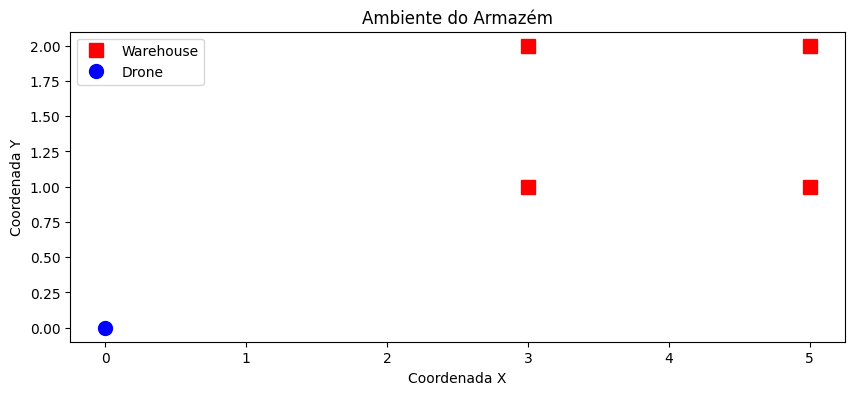

In [5]:
# Criação da figura e do eixo do gráfico
fig, ax = plt.subplots(figsize=(10, 6))  
# 'fig' representa a figura do Matplotlib, que contém o gráfico
# 'ax' é o eixo do gráfico onde os elementos serão desenhados
# figsize=(10, 6) define o tamanho da figura em polegadas (largura x altura)

# Plotagem dos pontos representando as coordenadas do armazém
ax.plot(
    [x for x, y in warehouse],  # Extrai todas as coordenadas X da lista warehouse
    [y for x, y in warehouse],  # Extrai todas as coordenadas Y da lista warehouse
    'rs',  # Define o marcador como um quadrado vermelho ('r' = red, 's' = square)
    markersize=10,  # Define o tamanho dos marcadores no gráfico
    label='Warehouse'  # Define o rótulo para a legenda do gráfico
)

# Plotagem da posição inicial do drone
ax.plot(
    drone[0],  # Coordenada X do drone
    drone[1],  # Coordenada Y do drone
    'bo',  # Define o marcador como um círculo azul ('b' = blue, 'o' = circle)
    markersize=10,  # Define o tamanho do marcador do drone
    label='Drone'  # Define o rótulo para a legenda do gráfico
)

# Adiciona um título ao gráfico
ax.set_title('Ambiente do Armazém')

# Define os rótulos dos eixos do gráfico
ax.set_xlabel('Coordenada X')  # Nome do eixo X
ax.set_ylabel('Coordenada Y')  # Nome do eixo Y

# Configura os eixos para ter a mesma escala, garantindo que as distâncias sejam proporcionais
ax.set_aspect('equal')

# Exibe a legenda no gráfico, utilizando os rótulos definidos nos plots
ax.legend()

# Exibe o gráfico na tela
plt.show()

# Otimização da Trajetória do Drone no Armazém com o Solver Z3

unsat timesteps: 1
unsat timesteps: 2
unsat timesteps: 3
unsat timesteps: 4
unsat timesteps: 5
unsat timesteps: 6
unsat timesteps: 7
unsat timesteps: 8
unsat timesteps: 9
unsat timesteps: 10
unsat timesteps: 11
sat timesteps: 12
Solução encontrada com 12 timesteps mínimos:

Trajetória do Drone:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 0), Bateria 94
Passo 3: Posição (3, 1), Bateria 91
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 3), Bateria 82
Passo 8: Posição (3, 2), Bateria 79
Passo 9: Posição (2, 2), Bateria 77
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


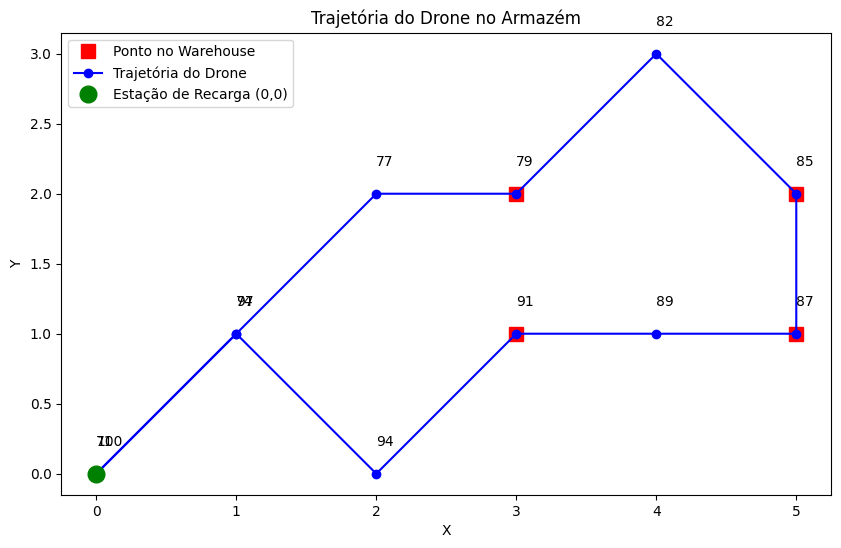

In [6]:
# Define a função que tenta encontrar uma solução com o mínimo de timesteps utilizando o solver Z3
def solve_with_min_timesteps(max_timesteps, bmax, gridx, gridy, warehouse):
    # Itera sobre possíveis números de timesteps, começando de 1 até o máximo permitido
    for timesteps in range(1, max_timesteps + 1):
        s = Solver()  # Cria uma nova instância do solver Z3 para o número atual de timesteps

        # Cria uma lista de variáveis inteiras representando a coordenada X do drone em cada timestep
        PGx = [Int(f'pgx_{k}') for k in range(timesteps)]
        # Cria uma lista de variáveis inteiras representando a coordenada Y do drone em cada timestep
        PGy = [Int(f'pgy_{k}') for k in range(timesteps)]
        # Cria uma lista de variáveis inteiras representando o nível de bateria do drone em cada timestep
        Bat = [Int(f'bat_{k}') for k in range(timesteps)]

        # Para cada variável de bateria, adiciona uma restrição para que o valor esteja entre 1 e bmax
        for b in Bat:
            s.add(And(b >= 1, b <= bmax))
        # Para cada variável de coordenada X, adiciona restrição para que esteja entre 0 e gridx (limites do grid)
        for x in PGx:
            s.add(And(x >= 0, x <= gridx))
        # Para cada variável de coordenada Y, adiciona restrição para que esteja entre 0 e gridy (limites do grid)
        for y in PGy:
            s.add(And(y >= 0, y <= gridy))

        # Define a condição inicial: o drone começa na posição (0,0) com bateria cheia (bmax)
        s.add(PGx[0] == 0)  # Posição X inicial é 0
        s.add(PGy[0] == 0)  # Posição Y inicial é 0
        s.add(Bat[0] == bmax)  # Bateria inicial é a máxima permitida (bmax)

        # Para cada timestep a partir do segundo (índice 1) adiciona restrições de movimento e consumo de bateria
        for k in range(1, timesteps):
            # O drone pode mover-se na coordenada X: aumenta, diminui ou permanece igual à posição anterior
            s.add(Or(PGx[k] == PGx[k-1] + 1, PGx[k] == PGx[k-1] - 1, PGx[k] == PGx[k-1]))
            # O drone pode mover-se na coordenada Y: aumenta, diminui ou permanece igual à posição anterior
            s.add(Or(PGy[k] == PGy[k-1] + 1, PGy[k] == PGy[k-1] - 1, PGy[k] == PGy[k-1]))
            # Impede que o drone fique parado, ou seja, que as coordenadas X e Y não se mantenham as mesmas
            s.add(Not(And(PGx[k] == PGx[k-1], PGy[k] == PGy[k-1])))

            # Define a regra de consumo de bateria dependendo do tipo de movimento realizado:
            # Se o movimento for diagonal (mudança em X e Y simultaneamente) consome 3 unidades;
            # se for movimento em linha reta (mudança apenas em X ou apenas em Y) consome 2 unidades;
            # se não houver movimento, a bateria permanece inalterada (embora essa situação seja evitada pela restrição acima).
            s.add(If(
                Or(
                    And(PGx[k] == PGx[k-1] + 1, PGy[k] == PGy[k-1] + 1),  # Movimento diagonal: para cima e para a direita
                    And(PGx[k] == PGx[k-1] - 1, PGy[k] == PGy[k-1] - 1),  # Movimento diagonal: para baixo e para a esquerda
                    And(PGx[k] == PGx[k-1] + 1, PGy[k] == PGy[k-1] - 1),  # Movimento diagonal: para baixo e para a direita
                    And(PGx[k] == PGx[k-1] - 1, PGy[k] == PGy[k-1] + 1)   # Movimento diagonal: para cima e para a esquerda
                ),
                Bat[k] == Bat[k-1] - 3,  # Consome 3 unidades de bateria em movimento diagonal
                If(
                    Or(
                        And(PGx[k] == PGx[k-1] + 1, PGy[k] == PGy[k-1]),  # Movimento para a direita
                        And(PGx[k] == PGx[k-1] - 1, PGy[k] == PGy[k-1]),  # Movimento para a esquerda
                        And(PGx[k] == PGx[k-1], PGy[k] == PGy[k-1] + 1),  # Movimento para cima
                        And(PGx[k] == PGx[k-1], PGy[k] == PGy[k-1] - 1)   # Movimento para baixo
                    ),
                    Bat[k] == Bat[k-1] - 2,  # Consome 2 unidades de bateria em movimento em linha reta
                    Bat[k] == Bat[k-1]       # Se não houve movimento (não deve ocorrer), a bateria não é consumida
                )
            ))

        # Para cada ponto (x,y) definido no armazém, adiciona restrição para que o drone passe por esse ponto em algum timestep
        for (x, y) in warehouse:
            s.add(Or([And(PGx[k] == x, PGy[k] == y) for k in range(timesteps)]))

        # Adiciona restrição para que, no último timestep, o drone retorne à posição inicial (0,0)
        s.add(PGx[timesteps - 1] == 0)  # No último passo, a posição X deve ser 0
        s.add(PGy[timesteps - 1] == 0)  # No último passo, a posição Y deve ser 0

        # Verifica se o conjunto de restrições é satisfatível (existe solução para o número atual de timesteps)
        if s.check() == sat:
            print(s.check(), "timesteps:", timesteps)  # Exibe no console o resultado da verificação e o número de timesteps
            m = s.model()  # Se satisfatível, obtém o modelo (solução) do solver
            print("Solução encontrada com", timesteps, "timesteps mínimos:")  # Informa o usuário que uma solução foi encontrada
            return m, timesteps, PGx, PGy, Bat  # Retorna o modelo, o número de timesteps e as listas de variáveis
        else:
            print(s.check(), "timesteps:", timesteps) # Exibe no console o resultado da verificação e o número de timesteps

    # Se nenhuma solução foi encontrada para qualquer número de timesteps até o máximo permitido:
    print("Nenhuma solução encontrada até", max_timesteps, "timesteps.")
    return None, None, None, None, None  # Retorna valores nulos indicando falha em encontrar solução

# Define os parâmetros do problema:
max_timesteps = 100  # Número máximo de timesteps que serão testados
bmax = 100  # Capacidade máxima da bateria
gridx = 9  # Tamanho do grid no eixo X (posição máxima)
gridy = 10  # Tamanho do grid no eixo Y (posição máxima)

# Chama a função para resolver o problema e obtém o modelo e as variáveis associadas
model, timesteps, PGx, PGy, Bat = solve_with_min_timesteps(max_timesteps, bmax, gridx, gridy, warehouse)

# Se uma solução foi encontrada (model não é None), prossegue para extrair e exibir os resultados
if model:
    # Avalia e extrai os valores da coordenada X para cada timestep a partir do modelo
    pgx_values = [model.evaluate(PGx[k]).as_long() for k in range(timesteps)]
    # Avalia e extrai os valores da coordenada Y para cada timestep a partir do modelo
    pgy_values = [model.evaluate(PGy[k]).as_long() for k in range(timesteps)]
    # Avalia e extrai os valores da bateria para cada timestep a partir do modelo
    bat_values = [model.evaluate(Bat[k]).as_long() for k in range(timesteps)]

    # Imprime no console a trajetória do drone passo a passo
    print("\nTrajetória do Drone:")
    for t in range(timesteps):
        # Exibe o passo, a posição (x, y) e o nível da bateria para aquele timestep
        print(f"Passo {t}: Posição ({pgx_values[t]}, {pgy_values[t]}), Bateria {bat_values[t]}")

    # Cria uma figura e um eixo para plotar a trajetória do drone usando o Matplotlib
    fig, ax = plt.subplots(figsize=(10, 6))

    # Itera sobre cada ponto do armazém para plotá-los no gráfico
    for i, (x, y) in enumerate(warehouse):
        # Se for o primeiro ponto, plota com um rótulo para a legenda
        if i == 0:
            ax.plot(x, y, 'rs', markersize=10, label="Ponto no Warehouse")
        else:
            # Para os demais pontos, plota sem o rótulo
            ax.plot(x, y, 'rs', markersize=10)

    # Plota a trajetória do drone conectando os pontos obtidos (linha azul com marcadores circulares)
    ax.plot(pgx_values, pgy_values, 'b-o', label="Trajetória do Drone")
    # Plota o ponto de recarga (posição inicial 0,0) com um marcador verde maior
    ax.plot(0, 0, 'go', markersize=12, label="Estação de Recarga (0,0)")

    # Para cada passo da trajetória, adiciona um texto próximo ao ponto mostrando o nível de bateria
    for i in range(timesteps):
        # O texto é posicionado um pouco acima do ponto (y + 0.2) para melhor visualização
        ax.text(pgx_values[i], pgy_values[i] + 0.2, f'{bat_values[i]}', fontsize=10)

    # Define o rótulo do eixo X
    plt.xlabel("X")
    # Define o rótulo do eixo Y
    plt.ylabel("Y")
    # Define o título do gráfico
    plt.title("Trajetória do Drone no Armazém")
    # Exibe a legenda que identifica os elementos do gráfico
    plt.legend()
    # Configura os eixos para terem a mesma escala (proporção igual)
    ax.set_aspect('equal')
    # Exibe o gráfico na tela
    plt.show()

## Explorando Todos os Possíveis Caminhos do Time Step


Solução encontrada com 12 timesteps mínimos.

Número de trajetórias encontradas: 390

Trajetória 1:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 0), Bateria 77
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


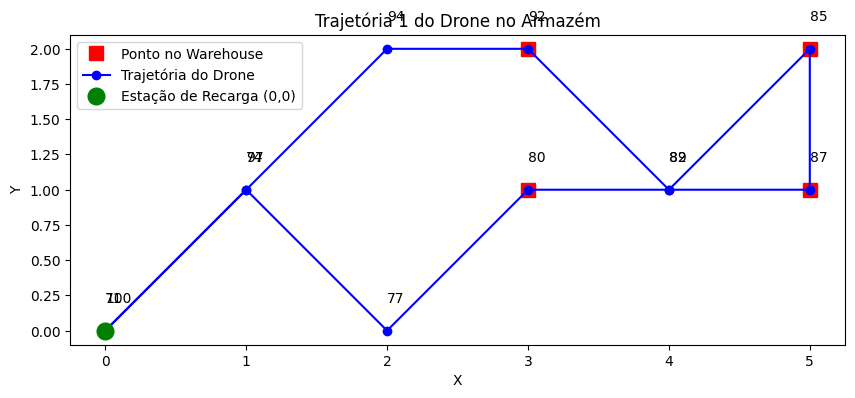


Trajetória 2:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 0), Bateria 81
Passo 8: Posição (3, 1), Bateria 78
Passo 9: Posição (2, 1), Bateria 76
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


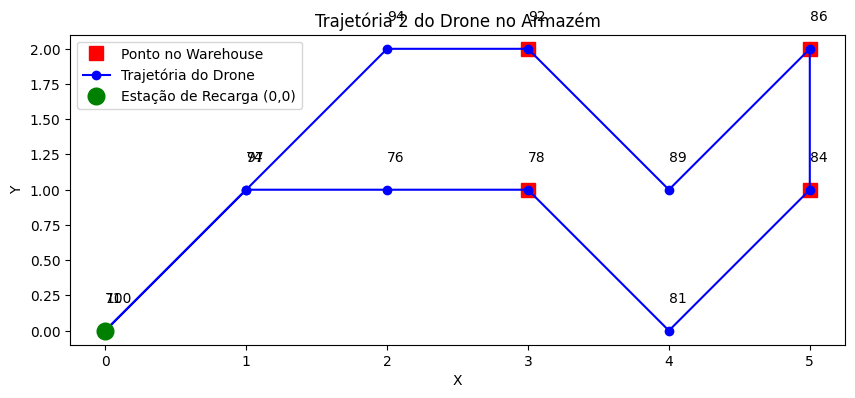


Trajetória 3:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 0), Bateria 81
Passo 8: Posição (3, 1), Bateria 78
Passo 9: Posição (2, 0), Bateria 75
Passo 10: Posição (1, 1), Bateria 72
Passo 11: Posição (0, 0), Bateria 69


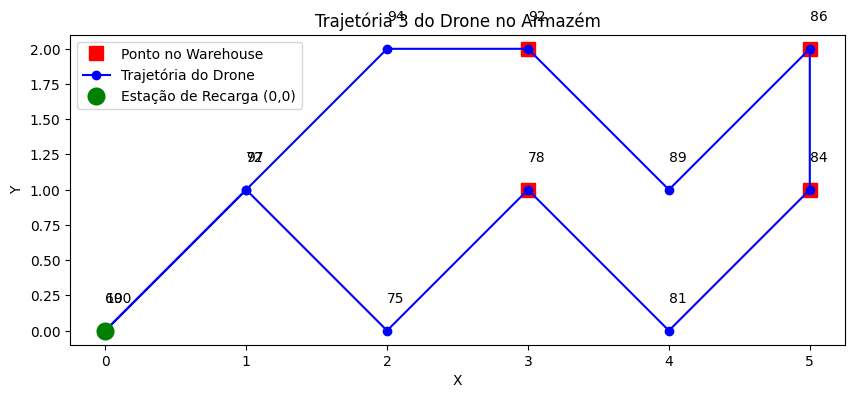


Trajetória 4:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 0), Bateria 77
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


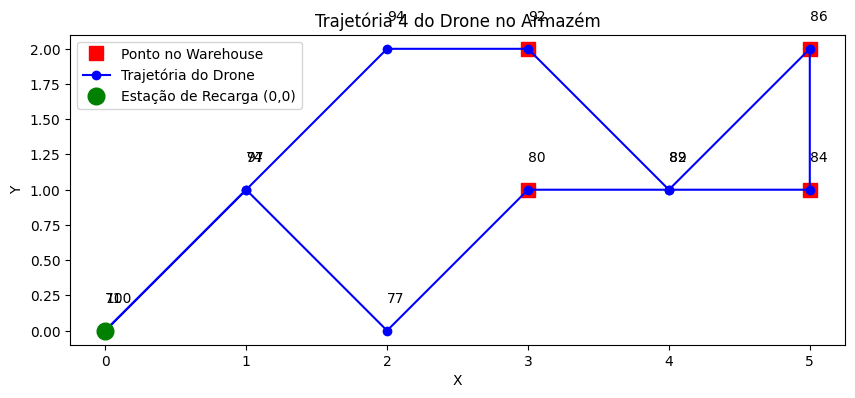


Trajetória 5:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 2), Bateria 77
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


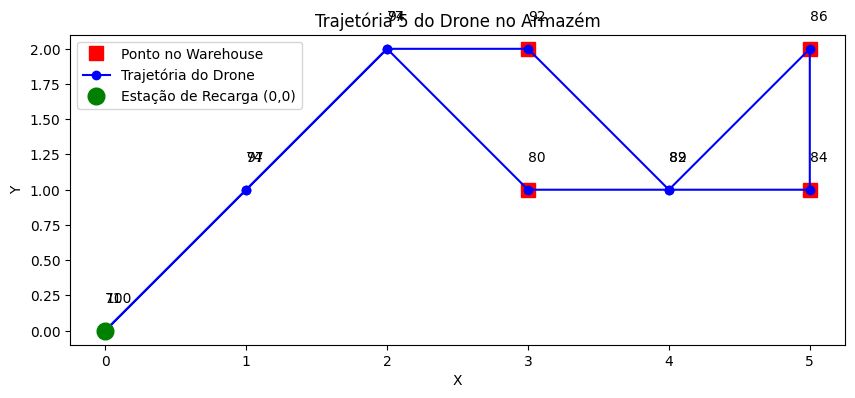


Trajetória 6:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 0), Bateria 77
Passo 10: Posição (1, 0), Bateria 75
Passo 11: Posição (0, 0), Bateria 73


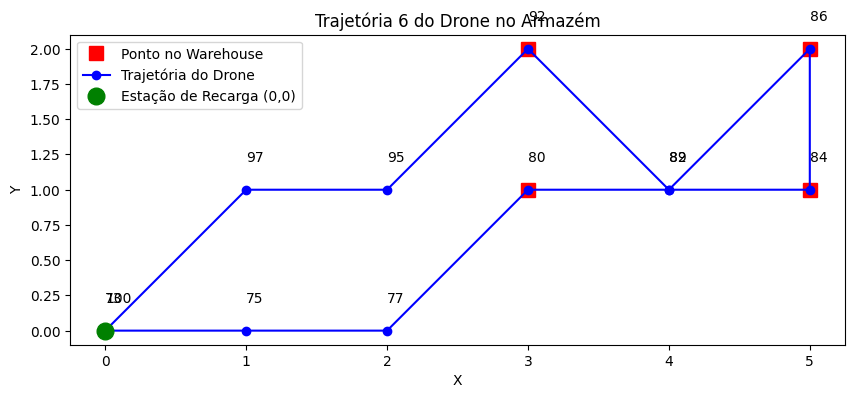


Trajetória 7:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 3), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 0), Bateria 77
Passo 10: Posição (1, 0), Bateria 75
Passo 11: Posição (0, 0), Bateria 73


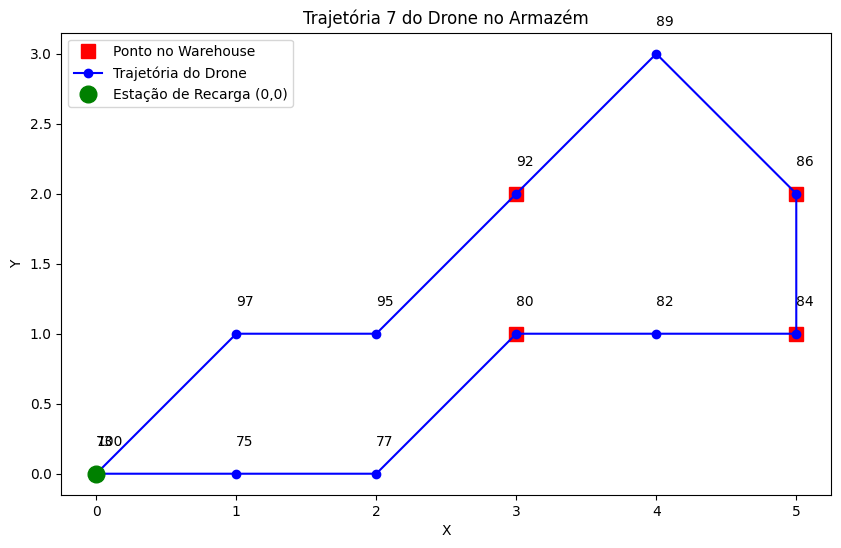


Trajetória 8:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 2), Bateria 77
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


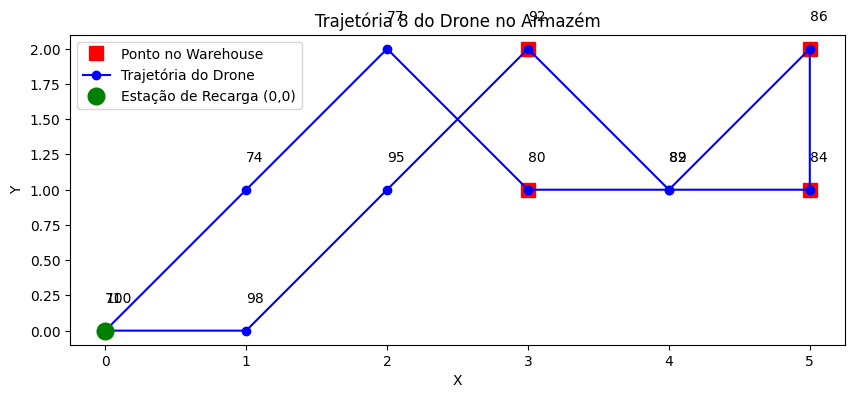


Trajetória 9:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 3), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 2), Bateria 77
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


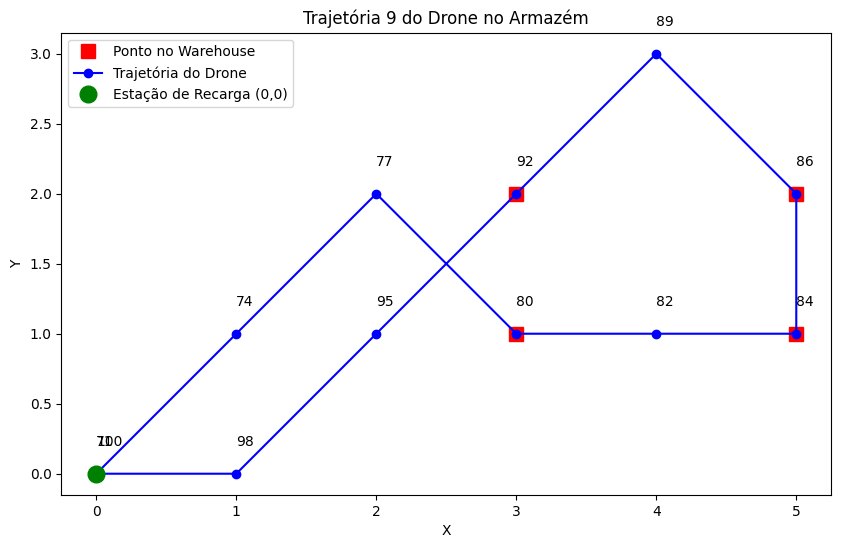


Trajetória 10:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 3), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 0), Bateria 77
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


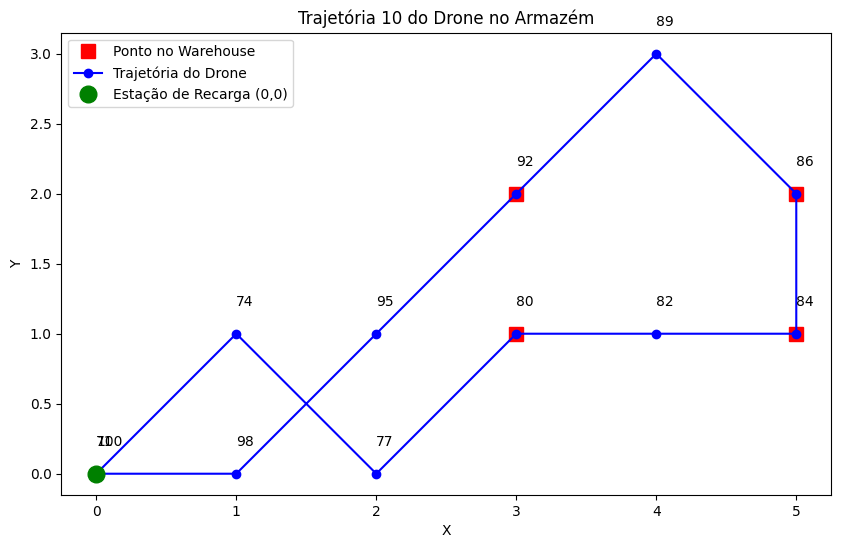


Trajetória 11:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 0), Bateria 77
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


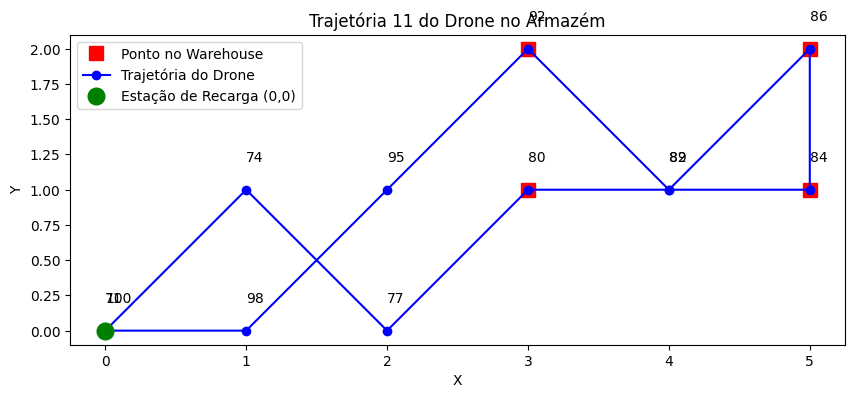


Trajetória 12:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 2), Bateria 77
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


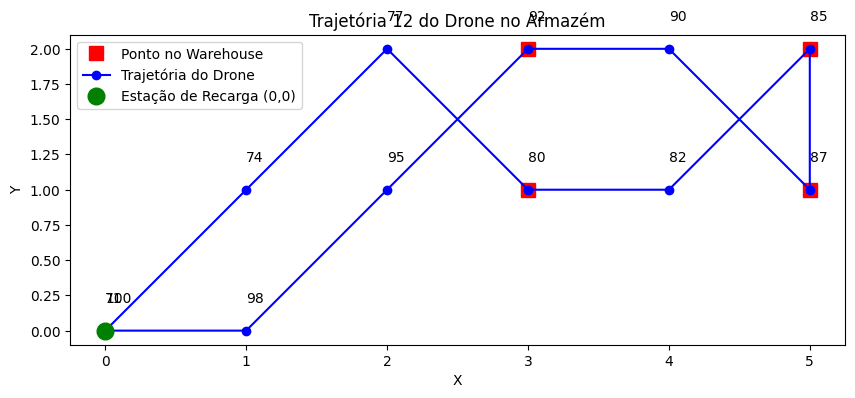


Trajetória 13:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 0), Bateria 77
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


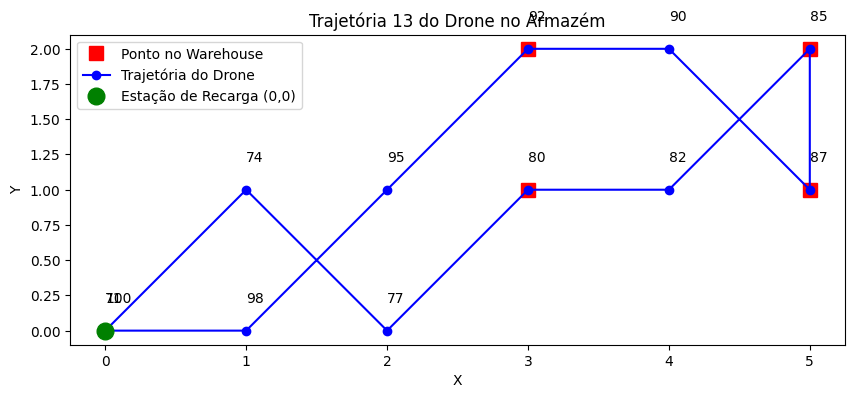


Trajetória 14:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 3), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 1), Bateria 76
Passo 11: Posição (0, 0), Bateria 73


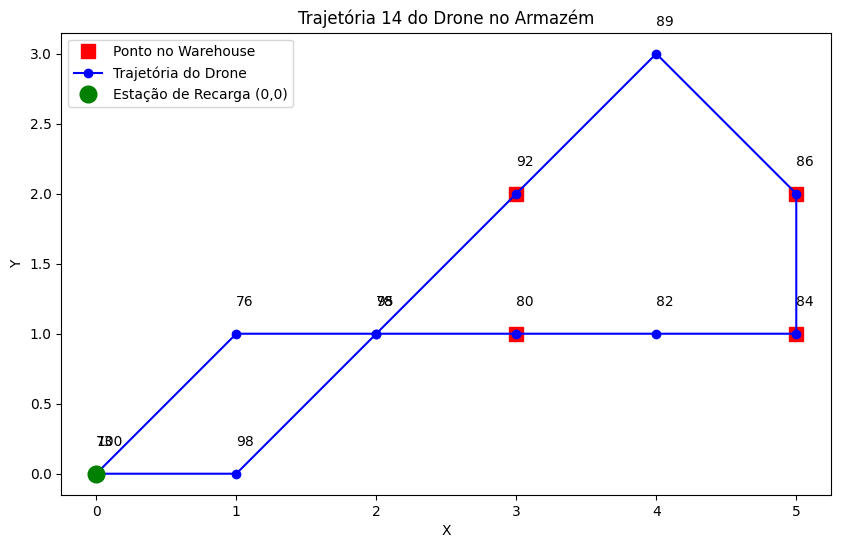


Trajetória 15:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 1), Bateria 76
Passo 11: Posição (0, 0), Bateria 73


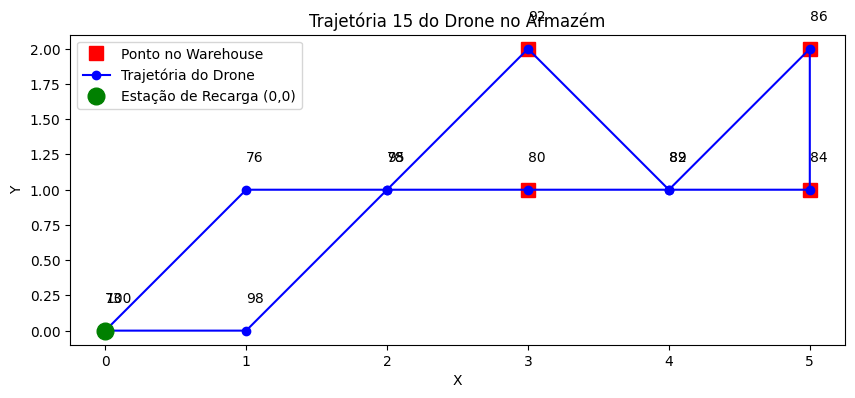


Trajetória 16:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 3), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 0), Bateria 77
Passo 10: Posição (1, 0), Bateria 75
Passo 11: Posição (0, 0), Bateria 73


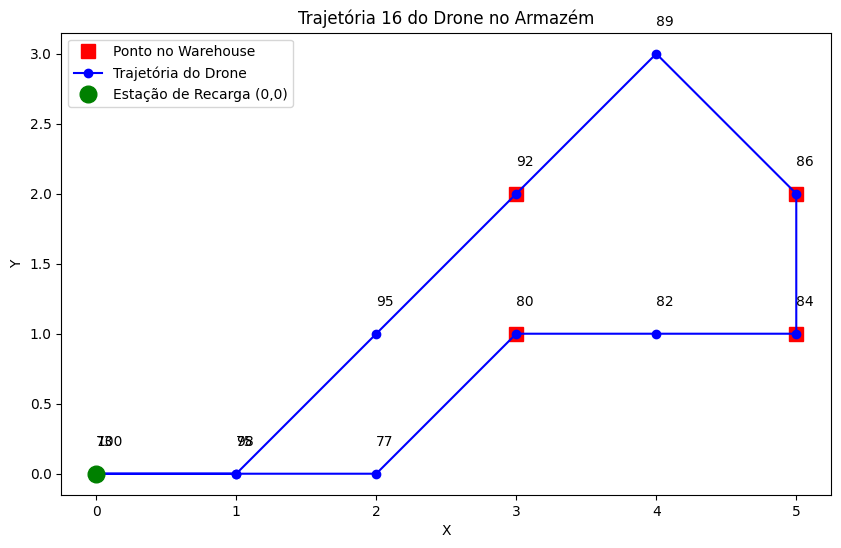


Trajetória 17:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 0), Bateria 77
Passo 10: Posição (1, 0), Bateria 75
Passo 11: Posição (0, 0), Bateria 73


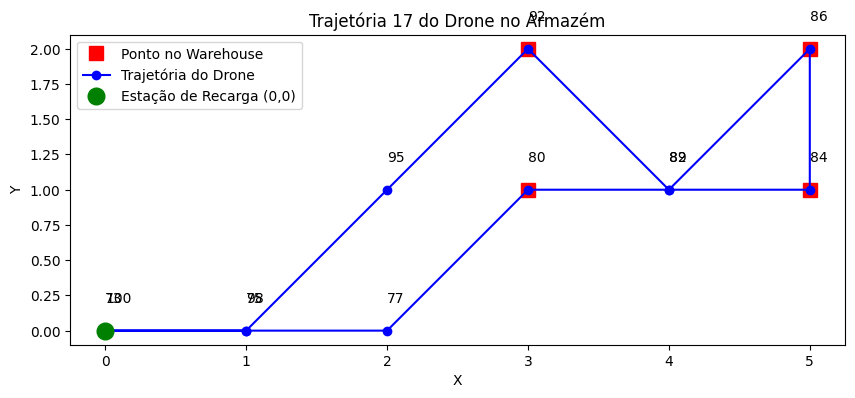


Trajetória 18:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 0), Bateria 77
Passo 10: Posição (1, 0), Bateria 75
Passo 11: Posição (0, 0), Bateria 73


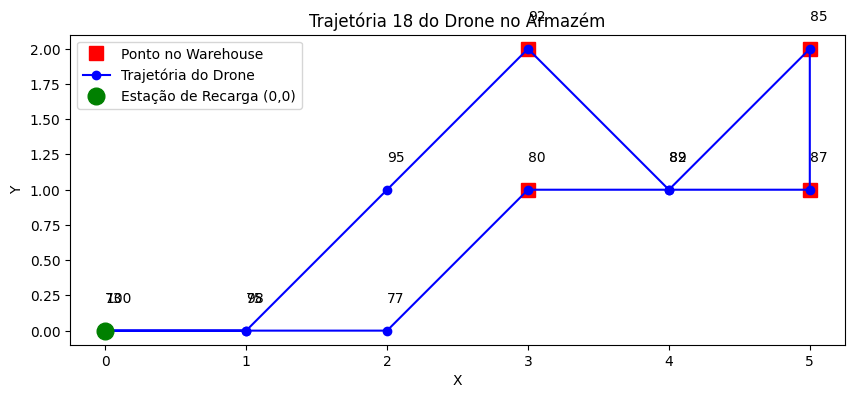


Trajetória 19:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 2), Bateria 77
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


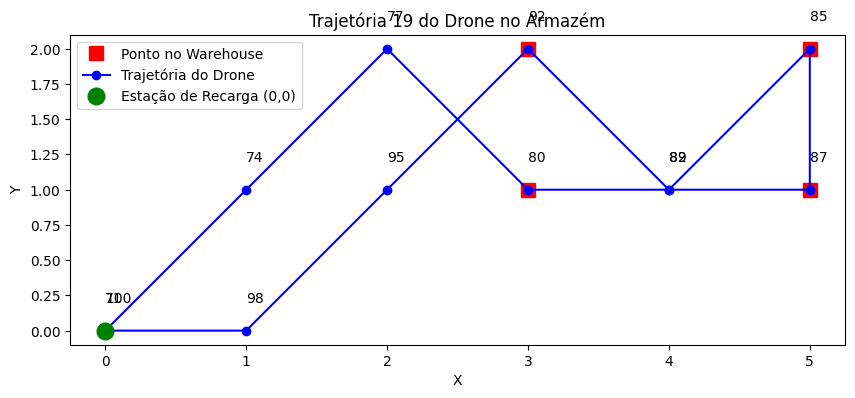


Trajetória 20:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 0), Bateria 77
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


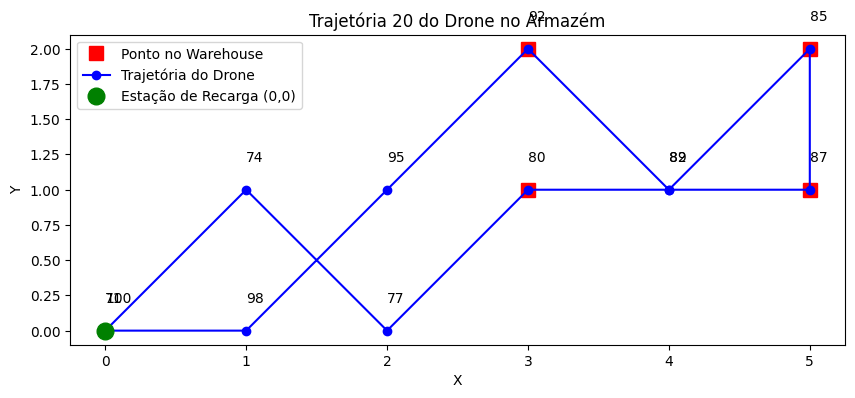


Trajetória 21:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 0), Bateria 75
Passo 11: Posição (0, 0), Bateria 73


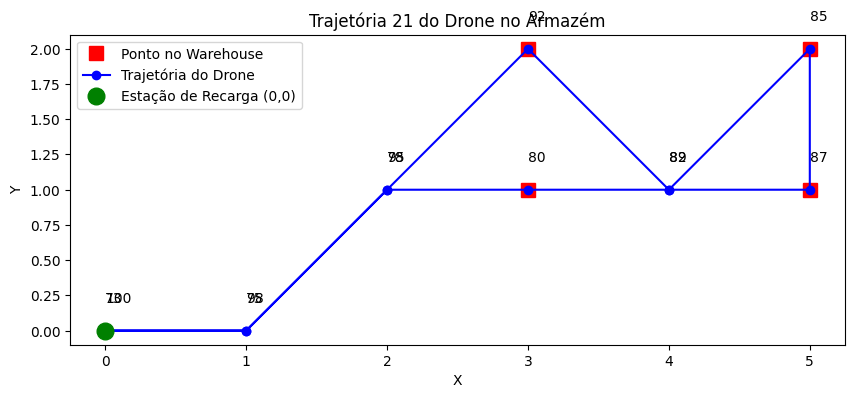


Trajetória 22:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 1), Bateria 76
Passo 11: Posição (0, 0), Bateria 73


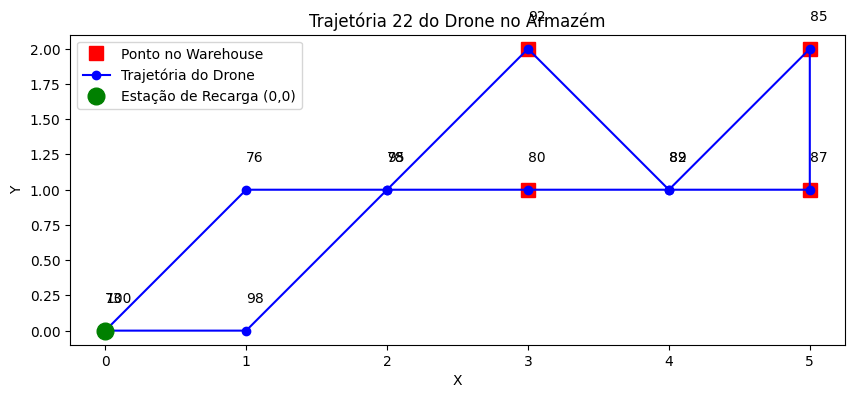


Trajetória 23:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 2), Bateria 88
Passo 6: Posição (5, 1), Bateria 86
Passo 7: Posição (4, 1), Bateria 84
Passo 8: Posição (3, 1), Bateria 82
Passo 9: Posição (2, 0), Bateria 79
Passo 10: Posição (1, 0), Bateria 77
Passo 11: Posição (0, 0), Bateria 75


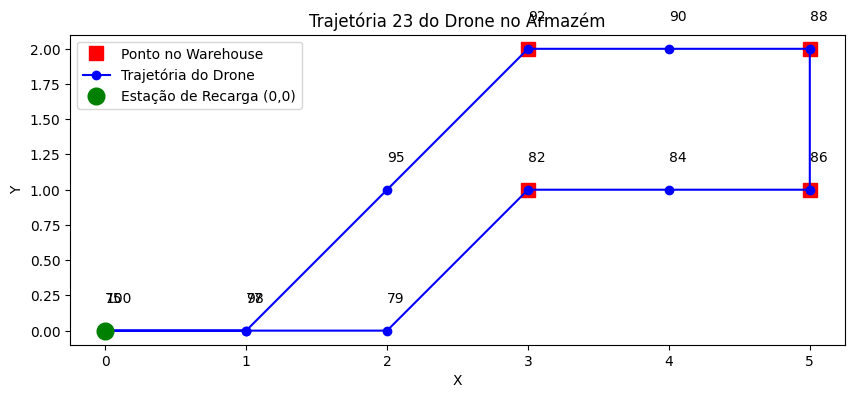


Trajetória 24:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 2), Bateria 88
Passo 6: Posição (5, 1), Bateria 86
Passo 7: Posição (4, 1), Bateria 84
Passo 8: Posição (3, 1), Bateria 82
Passo 9: Posição (2, 1), Bateria 80
Passo 10: Posição (1, 1), Bateria 78
Passo 11: Posição (0, 0), Bateria 75


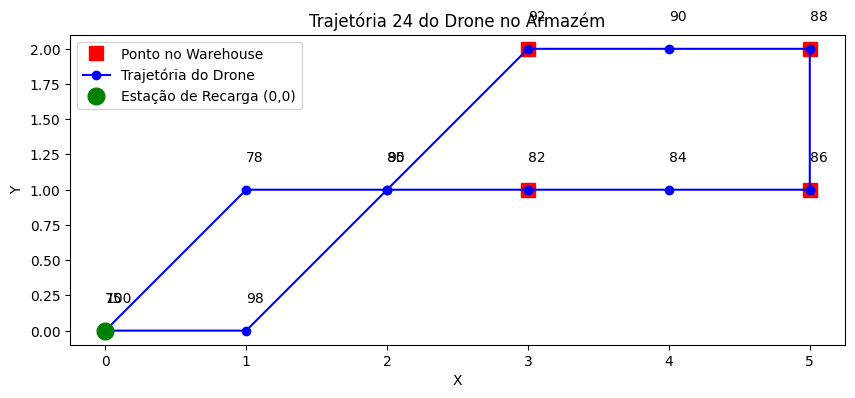


Trajetória 25:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 2), Bateria 88
Passo 6: Posição (5, 1), Bateria 86
Passo 7: Posição (4, 1), Bateria 84
Passo 8: Posição (3, 1), Bateria 82
Passo 9: Posição (2, 1), Bateria 80
Passo 10: Posição (1, 0), Bateria 77
Passo 11: Posição (0, 0), Bateria 75


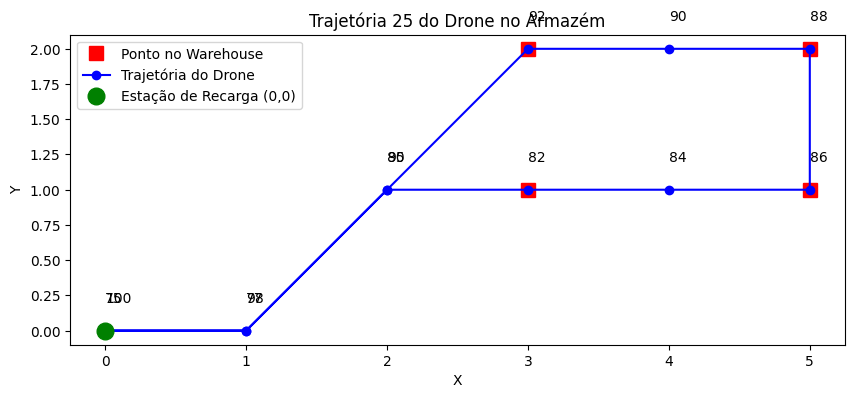


Trajetória 26:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 2), Bateria 88
Passo 6: Posição (5, 1), Bateria 86
Passo 7: Posição (4, 1), Bateria 84
Passo 8: Posição (3, 1), Bateria 82
Passo 9: Posição (2, 2), Bateria 79
Passo 10: Posição (1, 1), Bateria 76
Passo 11: Posição (0, 0), Bateria 73


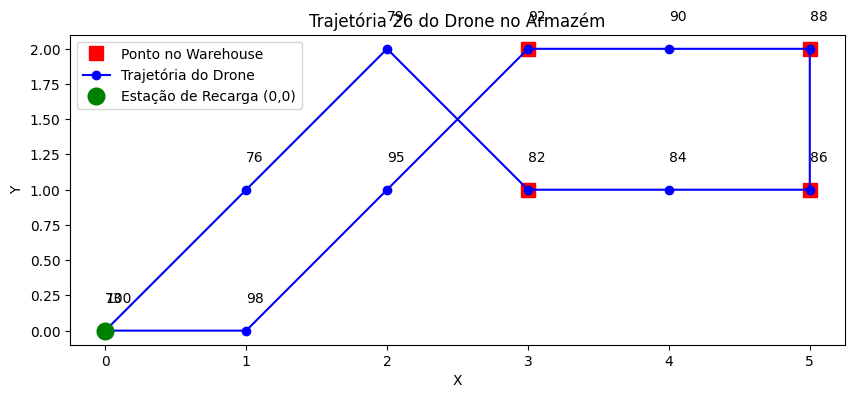


Trajetória 27:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 2), Bateria 88
Passo 6: Posição (5, 1), Bateria 86
Passo 7: Posição (4, 1), Bateria 84
Passo 8: Posição (3, 1), Bateria 82
Passo 9: Posição (2, 0), Bateria 79
Passo 10: Posição (1, 1), Bateria 76
Passo 11: Posição (0, 0), Bateria 73


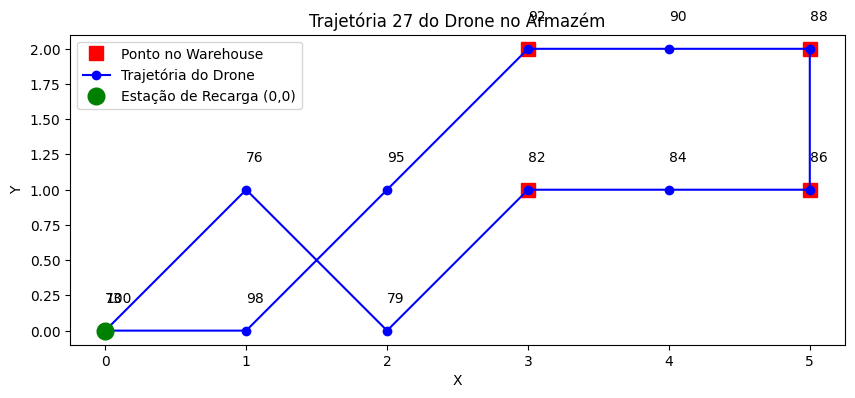


Trajetória 28:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 3), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 0), Bateria 75
Passo 11: Posição (0, 0), Bateria 73


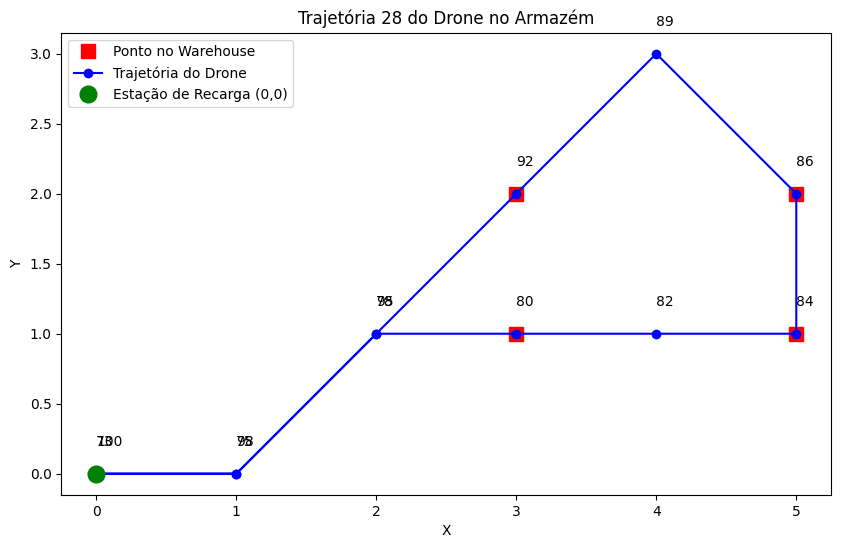


Trajetória 29:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 0), Bateria 75
Passo 11: Posição (0, 0), Bateria 73


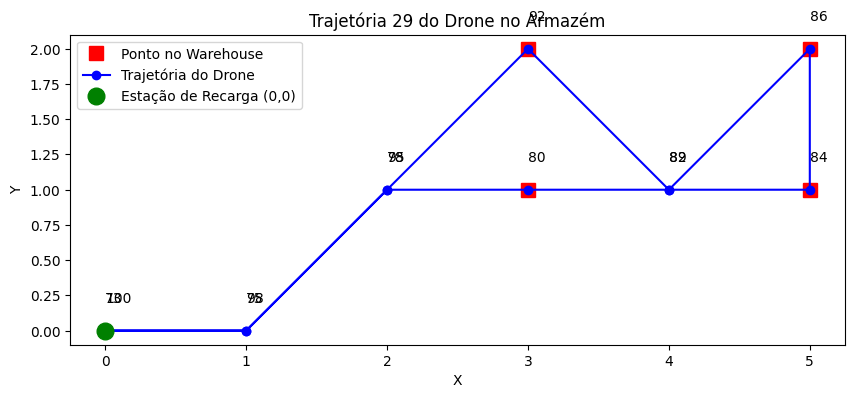


Trajetória 30:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 0), Bateria 77
Passo 10: Posição (1, 0), Bateria 75
Passo 11: Posição (0, 0), Bateria 73


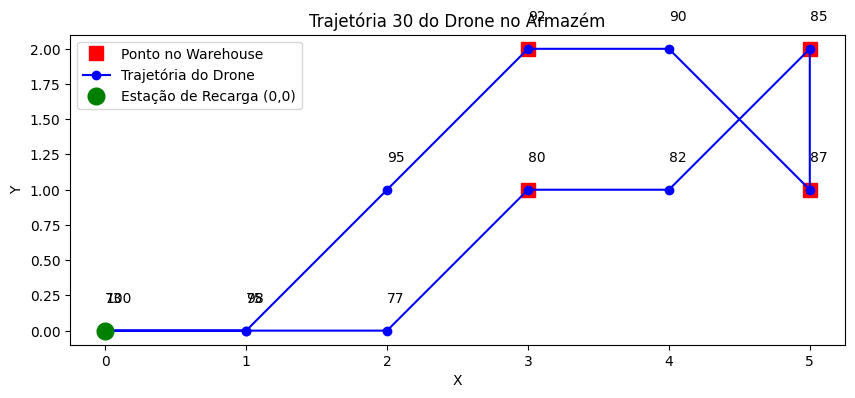


Trajetória 31:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 1), Bateria 76
Passo 11: Posição (0, 0), Bateria 73


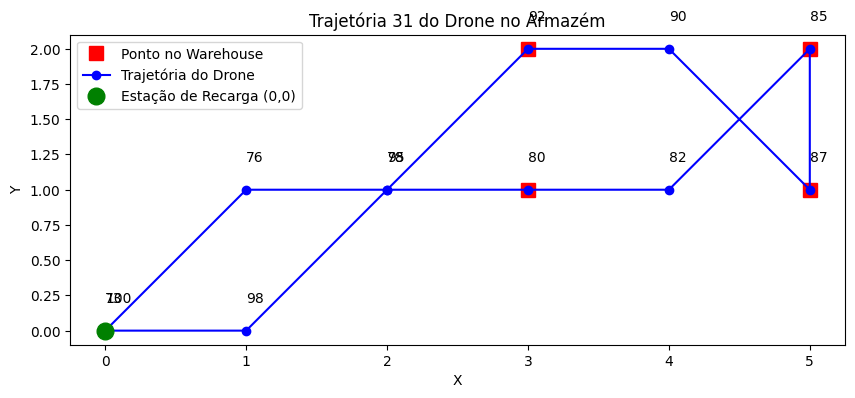


Trajetória 32:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 0), Bateria 75
Passo 11: Posição (0, 0), Bateria 73


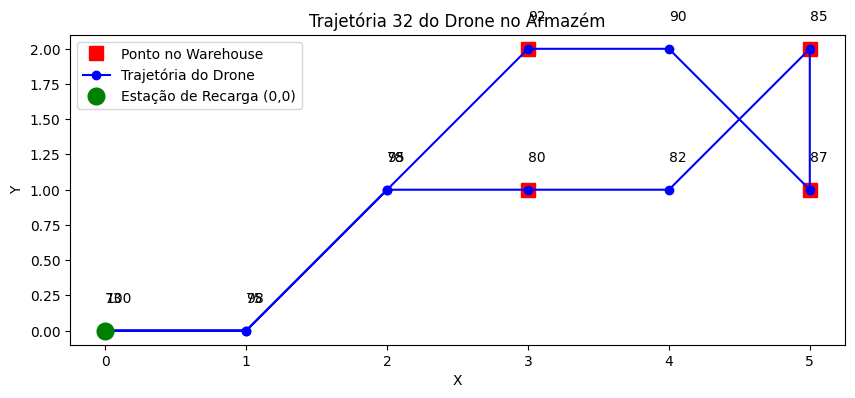


Trajetória 33:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 3), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 1), Bateria 76
Passo 11: Posição (0, 0), Bateria 73


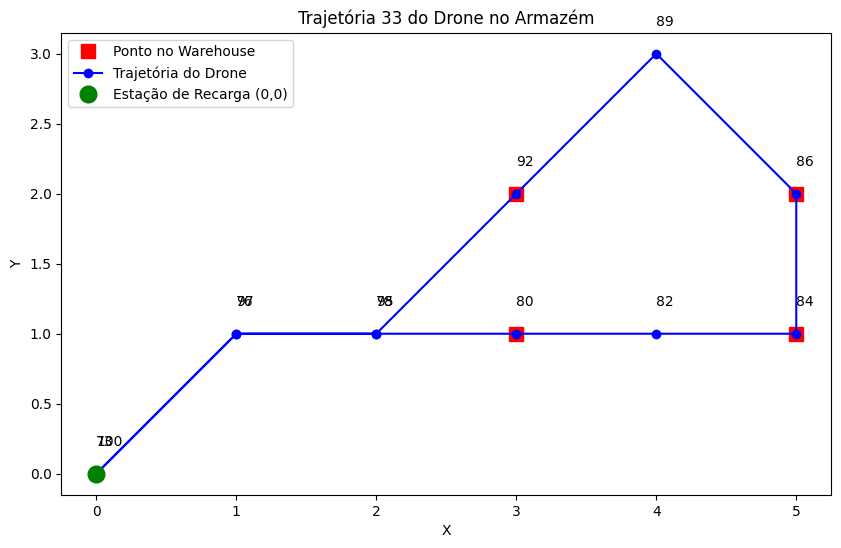


Trajetória 34:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 1), Bateria 76
Passo 11: Posição (0, 0), Bateria 73


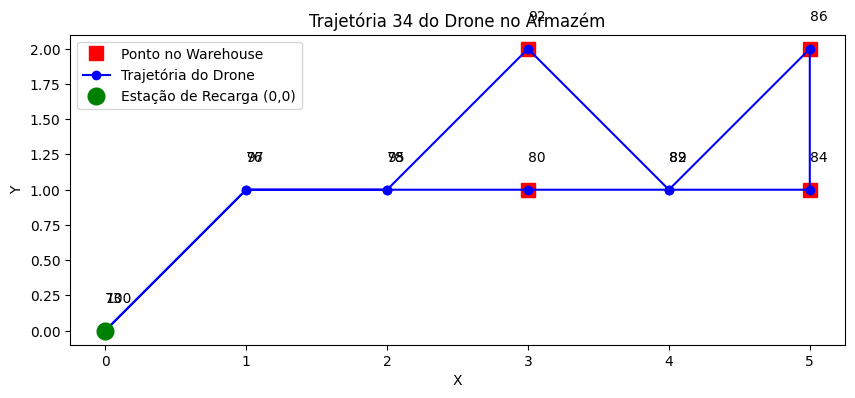


Trajetória 35:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 3), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 2), Bateria 77
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


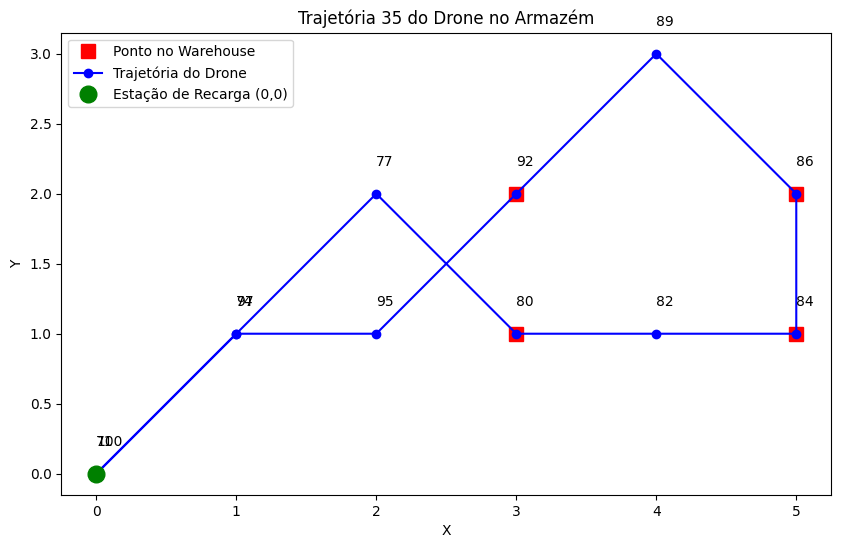


Trajetória 36:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 2), Bateria 77
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


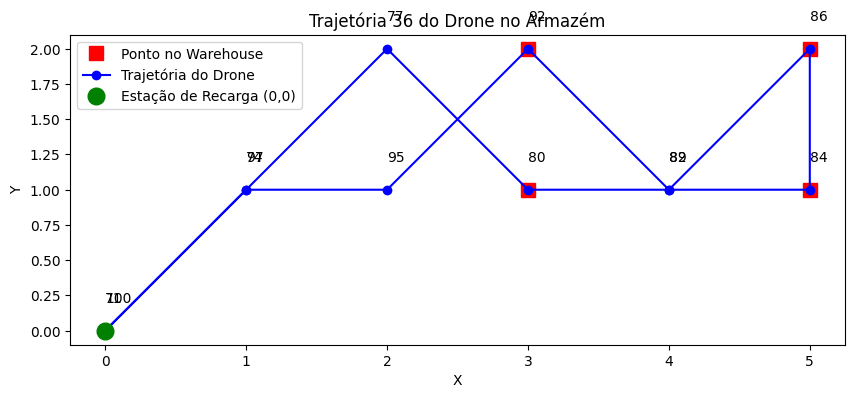


Trajetória 37:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 3), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 0), Bateria 77
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


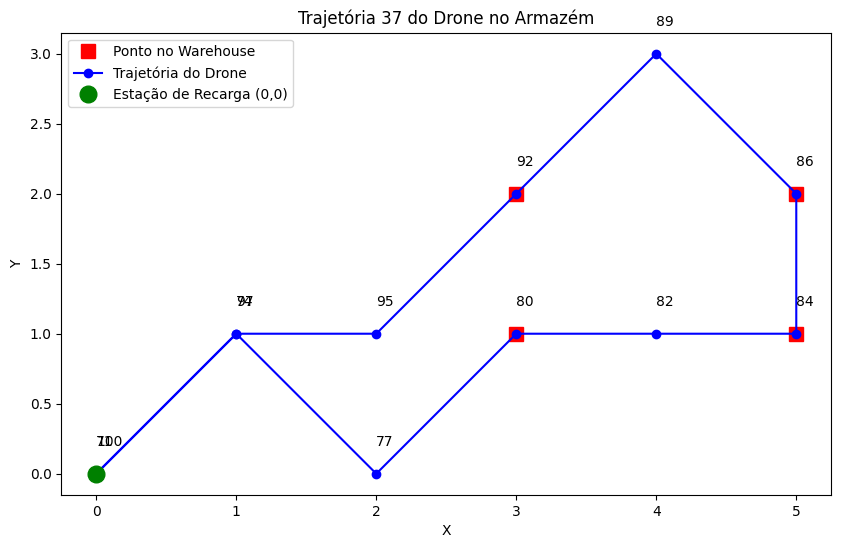


Trajetória 38:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 0), Bateria 77
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


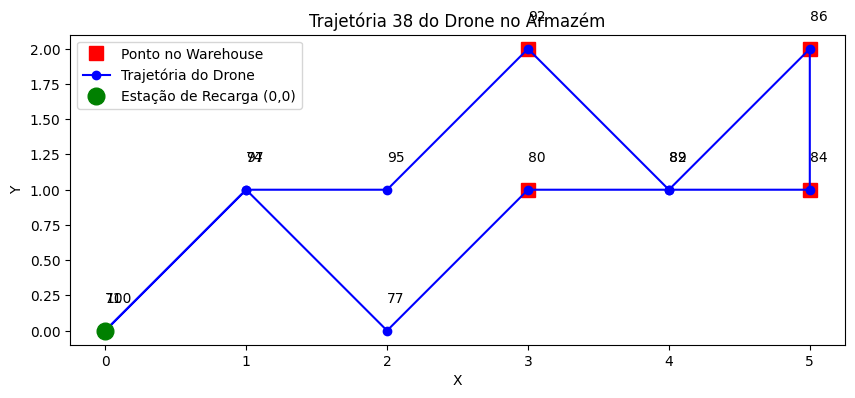


Trajetória 39:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 3), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 0), Bateria 75
Passo 11: Posição (0, 0), Bateria 73


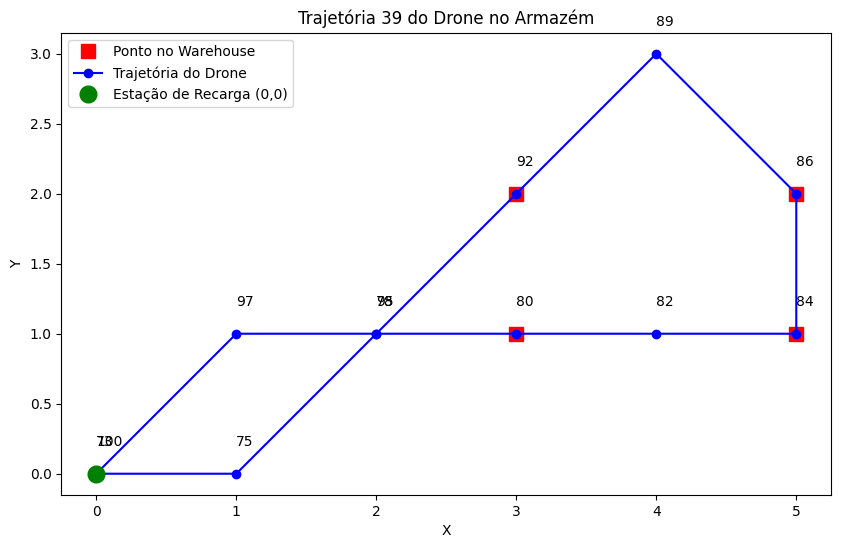


Trajetória 40:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 0), Bateria 75
Passo 11: Posição (0, 0), Bateria 73


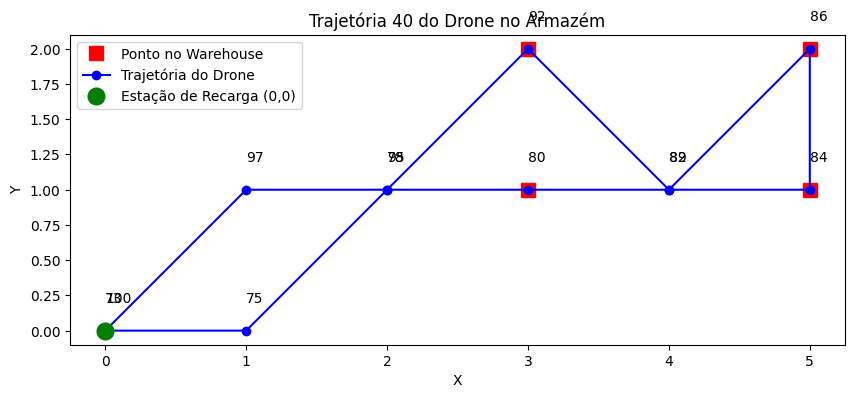


Trajetória 41:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 0), Bateria 77
Passo 10: Posição (1, 0), Bateria 75
Passo 11: Posição (0, 0), Bateria 73


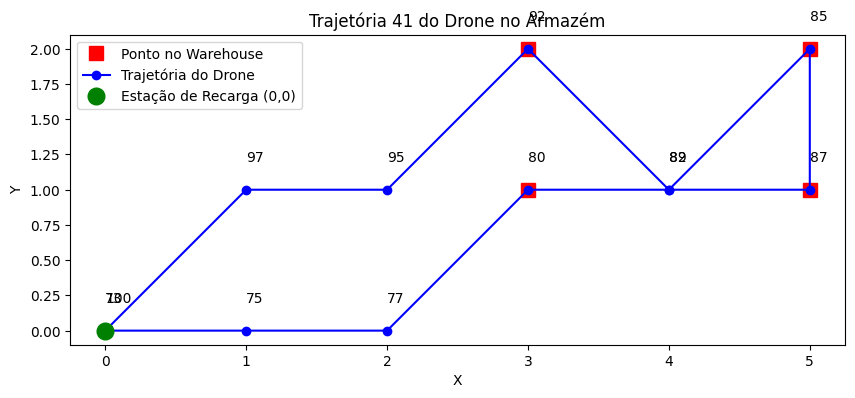


Trajetória 42:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 0), Bateria 75
Passo 11: Posição (0, 0), Bateria 73


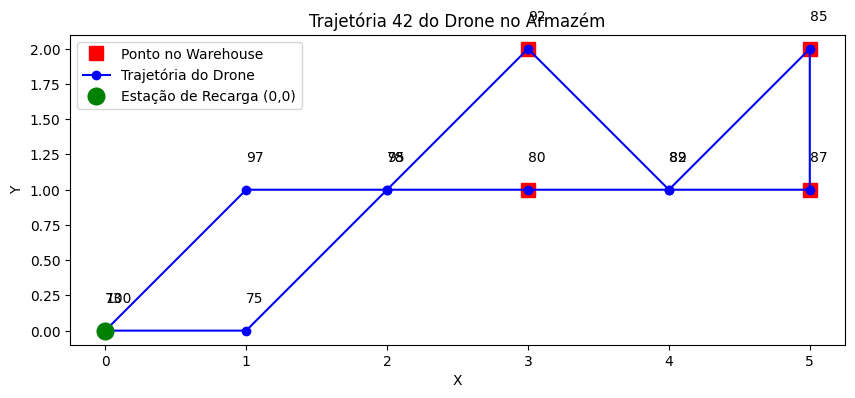


Trajetória 43:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 1), Bateria 76
Passo 11: Posição (0, 0), Bateria 73


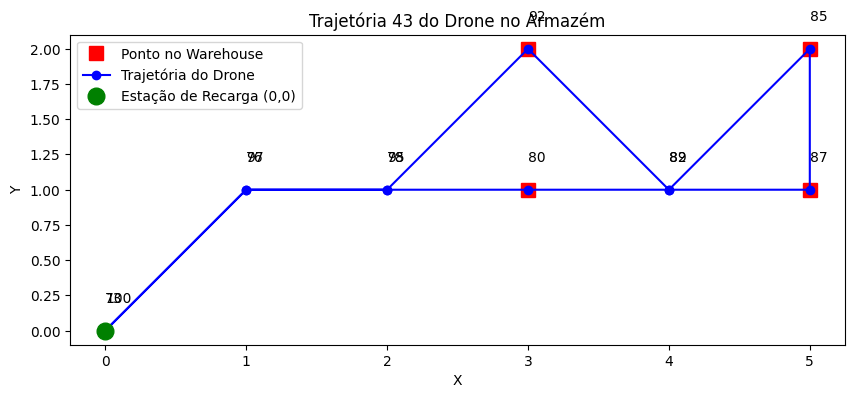


Trajetória 44:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 2), Bateria 77
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


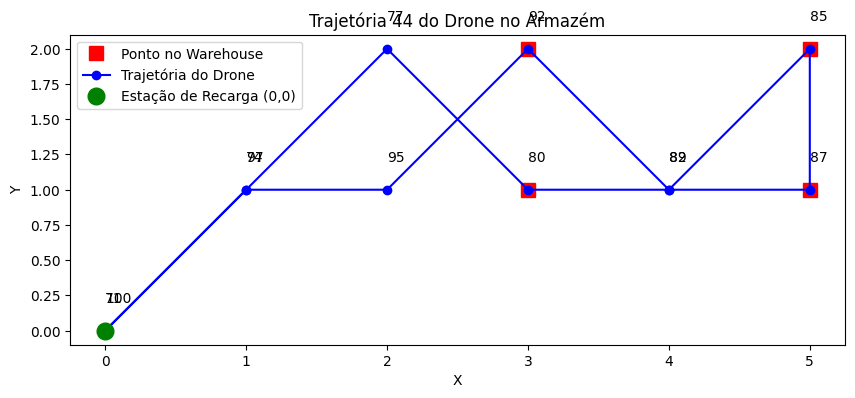


Trajetória 45:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 0), Bateria 77
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


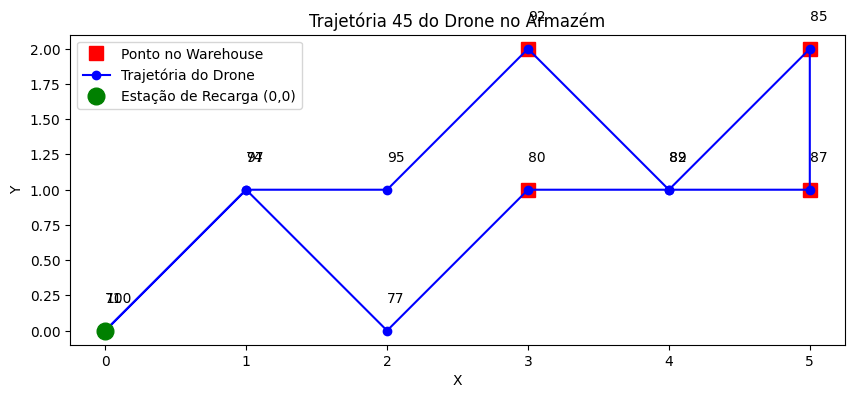


Trajetória 46:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 2), Bateria 88
Passo 6: Posição (5, 1), Bateria 86
Passo 7: Posição (4, 1), Bateria 84
Passo 8: Posição (3, 1), Bateria 82
Passo 9: Posição (2, 0), Bateria 79
Passo 10: Posição (1, 1), Bateria 76
Passo 11: Posição (0, 0), Bateria 73


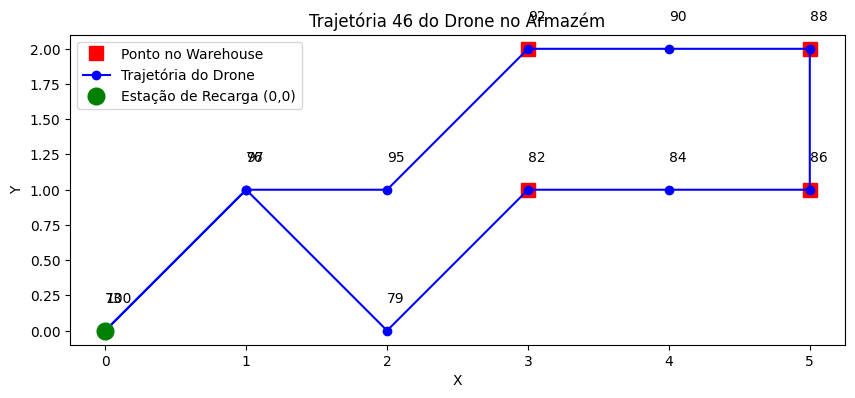


Trajetória 47:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 2), Bateria 88
Passo 6: Posição (5, 1), Bateria 86
Passo 7: Posição (4, 1), Bateria 84
Passo 8: Posição (3, 1), Bateria 82
Passo 9: Posição (2, 2), Bateria 79
Passo 10: Posição (1, 1), Bateria 76
Passo 11: Posição (0, 0), Bateria 73


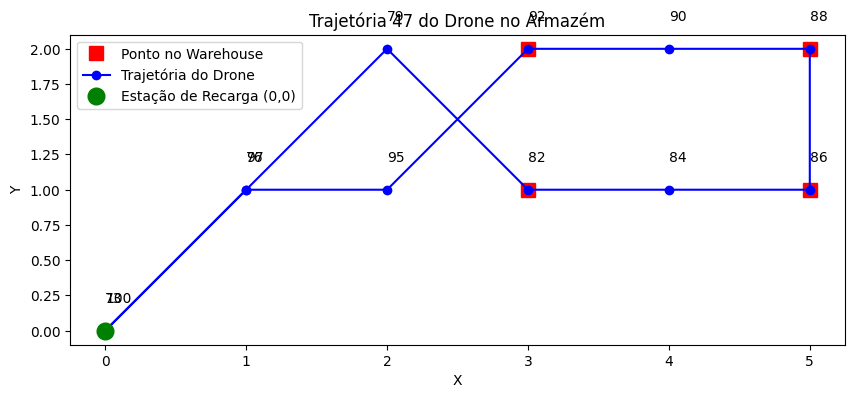


Trajetória 48:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 2), Bateria 88
Passo 6: Posição (5, 1), Bateria 86
Passo 7: Posição (4, 1), Bateria 84
Passo 8: Posição (3, 1), Bateria 82
Passo 9: Posição (2, 1), Bateria 80
Passo 10: Posição (1, 1), Bateria 78
Passo 11: Posição (0, 0), Bateria 75


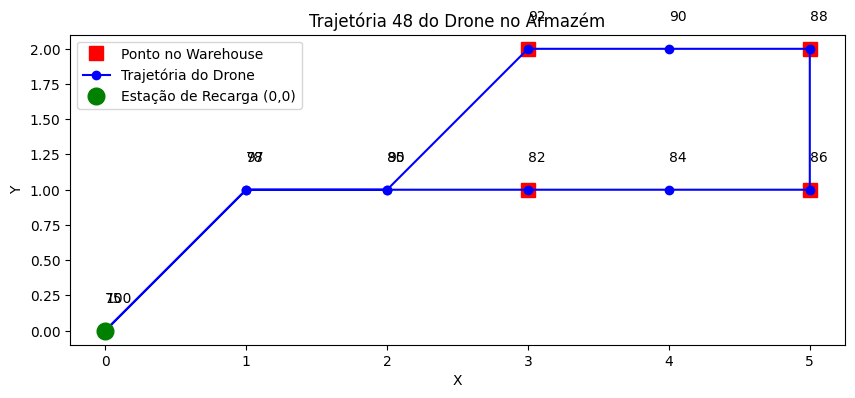


Trajetória 49:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 2), Bateria 88
Passo 6: Posição (5, 1), Bateria 86
Passo 7: Posição (4, 1), Bateria 84
Passo 8: Posição (3, 1), Bateria 82
Passo 9: Posição (2, 1), Bateria 80
Passo 10: Posição (1, 0), Bateria 77
Passo 11: Posição (0, 0), Bateria 75


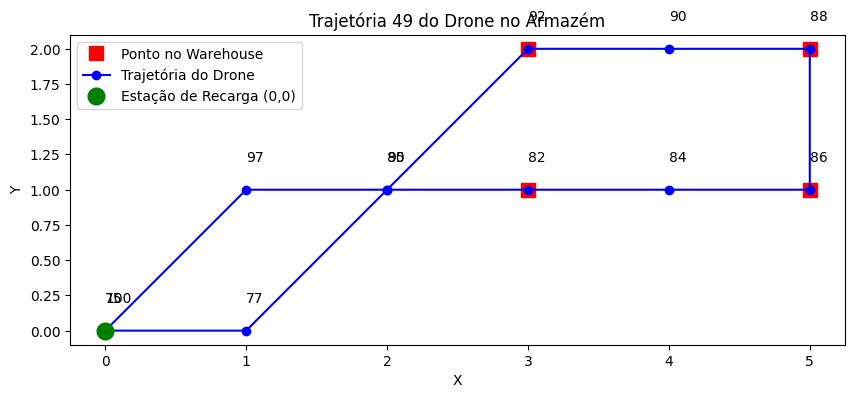


Trajetória 50:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 2), Bateria 88
Passo 6: Posição (5, 1), Bateria 86
Passo 7: Posição (4, 1), Bateria 84
Passo 8: Posição (3, 1), Bateria 82
Passo 9: Posição (2, 0), Bateria 79
Passo 10: Posição (1, 0), Bateria 77
Passo 11: Posição (0, 0), Bateria 75


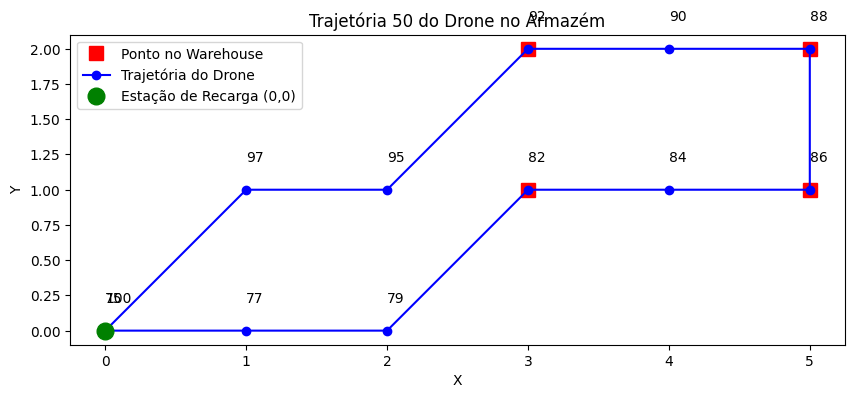


Trajetória 51:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 0), Bateria 77
Passo 10: Posição (1, 0), Bateria 75
Passo 11: Posição (0, 0), Bateria 73


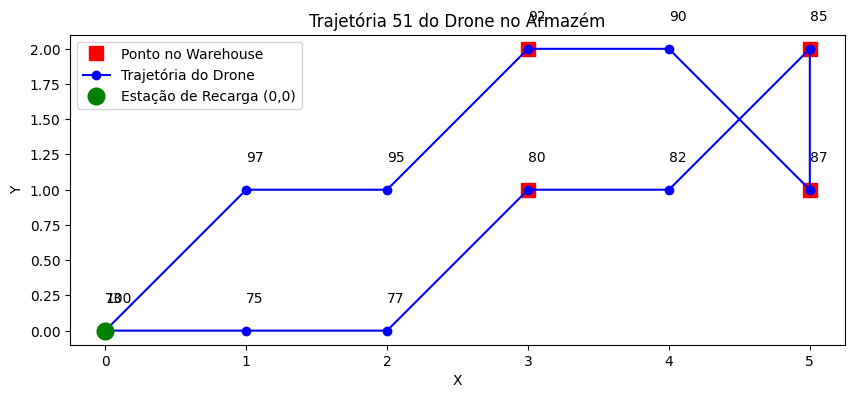


Trajetória 52:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 0), Bateria 75
Passo 11: Posição (0, 0), Bateria 73


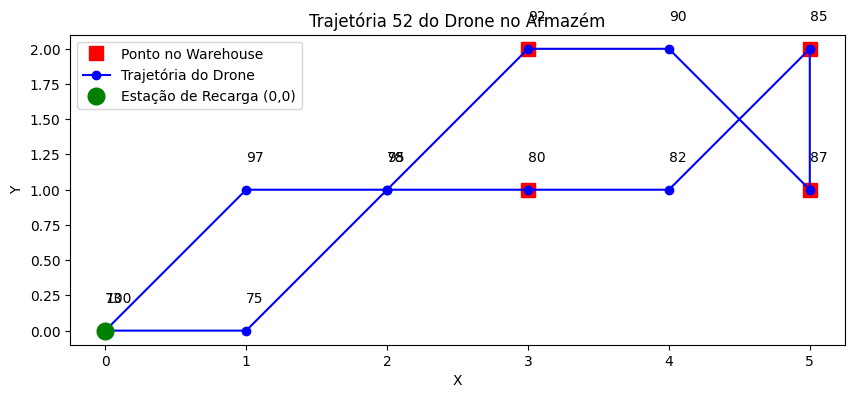


Trajetória 53:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 1), Bateria 76
Passo 11: Posição (0, 0), Bateria 73


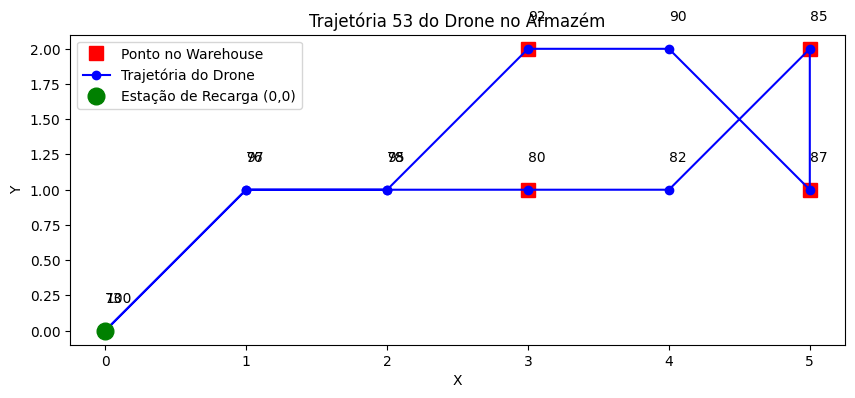


Trajetória 54:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 0), Bateria 77
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


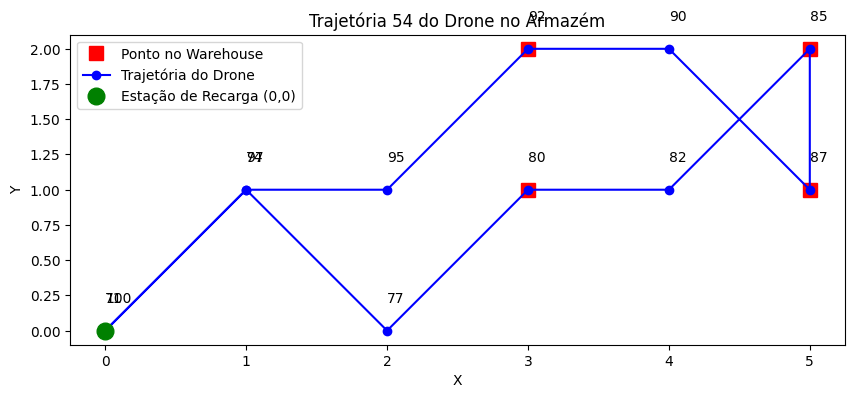


Trajetória 55:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 2), Bateria 77
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


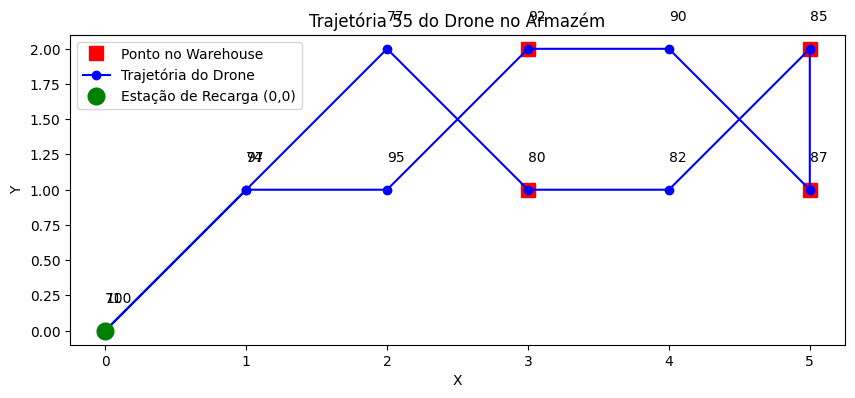


Trajetória 56:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 3), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 0), Bateria 77
Passo 10: Posição (1, 0), Bateria 75
Passo 11: Posição (0, 0), Bateria 73


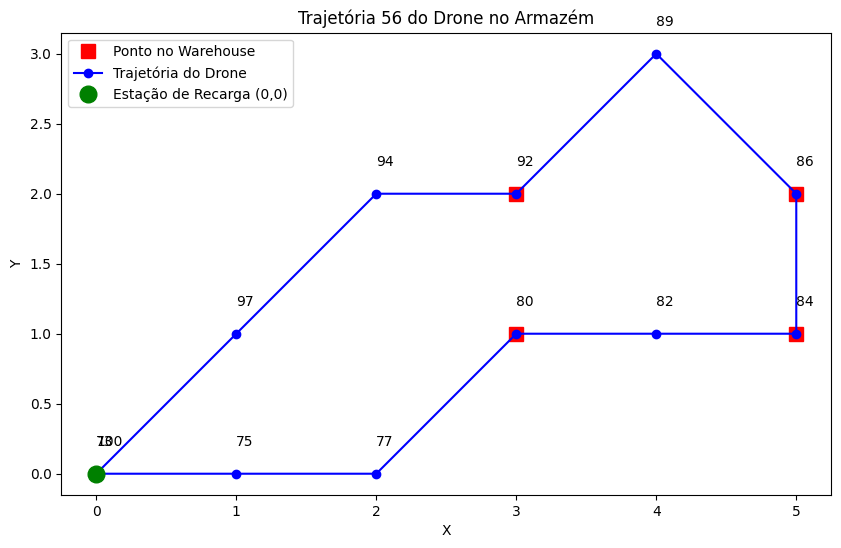


Trajetória 57:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 0), Bateria 77
Passo 10: Posição (1, 0), Bateria 75
Passo 11: Posição (0, 0), Bateria 73


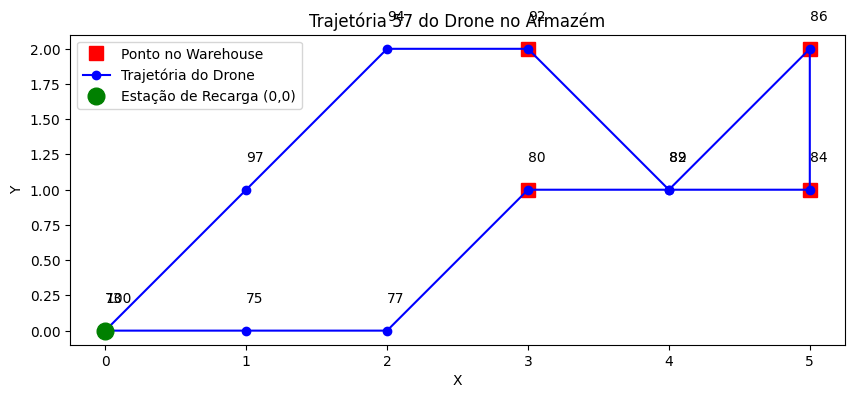


Trajetória 58:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 0), Bateria 77
Passo 10: Posição (1, 0), Bateria 75
Passo 11: Posição (0, 0), Bateria 73


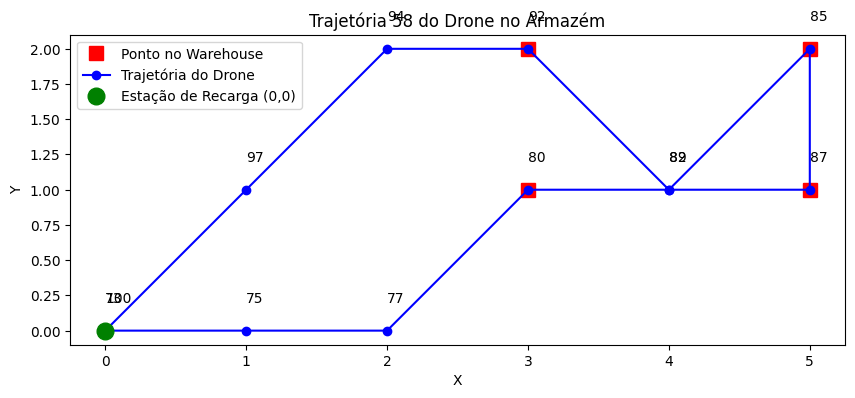


Trajetória 59:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 3), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 2), Bateria 77
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


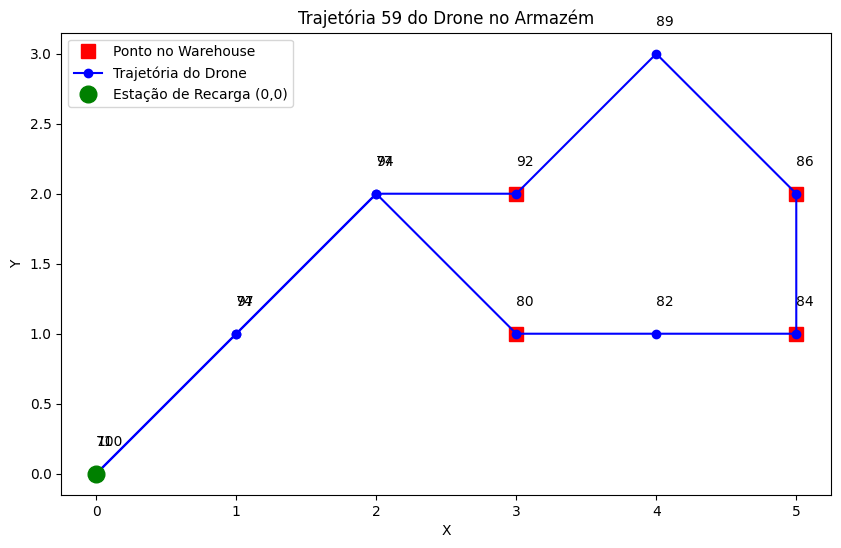


Trajetória 60:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 3), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 0), Bateria 77
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


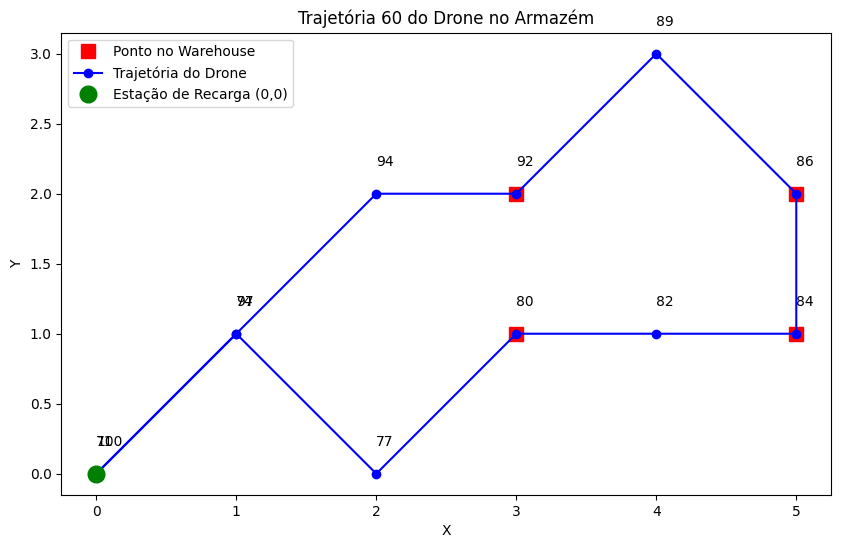


Trajetória 61:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 2), Bateria 77
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


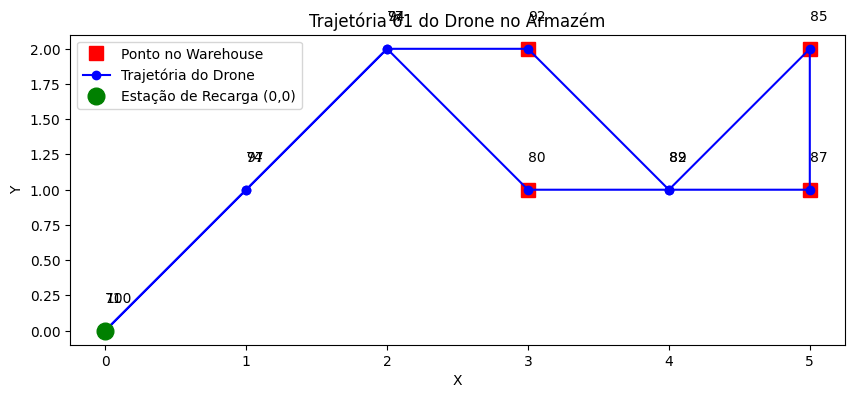


Trajetória 62:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 3), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 0), Bateria 75
Passo 11: Posição (0, 0), Bateria 73


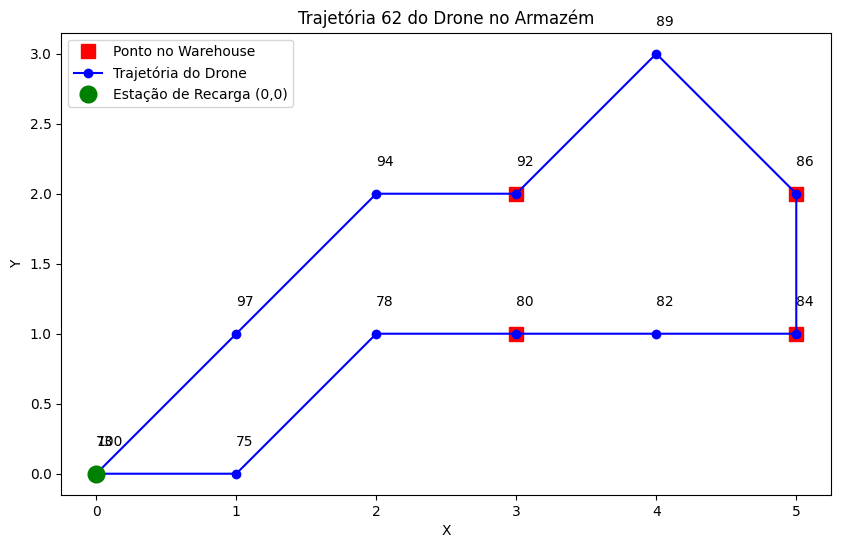


Trajetória 63:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 0), Bateria 75
Passo 11: Posição (0, 0), Bateria 73


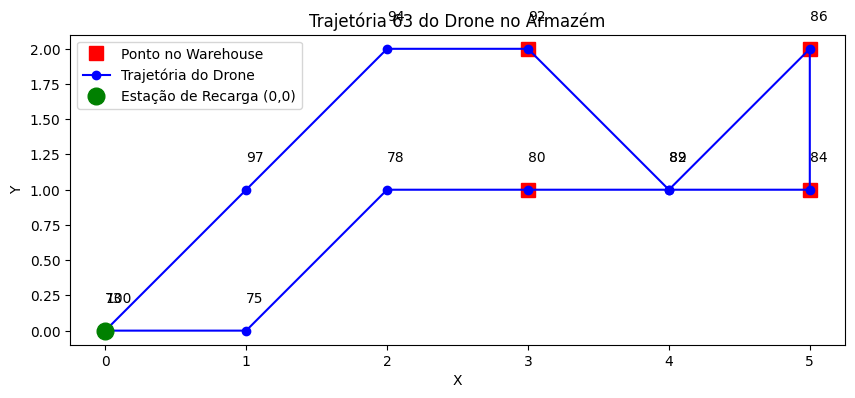


Trajetória 64:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 3), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 1), Bateria 76
Passo 11: Posição (0, 0), Bateria 73


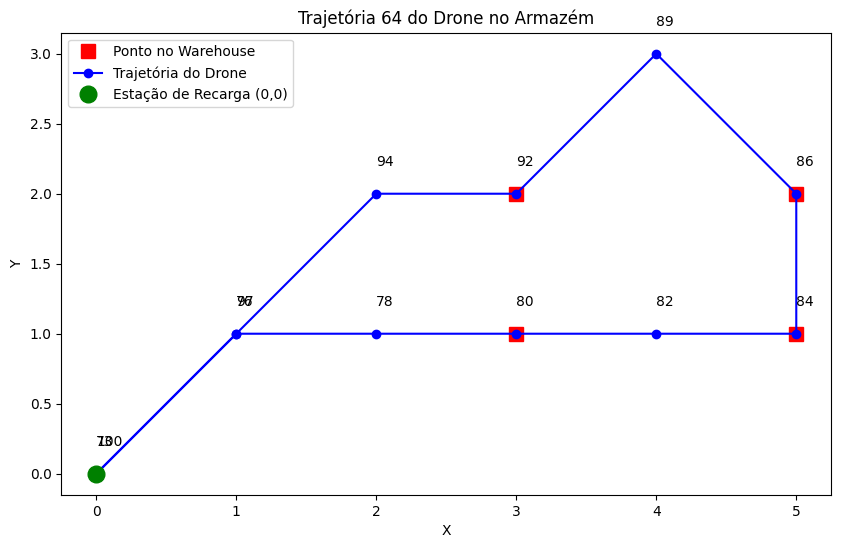


Trajetória 65:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 1), Bateria 76
Passo 11: Posição (0, 0), Bateria 73


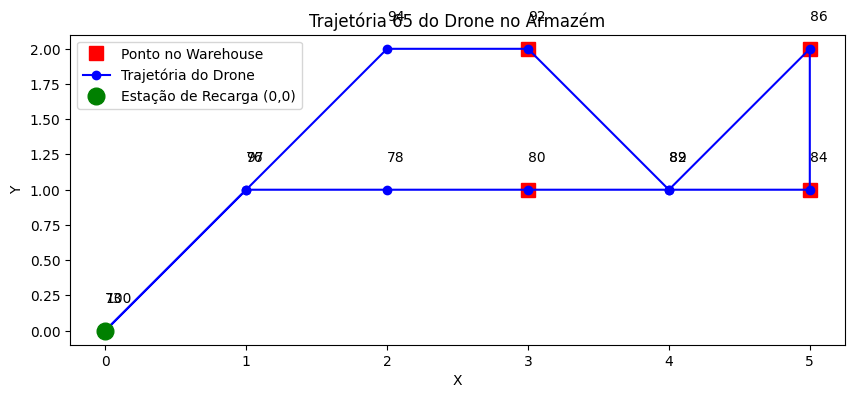


Trajetória 66:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 1), Bateria 76
Passo 11: Posição (0, 0), Bateria 73


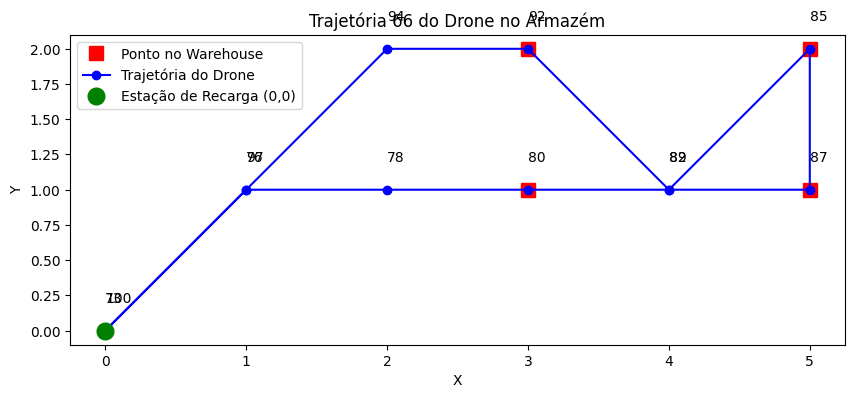


Trajetória 67:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 0), Bateria 75
Passo 11: Posição (0, 0), Bateria 73


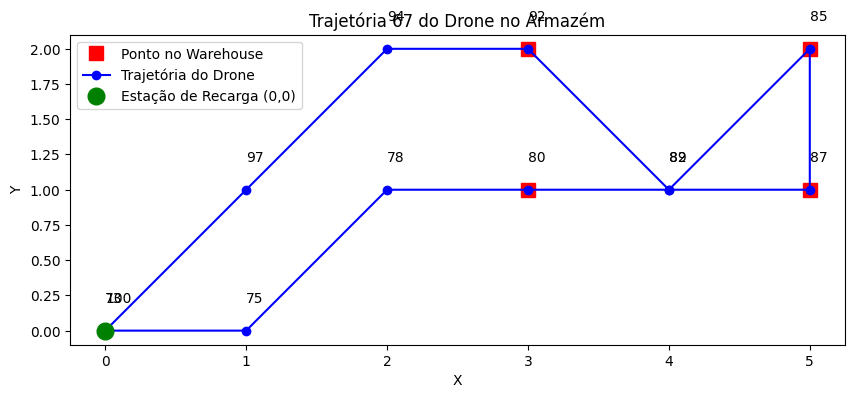


Trajetória 68:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 0), Bateria 77
Passo 10: Posição (1, 0), Bateria 75
Passo 11: Posição (0, 0), Bateria 73


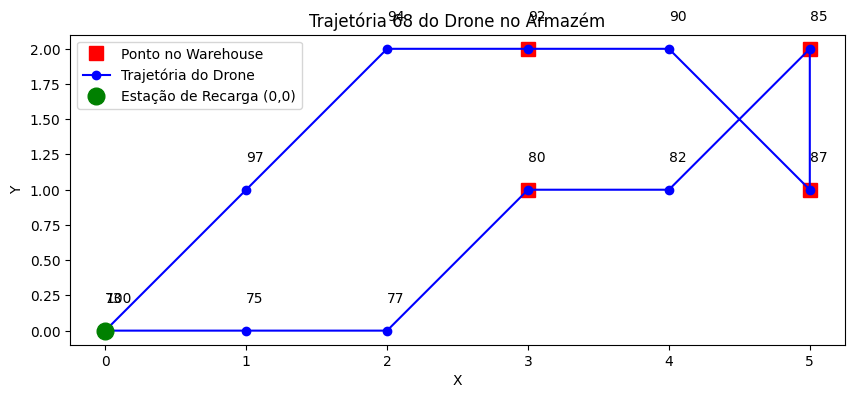


Trajetória 69:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 2), Bateria 88
Passo 6: Posição (5, 1), Bateria 86
Passo 7: Posição (4, 1), Bateria 84
Passo 8: Posição (3, 1), Bateria 82
Passo 9: Posição (2, 0), Bateria 79
Passo 10: Posição (1, 0), Bateria 77
Passo 11: Posição (0, 0), Bateria 75


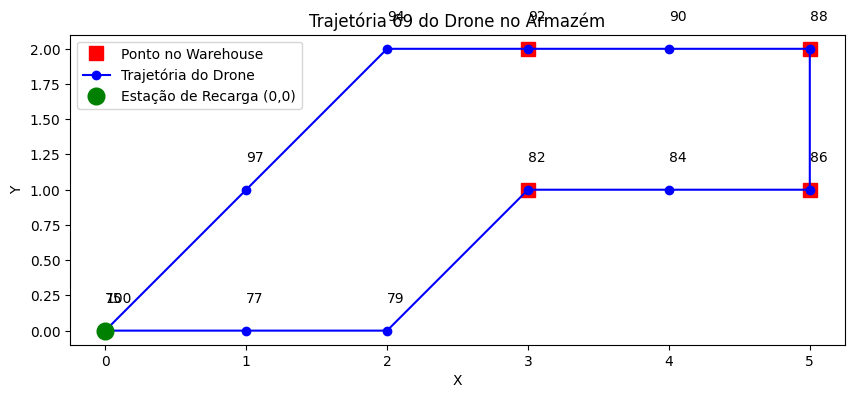


Trajetória 70:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 2), Bateria 88
Passo 6: Posição (5, 1), Bateria 86
Passo 7: Posição (4, 1), Bateria 84
Passo 8: Posição (3, 1), Bateria 82
Passo 9: Posição (2, 1), Bateria 80
Passo 10: Posição (1, 0), Bateria 77
Passo 11: Posição (0, 0), Bateria 75


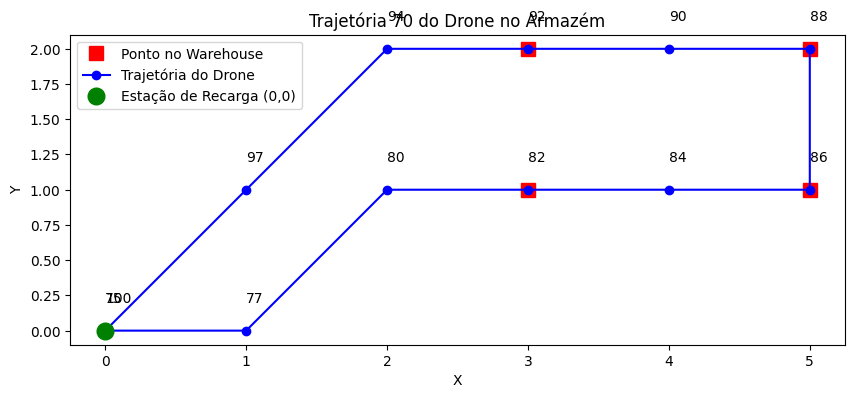


Trajetória 71:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 2), Bateria 88
Passo 6: Posição (5, 1), Bateria 86
Passo 7: Posição (4, 1), Bateria 84
Passo 8: Posição (3, 1), Bateria 82
Passo 9: Posição (2, 1), Bateria 80
Passo 10: Posição (1, 1), Bateria 78
Passo 11: Posição (0, 0), Bateria 75


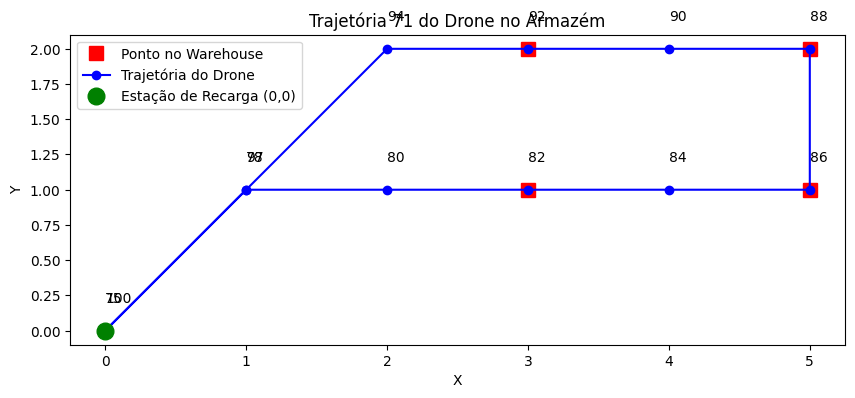


Trajetória 72:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 2), Bateria 88
Passo 6: Posição (5, 1), Bateria 86
Passo 7: Posição (4, 1), Bateria 84
Passo 8: Posição (3, 1), Bateria 82
Passo 9: Posição (2, 2), Bateria 79
Passo 10: Posição (1, 1), Bateria 76
Passo 11: Posição (0, 0), Bateria 73


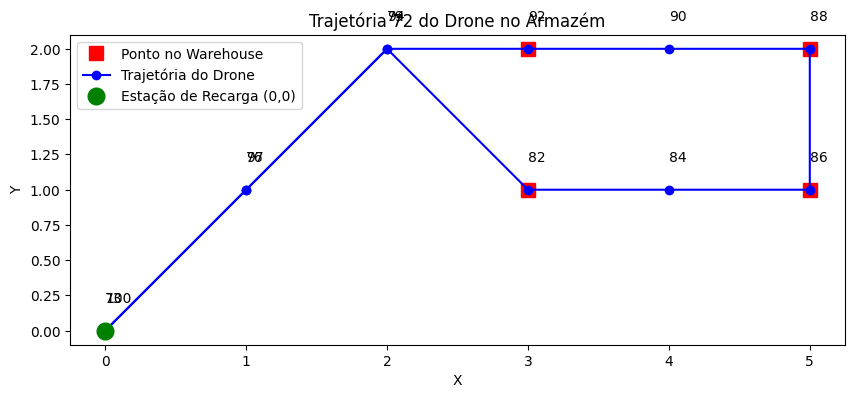


Trajetória 73:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 2), Bateria 88
Passo 6: Posição (5, 1), Bateria 86
Passo 7: Posição (4, 1), Bateria 84
Passo 8: Posição (3, 1), Bateria 82
Passo 9: Posição (2, 0), Bateria 79
Passo 10: Posição (1, 1), Bateria 76
Passo 11: Posição (0, 0), Bateria 73


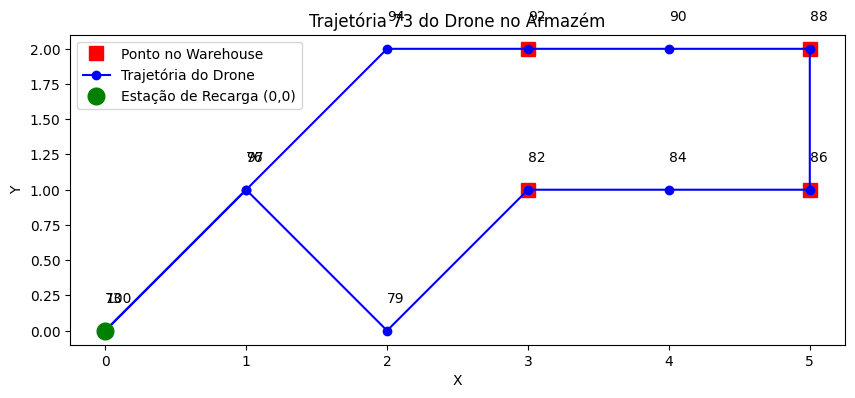


Trajetória 74:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 2), Bateria 77
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


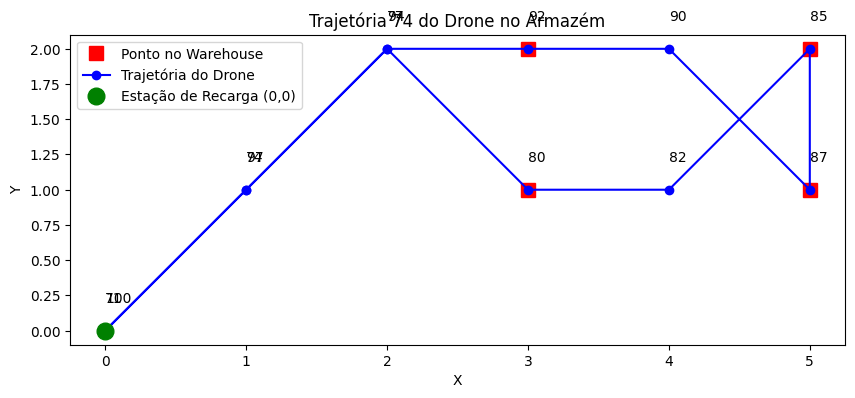


Trajetória 75:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 0), Bateria 77
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


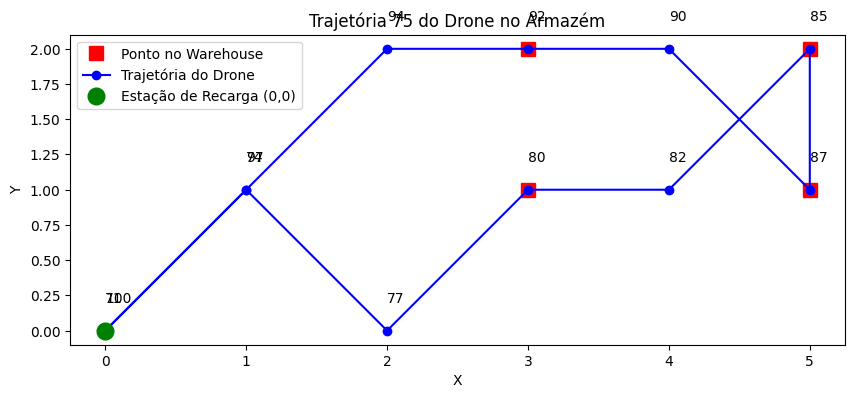


Trajetória 76:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 1), Bateria 76
Passo 11: Posição (0, 0), Bateria 73


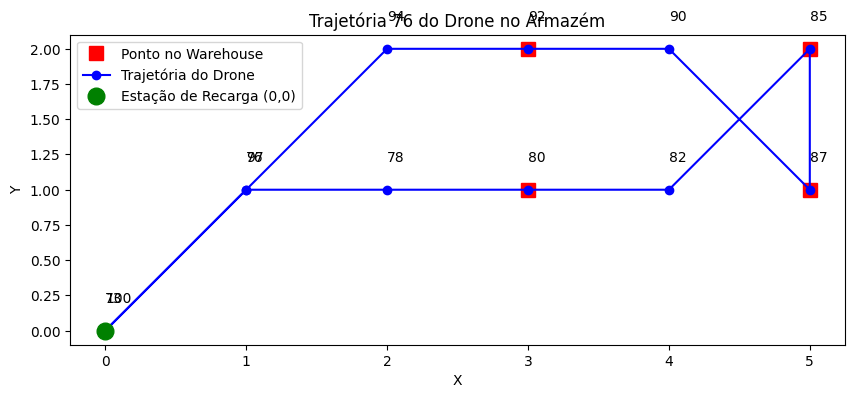


Trajetória 77:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 0), Bateria 75
Passo 11: Posição (0, 0), Bateria 73


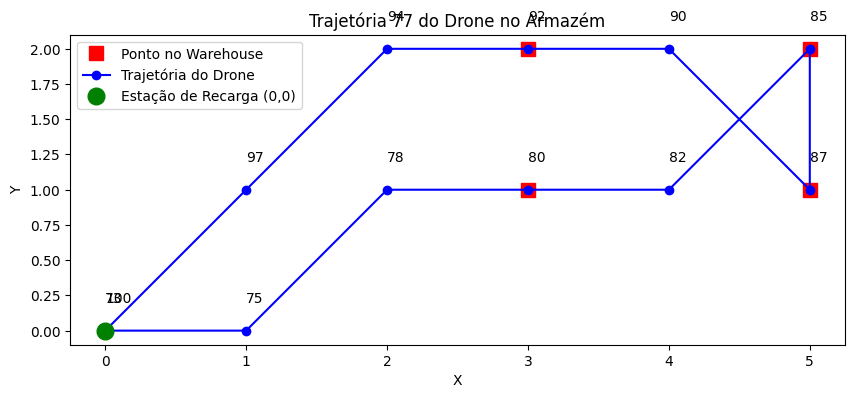


Trajetória 78:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 3), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 0), Bateria 81
Passo 8: Posição (3, 1), Bateria 78
Passo 9: Posição (2, 2), Bateria 75
Passo 10: Posição (1, 1), Bateria 72
Passo 11: Posição (0, 0), Bateria 69


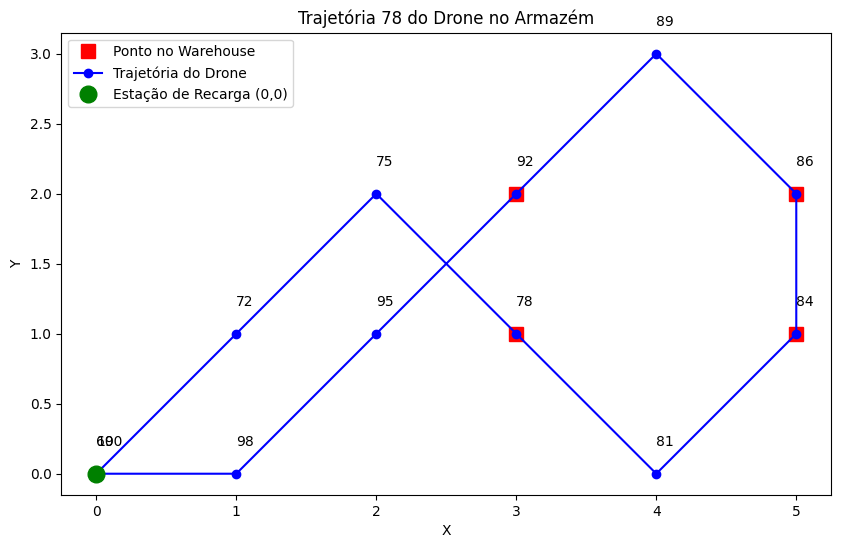


Trajetória 79:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 0), Bateria 81
Passo 8: Posição (3, 1), Bateria 78
Passo 9: Posição (2, 2), Bateria 75
Passo 10: Posição (1, 1), Bateria 72
Passo 11: Posição (0, 0), Bateria 69


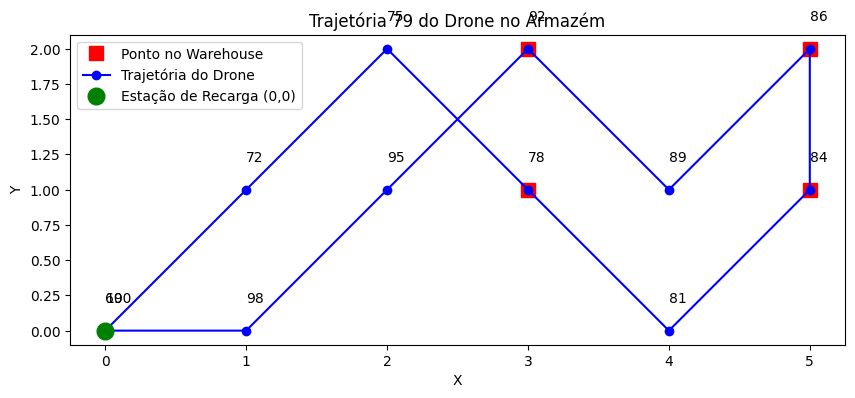


Trajetória 80:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 3), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 0), Bateria 81
Passo 8: Posição (3, 1), Bateria 78
Passo 9: Posição (2, 0), Bateria 75
Passo 10: Posição (1, 1), Bateria 72
Passo 11: Posição (0, 0), Bateria 69


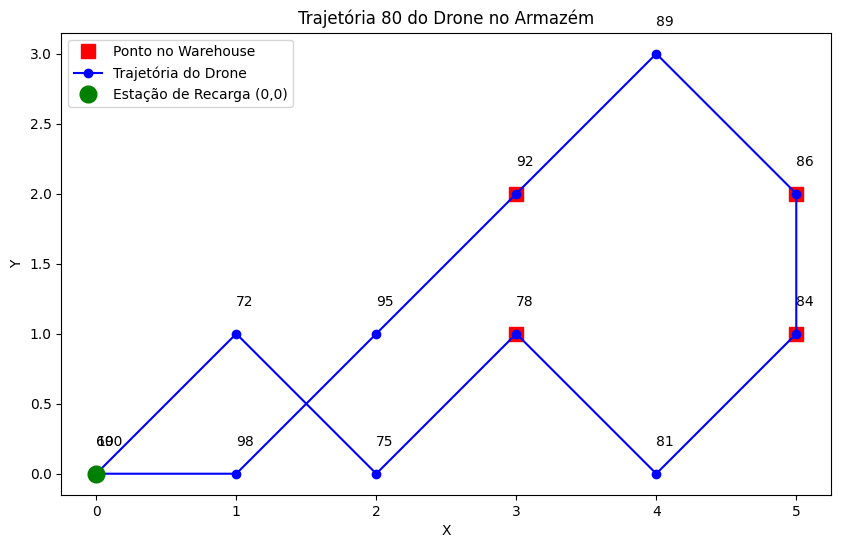


Trajetória 81:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 0), Bateria 81
Passo 8: Posição (3, 1), Bateria 78
Passo 9: Posição (2, 0), Bateria 75
Passo 10: Posição (1, 1), Bateria 72
Passo 11: Posição (0, 0), Bateria 69


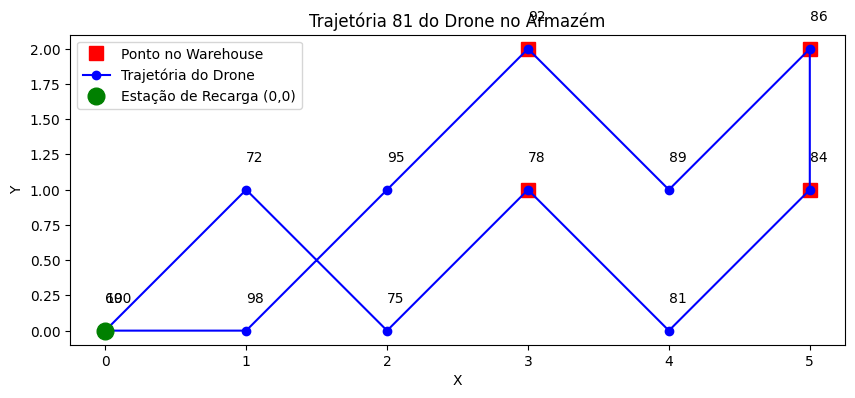


Trajetória 82:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 3), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 2), Bateria 81
Passo 8: Posição (3, 1), Bateria 78
Passo 9: Posição (2, 2), Bateria 75
Passo 10: Posição (1, 1), Bateria 72
Passo 11: Posição (0, 0), Bateria 69


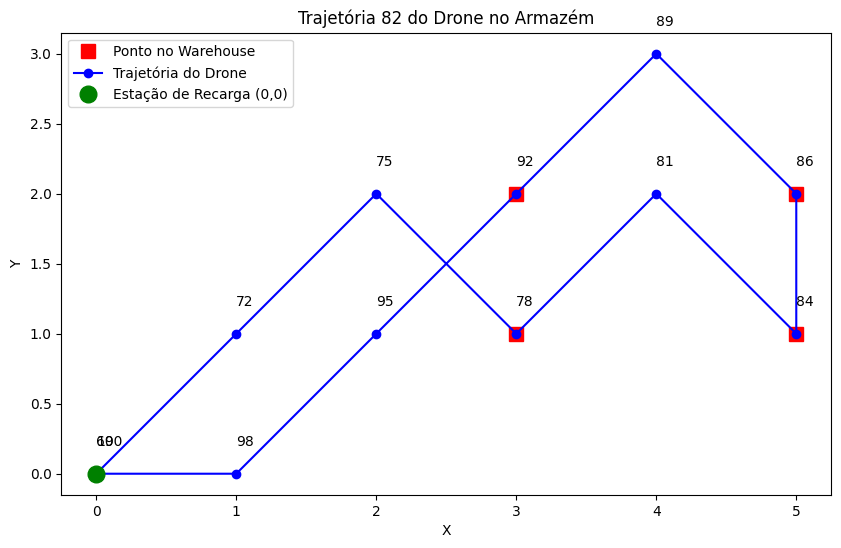


Trajetória 83:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 2), Bateria 81
Passo 8: Posição (3, 1), Bateria 78
Passo 9: Posição (2, 2), Bateria 75
Passo 10: Posição (1, 1), Bateria 72
Passo 11: Posição (0, 0), Bateria 69


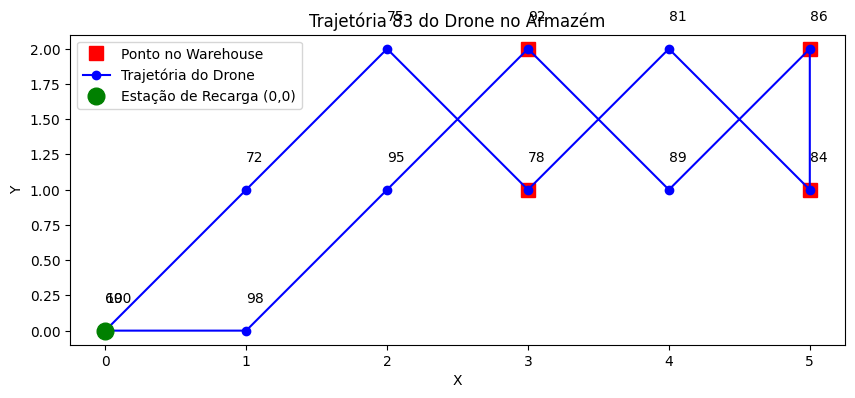


Trajetória 84:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 3), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 2), Bateria 81
Passo 8: Posição (3, 1), Bateria 78
Passo 9: Posição (2, 0), Bateria 75
Passo 10: Posição (1, 1), Bateria 72
Passo 11: Posição (0, 0), Bateria 69


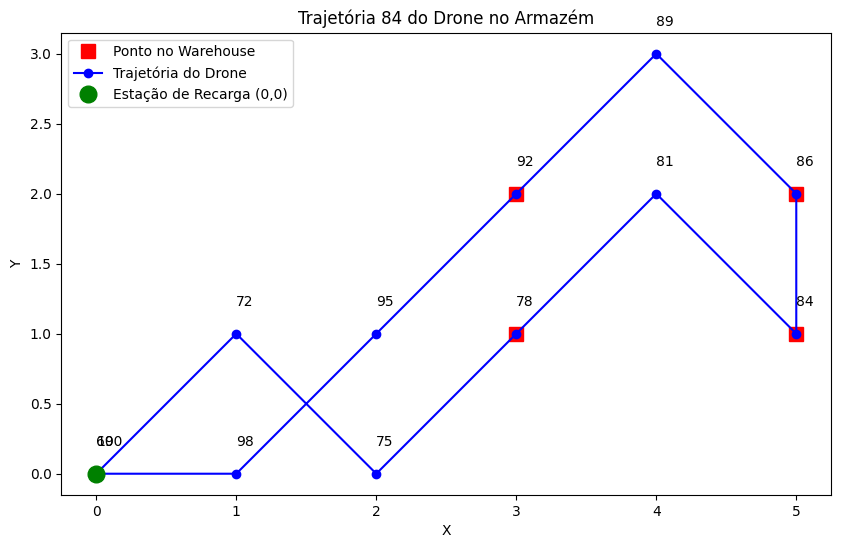


Trajetória 85:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 2), Bateria 81
Passo 8: Posição (3, 1), Bateria 78
Passo 9: Posição (2, 0), Bateria 75
Passo 10: Posição (1, 1), Bateria 72
Passo 11: Posição (0, 0), Bateria 69


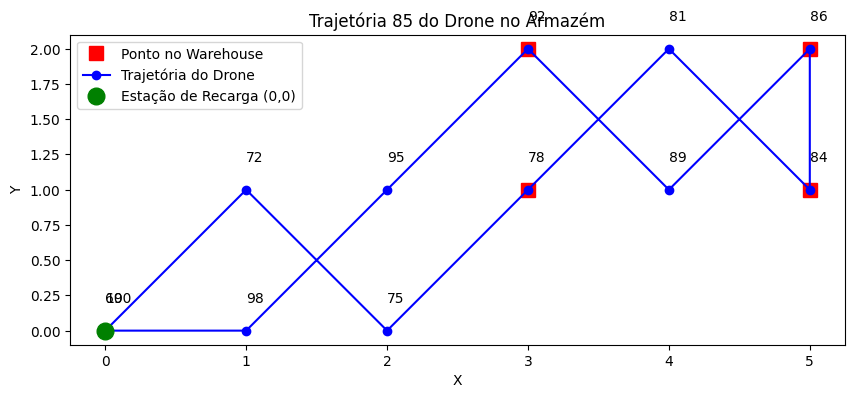


Trajetória 86:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 3), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 2), Bateria 81
Passo 8: Posição (3, 1), Bateria 78
Passo 9: Posição (2, 1), Bateria 76
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


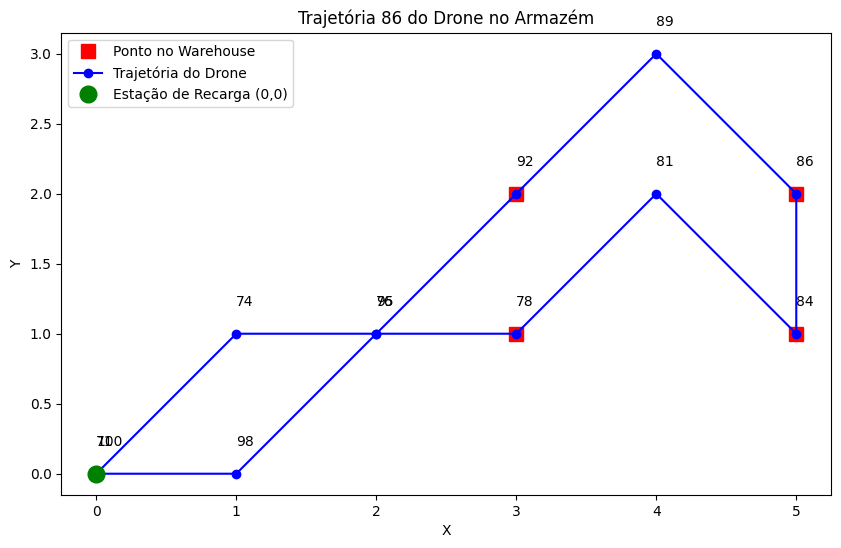


Trajetória 87:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 3), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 0), Bateria 81
Passo 8: Posição (3, 1), Bateria 78
Passo 9: Posição (2, 1), Bateria 76
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


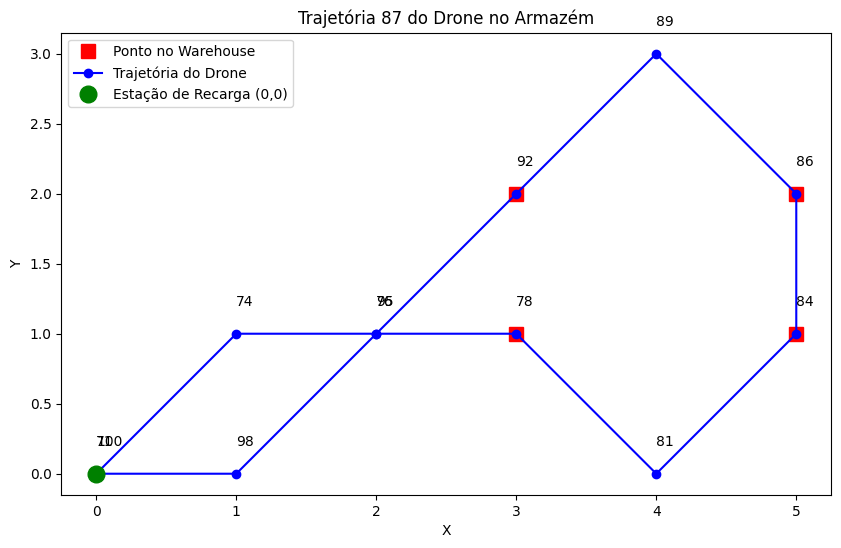


Trajetória 88:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 0), Bateria 81
Passo 8: Posição (3, 1), Bateria 78
Passo 9: Posição (2, 1), Bateria 76
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


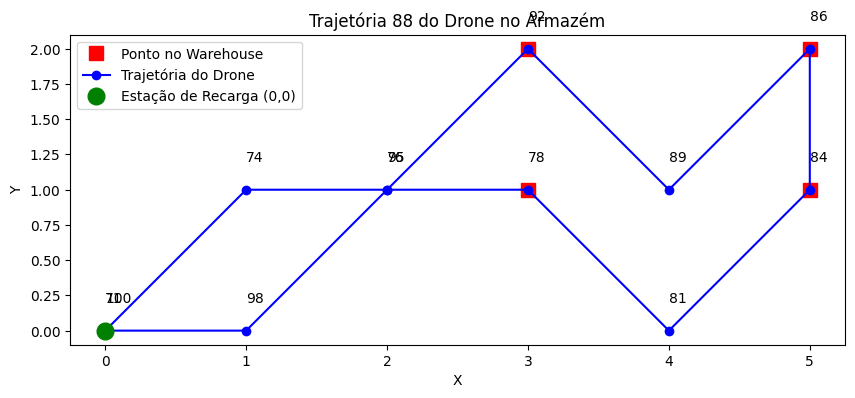


Trajetória 89:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 2), Bateria 81
Passo 8: Posição (3, 1), Bateria 78
Passo 9: Posição (2, 1), Bateria 76
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


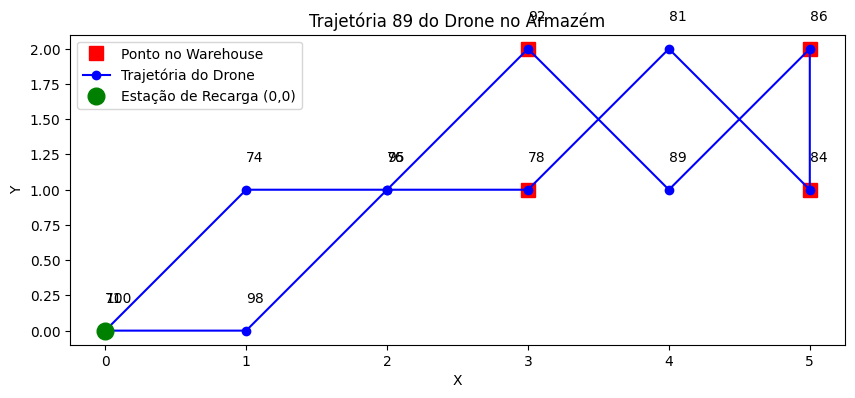


Trajetória 90:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 3), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 2), Bateria 81
Passo 8: Posição (3, 1), Bateria 78
Passo 9: Posição (2, 2), Bateria 75
Passo 10: Posição (1, 1), Bateria 72
Passo 11: Posição (0, 0), Bateria 69


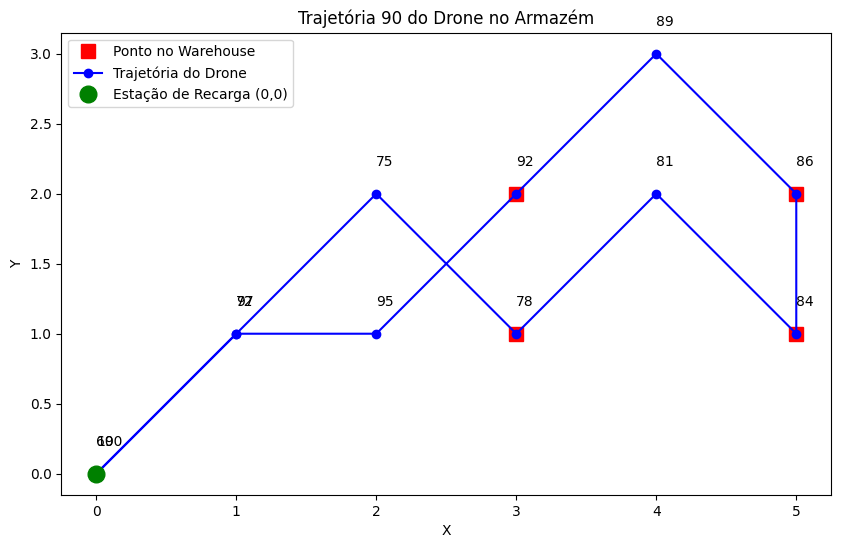


Trajetória 91:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 3), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 0), Bateria 81
Passo 8: Posição (3, 1), Bateria 78
Passo 9: Posição (2, 2), Bateria 75
Passo 10: Posição (1, 1), Bateria 72
Passo 11: Posição (0, 0), Bateria 69


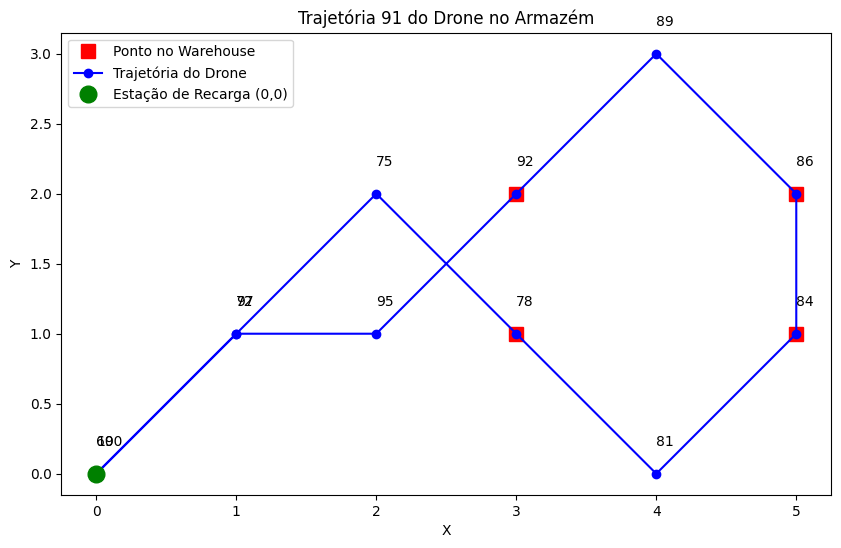


Trajetória 92:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 3), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 2), Bateria 81
Passo 8: Posição (3, 1), Bateria 78
Passo 9: Posição (2, 0), Bateria 75
Passo 10: Posição (1, 1), Bateria 72
Passo 11: Posição (0, 0), Bateria 69


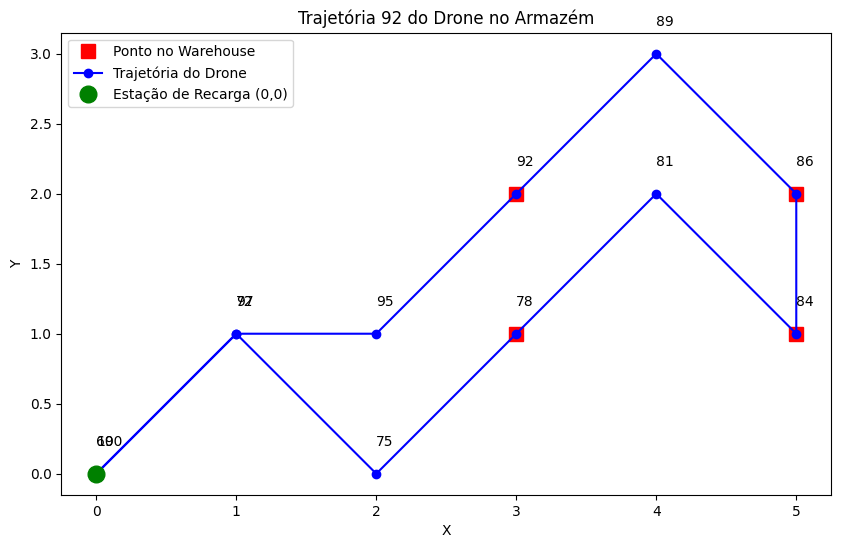


Trajetória 93:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 3), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 0), Bateria 81
Passo 8: Posição (3, 1), Bateria 78
Passo 9: Posição (2, 0), Bateria 75
Passo 10: Posição (1, 1), Bateria 72
Passo 11: Posição (0, 0), Bateria 69


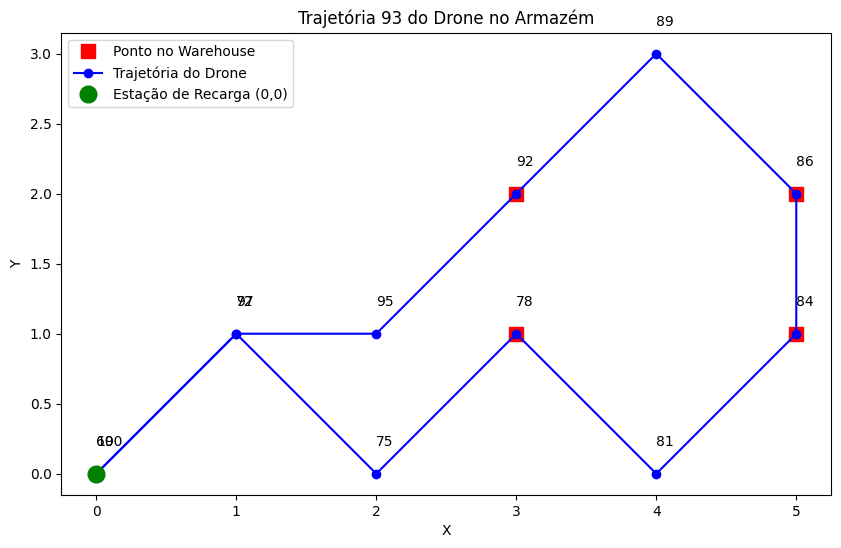


Trajetória 94:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 2), Bateria 81
Passo 8: Posição (3, 1), Bateria 78
Passo 9: Posição (2, 0), Bateria 75
Passo 10: Posição (1, 1), Bateria 72
Passo 11: Posição (0, 0), Bateria 69


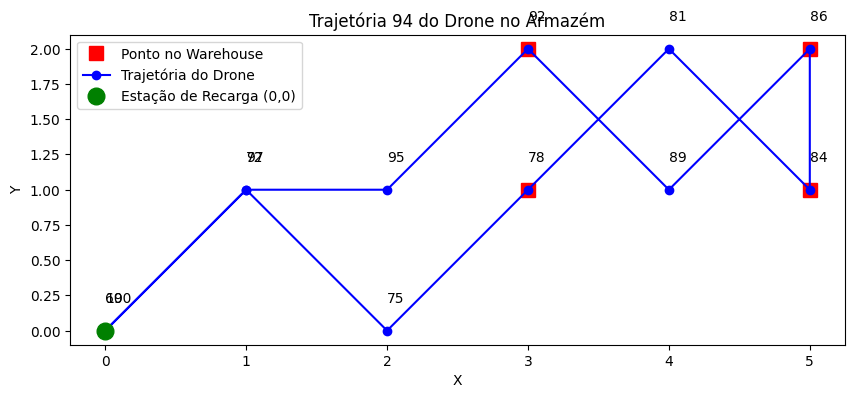


Trajetória 95:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 0), Bateria 81
Passo 8: Posição (3, 1), Bateria 78
Passo 9: Posição (2, 0), Bateria 75
Passo 10: Posição (1, 1), Bateria 72
Passo 11: Posição (0, 0), Bateria 69


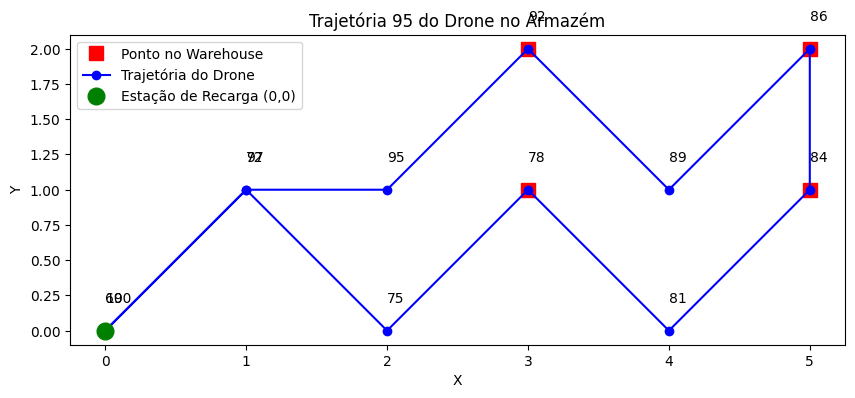


Trajetória 96:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 2), Bateria 81
Passo 8: Posição (3, 1), Bateria 78
Passo 9: Posição (2, 2), Bateria 75
Passo 10: Posição (1, 1), Bateria 72
Passo 11: Posição (0, 0), Bateria 69


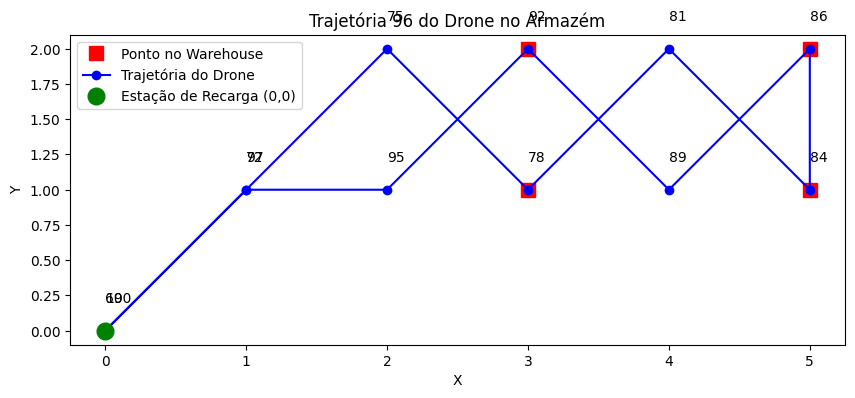


Trajetória 97:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 0), Bateria 81
Passo 8: Posição (3, 1), Bateria 78
Passo 9: Posição (2, 2), Bateria 75
Passo 10: Posição (1, 1), Bateria 72
Passo 11: Posição (0, 0), Bateria 69


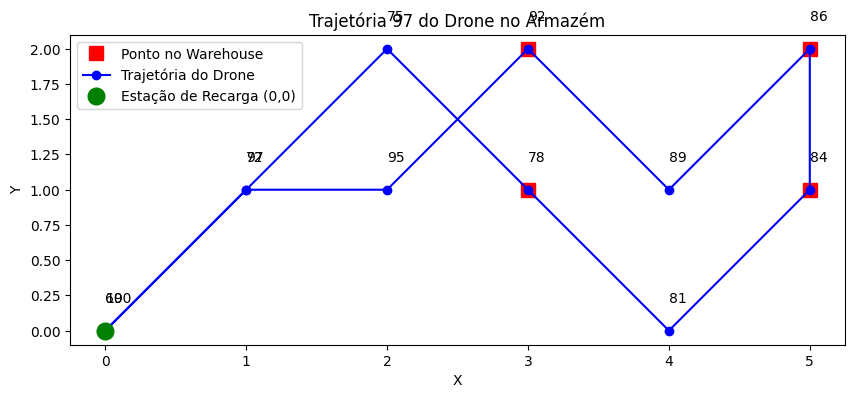


Trajetória 98:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 2), Bateria 81
Passo 8: Posição (3, 1), Bateria 78
Passo 9: Posição (2, 1), Bateria 76
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


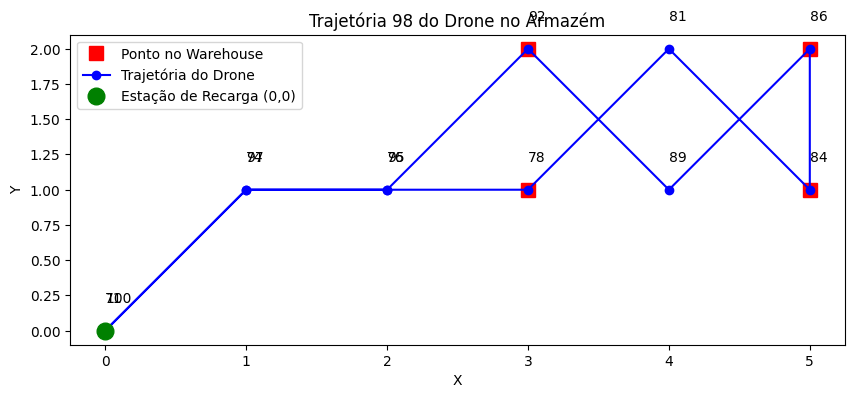


Trajetória 99:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 0), Bateria 81
Passo 8: Posição (3, 1), Bateria 78
Passo 9: Posição (2, 1), Bateria 76
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


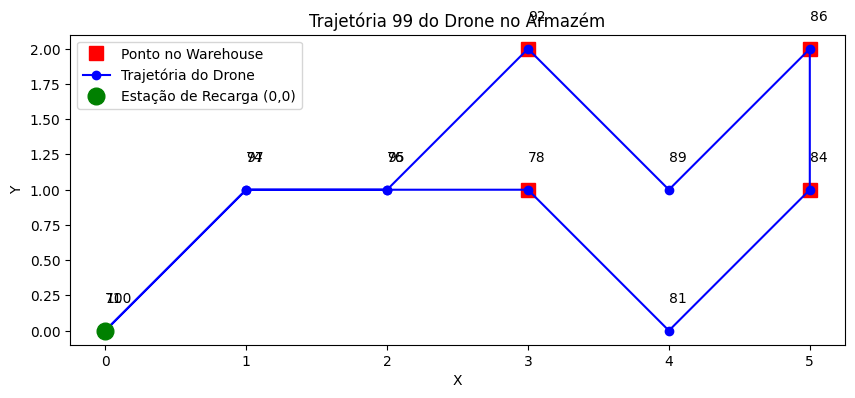


Trajetória 100:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 3), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 2), Bateria 81
Passo 8: Posição (3, 1), Bateria 78
Passo 9: Posição (2, 1), Bateria 76
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


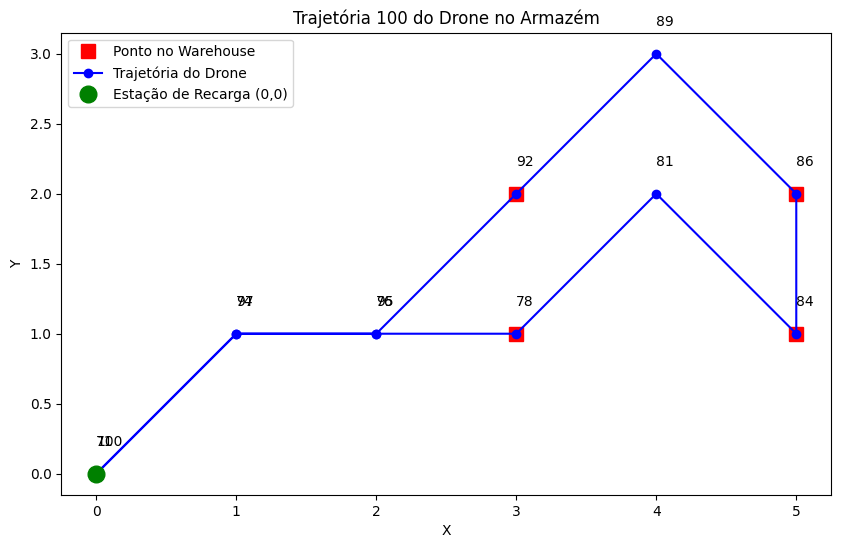


Trajetória 101:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 3), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 0), Bateria 81
Passo 8: Posição (3, 1), Bateria 78
Passo 9: Posição (2, 1), Bateria 76
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


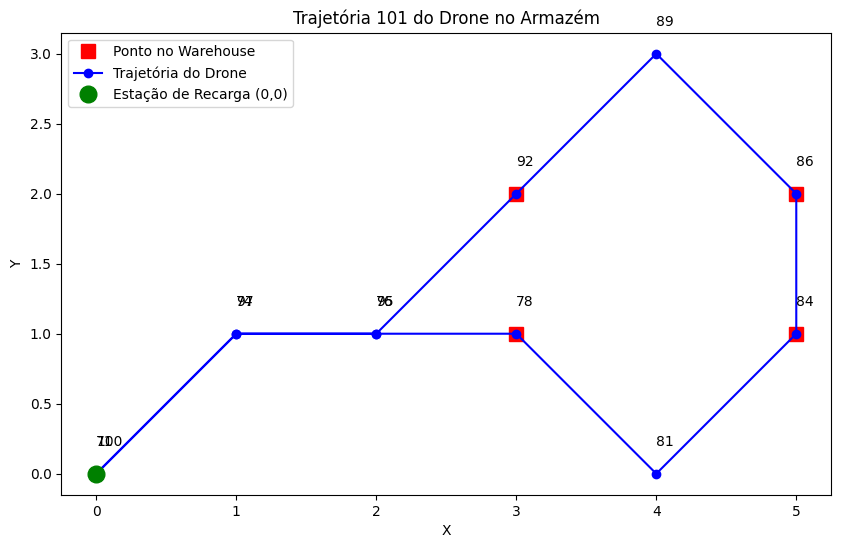


Trajetória 102:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 2), Bateria 88
Passo 6: Posição (5, 1), Bateria 86
Passo 7: Posição (4, 2), Bateria 83
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 2), Bateria 77
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


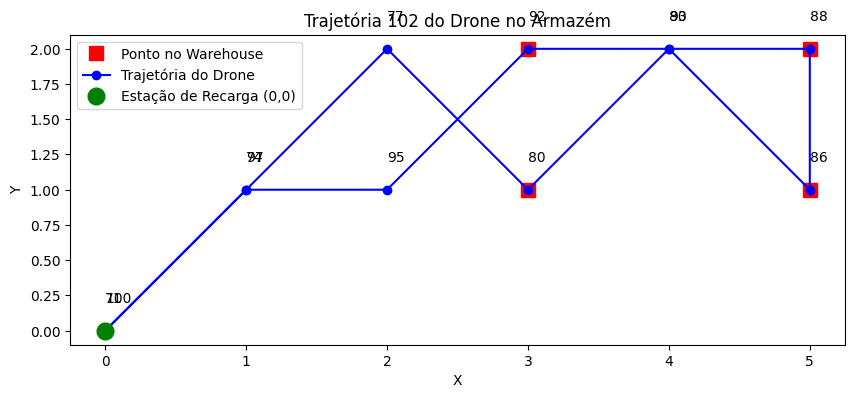


Trajetória 103:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 2), Bateria 88
Passo 6: Posição (5, 1), Bateria 86
Passo 7: Posição (4, 2), Bateria 83
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 0), Bateria 77
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


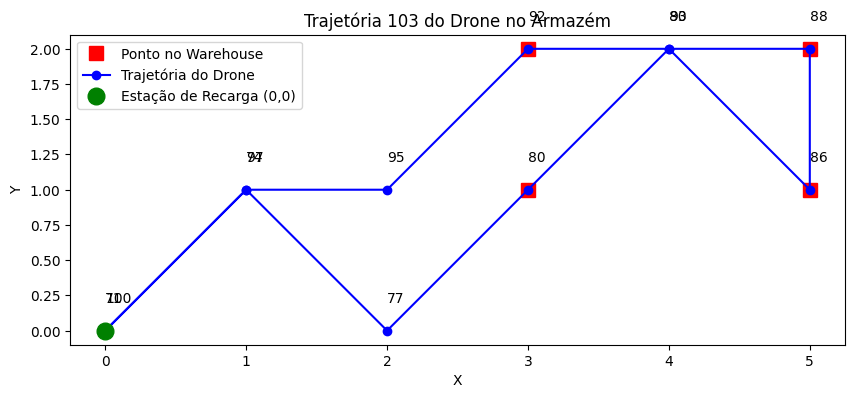


Trajetória 104:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 2), Bateria 88
Passo 6: Posição (5, 1), Bateria 86
Passo 7: Posição (4, 0), Bateria 83
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 2), Bateria 77
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


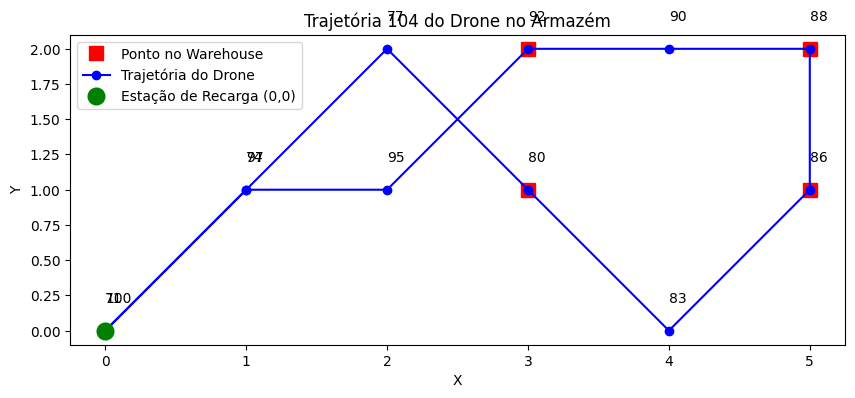


Trajetória 105:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 2), Bateria 88
Passo 6: Posição (5, 1), Bateria 86
Passo 7: Posição (4, 0), Bateria 83
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 0), Bateria 77
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


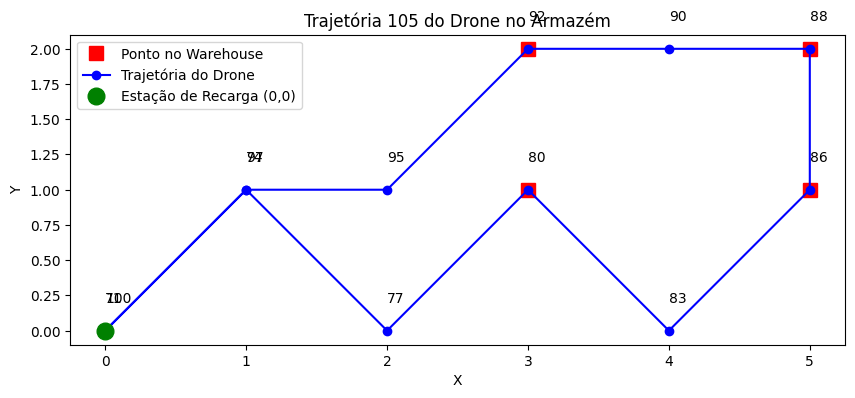


Trajetória 106:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 2), Bateria 88
Passo 6: Posição (5, 1), Bateria 86
Passo 7: Posição (4, 0), Bateria 83
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 1), Bateria 76
Passo 11: Posição (0, 0), Bateria 73


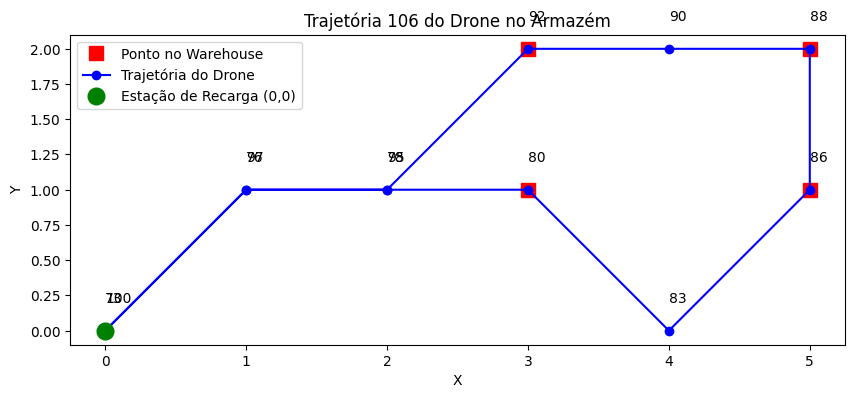


Trajetória 107:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 2), Bateria 88
Passo 6: Posição (5, 1), Bateria 86
Passo 7: Posição (4, 2), Bateria 83
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 1), Bateria 76
Passo 11: Posição (0, 0), Bateria 73


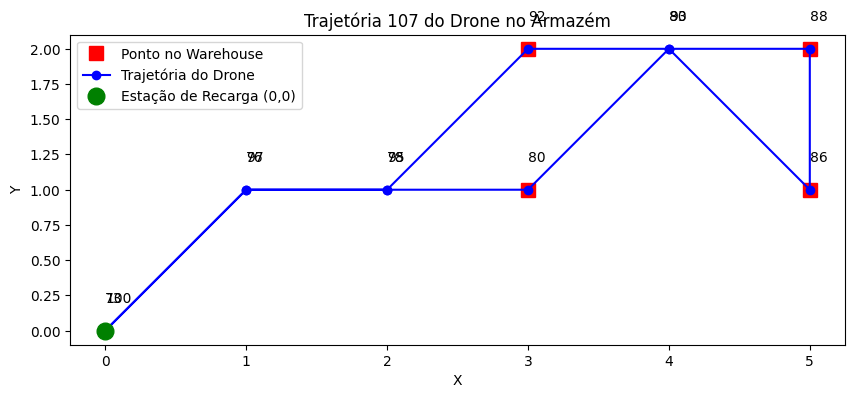


Trajetória 108:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 3), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 0), Bateria 81
Passo 8: Posição (3, 1), Bateria 78
Passo 9: Posição (2, 2), Bateria 75
Passo 10: Posição (1, 1), Bateria 72
Passo 11: Posição (0, 0), Bateria 69


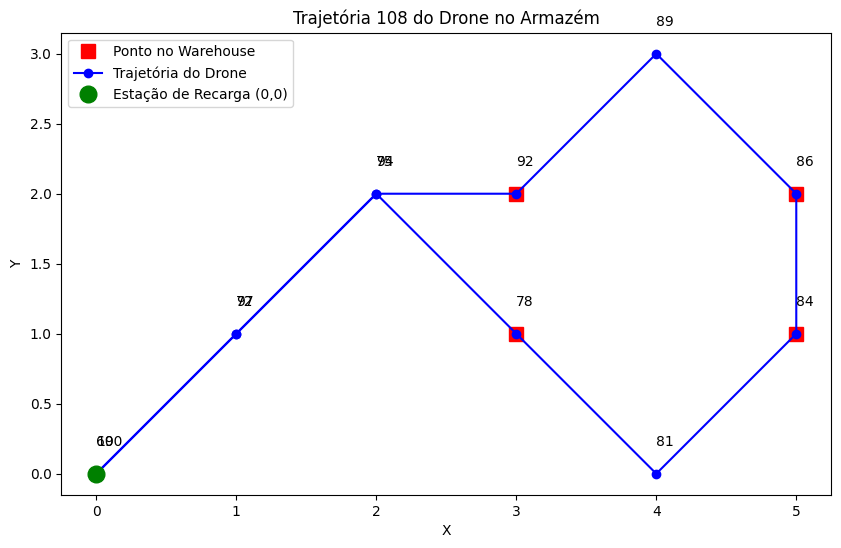


Trajetória 109:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 3), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 0), Bateria 81
Passo 8: Posição (3, 1), Bateria 78
Passo 9: Posição (2, 0), Bateria 75
Passo 10: Posição (1, 1), Bateria 72
Passo 11: Posição (0, 0), Bateria 69


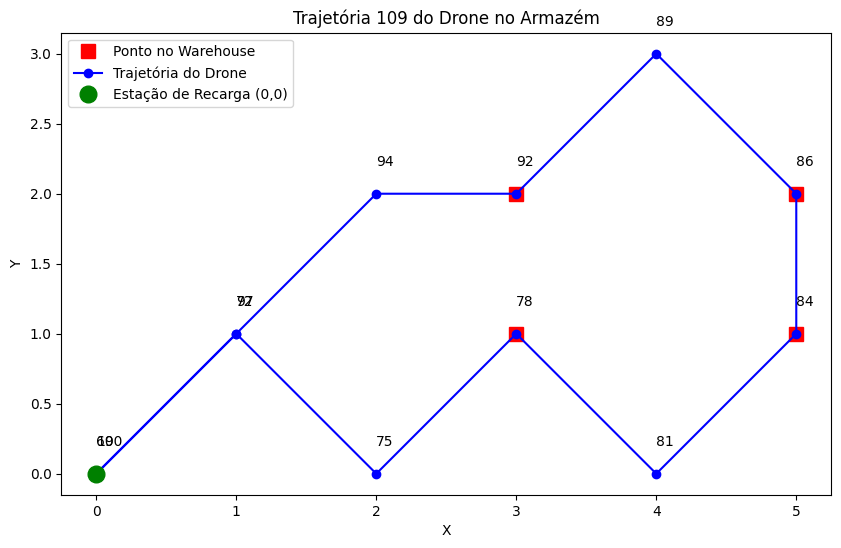


Trajetória 110:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 0), Bateria 81
Passo 8: Posição (3, 1), Bateria 78
Passo 9: Posição (2, 2), Bateria 75
Passo 10: Posição (1, 1), Bateria 72
Passo 11: Posição (0, 0), Bateria 69


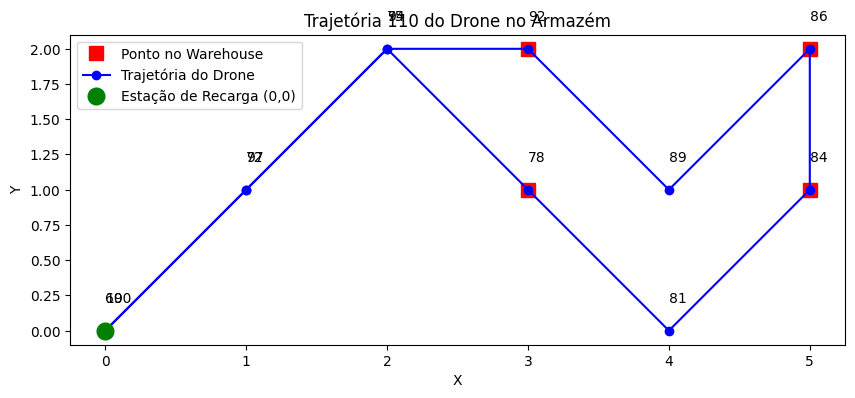


Trajetória 111:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 2), Bateria 81
Passo 8: Posição (3, 1), Bateria 78
Passo 9: Posição (2, 2), Bateria 75
Passo 10: Posição (1, 1), Bateria 72
Passo 11: Posição (0, 0), Bateria 69


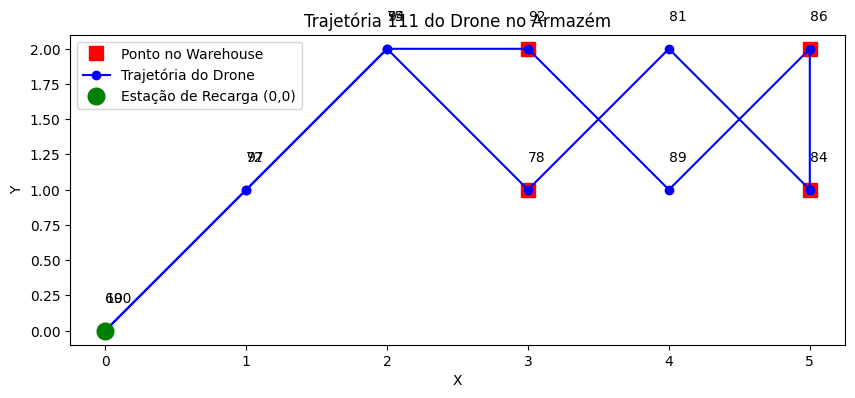


Trajetória 112:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 3), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 2), Bateria 81
Passo 8: Posição (3, 1), Bateria 78
Passo 9: Posição (2, 2), Bateria 75
Passo 10: Posição (1, 1), Bateria 72
Passo 11: Posição (0, 0), Bateria 69


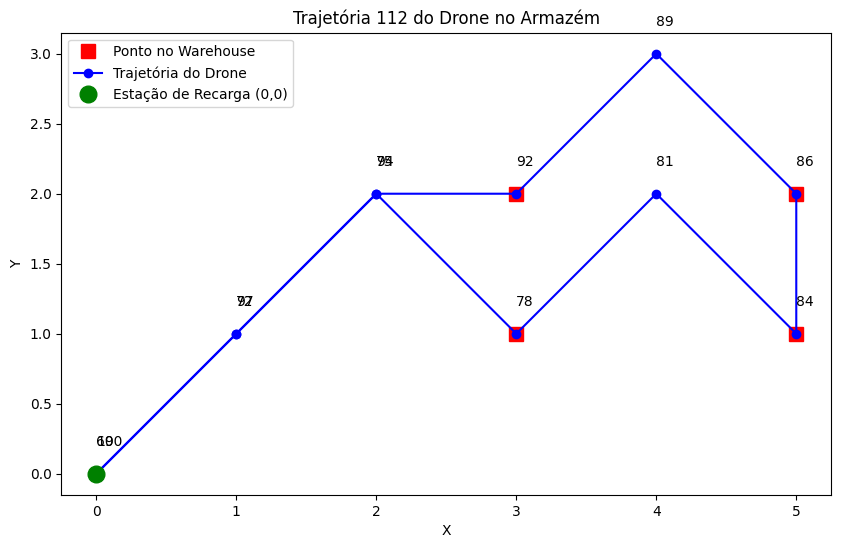


Trajetória 113:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 2), Bateria 81
Passo 8: Posição (3, 1), Bateria 78
Passo 9: Posição (2, 0), Bateria 75
Passo 10: Posição (1, 1), Bateria 72
Passo 11: Posição (0, 0), Bateria 69


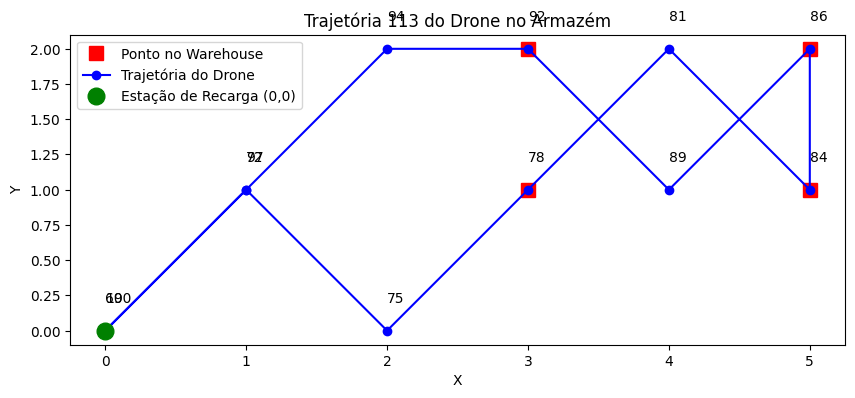


Trajetória 114:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 3), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 2), Bateria 81
Passo 8: Posição (3, 1), Bateria 78
Passo 9: Posição (2, 0), Bateria 75
Passo 10: Posição (1, 1), Bateria 72
Passo 11: Posição (0, 0), Bateria 69


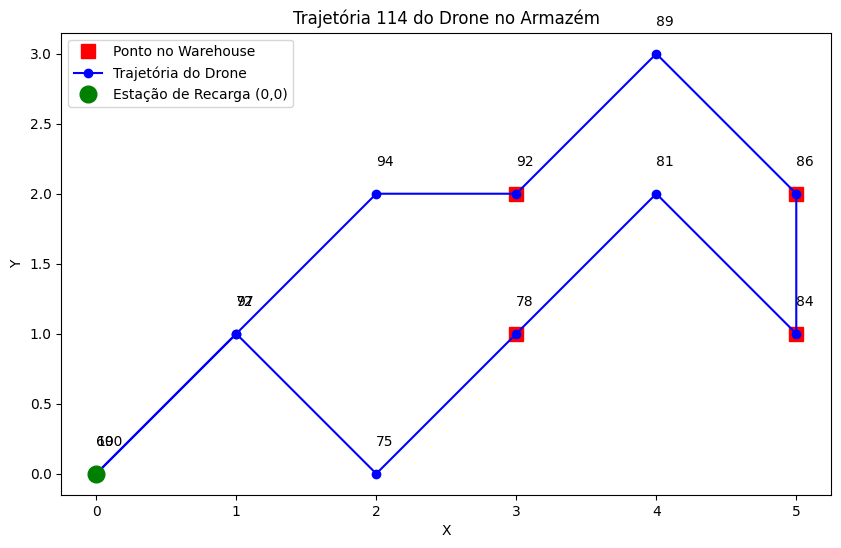


Trajetória 115:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 2), Bateria 81
Passo 8: Posição (3, 1), Bateria 78
Passo 9: Posição (2, 1), Bateria 76
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


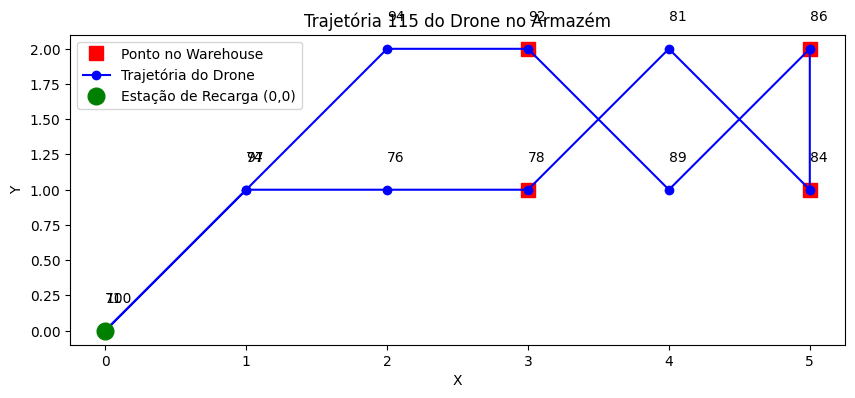


Trajetória 116:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 3), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 2), Bateria 81
Passo 8: Posição (3, 1), Bateria 78
Passo 9: Posição (2, 1), Bateria 76
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


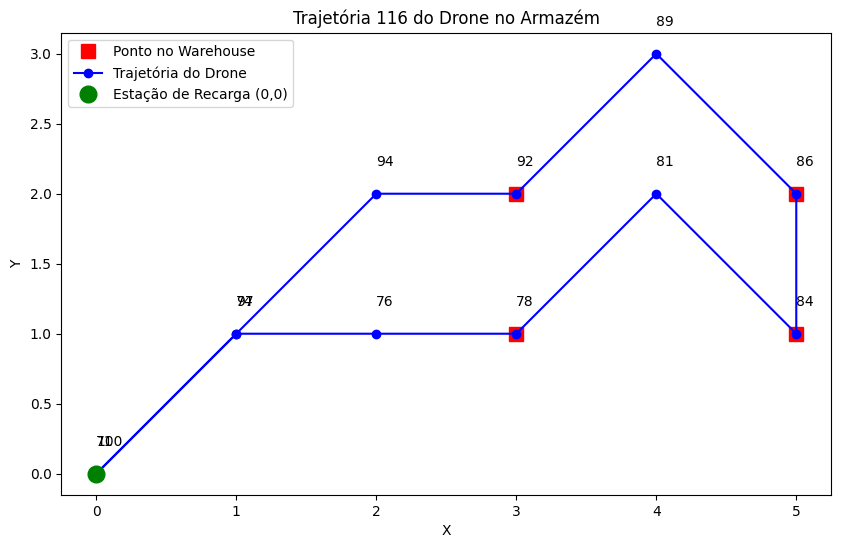


Trajetória 117:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 3), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 0), Bateria 81
Passo 8: Posição (3, 1), Bateria 78
Passo 9: Posição (2, 1), Bateria 76
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


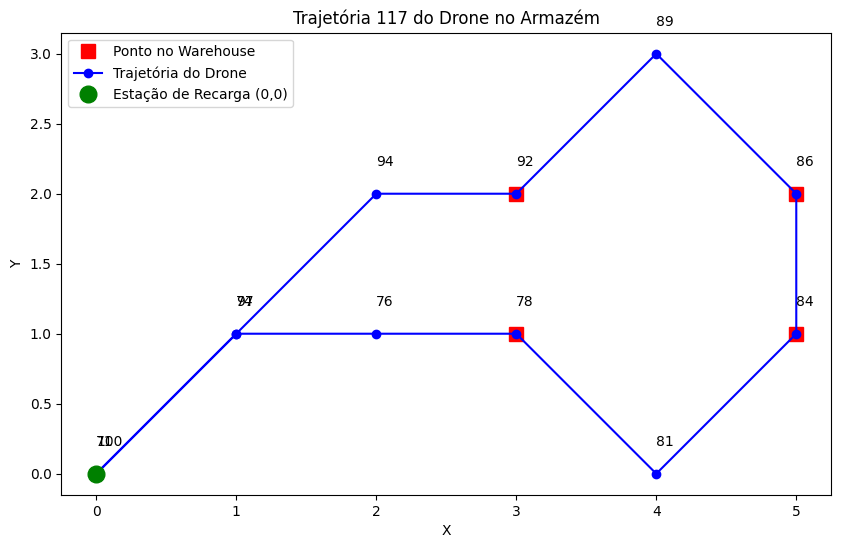


Trajetória 118:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 2), Bateria 88
Passo 6: Posição (5, 1), Bateria 86
Passo 7: Posição (4, 0), Bateria 83
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 0), Bateria 77
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


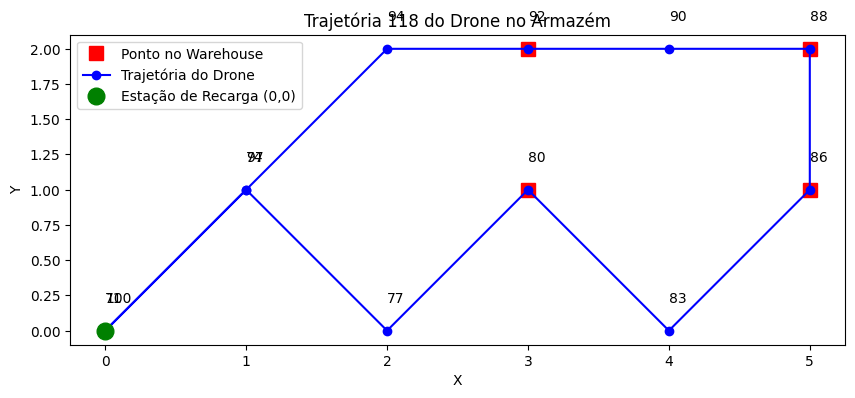


Trajetória 119:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 2), Bateria 88
Passo 6: Posição (5, 1), Bateria 86
Passo 7: Posição (4, 0), Bateria 83
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 2), Bateria 77
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


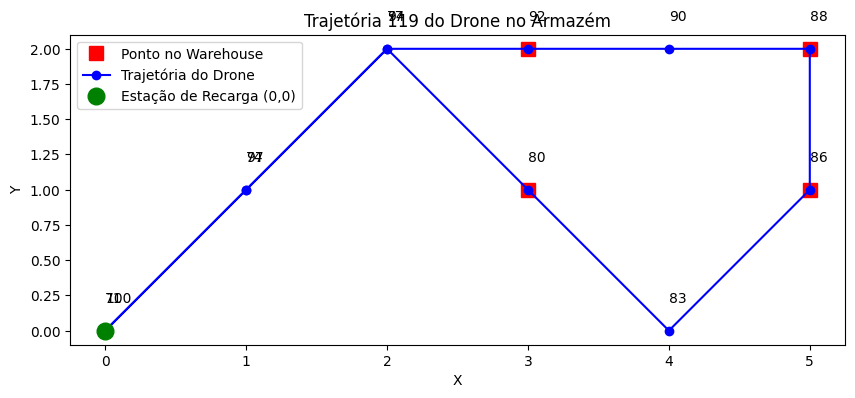


Trajetória 120:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 2), Bateria 88
Passo 6: Posição (5, 1), Bateria 86
Passo 7: Posição (4, 2), Bateria 83
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 0), Bateria 77
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


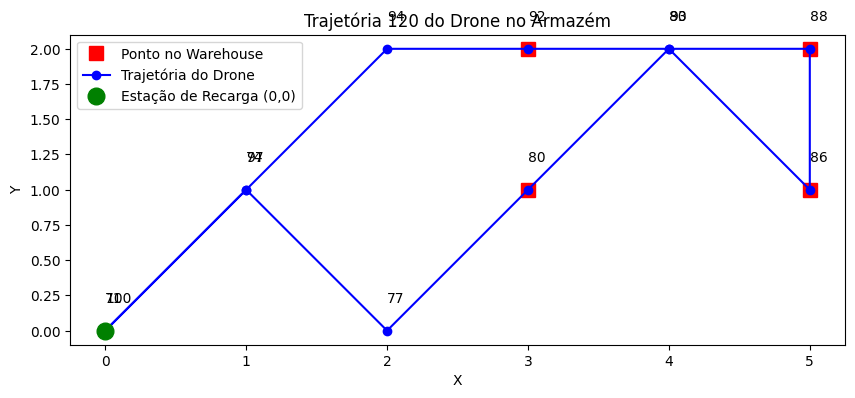


Trajetória 121:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 2), Bateria 88
Passo 6: Posição (5, 1), Bateria 86
Passo 7: Posição (4, 2), Bateria 83
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 2), Bateria 77
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


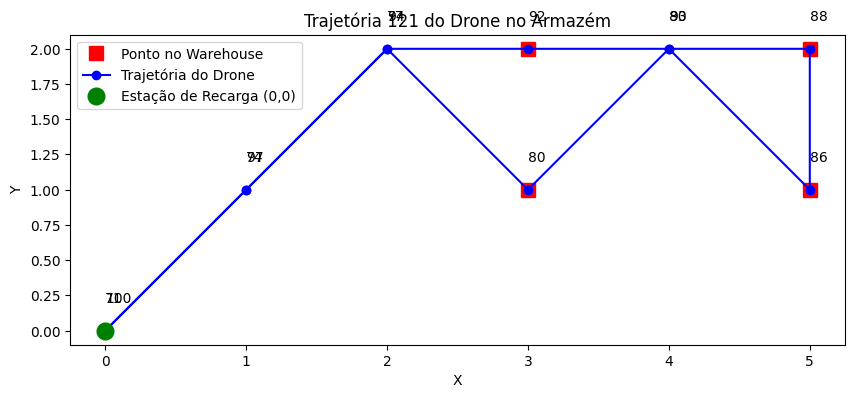


Trajetória 122:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 2), Bateria 88
Passo 6: Posição (5, 1), Bateria 86
Passo 7: Posição (4, 2), Bateria 83
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 1), Bateria 76
Passo 11: Posição (0, 0), Bateria 73


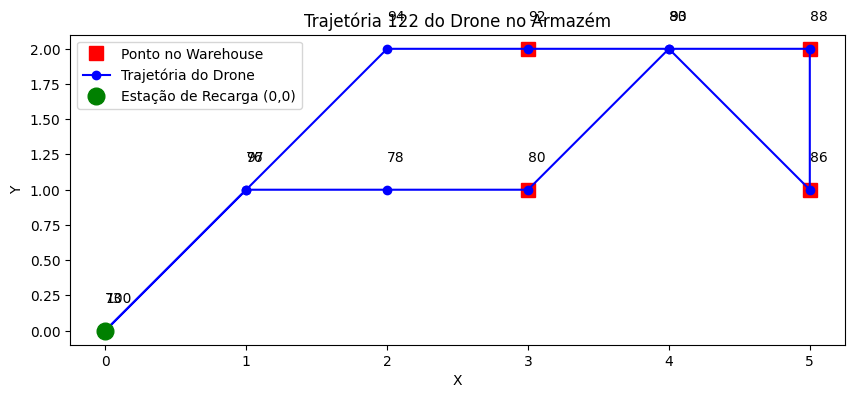


Trajetória 123:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 2), Bateria 88
Passo 6: Posição (5, 1), Bateria 86
Passo 7: Posição (4, 0), Bateria 83
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 1), Bateria 76
Passo 11: Posição (0, 0), Bateria 73


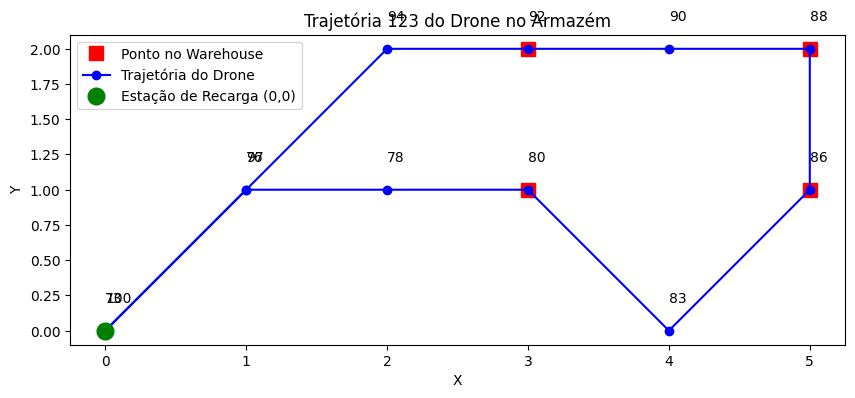


Trajetória 124:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 2), Bateria 88
Passo 6: Posição (5, 1), Bateria 86
Passo 7: Posição (4, 2), Bateria 83
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 0), Bateria 77
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


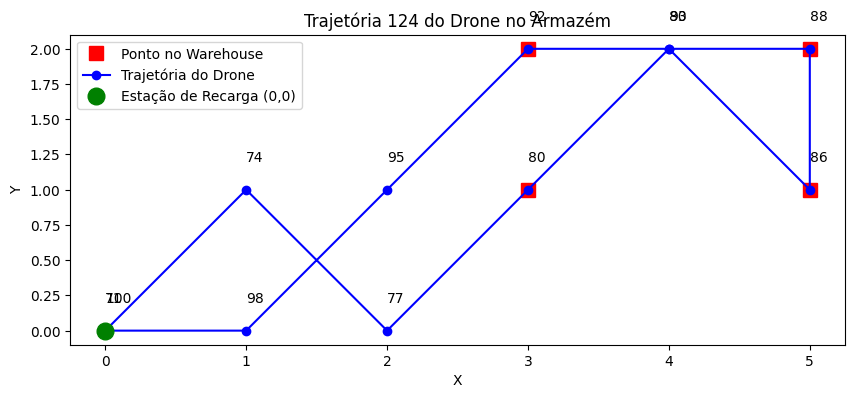


Trajetória 125:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 2), Bateria 88
Passo 6: Posição (5, 1), Bateria 86
Passo 7: Posição (4, 2), Bateria 83
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 2), Bateria 77
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


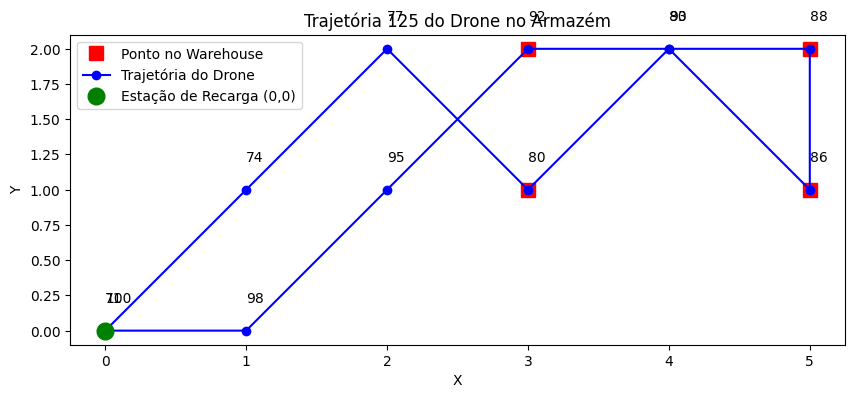


Trajetória 126:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 2), Bateria 88
Passo 6: Posição (5, 1), Bateria 86
Passo 7: Posição (4, 0), Bateria 83
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 0), Bateria 77
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


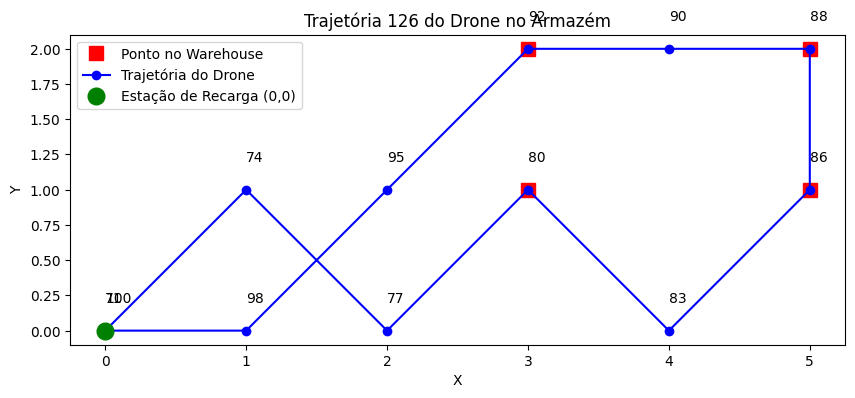


Trajetória 127:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 2), Bateria 88
Passo 6: Posição (5, 1), Bateria 86
Passo 7: Posição (4, 0), Bateria 83
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 2), Bateria 77
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


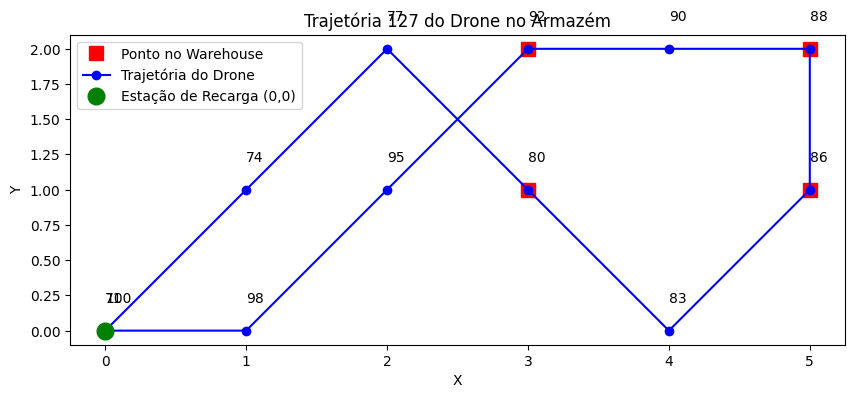


Trajetória 128:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 2), Bateria 88
Passo 6: Posição (5, 1), Bateria 86
Passo 7: Posição (4, 0), Bateria 83
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 1), Bateria 76
Passo 11: Posição (0, 0), Bateria 73


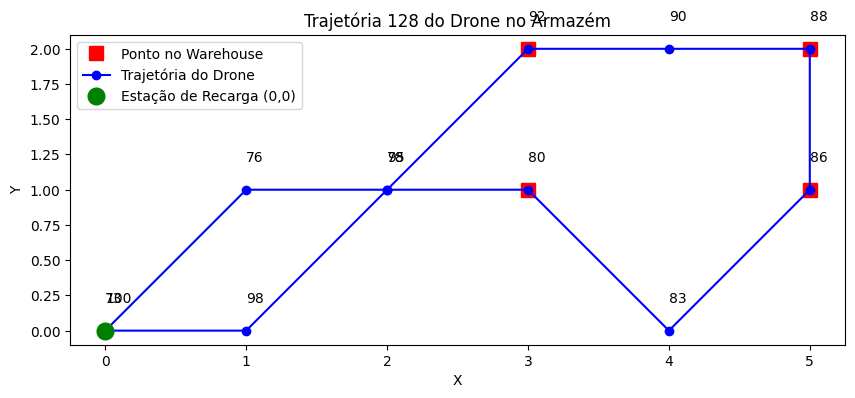


Trajetória 129:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 2), Bateria 88
Passo 6: Posição (5, 1), Bateria 86
Passo 7: Posição (4, 2), Bateria 83
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 1), Bateria 76
Passo 11: Posição (0, 0), Bateria 73


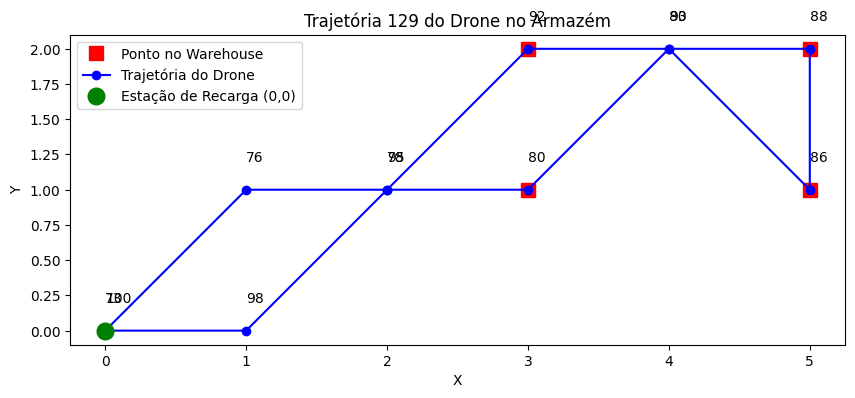


Trajetória 130:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 2), Bateria 83
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 0), Bateria 77
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


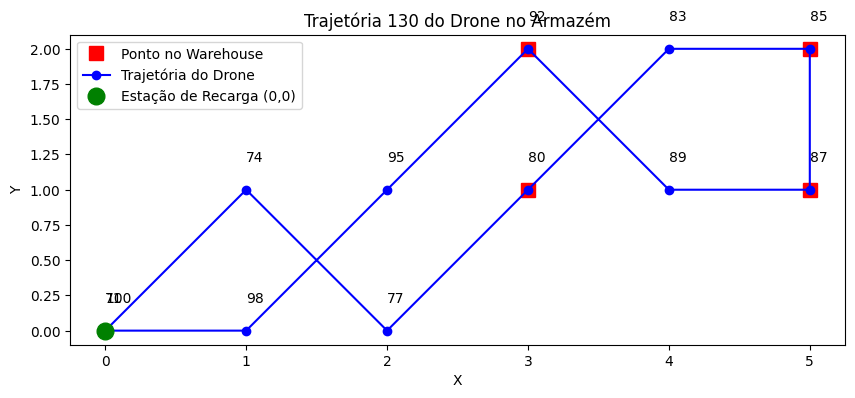


Trajetória 131:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 2), Bateria 83
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 2), Bateria 77
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


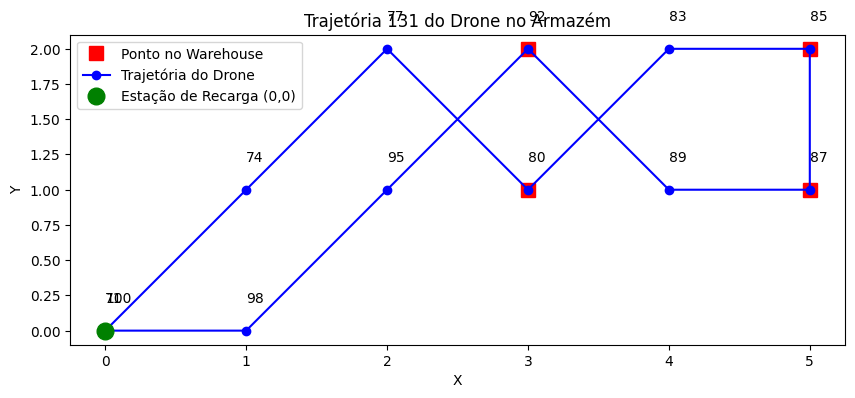


Trajetória 132:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 2), Bateria 83
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 1), Bateria 76
Passo 11: Posição (0, 0), Bateria 73


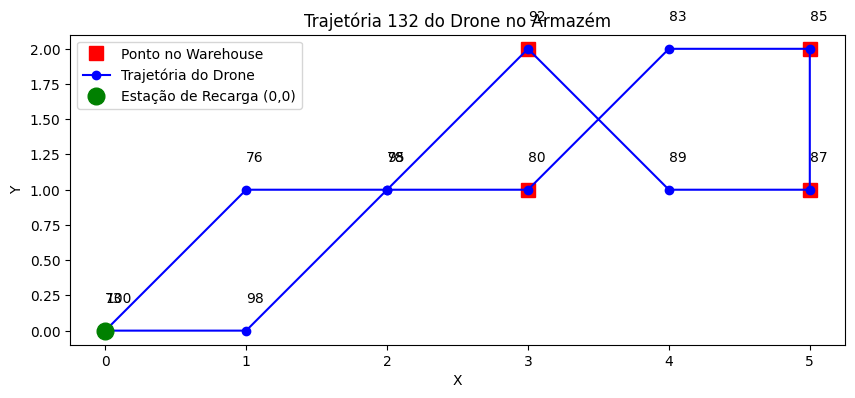


Trajetória 133:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 2), Bateria 83
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 1), Bateria 76
Passo 11: Posição (0, 0), Bateria 73


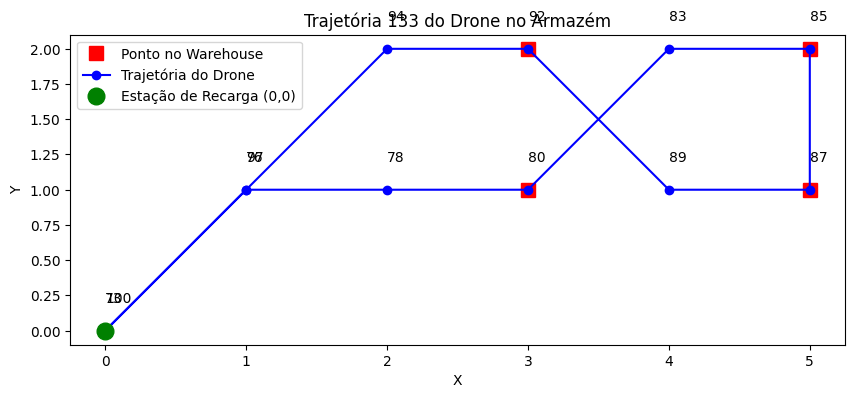


Trajetória 134:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 2), Bateria 83
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 1), Bateria 76
Passo 11: Posição (0, 0), Bateria 73


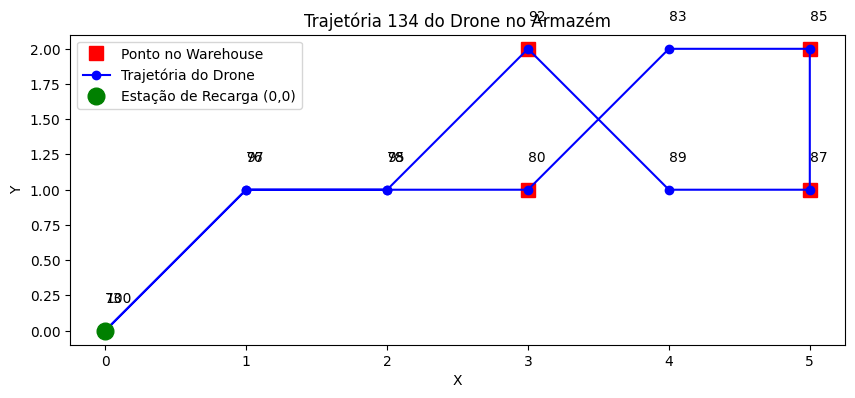


Trajetória 135:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 2), Bateria 83
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 0), Bateria 77
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


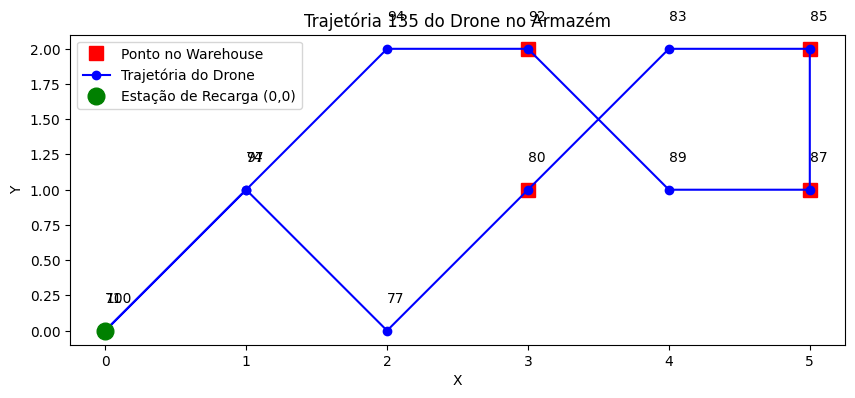


Trajetória 136:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 2), Bateria 83
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 2), Bateria 77
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


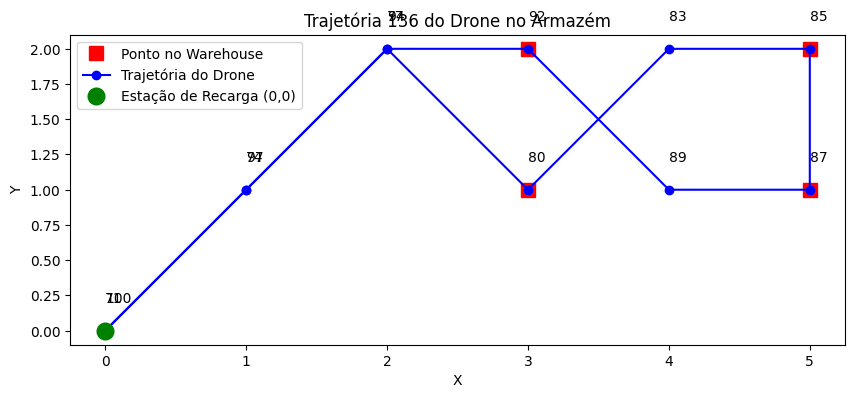


Trajetória 137:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 2), Bateria 83
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 0), Bateria 77
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


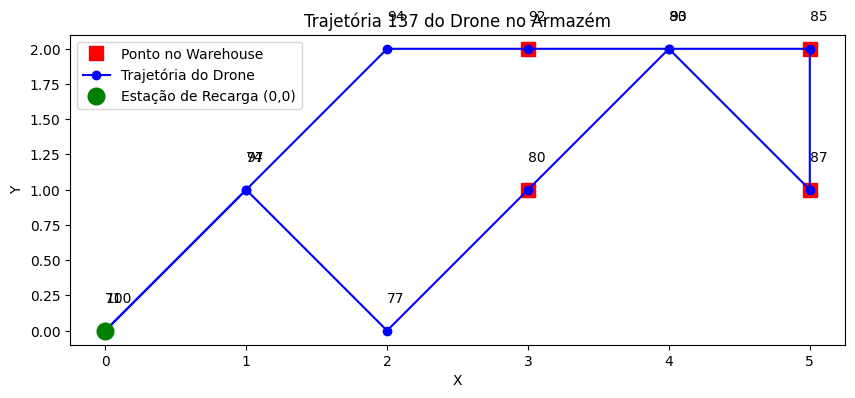


Trajetória 138:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 2), Bateria 83
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 2), Bateria 77
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


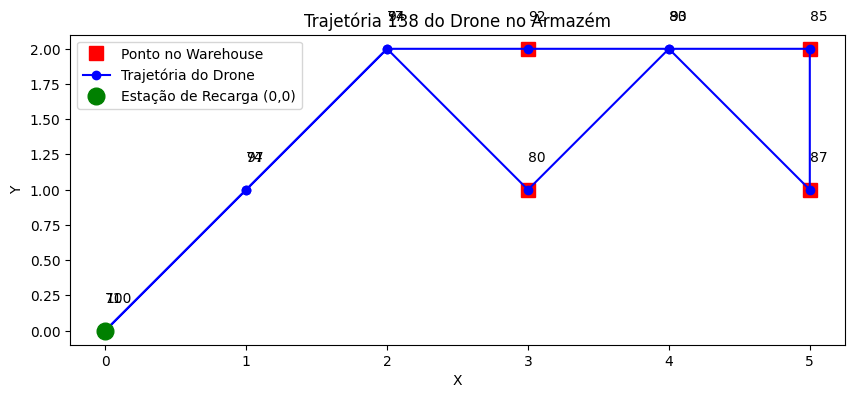


Trajetória 139:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 2), Bateria 83
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 0), Bateria 77
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


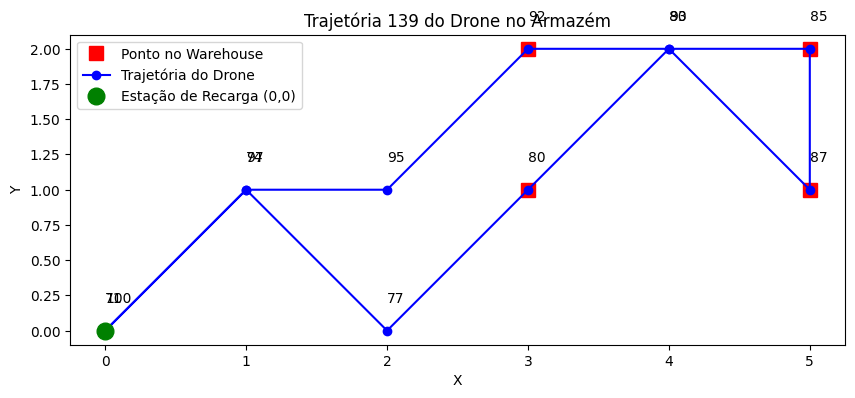


Trajetória 140:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 2), Bateria 83
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 2), Bateria 77
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


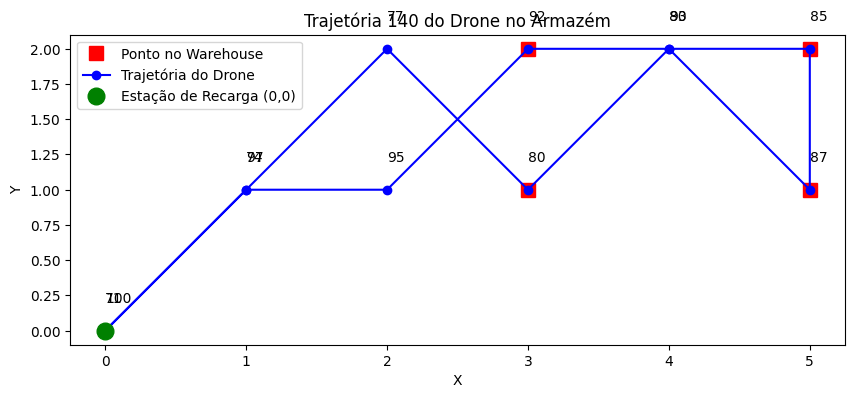


Trajetória 141:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 2), Bateria 83
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 0), Bateria 77
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


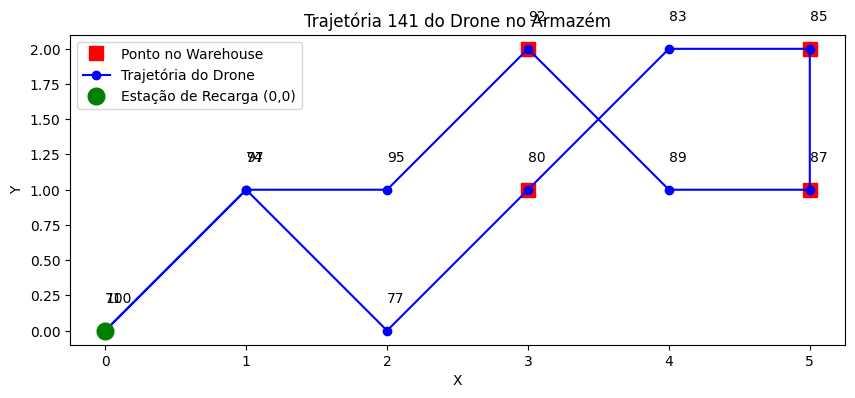


Trajetória 142:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 2), Bateria 83
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 2), Bateria 77
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


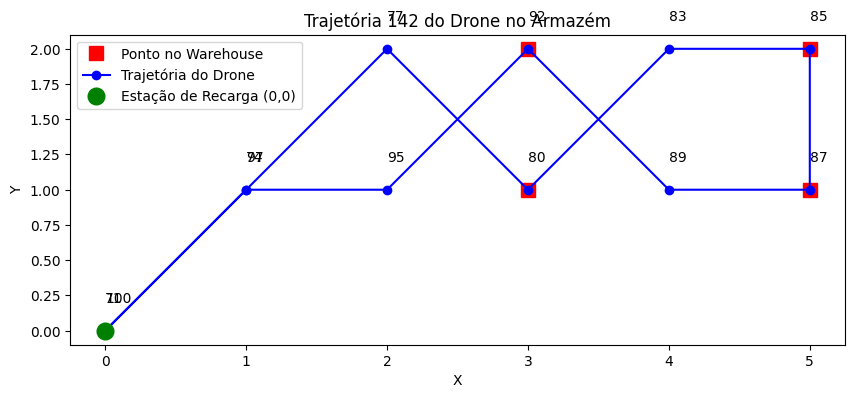


Trajetória 143:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 2), Bateria 83
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 1), Bateria 76
Passo 11: Posição (0, 0), Bateria 73


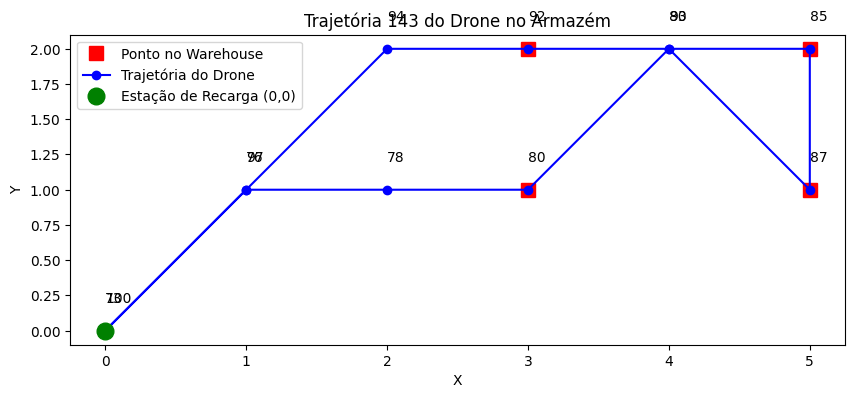


Trajetória 144:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 2), Bateria 83
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 1), Bateria 76
Passo 11: Posição (0, 0), Bateria 73


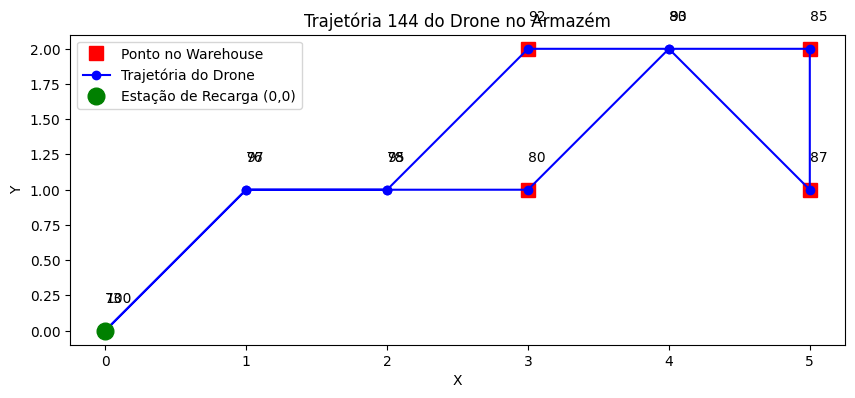


Trajetória 145:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 2), Bateria 83
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 0), Bateria 77
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


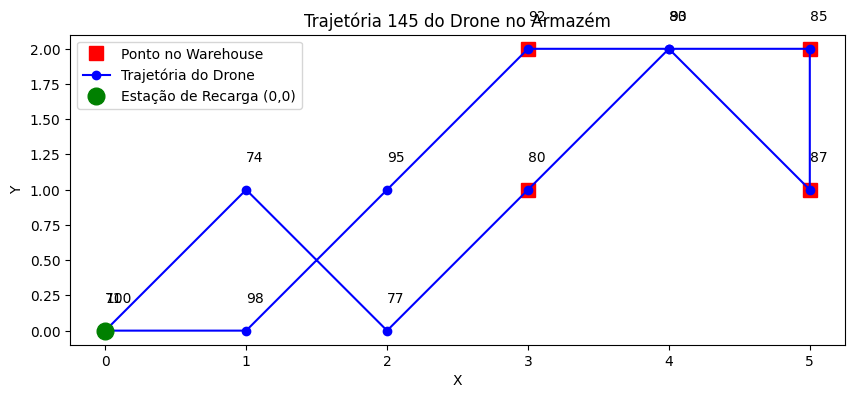


Trajetória 146:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 2), Bateria 83
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 2), Bateria 77
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


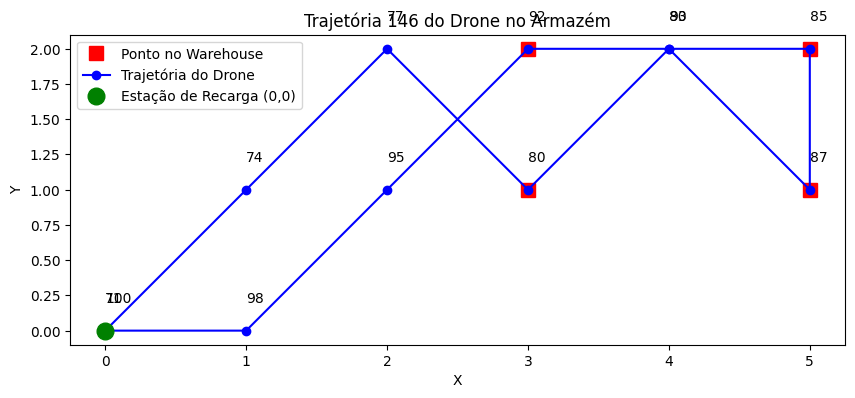


Trajetória 147:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 2), Bateria 83
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 1), Bateria 76
Passo 11: Posição (0, 0), Bateria 73


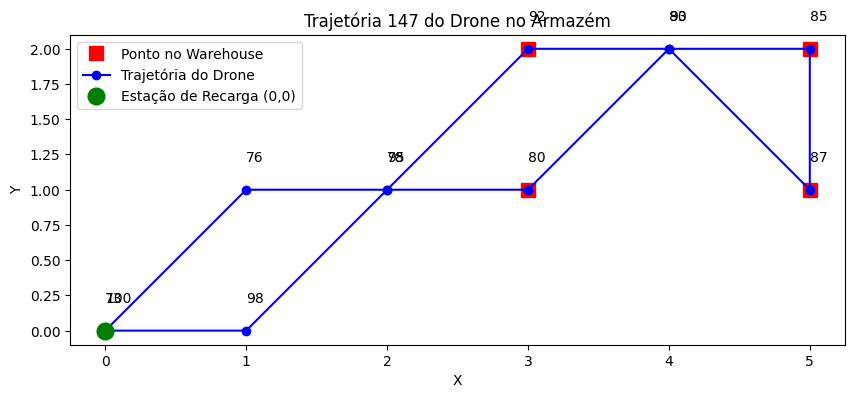


Trajetória 148:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 3), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 0), Bateria 81
Passo 8: Posição (3, 1), Bateria 78
Passo 9: Posição (2, 0), Bateria 75
Passo 10: Posição (1, 0), Bateria 73
Passo 11: Posição (0, 0), Bateria 71


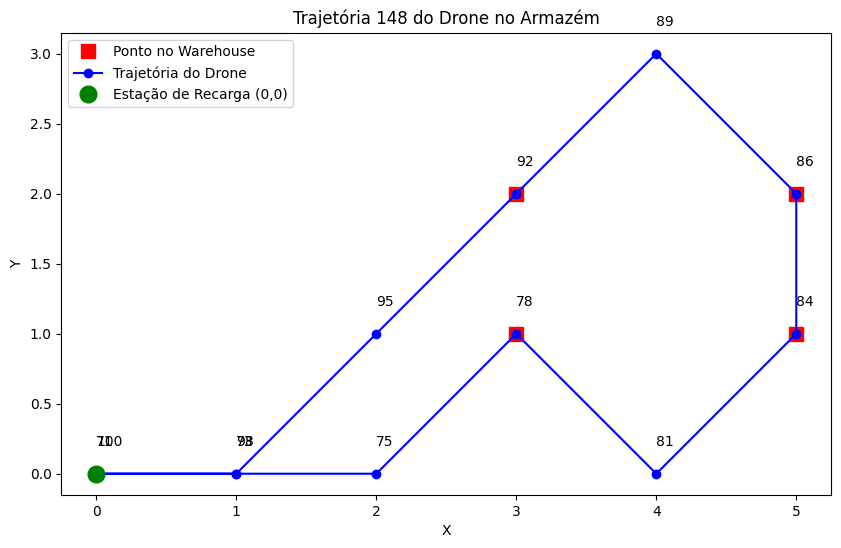


Trajetória 149:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 0), Bateria 81
Passo 8: Posição (3, 1), Bateria 78
Passo 9: Posição (2, 0), Bateria 75
Passo 10: Posição (1, 0), Bateria 73
Passo 11: Posição (0, 0), Bateria 71


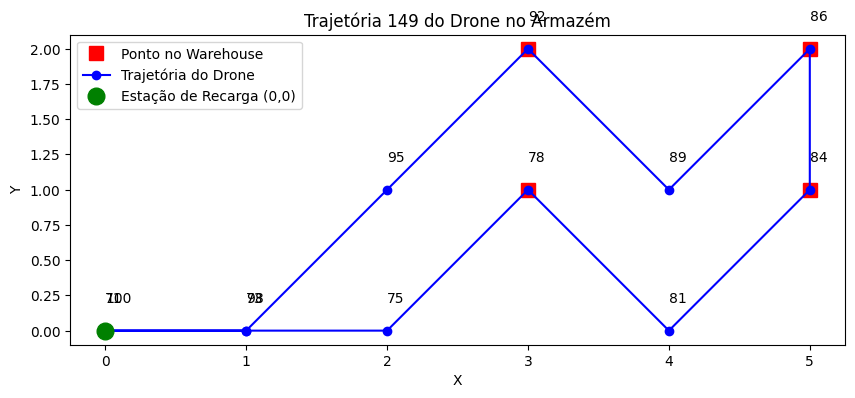


Trajetória 150:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 3), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 2), Bateria 81
Passo 8: Posição (3, 1), Bateria 78
Passo 9: Posição (2, 0), Bateria 75
Passo 10: Posição (1, 0), Bateria 73
Passo 11: Posição (0, 0), Bateria 71


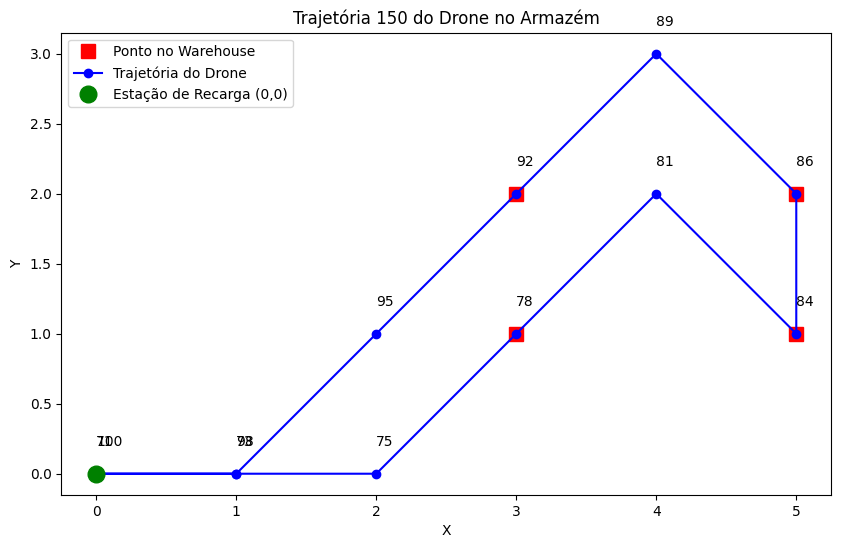


Trajetória 151:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 2), Bateria 81
Passo 8: Posição (3, 1), Bateria 78
Passo 9: Posição (2, 0), Bateria 75
Passo 10: Posição (1, 0), Bateria 73
Passo 11: Posição (0, 0), Bateria 71


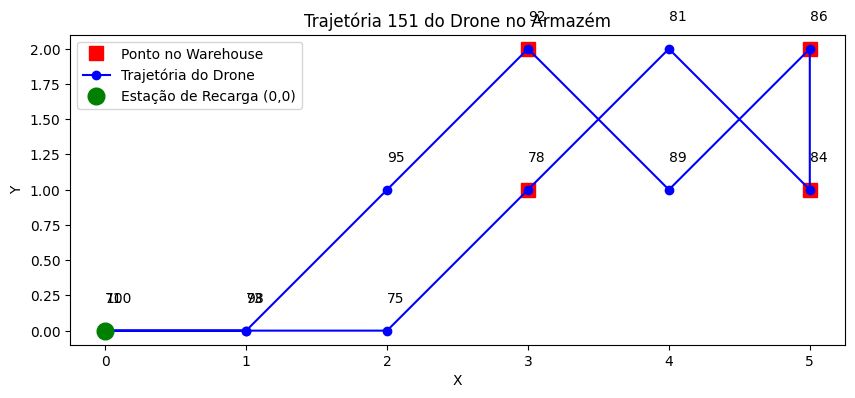


Trajetória 152:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 2), Bateria 83
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 0), Bateria 77
Passo 10: Posição (1, 0), Bateria 75
Passo 11: Posição (0, 0), Bateria 73


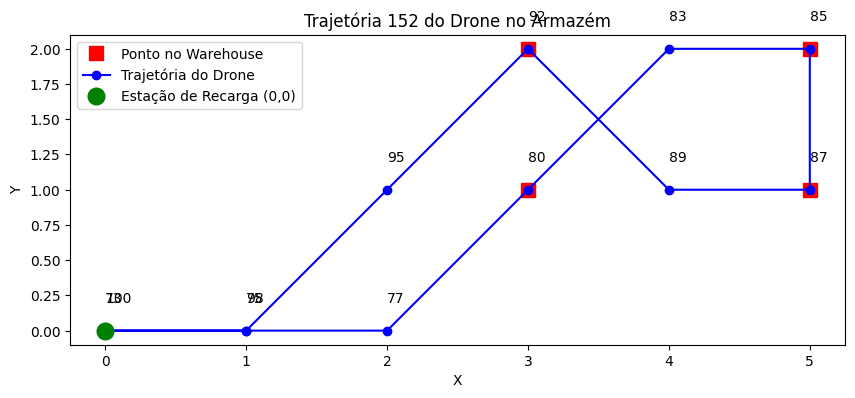


Trajetória 153:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 3), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 2), Bateria 81
Passo 8: Posição (3, 1), Bateria 78
Passo 9: Posição (2, 1), Bateria 76
Passo 10: Posição (1, 0), Bateria 73
Passo 11: Posição (0, 0), Bateria 71


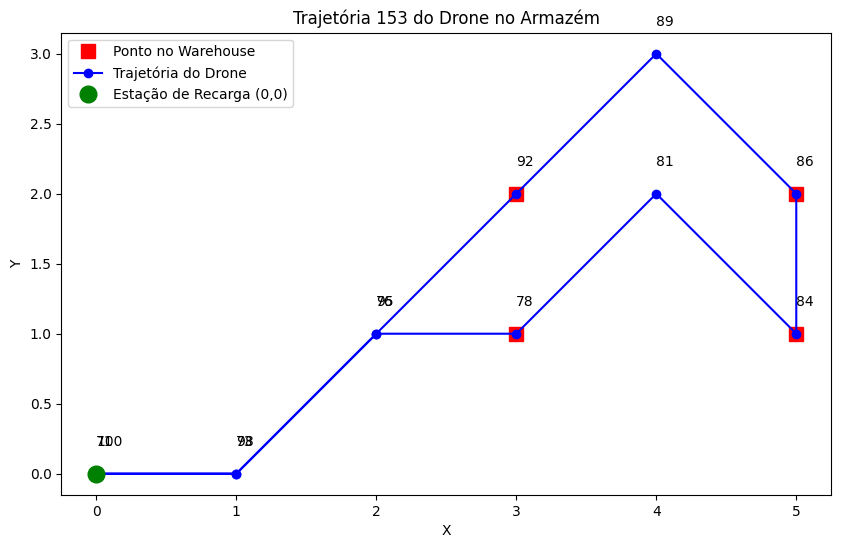


Trajetória 154:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 2), Bateria 81
Passo 8: Posição (3, 1), Bateria 78
Passo 9: Posição (2, 1), Bateria 76
Passo 10: Posição (1, 0), Bateria 73
Passo 11: Posição (0, 0), Bateria 71


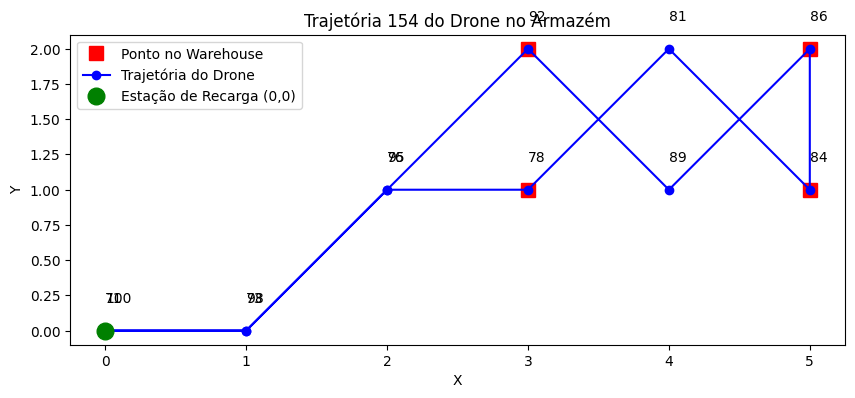


Trajetória 155:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 2), Bateria 83
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 0), Bateria 75
Passo 11: Posição (0, 0), Bateria 73


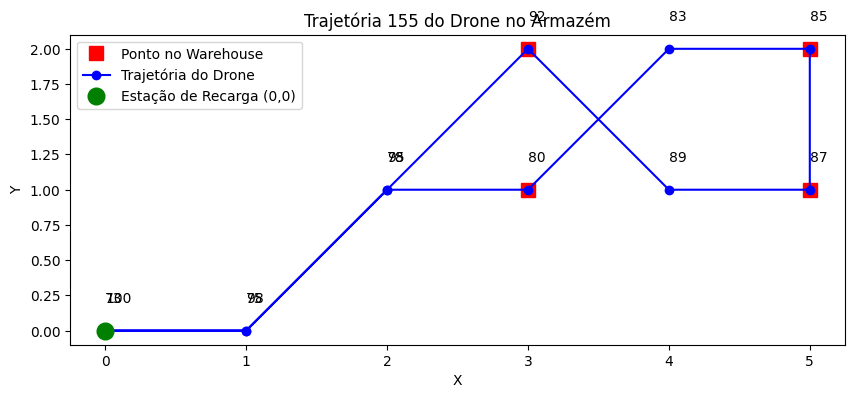


Trajetória 156:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 2), Bateria 83
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 0), Bateria 75
Passo 11: Posição (0, 0), Bateria 73


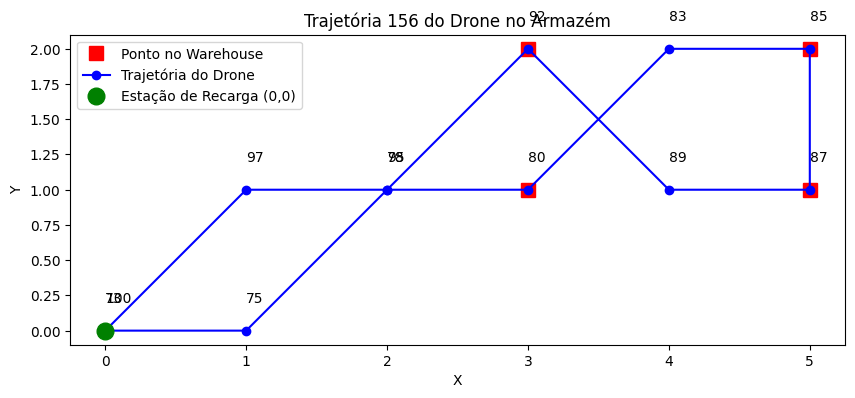


Trajetória 157:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 3), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 2), Bateria 81
Passo 8: Posição (3, 1), Bateria 78
Passo 9: Posição (2, 1), Bateria 76
Passo 10: Posição (1, 0), Bateria 73
Passo 11: Posição (0, 0), Bateria 71


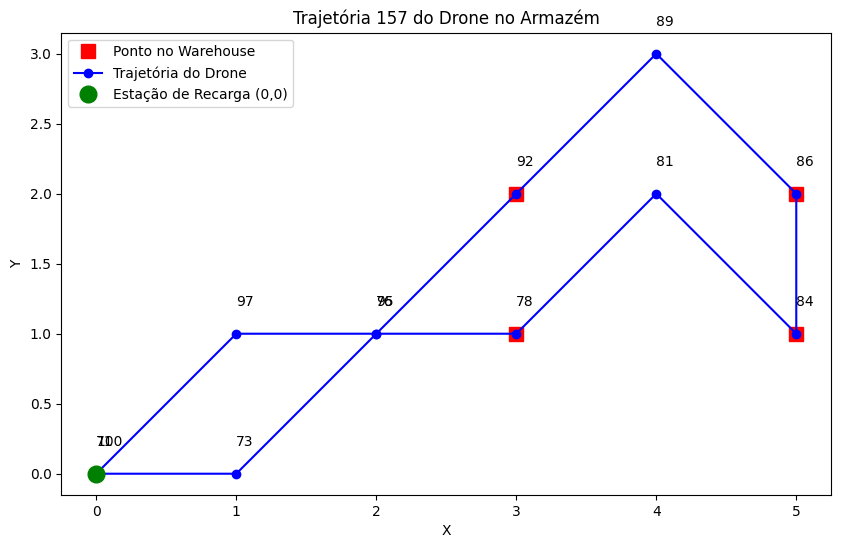


Trajetória 158:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 2), Bateria 81
Passo 8: Posição (3, 1), Bateria 78
Passo 9: Posição (2, 1), Bateria 76
Passo 10: Posição (1, 0), Bateria 73
Passo 11: Posição (0, 0), Bateria 71


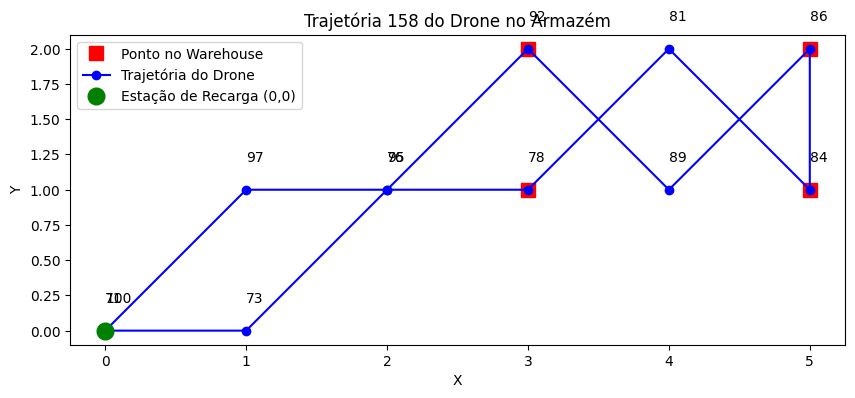


Trajetória 159:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 3), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 2), Bateria 81
Passo 8: Posição (3, 1), Bateria 78
Passo 9: Posição (2, 0), Bateria 75
Passo 10: Posição (1, 0), Bateria 73
Passo 11: Posição (0, 0), Bateria 71


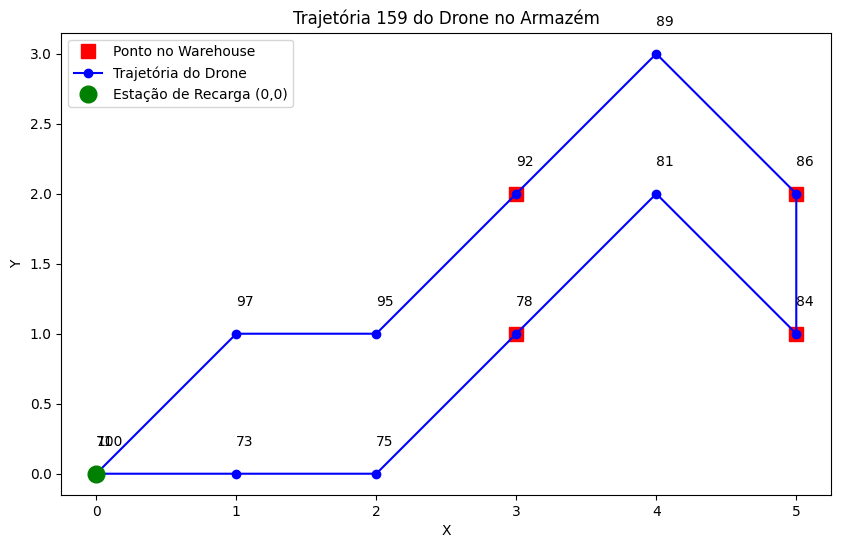


Trajetória 160:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 2), Bateria 81
Passo 8: Posição (3, 1), Bateria 78
Passo 9: Posição (2, 0), Bateria 75
Passo 10: Posição (1, 0), Bateria 73
Passo 11: Posição (0, 0), Bateria 71


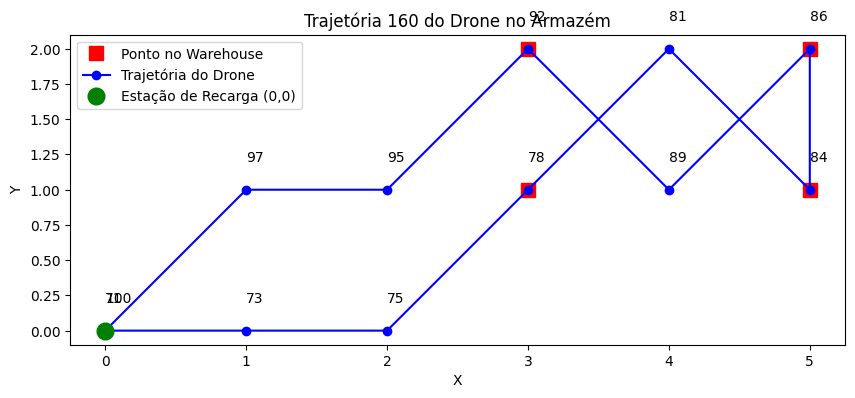


Trajetória 161:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 2), Bateria 83
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 0), Bateria 77
Passo 10: Posição (1, 0), Bateria 75
Passo 11: Posição (0, 0), Bateria 73


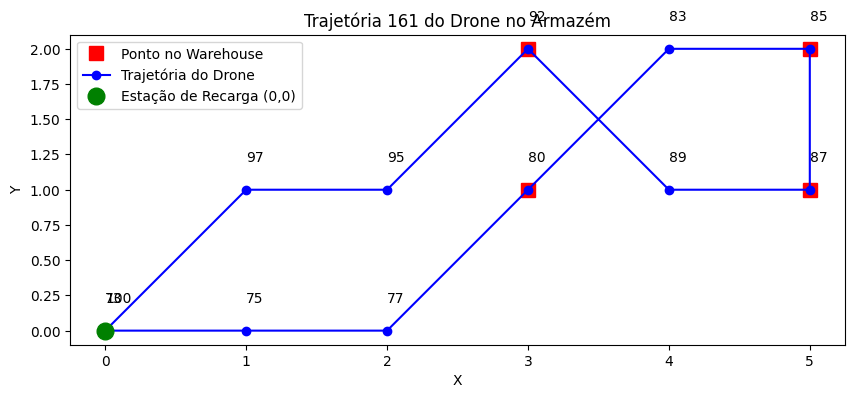


Trajetória 162:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 2), Bateria 83
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 0), Bateria 75
Passo 11: Posição (0, 0), Bateria 73


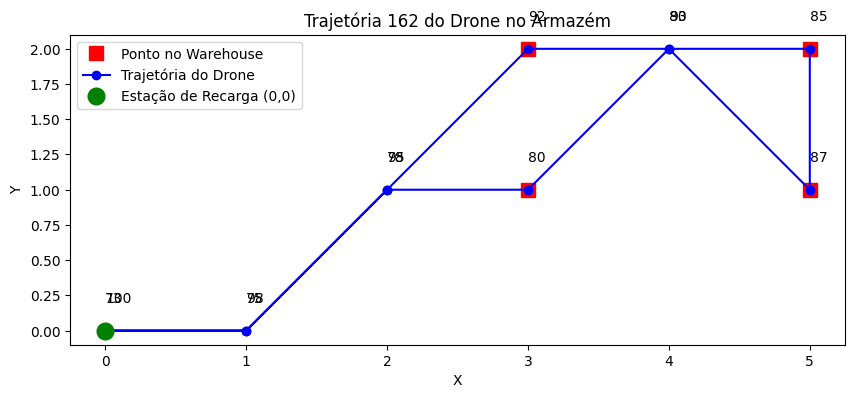


Trajetória 163:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 2), Bateria 88
Passo 6: Posição (5, 1), Bateria 86
Passo 7: Posição (4, 2), Bateria 83
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 0), Bateria 75
Passo 11: Posição (0, 0), Bateria 73


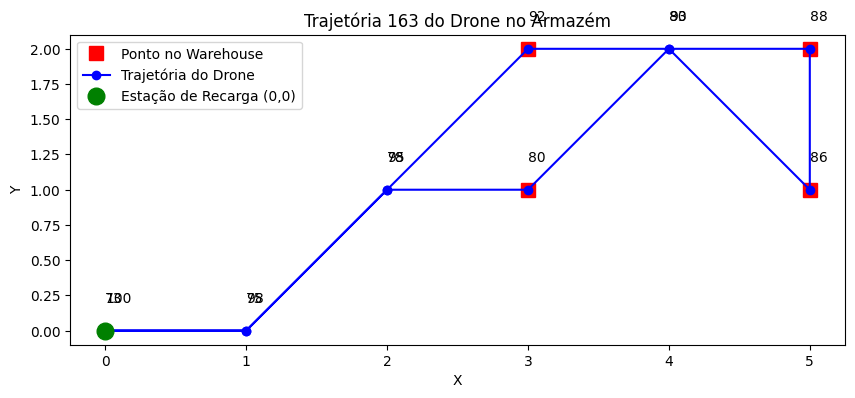


Trajetória 164:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 2), Bateria 88
Passo 6: Posição (5, 1), Bateria 86
Passo 7: Posição (4, 2), Bateria 83
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 0), Bateria 77
Passo 10: Posição (1, 0), Bateria 75
Passo 11: Posição (0, 0), Bateria 73


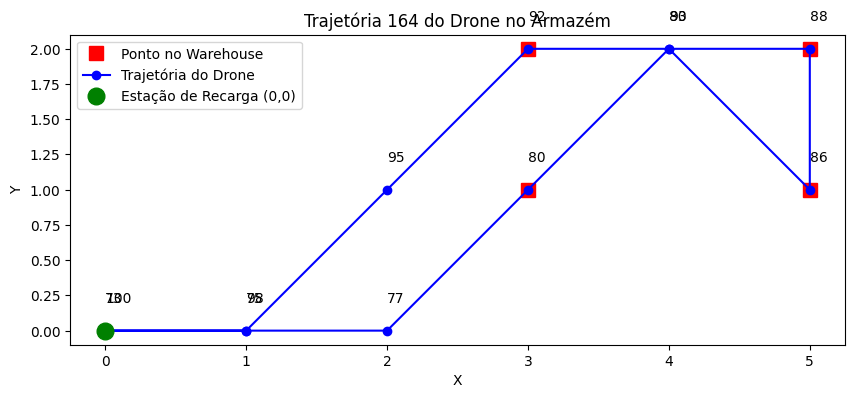


Trajetória 165:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 2), Bateria 88
Passo 6: Posição (5, 1), Bateria 86
Passo 7: Posição (4, 2), Bateria 83
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 0), Bateria 77
Passo 10: Posição (1, 0), Bateria 75
Passo 11: Posição (0, 0), Bateria 73


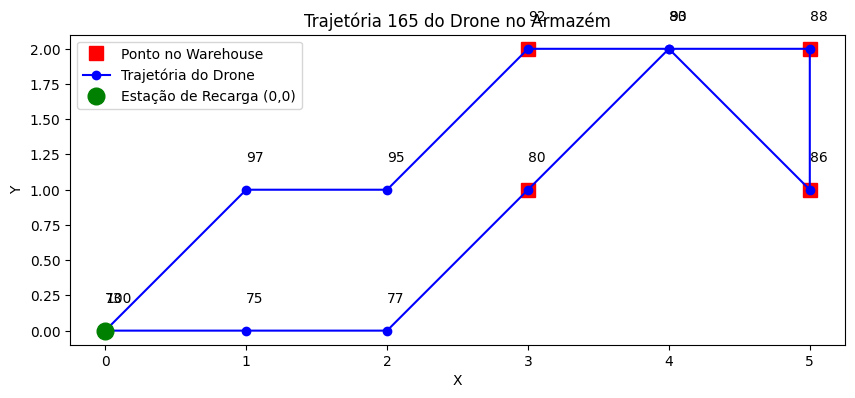


Trajetória 166:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 2), Bateria 88
Passo 6: Posição (5, 1), Bateria 86
Passo 7: Posição (4, 2), Bateria 83
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 0), Bateria 75
Passo 11: Posição (0, 0), Bateria 73


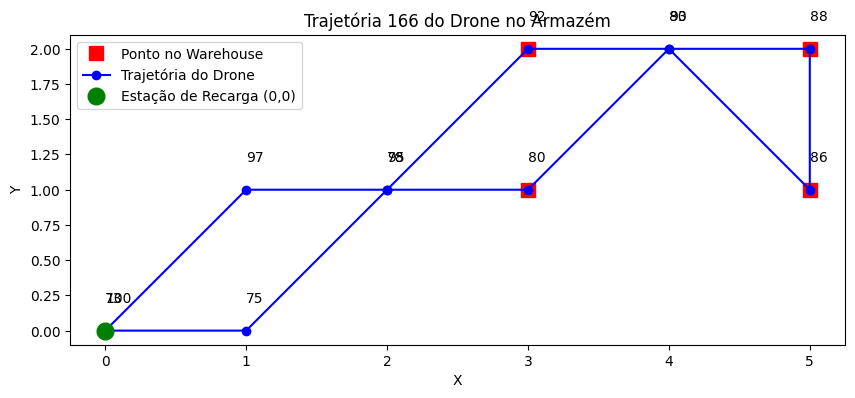


Trajetória 167:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 2), Bateria 83
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 0), Bateria 77
Passo 10: Posição (1, 0), Bateria 75
Passo 11: Posição (0, 0), Bateria 73


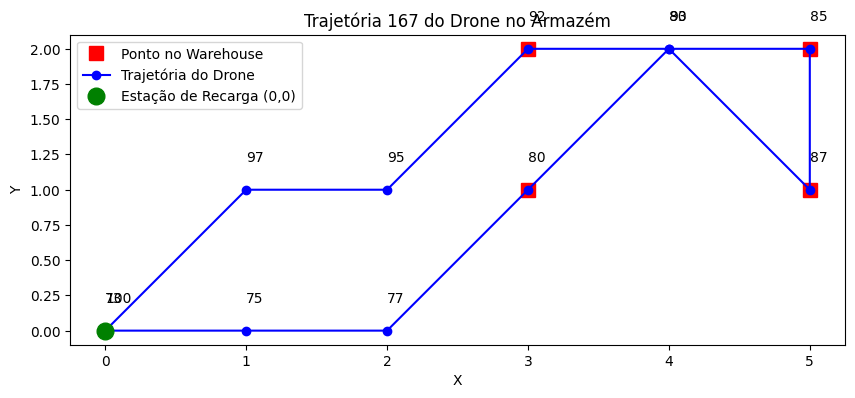


Trajetória 168:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 2), Bateria 83
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 0), Bateria 75
Passo 11: Posição (0, 0), Bateria 73


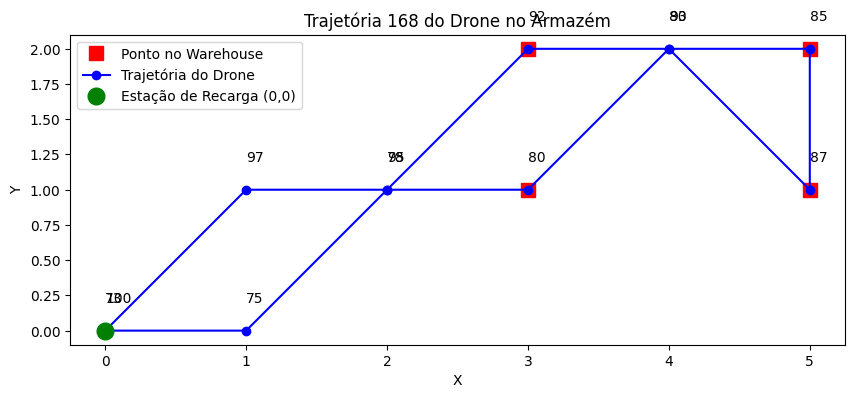


Trajetória 169:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 2), Bateria 83
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 0), Bateria 77
Passo 10: Posição (1, 0), Bateria 75
Passo 11: Posição (0, 0), Bateria 73


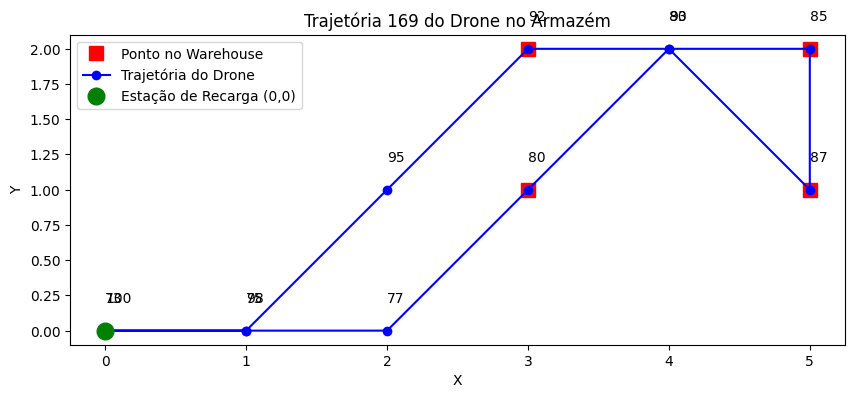


Trajetória 170:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 3), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 2), Bateria 81
Passo 8: Posição (3, 1), Bateria 78
Passo 9: Posição (2, 0), Bateria 75
Passo 10: Posição (1, 0), Bateria 73
Passo 11: Posição (0, 0), Bateria 71


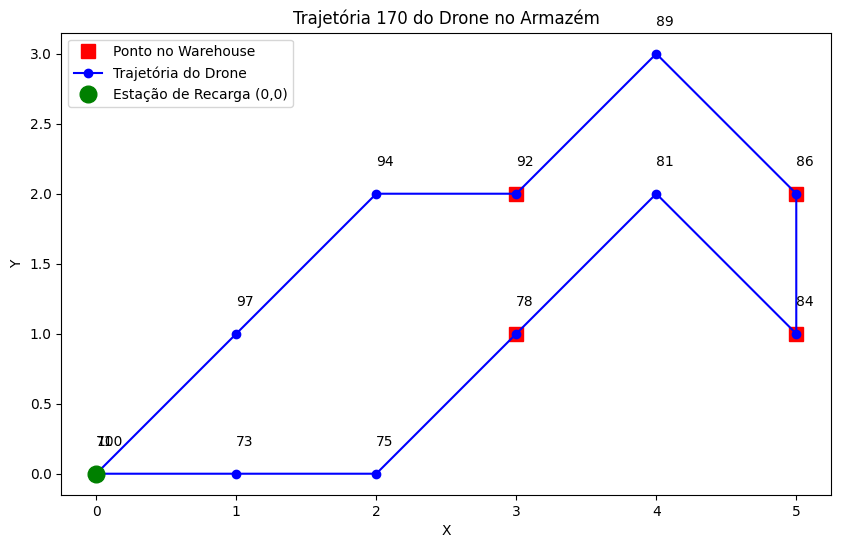


Trajetória 171:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 2), Bateria 81
Passo 8: Posição (3, 1), Bateria 78
Passo 9: Posição (2, 0), Bateria 75
Passo 10: Posição (1, 0), Bateria 73
Passo 11: Posição (0, 0), Bateria 71


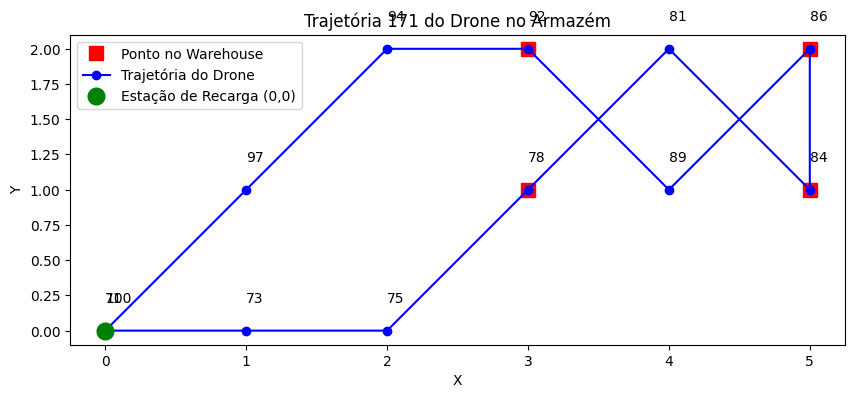


Trajetória 172:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 2), Bateria 83
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 0), Bateria 77
Passo 10: Posição (1, 0), Bateria 75
Passo 11: Posição (0, 0), Bateria 73


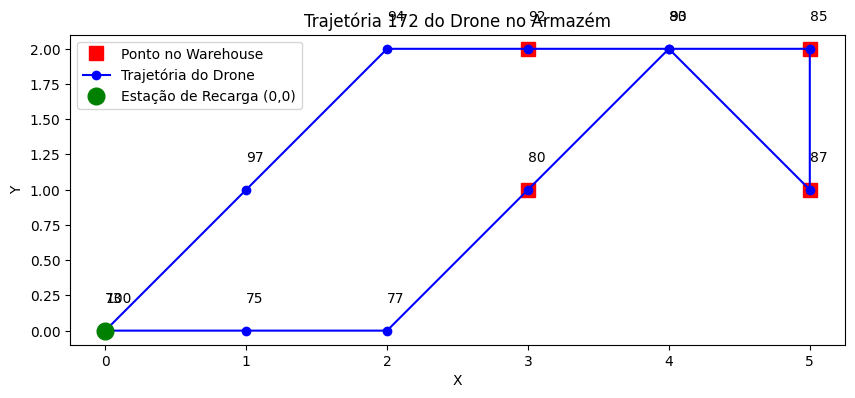


Trajetória 173:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 2), Bateria 83
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 0), Bateria 75
Passo 11: Posição (0, 0), Bateria 73


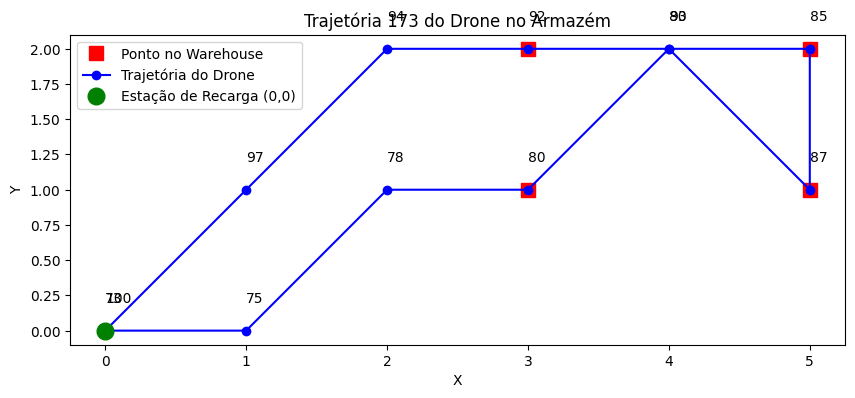


Trajetória 174:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 3), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 2), Bateria 81
Passo 8: Posição (3, 1), Bateria 78
Passo 9: Posição (2, 1), Bateria 76
Passo 10: Posição (1, 0), Bateria 73
Passo 11: Posição (0, 0), Bateria 71


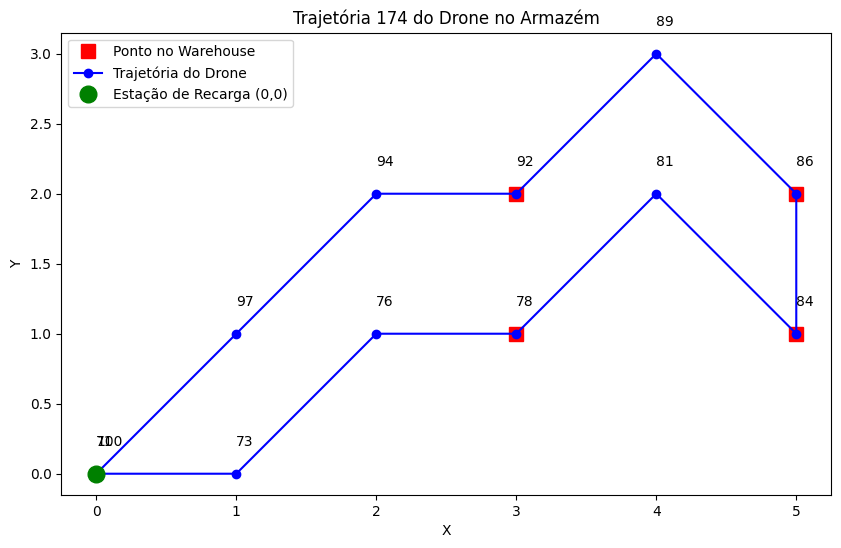


Trajetória 175:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 2), Bateria 81
Passo 8: Posição (3, 1), Bateria 78
Passo 9: Posição (2, 1), Bateria 76
Passo 10: Posição (1, 0), Bateria 73
Passo 11: Posição (0, 0), Bateria 71


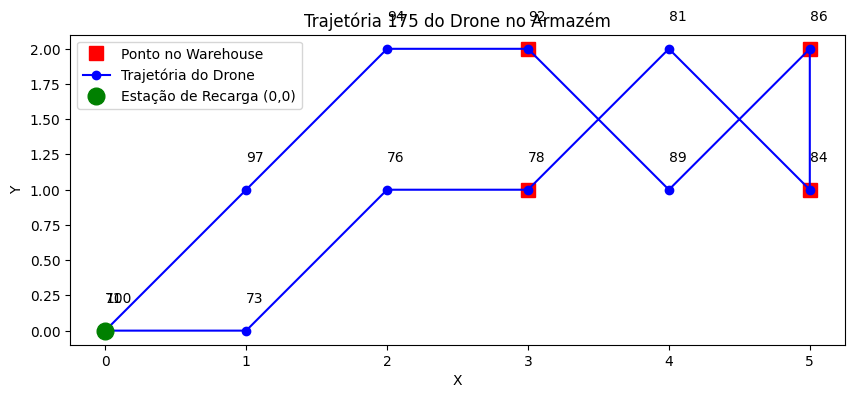


Trajetória 176:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 2), Bateria 83
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 0), Bateria 77
Passo 10: Posição (1, 0), Bateria 75
Passo 11: Posição (0, 0), Bateria 73


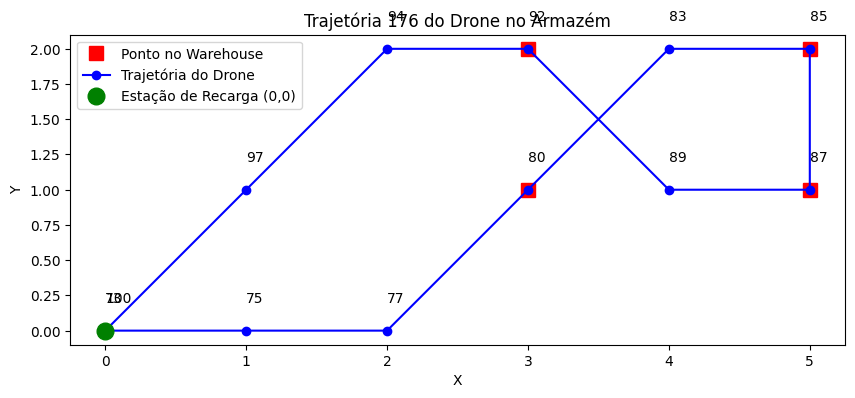


Trajetória 177:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 2), Bateria 83
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 0), Bateria 75
Passo 11: Posição (0, 0), Bateria 73


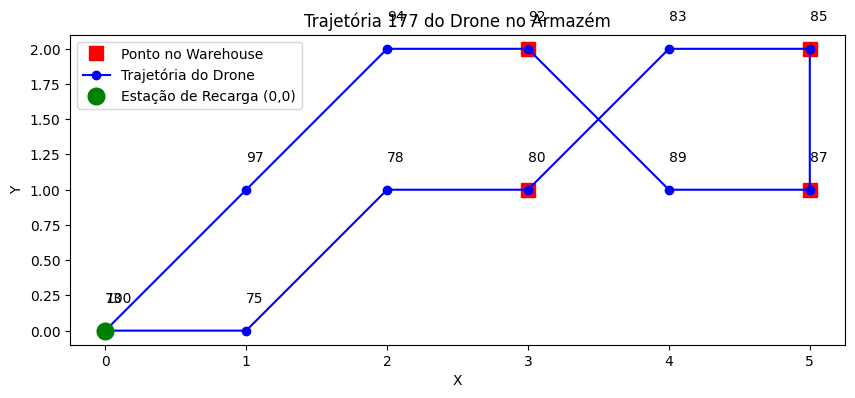


Trajetória 178:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 2), Bateria 88
Passo 6: Posição (5, 1), Bateria 86
Passo 7: Posição (4, 2), Bateria 83
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 0), Bateria 75
Passo 11: Posição (0, 0), Bateria 73


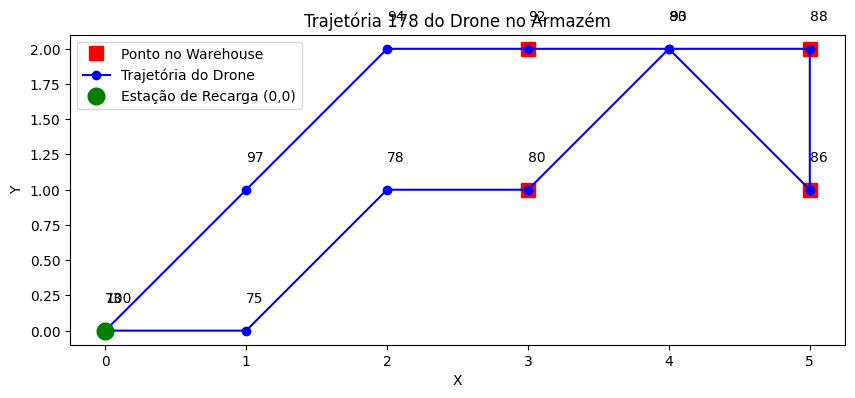


Trajetória 179:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 2), Bateria 88
Passo 6: Posição (5, 1), Bateria 86
Passo 7: Posição (4, 2), Bateria 83
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 0), Bateria 77
Passo 10: Posição (1, 0), Bateria 75
Passo 11: Posição (0, 0), Bateria 73


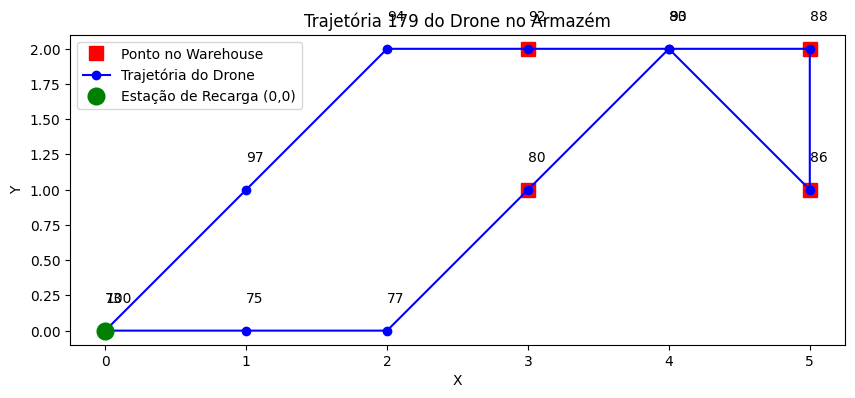


Trajetória 180:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 3), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 0), Bateria 81
Passo 8: Posição (3, 1), Bateria 78
Passo 9: Posição (2, 1), Bateria 76
Passo 10: Posição (1, 0), Bateria 73
Passo 11: Posição (0, 0), Bateria 71


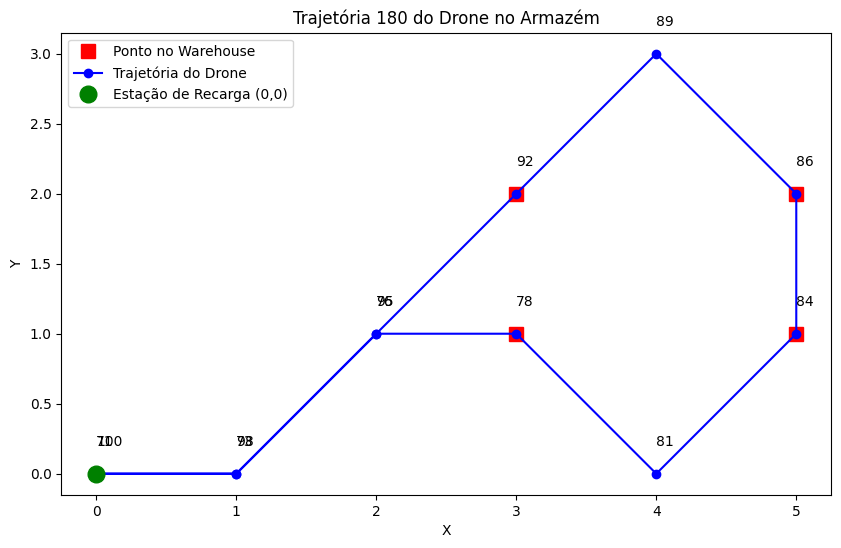


Trajetória 181:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 0), Bateria 81
Passo 8: Posição (3, 1), Bateria 78
Passo 9: Posição (2, 1), Bateria 76
Passo 10: Posição (1, 0), Bateria 73
Passo 11: Posição (0, 0), Bateria 71


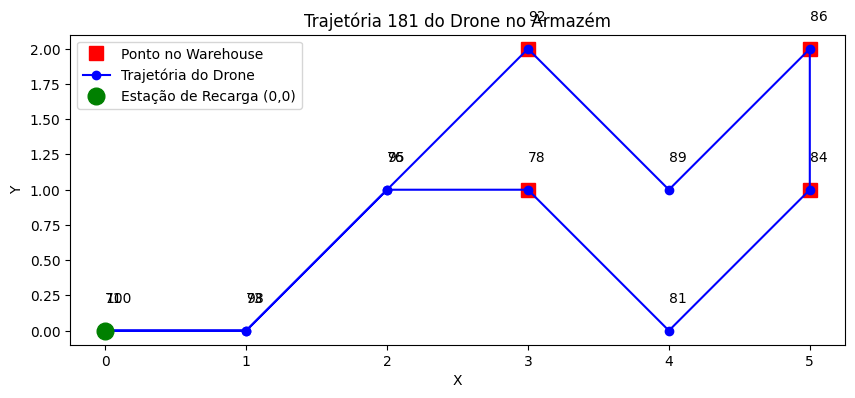


Trajetória 182:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 3), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 0), Bateria 81
Passo 8: Posição (3, 1), Bateria 78
Passo 9: Posição (2, 1), Bateria 76
Passo 10: Posição (1, 0), Bateria 73
Passo 11: Posição (0, 0), Bateria 71


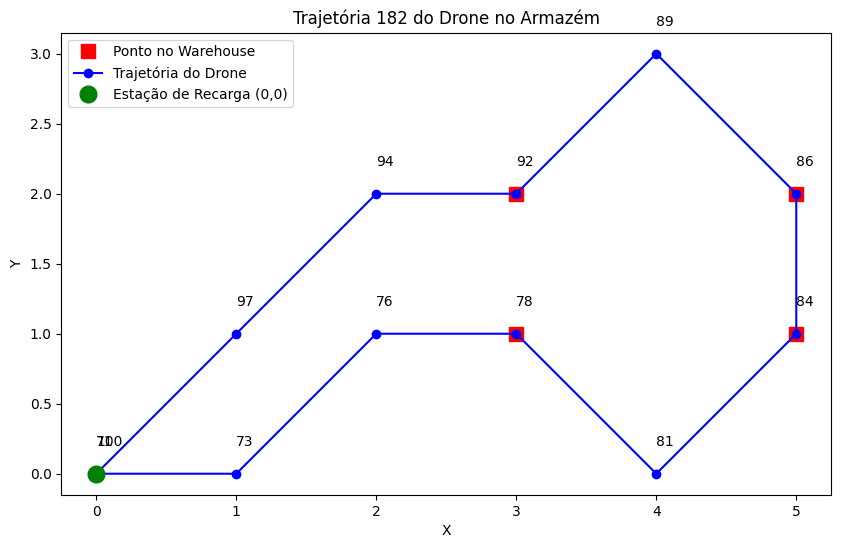


Trajetória 183:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 0), Bateria 81
Passo 8: Posição (3, 1), Bateria 78
Passo 9: Posição (2, 1), Bateria 76
Passo 10: Posição (1, 0), Bateria 73
Passo 11: Posição (0, 0), Bateria 71


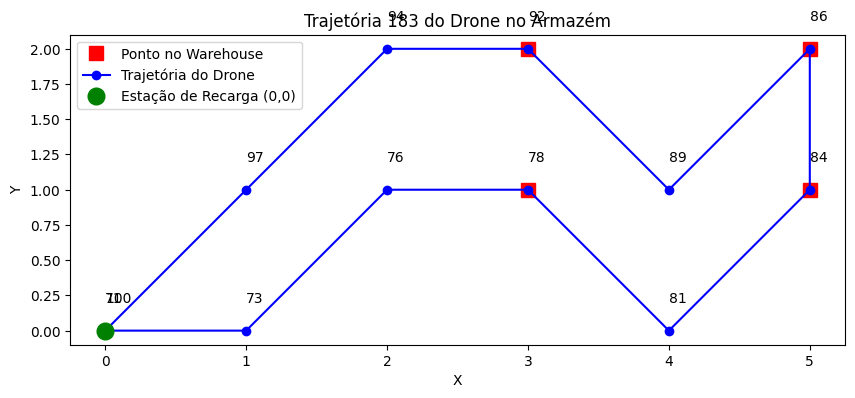


Trajetória 184:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 3), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 0), Bateria 81
Passo 8: Posição (3, 1), Bateria 78
Passo 9: Posição (2, 1), Bateria 76
Passo 10: Posição (1, 0), Bateria 73
Passo 11: Posição (0, 0), Bateria 71


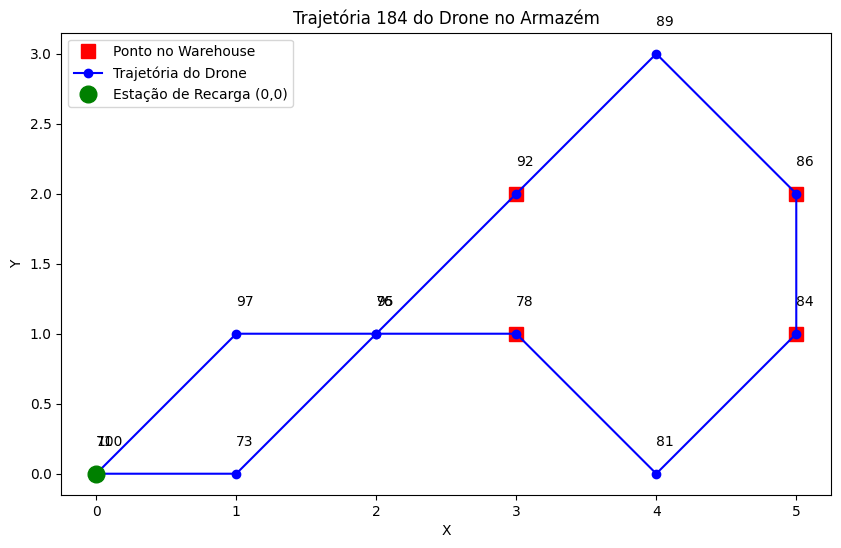


Trajetória 185:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 0), Bateria 81
Passo 8: Posição (3, 1), Bateria 78
Passo 9: Posição (2, 1), Bateria 76
Passo 10: Posição (1, 0), Bateria 73
Passo 11: Posição (0, 0), Bateria 71


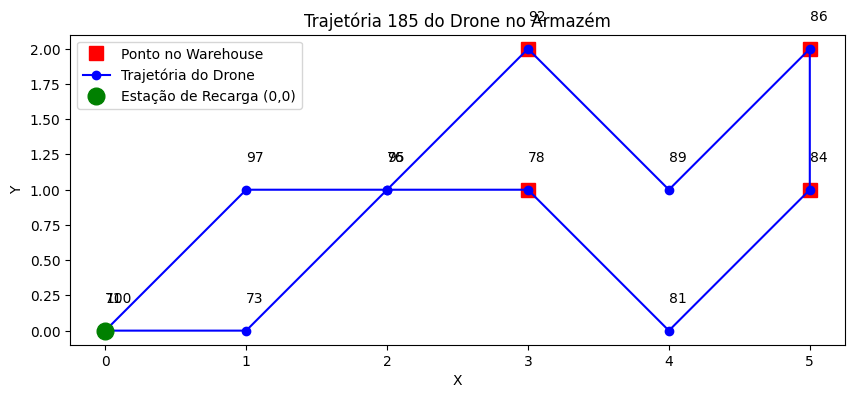


Trajetória 186:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 3), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 0), Bateria 81
Passo 8: Posição (3, 1), Bateria 78
Passo 9: Posição (2, 0), Bateria 75
Passo 10: Posição (1, 0), Bateria 73
Passo 11: Posição (0, 0), Bateria 71


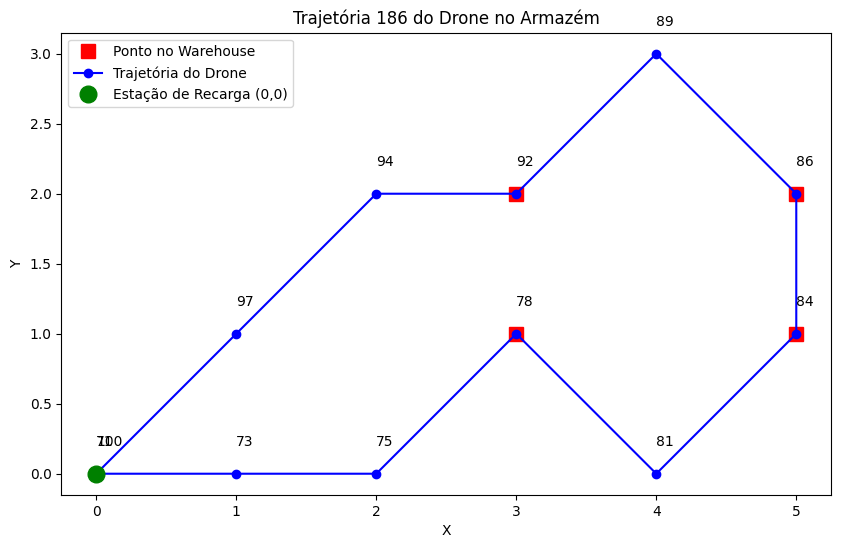


Trajetória 187:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 0), Bateria 81
Passo 8: Posição (3, 1), Bateria 78
Passo 9: Posição (2, 0), Bateria 75
Passo 10: Posição (1, 0), Bateria 73
Passo 11: Posição (0, 0), Bateria 71


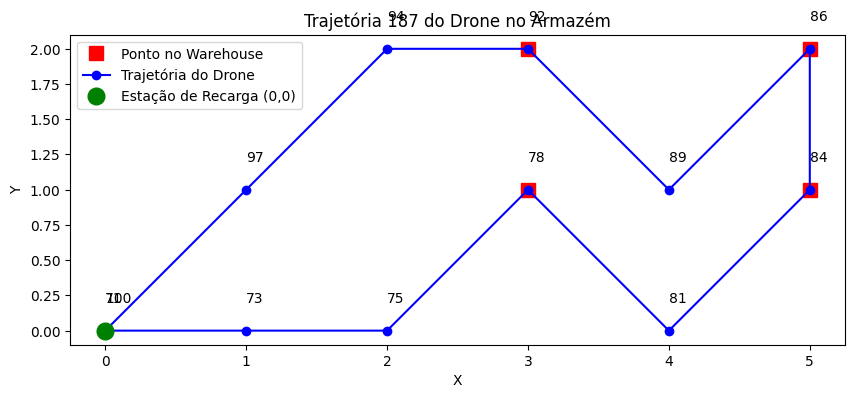


Trajetória 188:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 3), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 0), Bateria 81
Passo 8: Posição (3, 1), Bateria 78
Passo 9: Posição (2, 0), Bateria 75
Passo 10: Posição (1, 0), Bateria 73
Passo 11: Posição (0, 0), Bateria 71


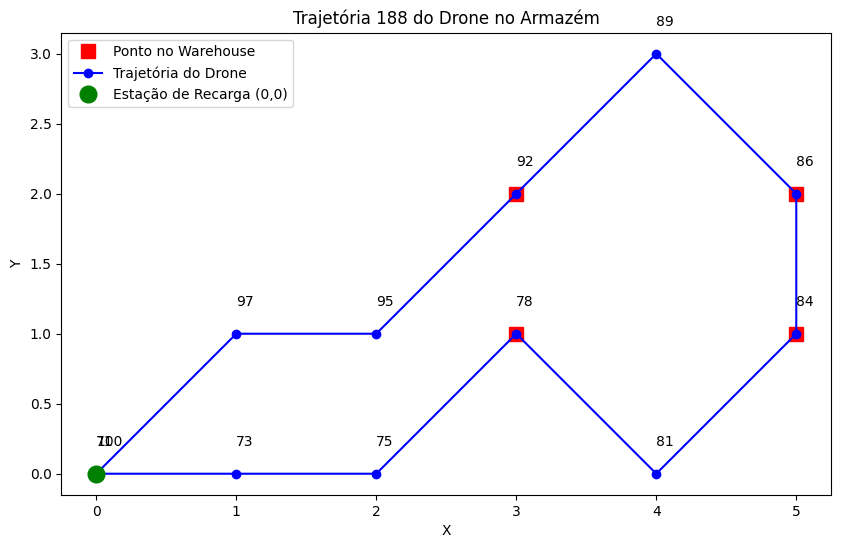


Trajetória 189:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 0), Bateria 81
Passo 8: Posição (3, 1), Bateria 78
Passo 9: Posição (2, 0), Bateria 75
Passo 10: Posição (1, 0), Bateria 73
Passo 11: Posição (0, 0), Bateria 71


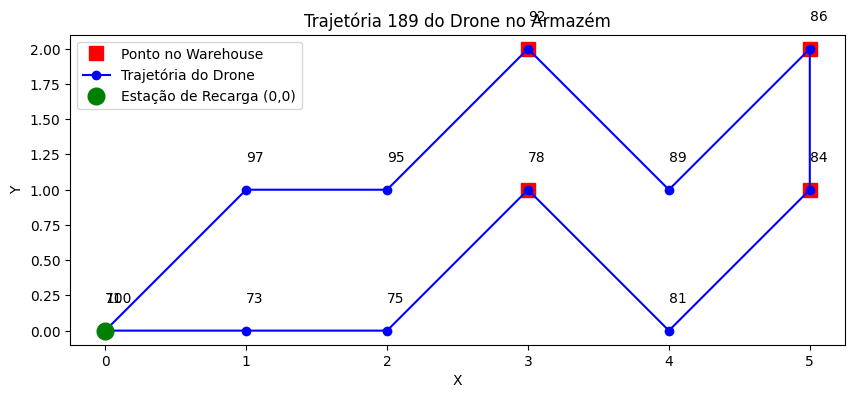


Trajetória 190:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 2), Bateria 88
Passo 6: Posição (5, 1), Bateria 86
Passo 7: Posição (4, 0), Bateria 83
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 0), Bateria 77
Passo 10: Posição (1, 0), Bateria 75
Passo 11: Posição (0, 0), Bateria 73


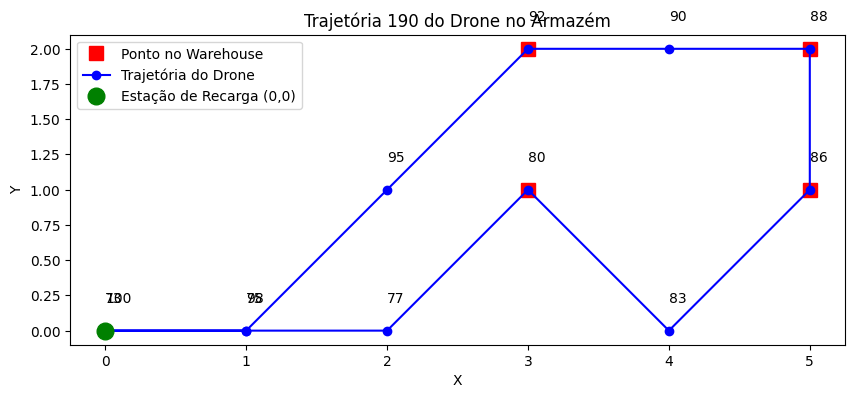


Trajetória 191:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 2), Bateria 88
Passo 6: Posição (5, 1), Bateria 86
Passo 7: Posição (4, 0), Bateria 83
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 0), Bateria 75
Passo 11: Posição (0, 0), Bateria 73


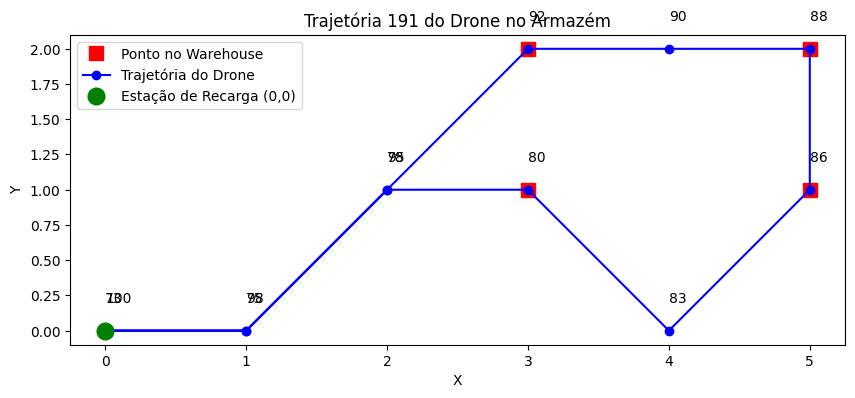


Trajetória 192:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 2), Bateria 88
Passo 6: Posição (5, 1), Bateria 86
Passo 7: Posição (4, 0), Bateria 83
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 0), Bateria 77
Passo 10: Posição (1, 0), Bateria 75
Passo 11: Posição (0, 0), Bateria 73


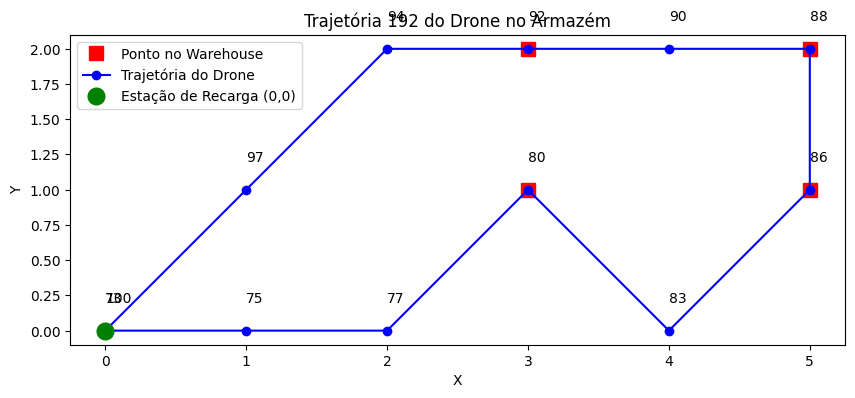


Trajetória 193:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 2), Bateria 88
Passo 6: Posição (5, 1), Bateria 86
Passo 7: Posição (4, 0), Bateria 83
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 0), Bateria 77
Passo 10: Posição (1, 0), Bateria 75
Passo 11: Posição (0, 0), Bateria 73


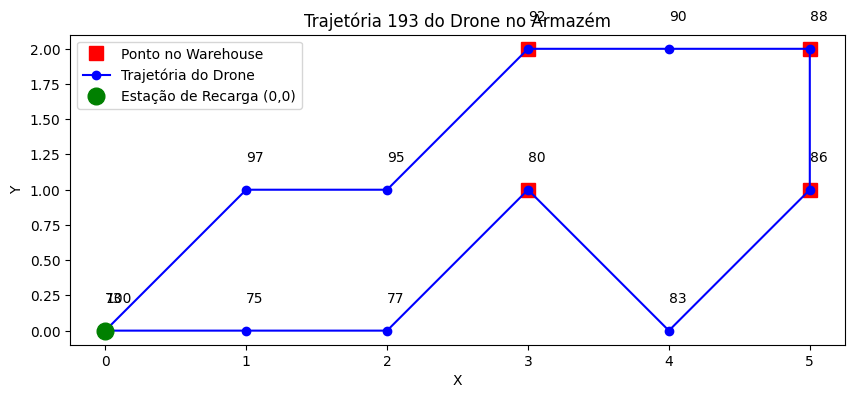


Trajetória 194:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 2), Bateria 88
Passo 6: Posição (5, 1), Bateria 86
Passo 7: Posição (4, 0), Bateria 83
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 0), Bateria 75
Passo 11: Posição (0, 0), Bateria 73


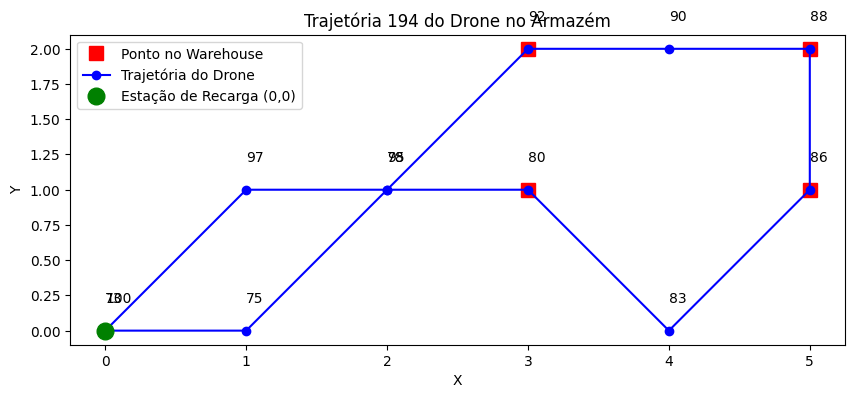


Trajetória 195:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 2), Bateria 92
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 2), Bateria 88
Passo 6: Posição (5, 1), Bateria 86
Passo 7: Posição (4, 0), Bateria 83
Passo 8: Posição (3, 1), Bateria 80
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 0), Bateria 75
Passo 11: Posição (0, 0), Bateria 73


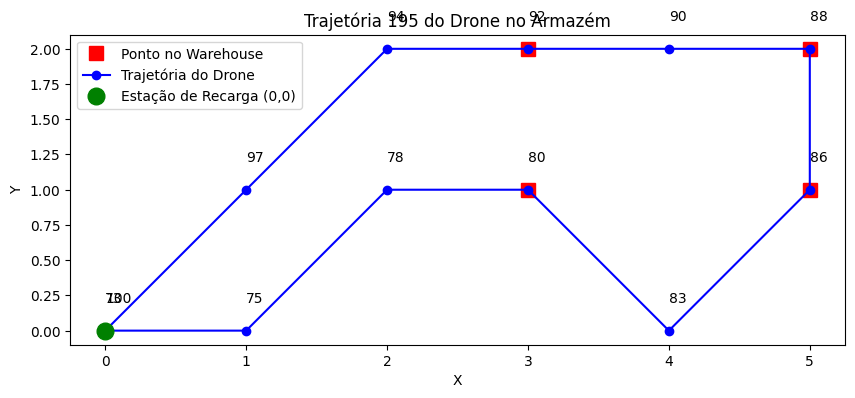


Trajetória 196:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 1), Bateria 91
Passo 5: Posição (5, 2), Bateria 88
Passo 6: Posição (5, 1), Bateria 86
Passo 7: Posição (4, 2), Bateria 83
Passo 8: Posição (3, 2), Bateria 81
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 1), Bateria 76
Passo 11: Posição (0, 0), Bateria 73


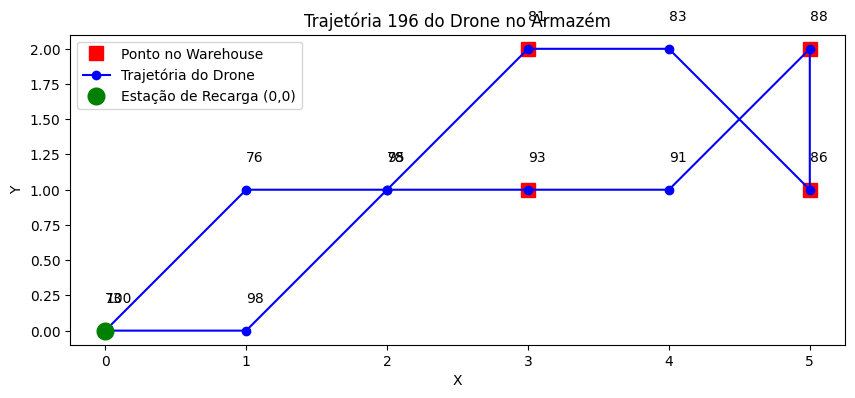


Trajetória 197:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 1), Bateria 91
Passo 5: Posição (5, 2), Bateria 88
Passo 6: Posição (5, 1), Bateria 86
Passo 7: Posição (4, 1), Bateria 84
Passo 8: Posição (3, 2), Bateria 81
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 1), Bateria 76
Passo 11: Posição (0, 0), Bateria 73


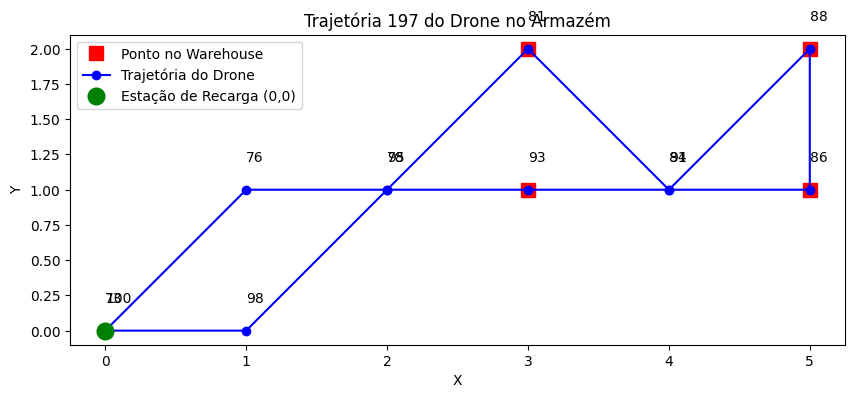


Trajetória 198:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 1), Bateria 91
Passo 5: Posição (5, 2), Bateria 88
Passo 6: Posição (5, 1), Bateria 86
Passo 7: Posição (4, 2), Bateria 83
Passo 8: Posição (3, 2), Bateria 81
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 0), Bateria 75
Passo 11: Posição (0, 0), Bateria 73


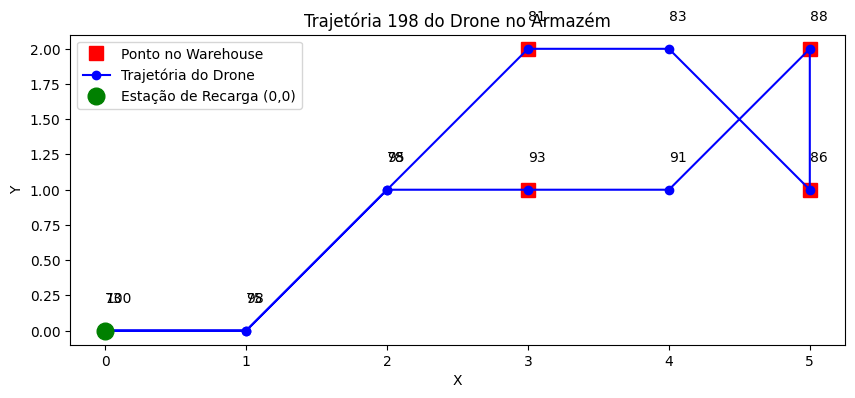


Trajetória 199:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 1), Bateria 91
Passo 5: Posição (5, 2), Bateria 88
Passo 6: Posição (5, 1), Bateria 86
Passo 7: Posição (4, 1), Bateria 84
Passo 8: Posição (3, 2), Bateria 81
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 0), Bateria 75
Passo 11: Posição (0, 0), Bateria 73


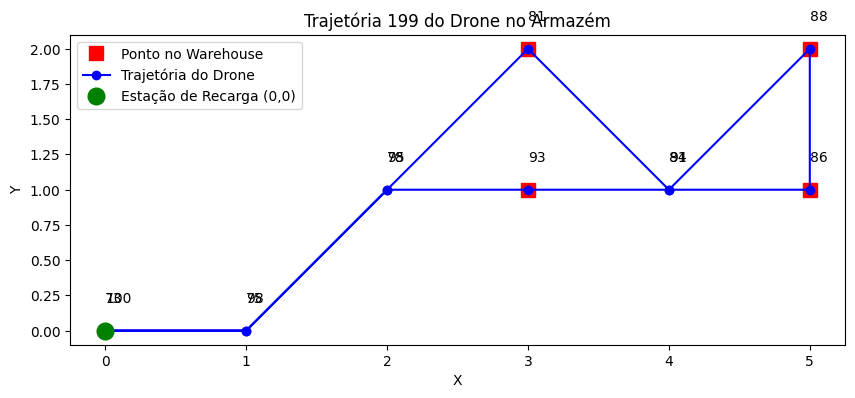


Trajetória 200:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 2), Bateria 88
Passo 6: Posição (5, 1), Bateria 86
Passo 7: Posição (4, 2), Bateria 83
Passo 8: Posição (3, 2), Bateria 81
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 1), Bateria 76
Passo 11: Posição (0, 0), Bateria 73


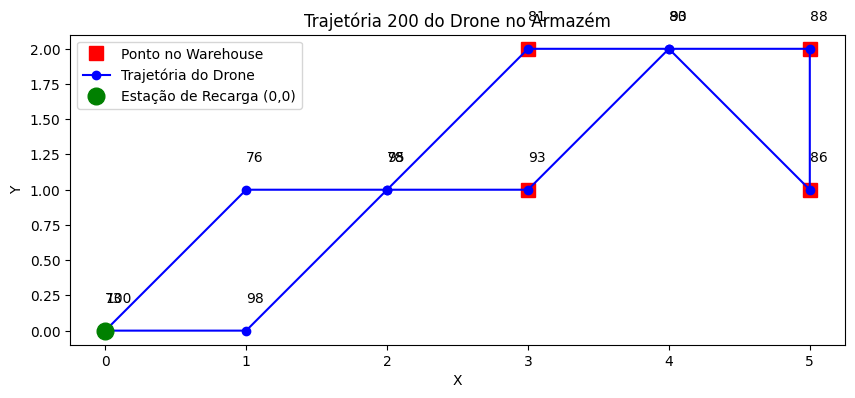


Trajetória 201:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 2), Bateria 88
Passo 6: Posição (5, 1), Bateria 86
Passo 7: Posição (4, 2), Bateria 83
Passo 8: Posição (3, 2), Bateria 81
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 0), Bateria 75
Passo 11: Posição (0, 0), Bateria 73


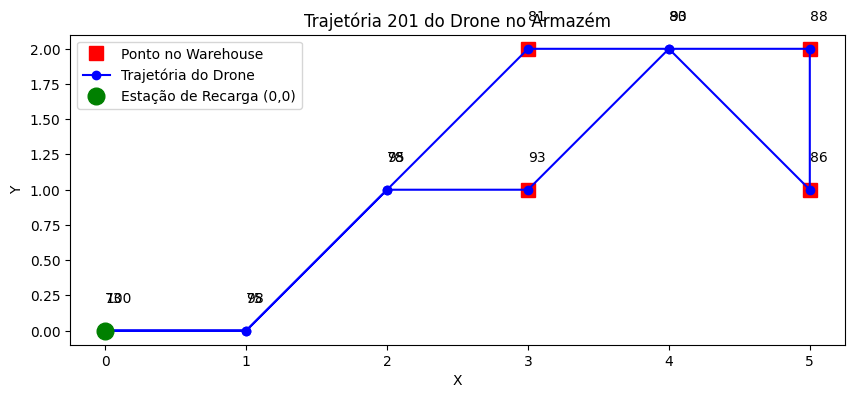


Trajetória 202:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 2), Bateria 88
Passo 6: Posição (5, 1), Bateria 86
Passo 7: Posição (4, 1), Bateria 84
Passo 8: Posição (3, 2), Bateria 81
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 1), Bateria 76
Passo 11: Posição (0, 0), Bateria 73


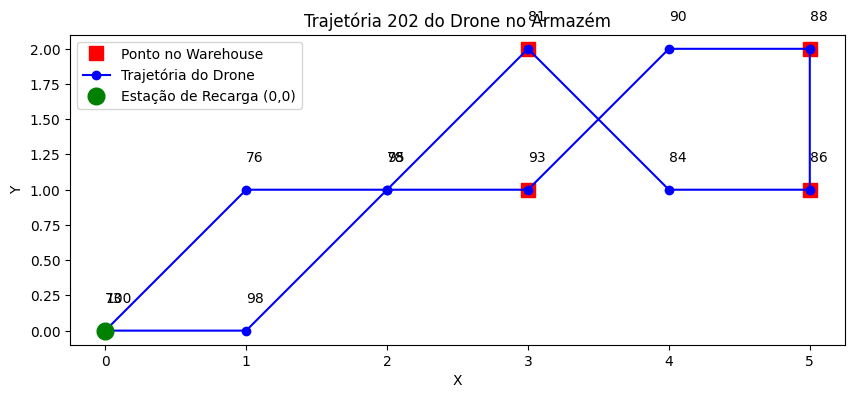


Trajetória 203:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 2), Bateria 88
Passo 6: Posição (5, 1), Bateria 86
Passo 7: Posição (4, 1), Bateria 84
Passo 8: Posição (3, 2), Bateria 81
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 0), Bateria 75
Passo 11: Posição (0, 0), Bateria 73


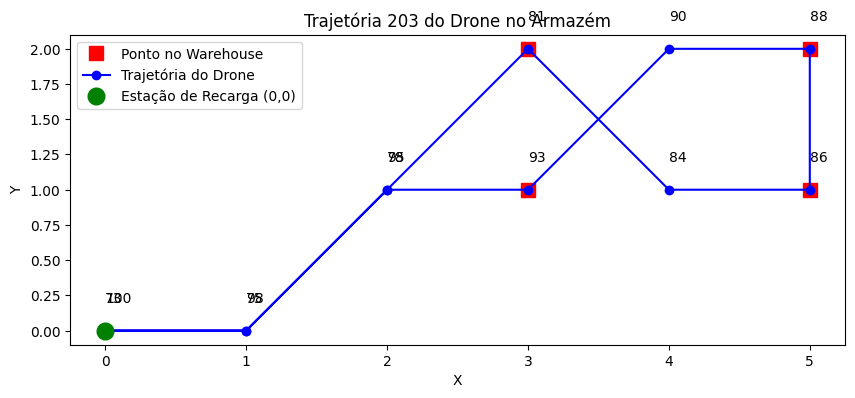


Trajetória 204:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 0), Bateria 96
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 1), Bateria 91
Passo 5: Posição (5, 2), Bateria 88
Passo 6: Posição (5, 1), Bateria 86
Passo 7: Posição (4, 2), Bateria 83
Passo 8: Posição (3, 2), Bateria 81
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 1), Bateria 76
Passo 11: Posição (0, 0), Bateria 73


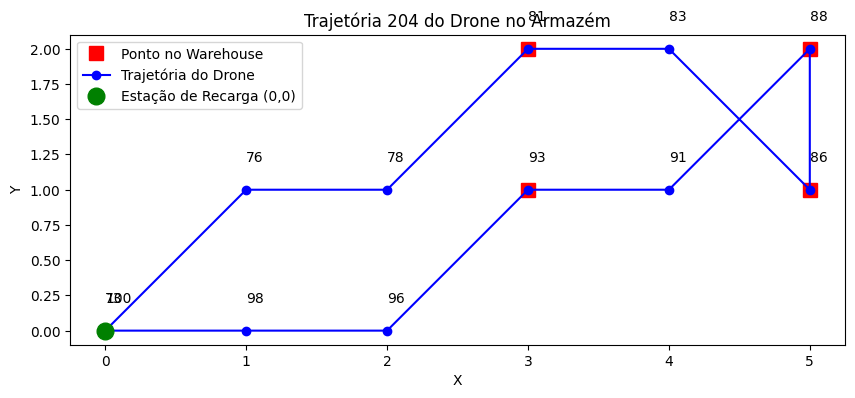


Trajetória 205:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 0), Bateria 96
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 1), Bateria 91
Passo 5: Posição (5, 2), Bateria 88
Passo 6: Posição (5, 1), Bateria 86
Passo 7: Posição (4, 1), Bateria 84
Passo 8: Posição (3, 2), Bateria 81
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 1), Bateria 76
Passo 11: Posição (0, 0), Bateria 73


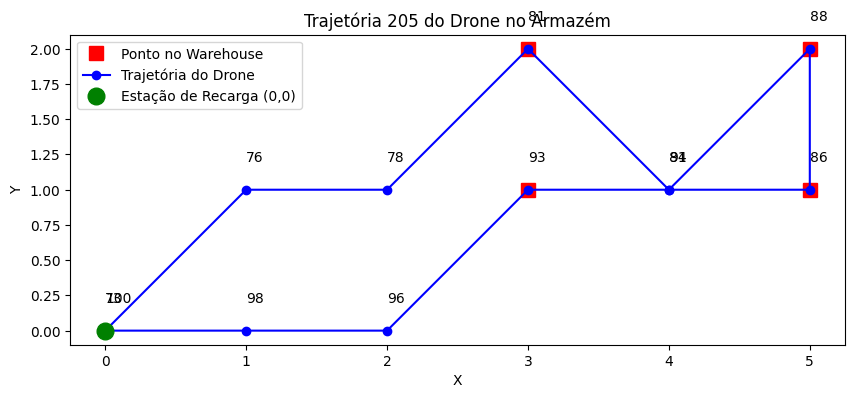


Trajetória 206:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 0), Bateria 96
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 1), Bateria 91
Passo 5: Posição (5, 1), Bateria 89
Passo 6: Posição (5, 2), Bateria 87
Passo 7: Posição (4, 2), Bateria 85
Passo 8: Posição (3, 2), Bateria 83
Passo 9: Posição (2, 1), Bateria 80
Passo 10: Posição (1, 1), Bateria 78
Passo 11: Posição (0, 0), Bateria 75


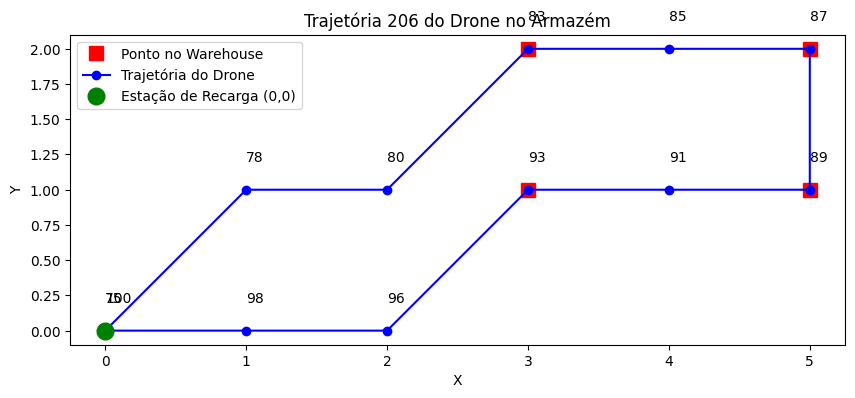


Trajetória 207:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 0), Bateria 96
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 1), Bateria 91
Passo 5: Posição (5, 1), Bateria 89
Passo 6: Posição (5, 2), Bateria 87
Passo 7: Posição (4, 1), Bateria 84
Passo 8: Posição (3, 2), Bateria 81
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 1), Bateria 76
Passo 11: Posição (0, 0), Bateria 73


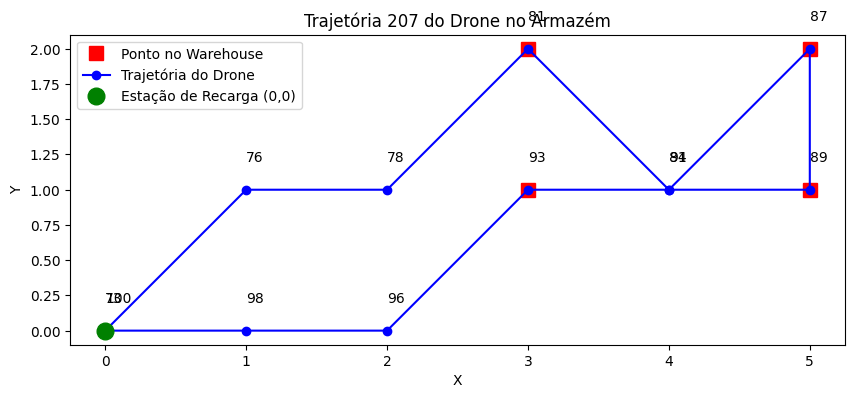


Trajetória 208:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 0), Bateria 96
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 1), Bateria 91
Passo 5: Posição (5, 1), Bateria 89
Passo 6: Posição (5, 2), Bateria 87
Passo 7: Posição (4, 3), Bateria 84
Passo 8: Posição (3, 2), Bateria 81
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 1), Bateria 76
Passo 11: Posição (0, 0), Bateria 73


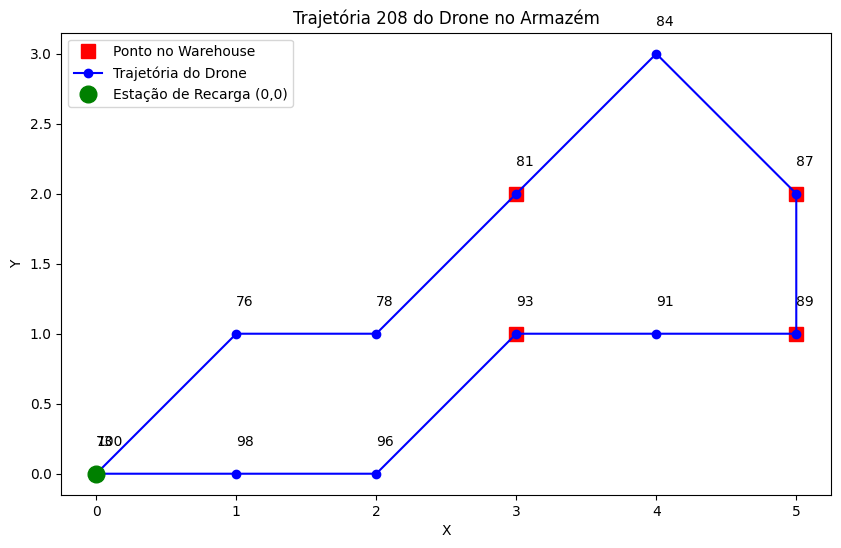


Trajetória 209:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 1), Bateria 91
Passo 5: Posição (5, 2), Bateria 88
Passo 6: Posição (5, 1), Bateria 86
Passo 7: Posição (4, 1), Bateria 84
Passo 8: Posição (3, 2), Bateria 81
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 1), Bateria 76
Passo 11: Posição (0, 0), Bateria 73


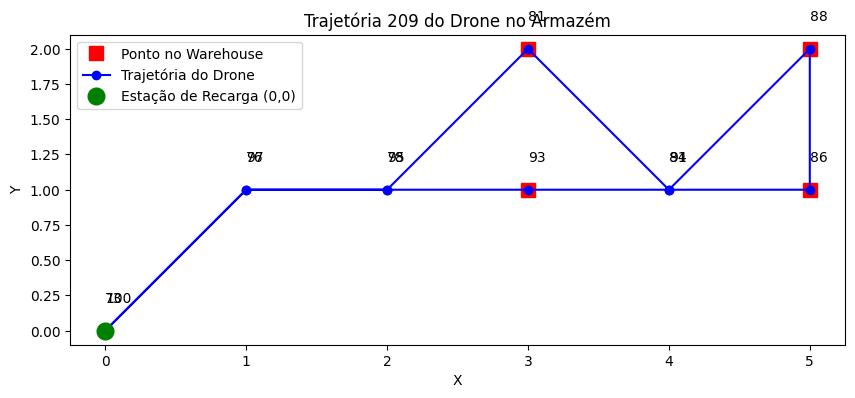


Trajetória 210:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 1), Bateria 91
Passo 5: Posição (5, 1), Bateria 89
Passo 6: Posição (5, 2), Bateria 87
Passo 7: Posição (4, 2), Bateria 85
Passo 8: Posição (3, 2), Bateria 83
Passo 9: Posição (2, 1), Bateria 80
Passo 10: Posição (1, 1), Bateria 78
Passo 11: Posição (0, 0), Bateria 75


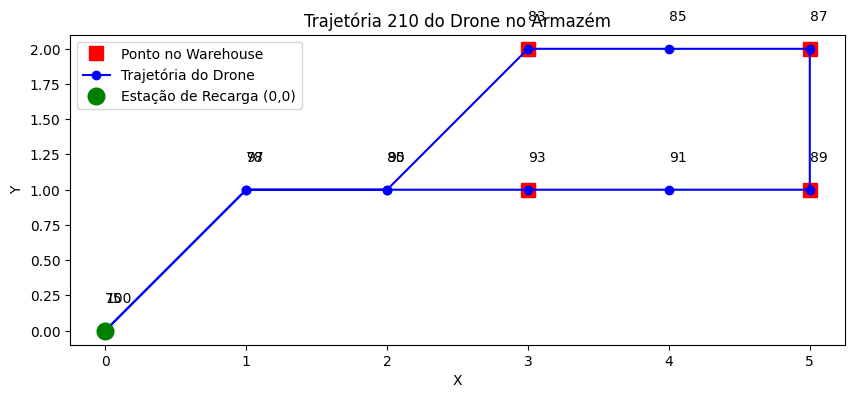


Trajetória 211:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 1), Bateria 91
Passo 5: Posição (5, 1), Bateria 89
Passo 6: Posição (5, 2), Bateria 87
Passo 7: Posição (4, 1), Bateria 84
Passo 8: Posição (3, 2), Bateria 81
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 1), Bateria 76
Passo 11: Posição (0, 0), Bateria 73


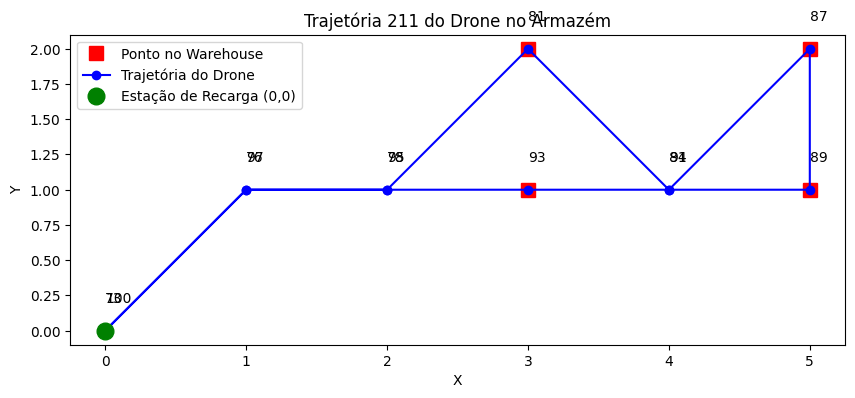


Trajetória 212:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 1), Bateria 91
Passo 5: Posição (5, 1), Bateria 89
Passo 6: Posição (5, 2), Bateria 87
Passo 7: Posição (4, 3), Bateria 84
Passo 8: Posição (3, 2), Bateria 81
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 1), Bateria 76
Passo 11: Posição (0, 0), Bateria 73


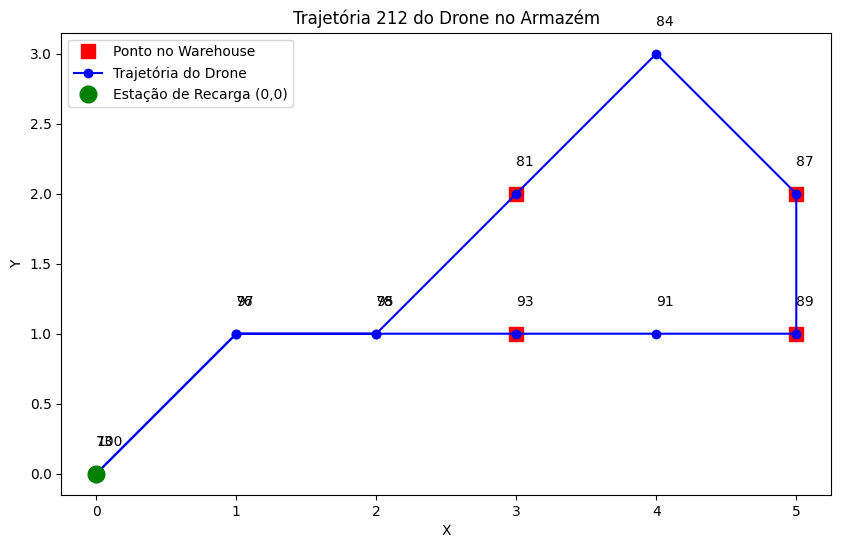


Trajetória 213:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 1), Bateria 91
Passo 5: Posição (5, 2), Bateria 88
Passo 6: Posição (5, 1), Bateria 86
Passo 7: Posição (4, 2), Bateria 83
Passo 8: Posição (3, 2), Bateria 81
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 1), Bateria 76
Passo 11: Posição (0, 0), Bateria 73


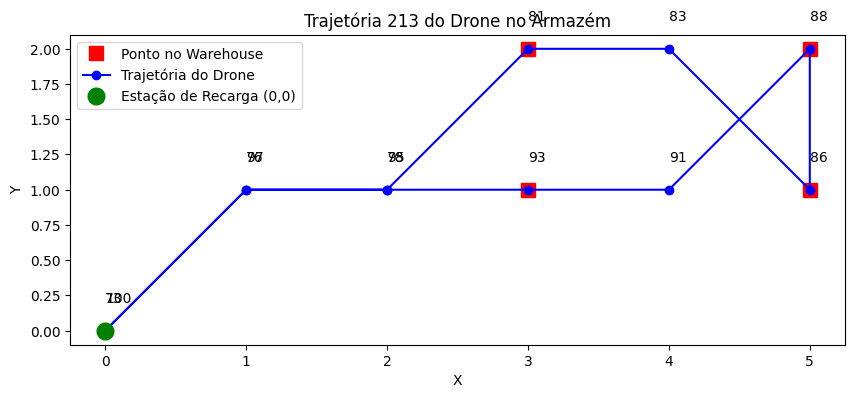


Trajetória 214:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 0), Bateria 96
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 1), Bateria 91
Passo 5: Posição (5, 1), Bateria 89
Passo 6: Posição (5, 2), Bateria 87
Passo 7: Posição (4, 1), Bateria 84
Passo 8: Posição (3, 2), Bateria 81
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 0), Bateria 75
Passo 11: Posição (0, 0), Bateria 73


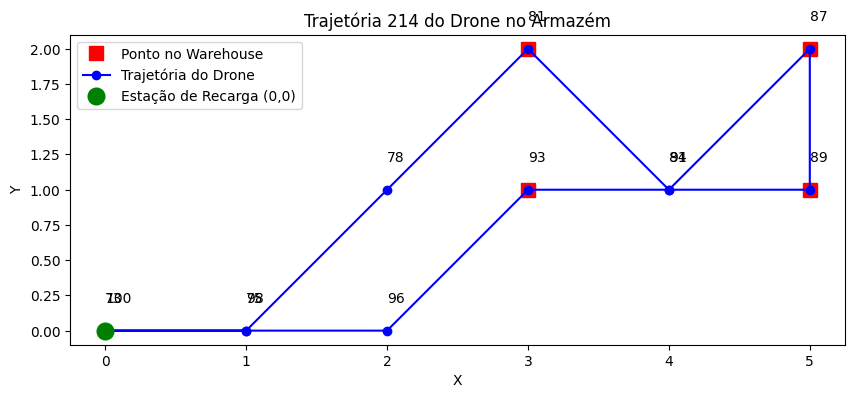


Trajetória 215:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 0), Bateria 96
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 1), Bateria 91
Passo 5: Posição (5, 1), Bateria 89
Passo 6: Posição (5, 2), Bateria 87
Passo 7: Posição (4, 3), Bateria 84
Passo 8: Posição (3, 2), Bateria 81
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 0), Bateria 75
Passo 11: Posição (0, 0), Bateria 73


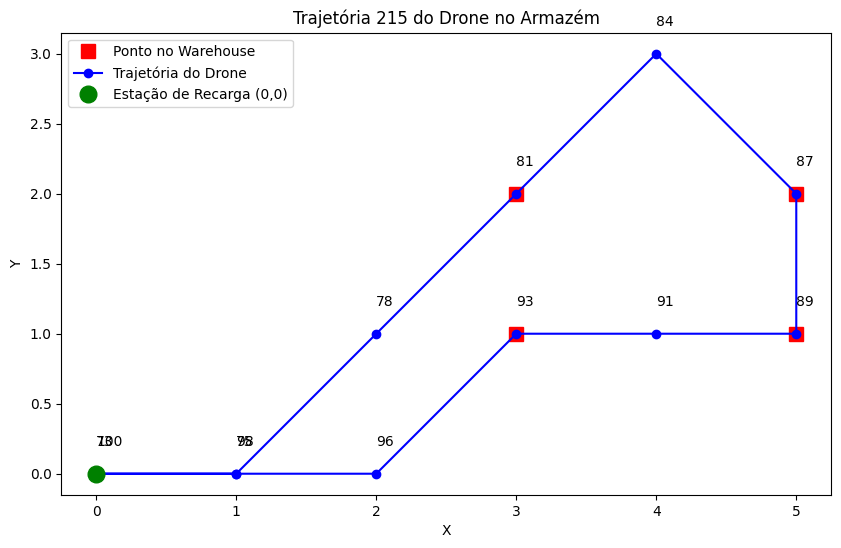


Trajetória 216:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 0), Bateria 96
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 1), Bateria 91
Passo 5: Posição (5, 1), Bateria 89
Passo 6: Posição (5, 2), Bateria 87
Passo 7: Posição (4, 2), Bateria 85
Passo 8: Posição (3, 2), Bateria 83
Passo 9: Posição (2, 1), Bateria 80
Passo 10: Posição (1, 0), Bateria 77
Passo 11: Posição (0, 0), Bateria 75


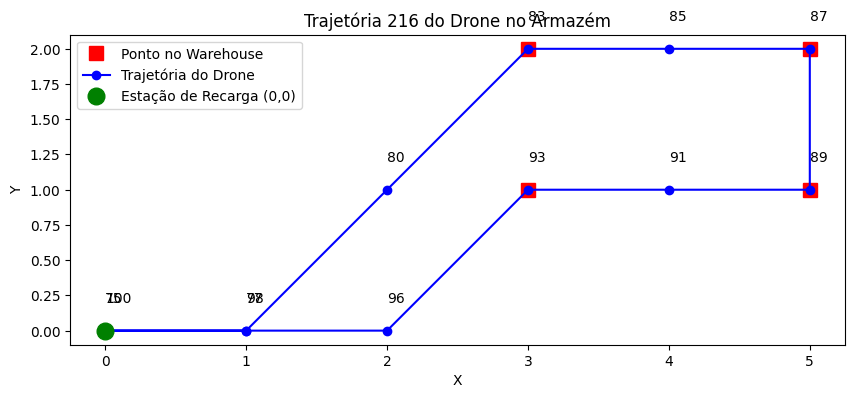


Trajetória 217:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 0), Bateria 96
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 1), Bateria 91
Passo 5: Posição (5, 2), Bateria 88
Passo 6: Posição (5, 1), Bateria 86
Passo 7: Posição (4, 2), Bateria 83
Passo 8: Posição (3, 2), Bateria 81
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 0), Bateria 75
Passo 11: Posição (0, 0), Bateria 73


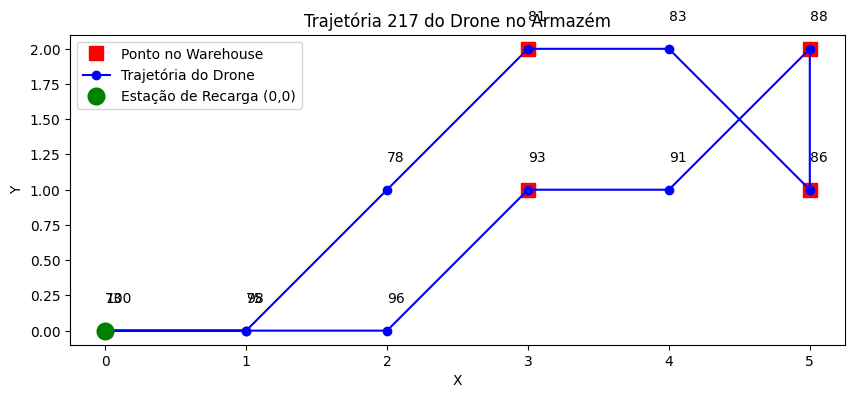


Trajetória 218:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 0), Bateria 96
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 1), Bateria 91
Passo 5: Posição (5, 2), Bateria 88
Passo 6: Posição (5, 1), Bateria 86
Passo 7: Posição (4, 1), Bateria 84
Passo 8: Posição (3, 2), Bateria 81
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 0), Bateria 75
Passo 11: Posição (0, 0), Bateria 73


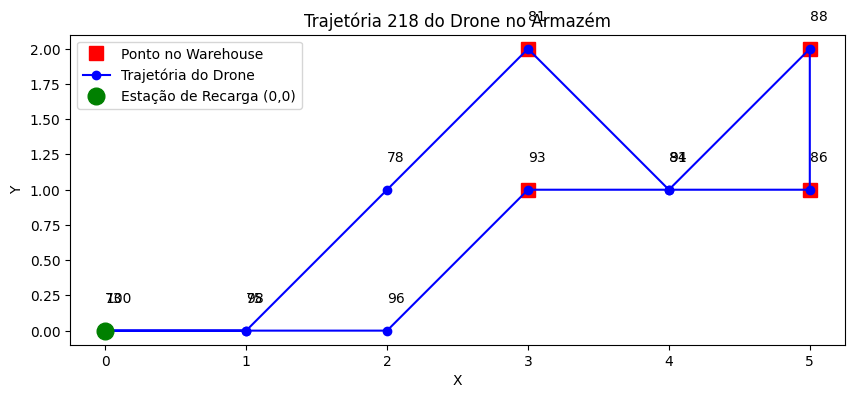


Trajetória 219:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 0), Bateria 96
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 1), Bateria 91
Passo 5: Posição (5, 1), Bateria 89
Passo 6: Posição (5, 2), Bateria 87
Passo 7: Posição (4, 1), Bateria 84
Passo 8: Posição (3, 2), Bateria 81
Passo 9: Posição (2, 2), Bateria 79
Passo 10: Posição (1, 1), Bateria 76
Passo 11: Posição (0, 0), Bateria 73


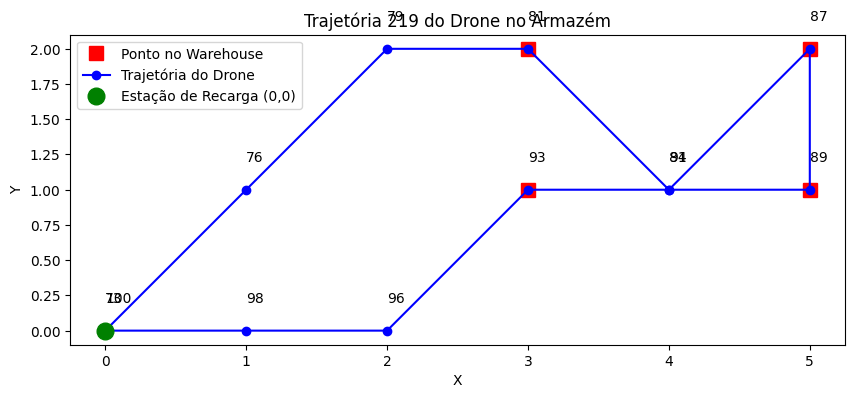


Trajetória 220:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 0), Bateria 96
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 1), Bateria 91
Passo 5: Posição (5, 1), Bateria 89
Passo 6: Posição (5, 2), Bateria 87
Passo 7: Posição (4, 3), Bateria 84
Passo 8: Posição (3, 2), Bateria 81
Passo 9: Posição (2, 2), Bateria 79
Passo 10: Posição (1, 1), Bateria 76
Passo 11: Posição (0, 0), Bateria 73


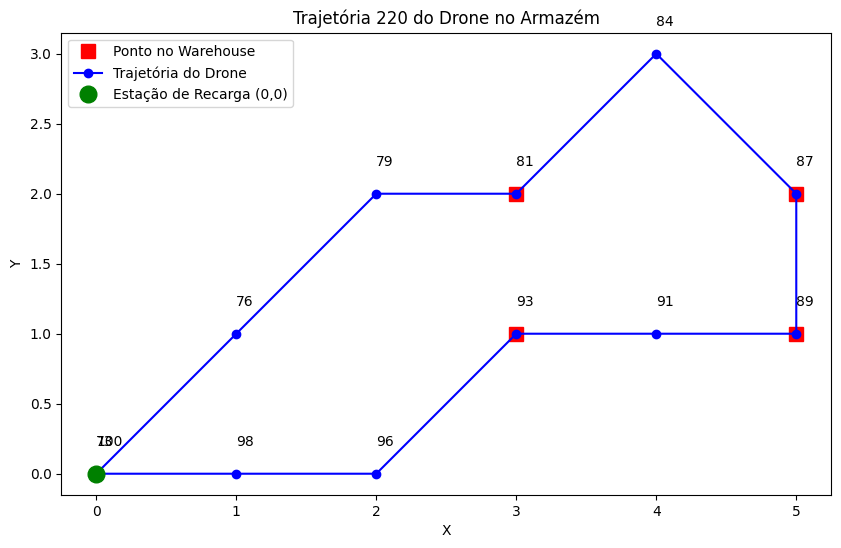


Trajetória 221:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 0), Bateria 96
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 1), Bateria 91
Passo 5: Posição (5, 2), Bateria 88
Passo 6: Posição (5, 1), Bateria 86
Passo 7: Posição (4, 1), Bateria 84
Passo 8: Posição (3, 2), Bateria 81
Passo 9: Posição (2, 2), Bateria 79
Passo 10: Posição (1, 1), Bateria 76
Passo 11: Posição (0, 0), Bateria 73


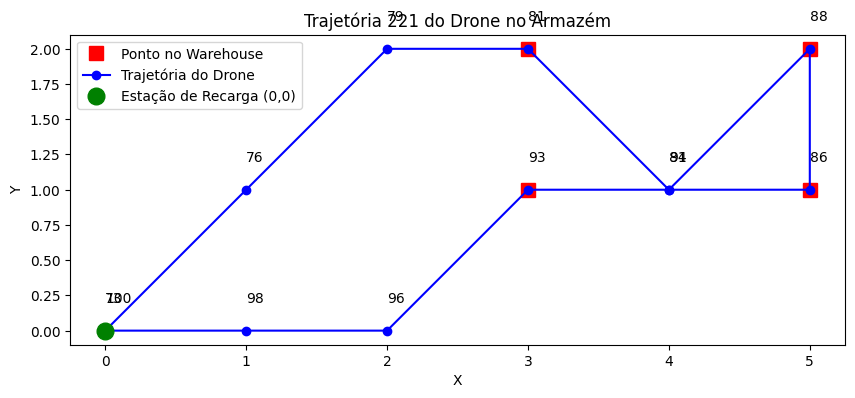


Trajetória 222:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 0), Bateria 96
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 1), Bateria 91
Passo 5: Posição (5, 2), Bateria 88
Passo 6: Posição (5, 1), Bateria 86
Passo 7: Posição (4, 2), Bateria 83
Passo 8: Posição (3, 2), Bateria 81
Passo 9: Posição (2, 2), Bateria 79
Passo 10: Posição (1, 1), Bateria 76
Passo 11: Posição (0, 0), Bateria 73


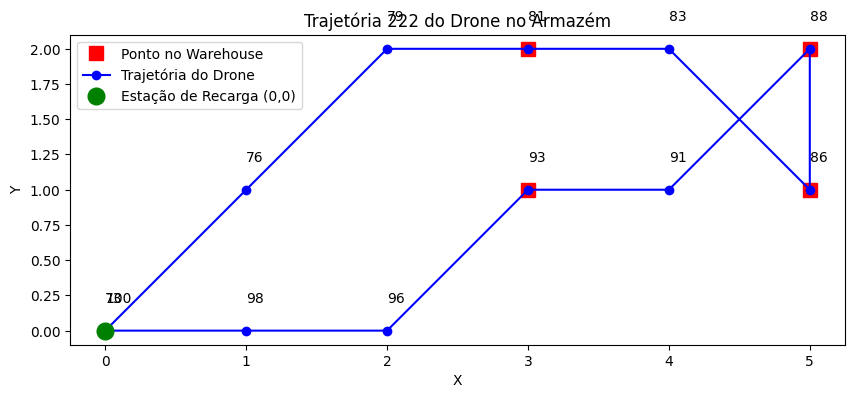


Trajetória 223:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 0), Bateria 96
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 1), Bateria 91
Passo 5: Posição (5, 1), Bateria 89
Passo 6: Posição (5, 2), Bateria 87
Passo 7: Posição (4, 2), Bateria 85
Passo 8: Posição (3, 2), Bateria 83
Passo 9: Posição (2, 2), Bateria 81
Passo 10: Posição (1, 1), Bateria 78
Passo 11: Posição (0, 0), Bateria 75


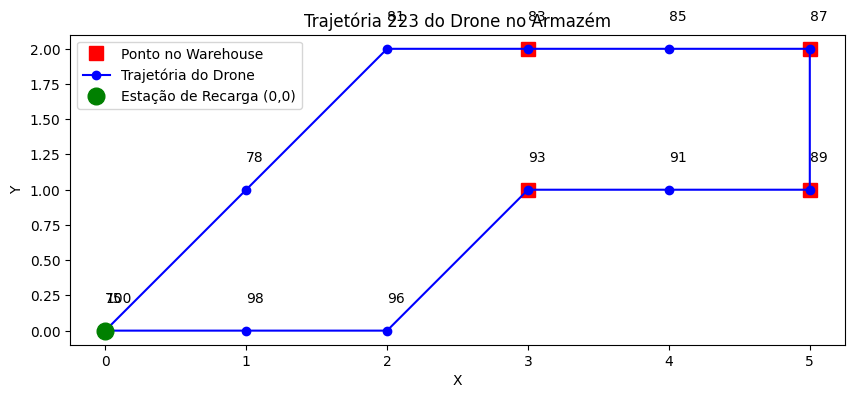


Trajetória 224:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 1), Bateria 91
Passo 5: Posição (5, 2), Bateria 88
Passo 6: Posição (5, 1), Bateria 86
Passo 7: Posição (4, 1), Bateria 84
Passo 8: Posição (3, 2), Bateria 81
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 0), Bateria 75
Passo 11: Posição (0, 0), Bateria 73


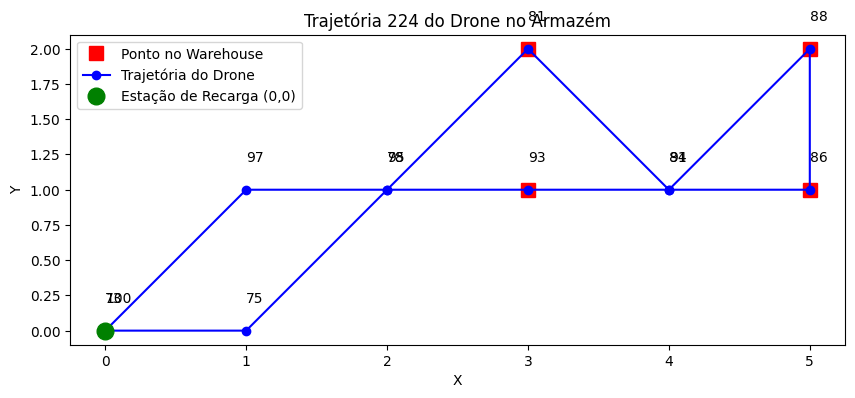


Trajetória 225:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 1), Bateria 91
Passo 5: Posição (5, 2), Bateria 88
Passo 6: Posição (5, 1), Bateria 86
Passo 7: Posição (4, 1), Bateria 84
Passo 8: Posição (3, 2), Bateria 81
Passo 9: Posição (2, 2), Bateria 79
Passo 10: Posição (1, 1), Bateria 76
Passo 11: Posição (0, 0), Bateria 73


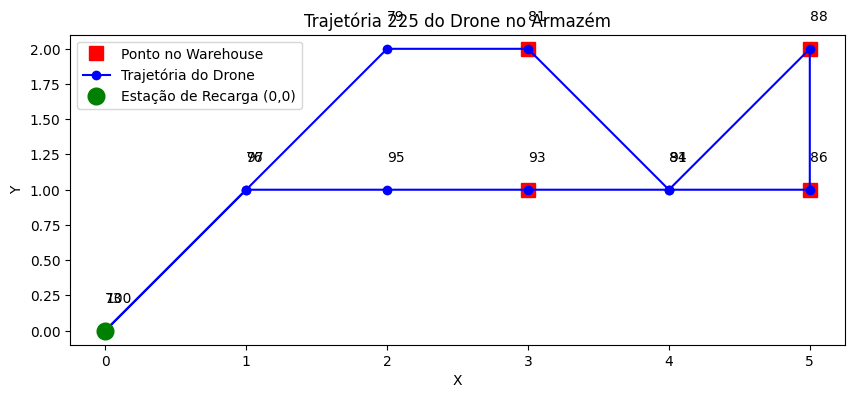


Trajetória 226:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 1), Bateria 91
Passo 5: Posição (5, 1), Bateria 89
Passo 6: Posição (5, 2), Bateria 87
Passo 7: Posição (4, 1), Bateria 84
Passo 8: Posição (3, 2), Bateria 81
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 0), Bateria 75
Passo 11: Posição (0, 0), Bateria 73


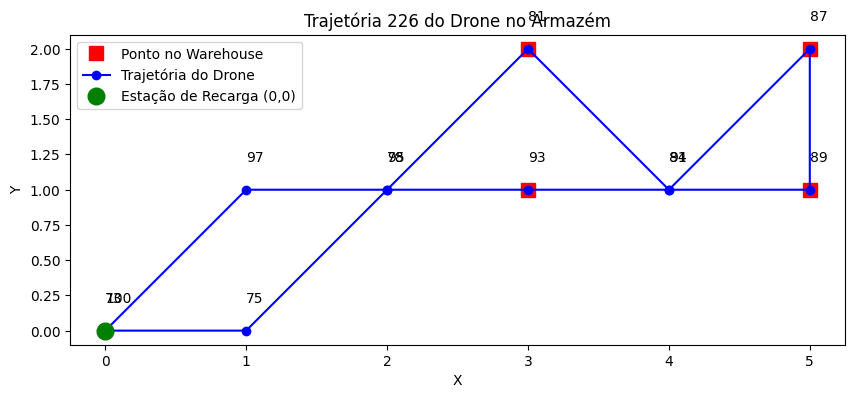


Trajetória 227:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 1), Bateria 91
Passo 5: Posição (5, 1), Bateria 89
Passo 6: Posição (5, 2), Bateria 87
Passo 7: Posição (4, 3), Bateria 84
Passo 8: Posição (3, 2), Bateria 81
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 0), Bateria 75
Passo 11: Posição (0, 0), Bateria 73


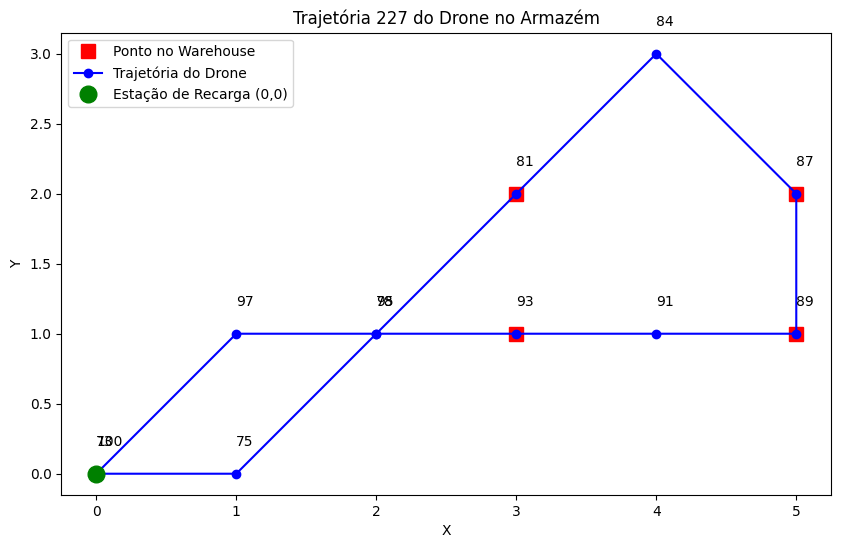


Trajetória 228:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 1), Bateria 91
Passo 5: Posição (5, 1), Bateria 89
Passo 6: Posição (5, 2), Bateria 87
Passo 7: Posição (4, 1), Bateria 84
Passo 8: Posição (3, 2), Bateria 81
Passo 9: Posição (2, 2), Bateria 79
Passo 10: Posição (1, 1), Bateria 76
Passo 11: Posição (0, 0), Bateria 73


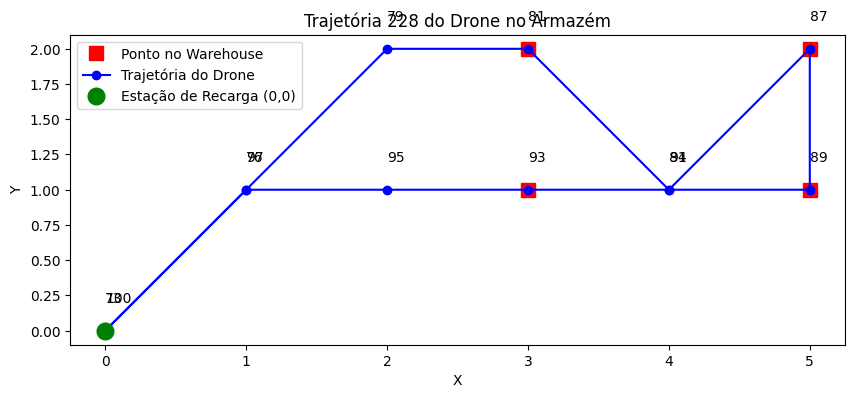


Trajetória 229:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 1), Bateria 91
Passo 5: Posição (5, 1), Bateria 89
Passo 6: Posição (5, 2), Bateria 87
Passo 7: Posição (4, 3), Bateria 84
Passo 8: Posição (3, 2), Bateria 81
Passo 9: Posição (2, 2), Bateria 79
Passo 10: Posição (1, 1), Bateria 76
Passo 11: Posição (0, 0), Bateria 73


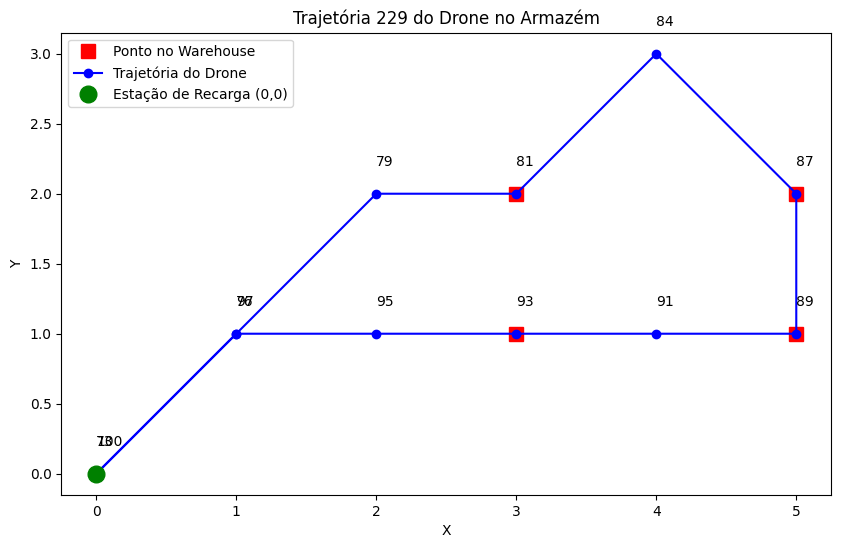


Trajetória 230:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 1), Bateria 91
Passo 5: Posição (5, 1), Bateria 89
Passo 6: Posição (5, 2), Bateria 87
Passo 7: Posição (4, 2), Bateria 85
Passo 8: Posição (3, 2), Bateria 83
Passo 9: Posição (2, 1), Bateria 80
Passo 10: Posição (1, 0), Bateria 77
Passo 11: Posição (0, 0), Bateria 75


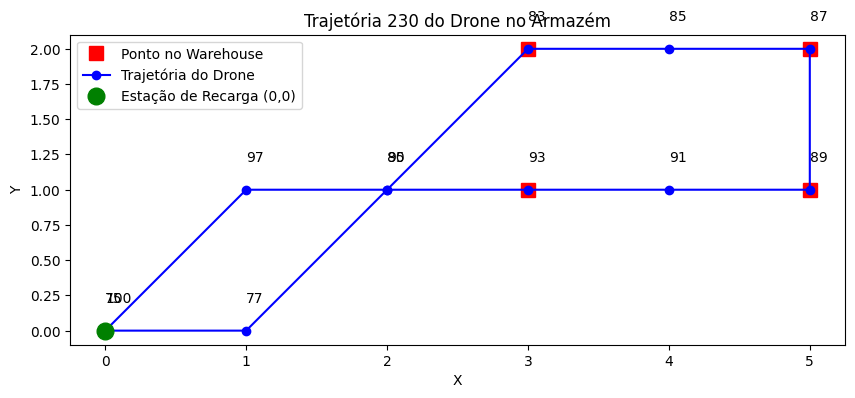


Trajetória 231:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 1), Bateria 91
Passo 5: Posição (5, 1), Bateria 89
Passo 6: Posição (5, 2), Bateria 87
Passo 7: Posição (4, 2), Bateria 85
Passo 8: Posição (3, 2), Bateria 83
Passo 9: Posição (2, 2), Bateria 81
Passo 10: Posição (1, 1), Bateria 78
Passo 11: Posição (0, 0), Bateria 75


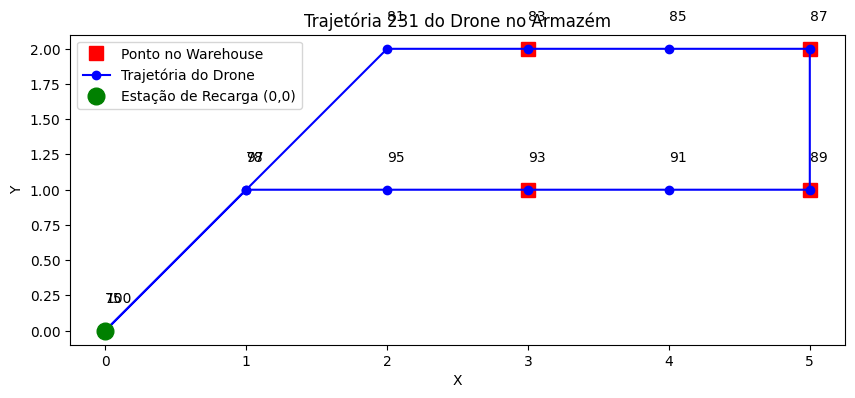


Trajetória 232:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 1), Bateria 91
Passo 5: Posição (5, 2), Bateria 88
Passo 6: Posição (5, 1), Bateria 86
Passo 7: Posição (4, 2), Bateria 83
Passo 8: Posição (3, 2), Bateria 81
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 0), Bateria 75
Passo 11: Posição (0, 0), Bateria 73


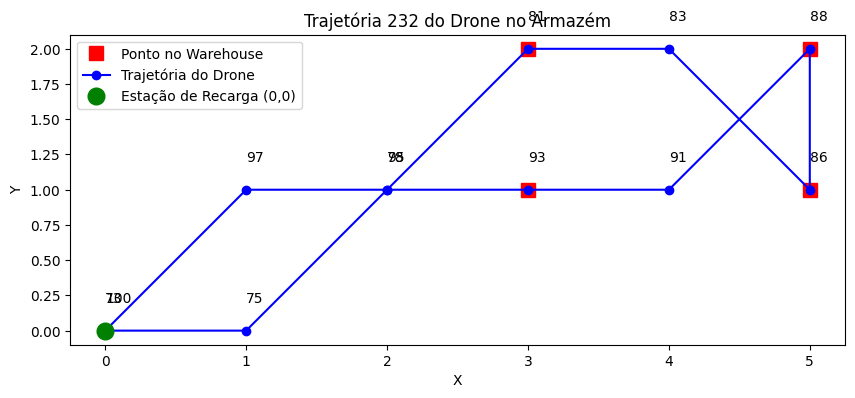


Trajetória 233:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 1), Bateria 91
Passo 5: Posição (5, 2), Bateria 88
Passo 6: Posição (5, 1), Bateria 86
Passo 7: Posição (4, 2), Bateria 83
Passo 8: Posição (3, 2), Bateria 81
Passo 9: Posição (2, 2), Bateria 79
Passo 10: Posição (1, 1), Bateria 76
Passo 11: Posição (0, 0), Bateria 73


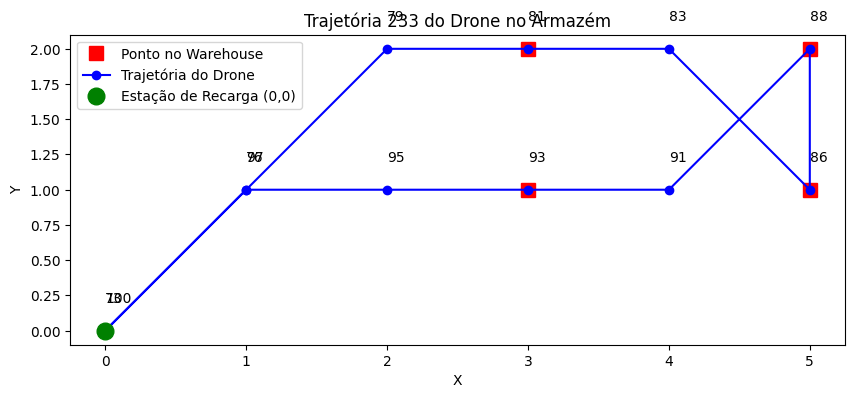


Trajetória 234:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 0), Bateria 96
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 0), Bateria 90
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 2), Bateria 83
Passo 8: Posição (3, 2), Bateria 81
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 1), Bateria 76
Passo 11: Posição (0, 0), Bateria 73


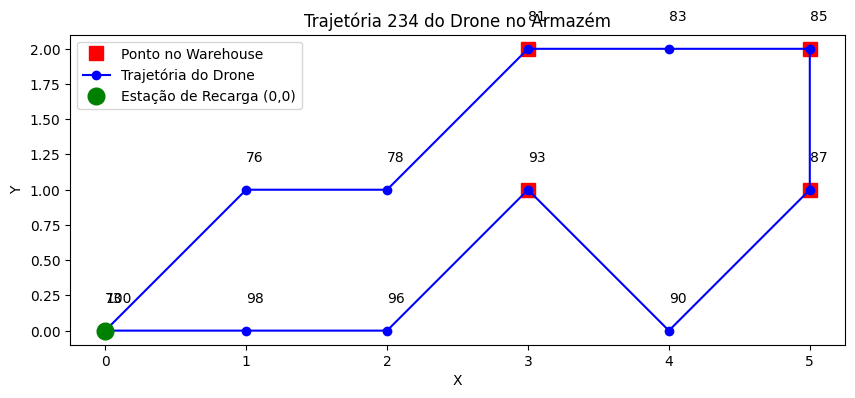


Trajetória 235:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 0), Bateria 96
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 2), Bateria 83
Passo 8: Posição (3, 2), Bateria 81
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 1), Bateria 76
Passo 11: Posição (0, 0), Bateria 73


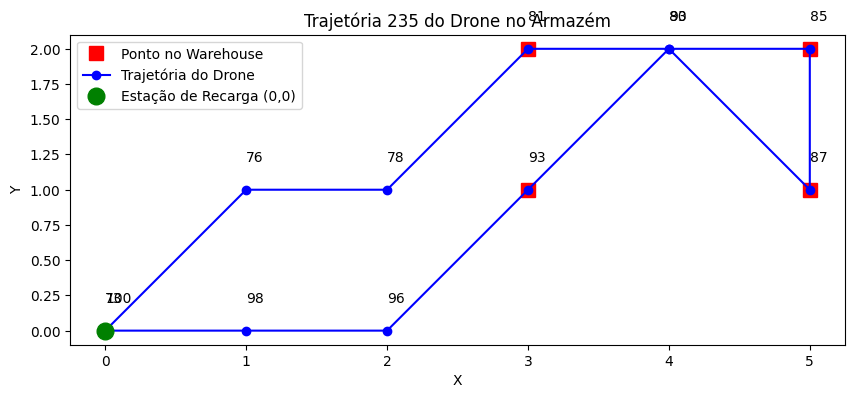


Trajetória 236:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 0), Bateria 96
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 0), Bateria 90
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 2), Bateria 83
Passo 8: Posição (3, 2), Bateria 81
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 0), Bateria 75
Passo 11: Posição (0, 0), Bateria 73


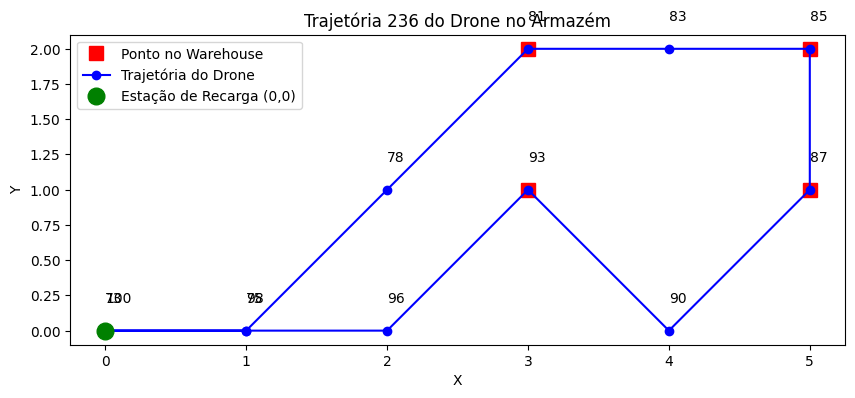


Trajetória 237:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 0), Bateria 96
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 2), Bateria 83
Passo 8: Posição (3, 2), Bateria 81
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 0), Bateria 75
Passo 11: Posição (0, 0), Bateria 73


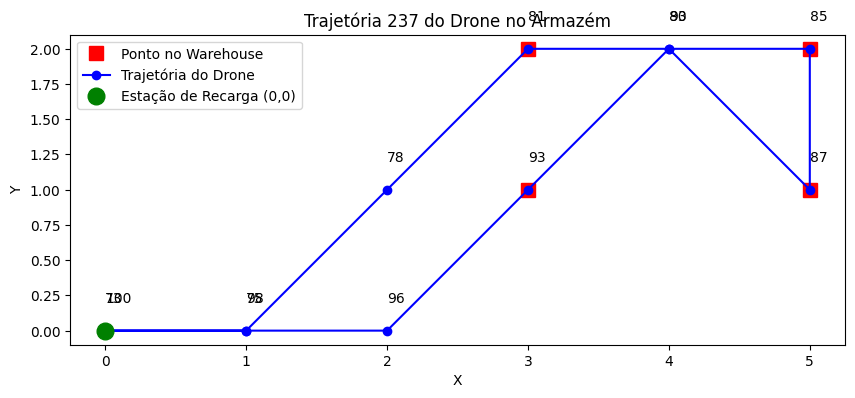


Trajetória 238:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 0), Bateria 96
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 0), Bateria 90
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 2), Bateria 83
Passo 8: Posição (3, 2), Bateria 81
Passo 9: Posição (2, 2), Bateria 79
Passo 10: Posição (1, 1), Bateria 76
Passo 11: Posição (0, 0), Bateria 73


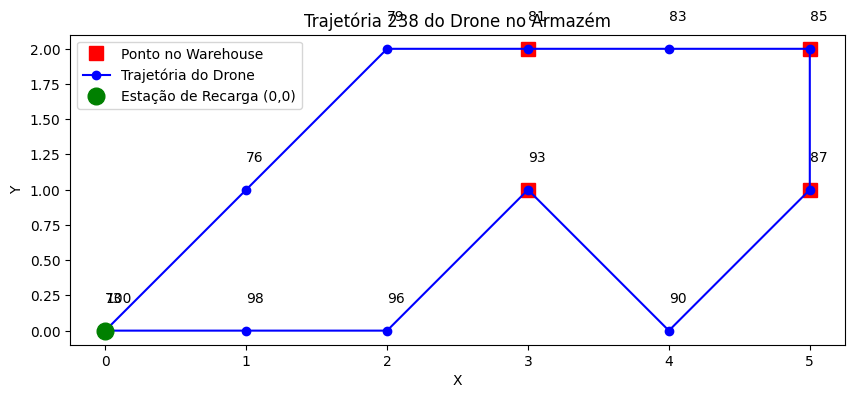


Trajetória 239:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 0), Bateria 96
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 2), Bateria 83
Passo 8: Posição (3, 2), Bateria 81
Passo 9: Posição (2, 2), Bateria 79
Passo 10: Posição (1, 1), Bateria 76
Passo 11: Posição (0, 0), Bateria 73


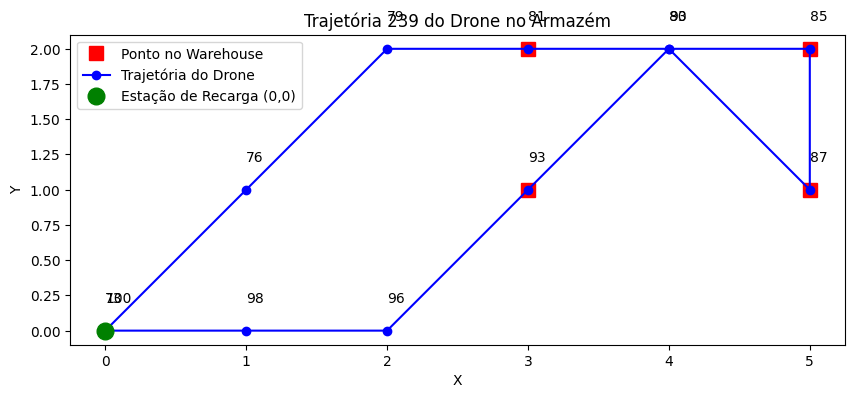


Trajetória 240:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 0), Bateria 90
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 2), Bateria 83
Passo 8: Posição (3, 2), Bateria 81
Passo 9: Posição (2, 2), Bateria 79
Passo 10: Posição (1, 1), Bateria 76
Passo 11: Posição (0, 0), Bateria 73


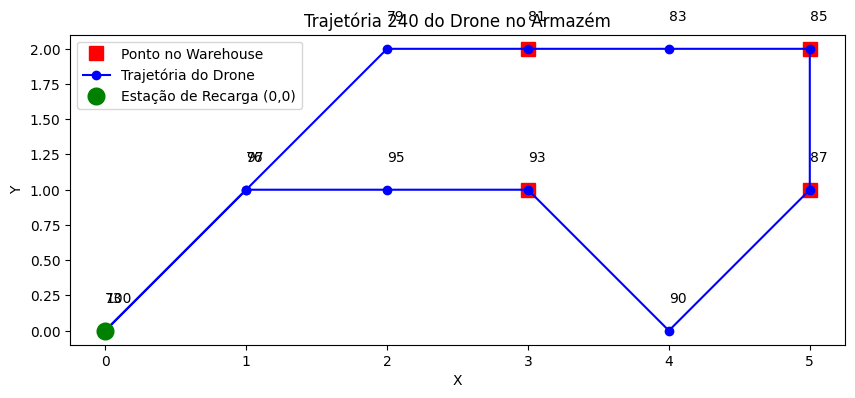


Trajetória 241:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 2), Bateria 83
Passo 8: Posição (3, 2), Bateria 81
Passo 9: Posição (2, 2), Bateria 79
Passo 10: Posição (1, 1), Bateria 76
Passo 11: Posição (0, 0), Bateria 73


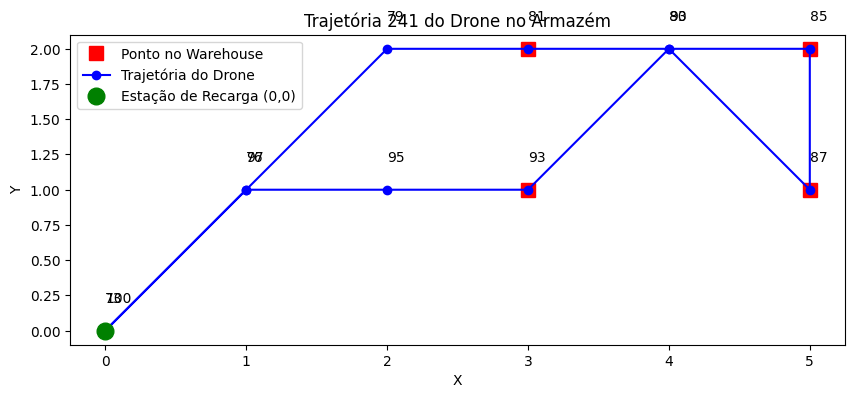


Trajetória 242:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 0), Bateria 96
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 0), Bateria 90
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 2), Bateria 79
Passo 9: Posição (2, 1), Bateria 76
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


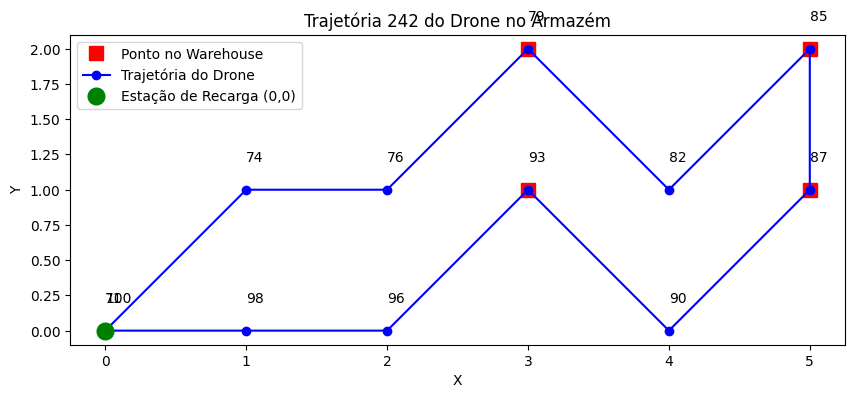


Trajetória 243:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 0), Bateria 96
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 2), Bateria 79
Passo 9: Posição (2, 1), Bateria 76
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


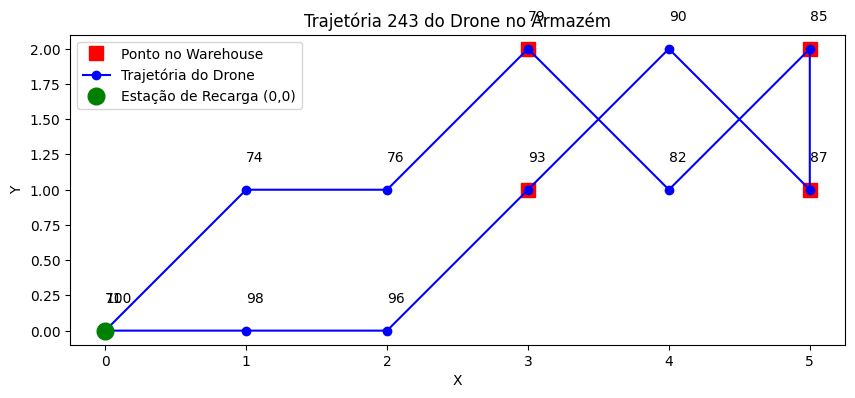


Trajetória 244:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 0), Bateria 96
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 0), Bateria 90
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 3), Bateria 82
Passo 8: Posição (3, 2), Bateria 79
Passo 9: Posição (2, 1), Bateria 76
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


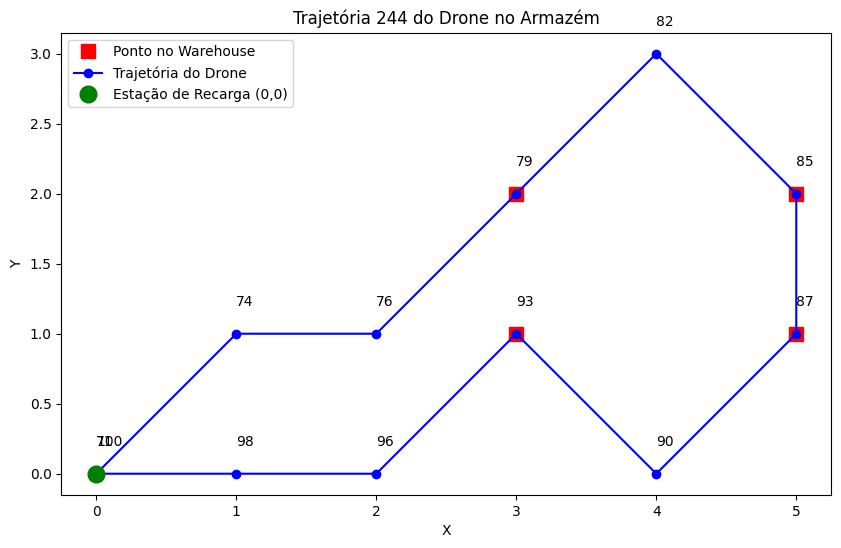


Trajetória 245:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 1), Bateria 91
Passo 4: Posição (4, 2), Bateria 88
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 2), Bateria 81
Passo 8: Posição (3, 2), Bateria 79
Passo 9: Posição (2, 1), Bateria 76
Passo 10: Posição (1, 0), Bateria 73
Passo 11: Posição (0, 0), Bateria 71


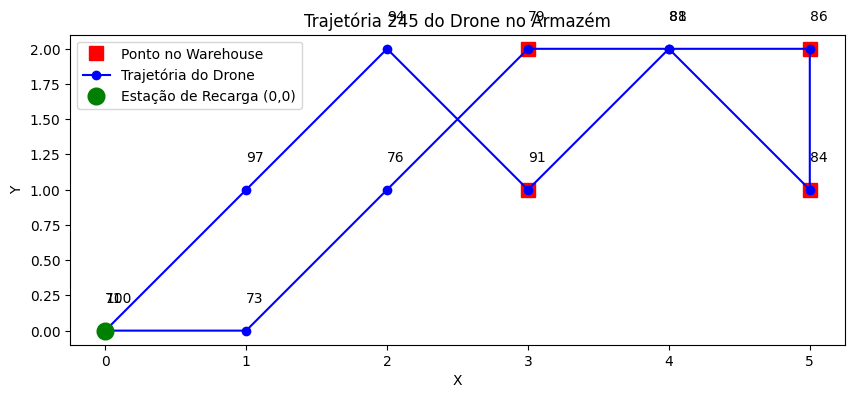


Trajetória 246:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 0), Bateria 94
Passo 3: Posição (3, 1), Bateria 91
Passo 4: Posição (4, 2), Bateria 88
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 2), Bateria 81
Passo 8: Posição (3, 2), Bateria 79
Passo 9: Posição (2, 1), Bateria 76
Passo 10: Posição (1, 0), Bateria 73
Passo 11: Posição (0, 0), Bateria 71


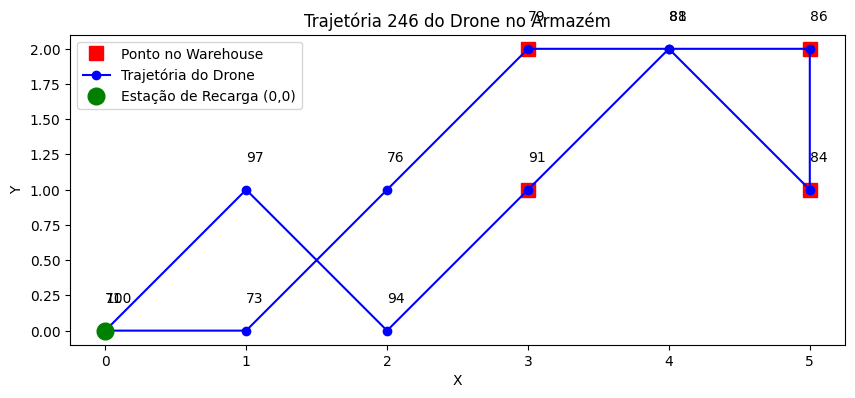


Trajetória 247:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 1), Bateria 91
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 2), Bateria 81
Passo 8: Posição (3, 2), Bateria 79
Passo 9: Posição (2, 1), Bateria 76
Passo 10: Posição (1, 0), Bateria 73
Passo 11: Posição (0, 0), Bateria 71


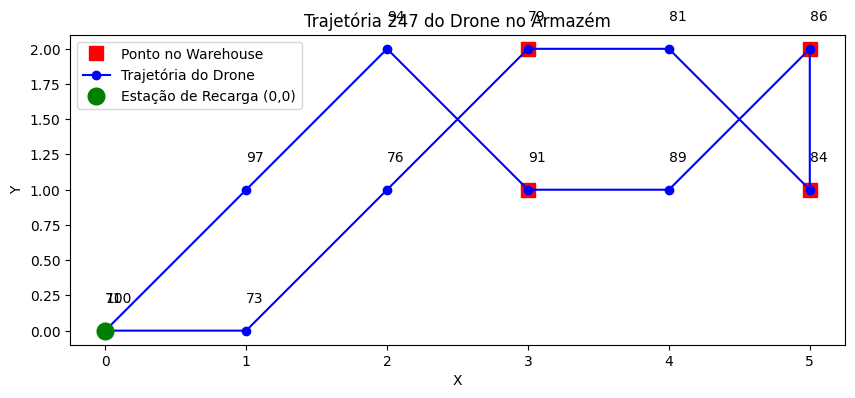


Trajetória 248:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 1), Bateria 91
Passo 4: Posição (4, 2), Bateria 88
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 2), Bateria 81
Passo 8: Posição (3, 2), Bateria 79
Passo 9: Posição (2, 1), Bateria 76
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


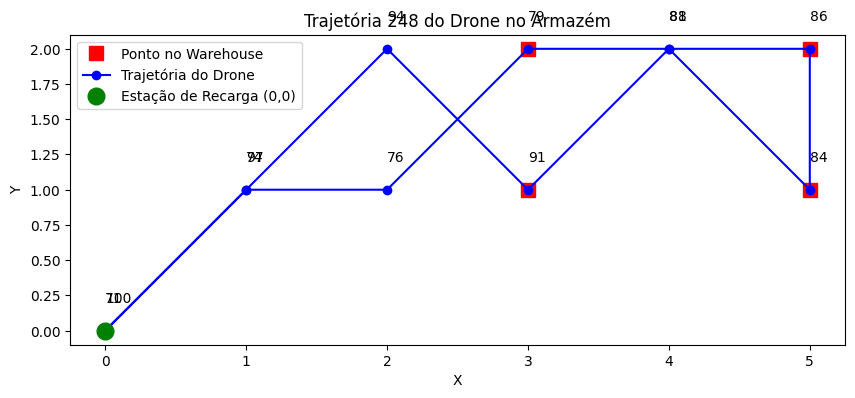


Trajetória 249:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 0), Bateria 94
Passo 3: Posição (3, 1), Bateria 91
Passo 4: Posição (4, 2), Bateria 88
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 2), Bateria 81
Passo 8: Posição (3, 2), Bateria 79
Passo 9: Posição (2, 1), Bateria 76
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


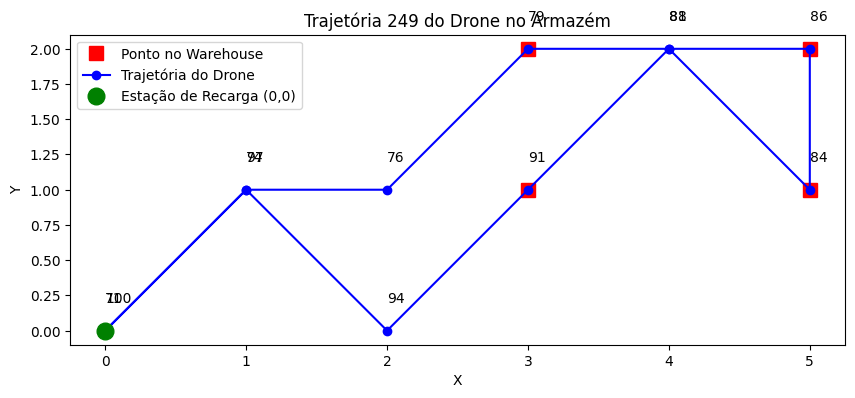


Trajetória 250:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 1), Bateria 91
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 2), Bateria 81
Passo 8: Posição (3, 2), Bateria 79
Passo 9: Posição (2, 1), Bateria 76
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


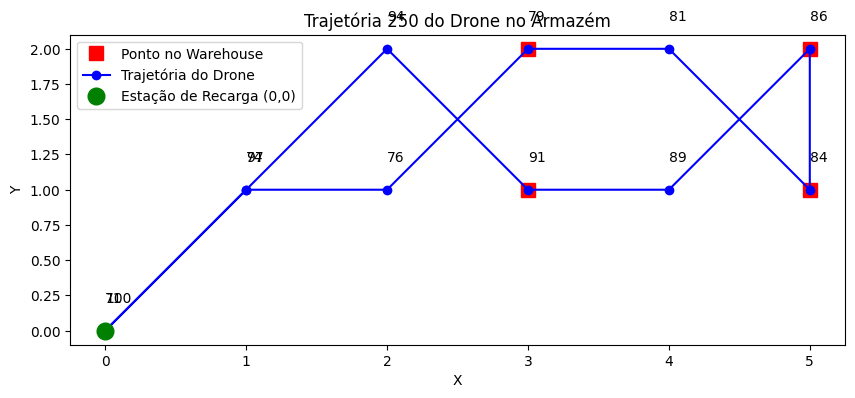


Trajetória 251:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 1), Bateria 91
Passo 5: Posição (5, 2), Bateria 88
Passo 6: Posição (5, 1), Bateria 86
Passo 7: Posição (4, 2), Bateria 83
Passo 8: Posição (3, 2), Bateria 81
Passo 9: Posição (2, 2), Bateria 79
Passo 10: Posição (1, 1), Bateria 76
Passo 11: Posição (0, 0), Bateria 73


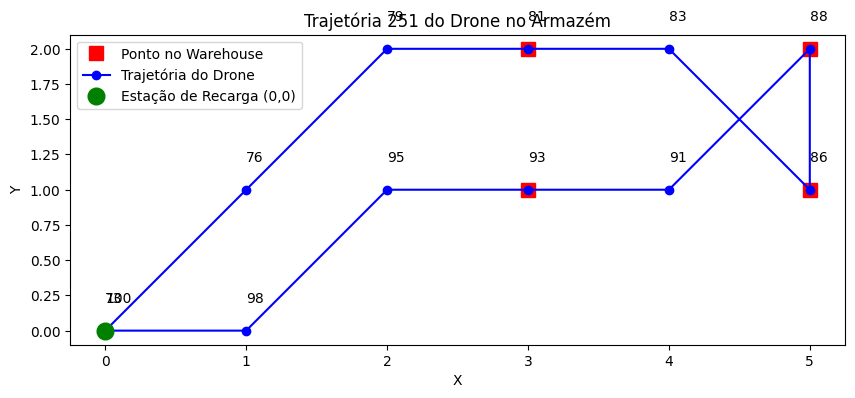


Trajetória 252:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 2), Bateria 88
Passo 6: Posição (5, 1), Bateria 86
Passo 7: Posição (4, 2), Bateria 83
Passo 8: Posição (3, 2), Bateria 81
Passo 9: Posição (2, 2), Bateria 79
Passo 10: Posição (1, 1), Bateria 76
Passo 11: Posição (0, 0), Bateria 73


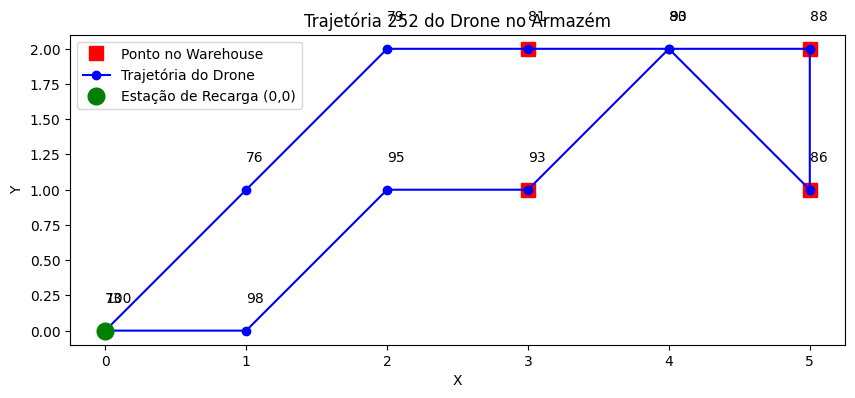


Trajetória 253:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 0), Bateria 90
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 2), Bateria 83
Passo 8: Posição (3, 2), Bateria 81
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 0), Bateria 75
Passo 11: Posição (0, 0), Bateria 73


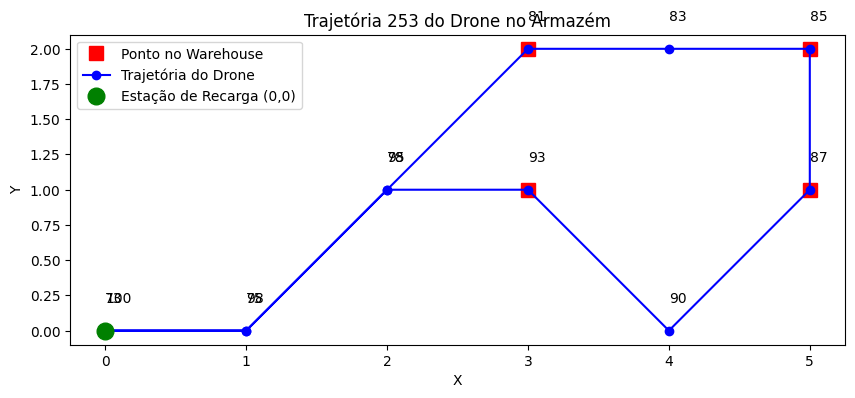


Trajetória 254:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 2), Bateria 83
Passo 8: Posição (3, 2), Bateria 81
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 0), Bateria 75
Passo 11: Posição (0, 0), Bateria 73


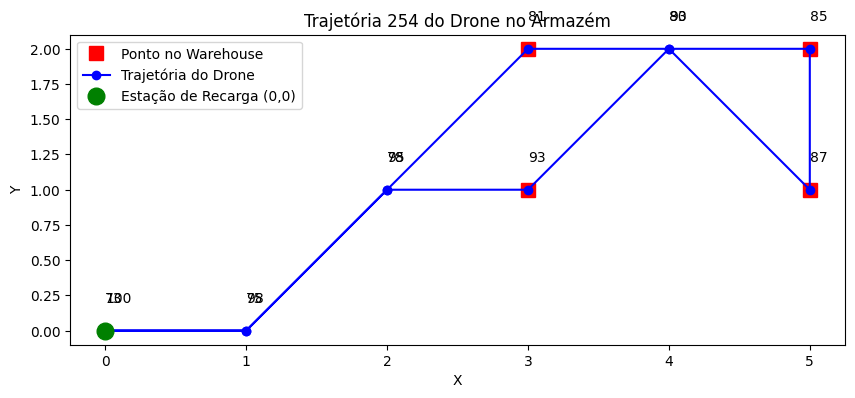


Trajetória 255:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 1), Bateria 91
Passo 5: Posição (5, 1), Bateria 89
Passo 6: Posição (5, 2), Bateria 87
Passo 7: Posição (4, 2), Bateria 85
Passo 8: Posição (3, 2), Bateria 83
Passo 9: Posição (2, 1), Bateria 80
Passo 10: Posição (1, 0), Bateria 77
Passo 11: Posição (0, 0), Bateria 75


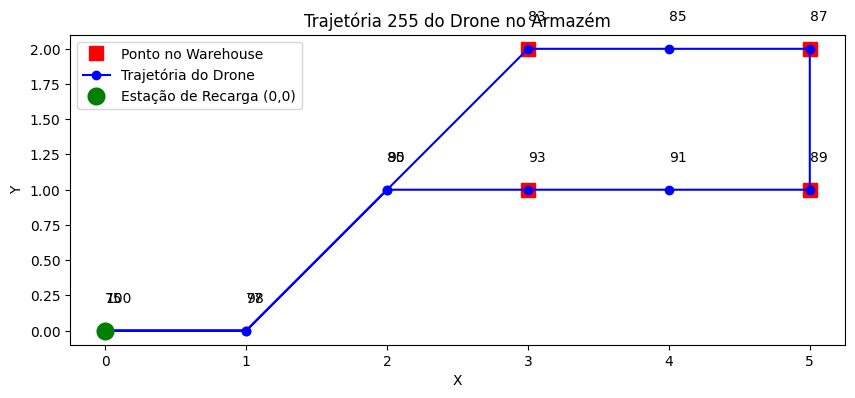


Trajetória 256:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 0), Bateria 90
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 2), Bateria 83
Passo 8: Posição (3, 2), Bateria 81
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 1), Bateria 76
Passo 11: Posição (0, 0), Bateria 73


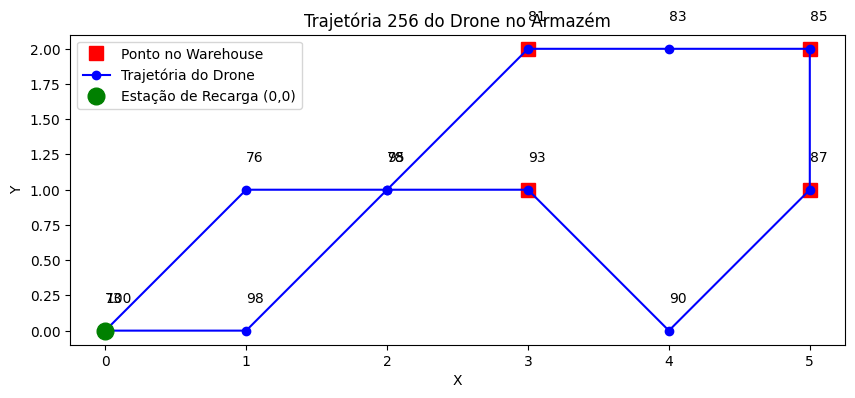


Trajetória 257:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 2), Bateria 83
Passo 8: Posição (3, 2), Bateria 81
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 1), Bateria 76
Passo 11: Posição (0, 0), Bateria 73


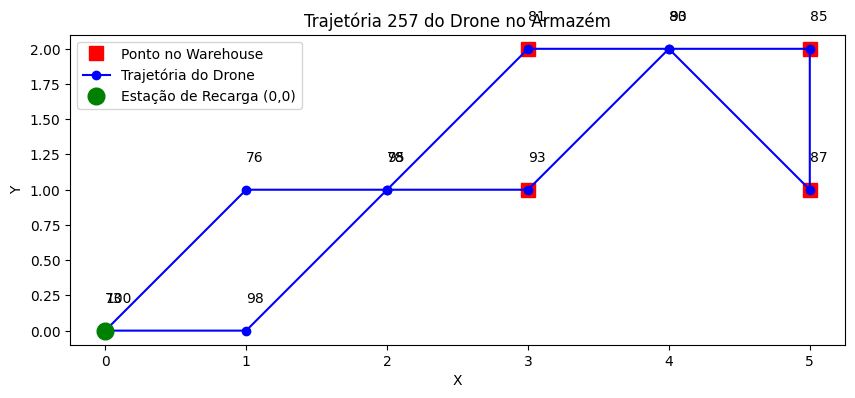


Trajetória 258:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 0), Bateria 94
Passo 3: Posição (3, 1), Bateria 91
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 2), Bateria 81
Passo 8: Posição (3, 2), Bateria 79
Passo 9: Posição (2, 1), Bateria 76
Passo 10: Posição (1, 0), Bateria 73
Passo 11: Posição (0, 0), Bateria 71


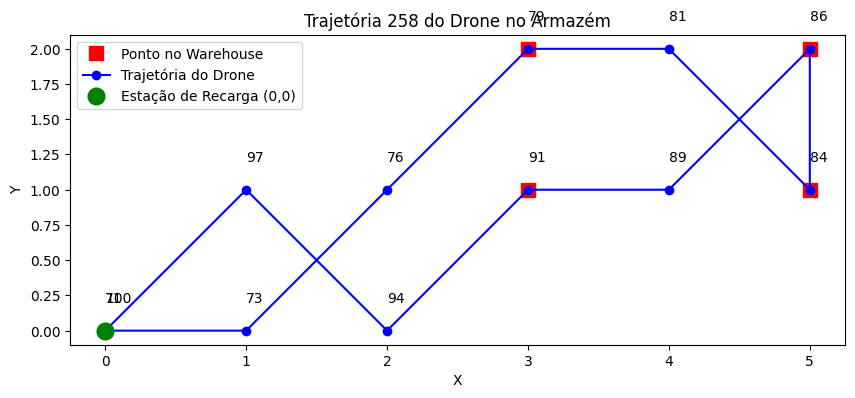


Trajetória 259:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 0), Bateria 94
Passo 3: Posição (3, 1), Bateria 91
Passo 4: Posição (4, 0), Bateria 88
Passo 5: Posição (5, 1), Bateria 85
Passo 6: Posição (5, 2), Bateria 83
Passo 7: Posição (4, 2), Bateria 81
Passo 8: Posição (3, 2), Bateria 79
Passo 9: Posição (2, 1), Bateria 76
Passo 10: Posição (1, 0), Bateria 73
Passo 11: Posição (0, 0), Bateria 71


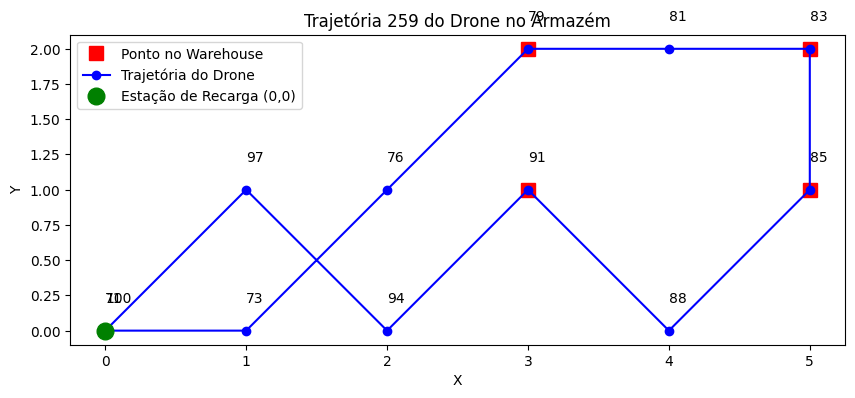


Trajetória 260:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 0), Bateria 90
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 2), Bateria 83
Passo 8: Posição (3, 2), Bateria 81
Passo 9: Posição (2, 2), Bateria 79
Passo 10: Posição (1, 1), Bateria 76
Passo 11: Posição (0, 0), Bateria 73


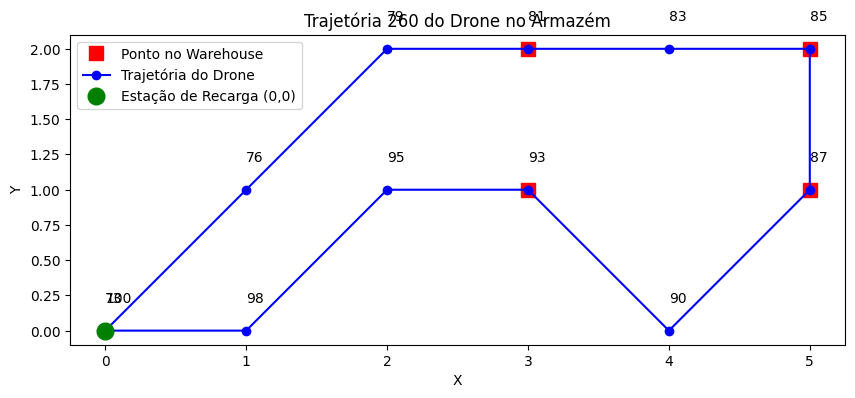


Trajetória 261:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 2), Bateria 83
Passo 8: Posição (3, 2), Bateria 81
Passo 9: Posição (2, 2), Bateria 79
Passo 10: Posição (1, 1), Bateria 76
Passo 11: Posição (0, 0), Bateria 73


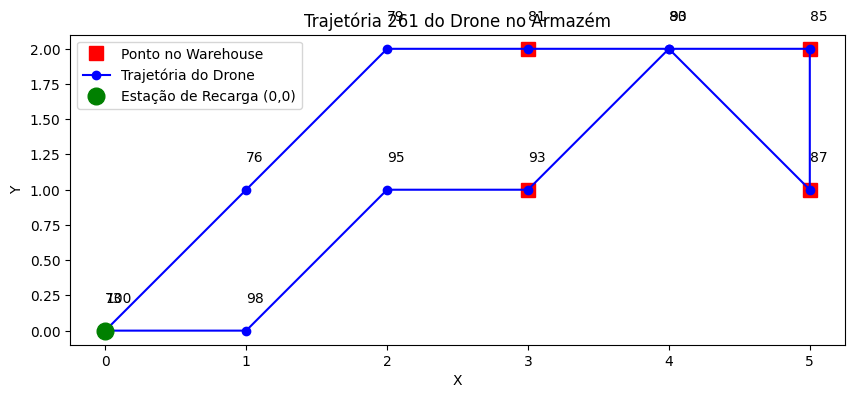


Trajetória 262:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 1), Bateria 91
Passo 5: Posição (5, 1), Bateria 89
Passo 6: Posição (5, 2), Bateria 87
Passo 7: Posição (4, 2), Bateria 85
Passo 8: Posição (3, 2), Bateria 83
Passo 9: Posição (2, 2), Bateria 81
Passo 10: Posição (1, 1), Bateria 78
Passo 11: Posição (0, 0), Bateria 75


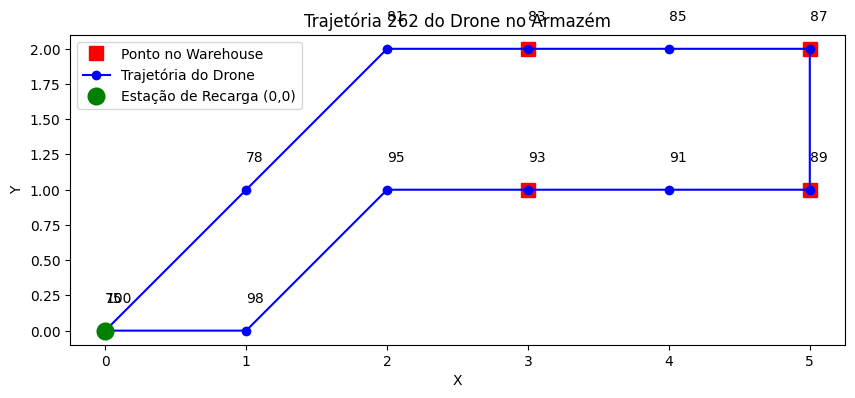


Trajetória 263:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 1), Bateria 91
Passo 5: Posição (5, 1), Bateria 89
Passo 6: Posição (5, 2), Bateria 87
Passo 7: Posição (4, 2), Bateria 85
Passo 8: Posição (3, 2), Bateria 83
Passo 9: Posição (2, 1), Bateria 80
Passo 10: Posição (1, 1), Bateria 78
Passo 11: Posição (0, 0), Bateria 75


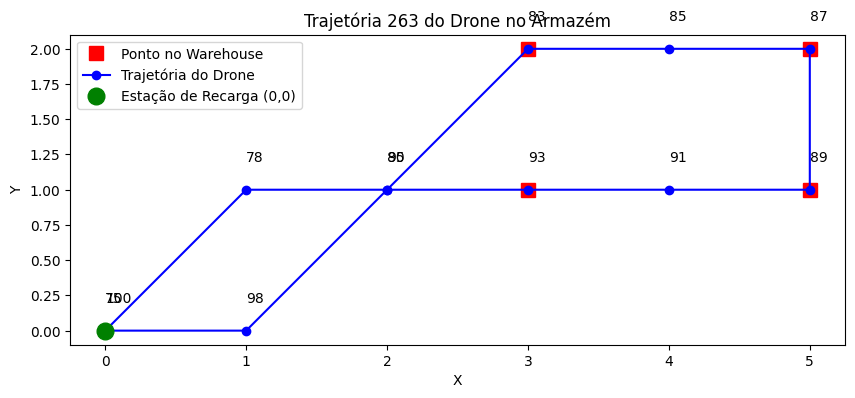


Trajetória 264:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 2), Bateria 88
Passo 6: Posição (5, 1), Bateria 86
Passo 7: Posição (4, 2), Bateria 83
Passo 8: Posição (3, 2), Bateria 81
Passo 9: Posição (2, 2), Bateria 79
Passo 10: Posição (1, 1), Bateria 76
Passo 11: Posição (0, 0), Bateria 73


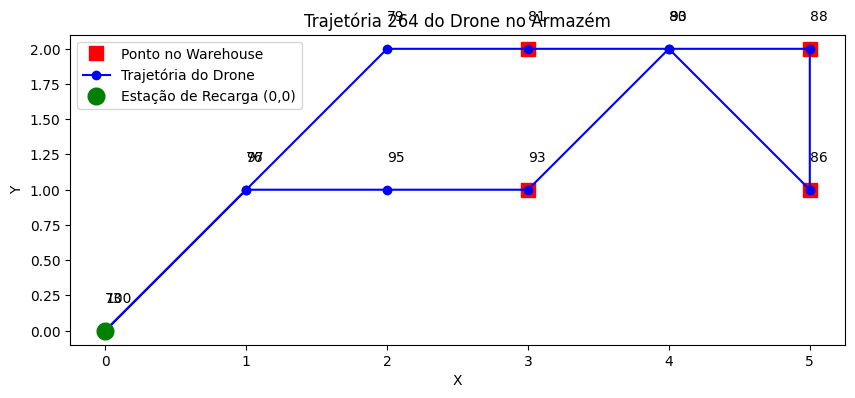


Trajetória 265:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 2), Bateria 88
Passo 6: Posição (5, 1), Bateria 86
Passo 7: Posição (4, 2), Bateria 83
Passo 8: Posição (3, 2), Bateria 81
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 0), Bateria 75
Passo 11: Posição (0, 0), Bateria 73


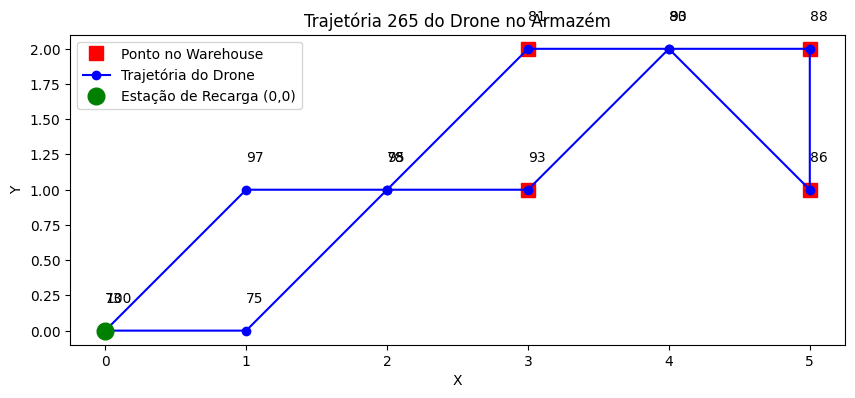


Trajetória 266:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 0), Bateria 90
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 2), Bateria 83
Passo 8: Posição (3, 2), Bateria 81
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 0), Bateria 75
Passo 11: Posição (0, 0), Bateria 73


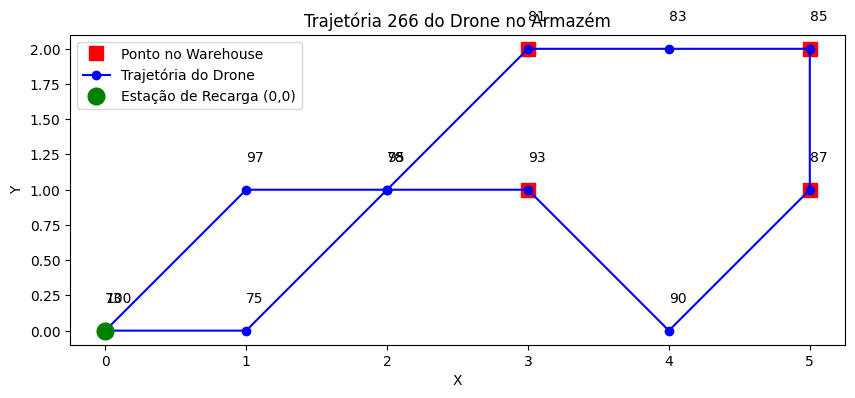


Trajetória 267:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 2), Bateria 83
Passo 8: Posição (3, 2), Bateria 81
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 0), Bateria 75
Passo 11: Posição (0, 0), Bateria 73


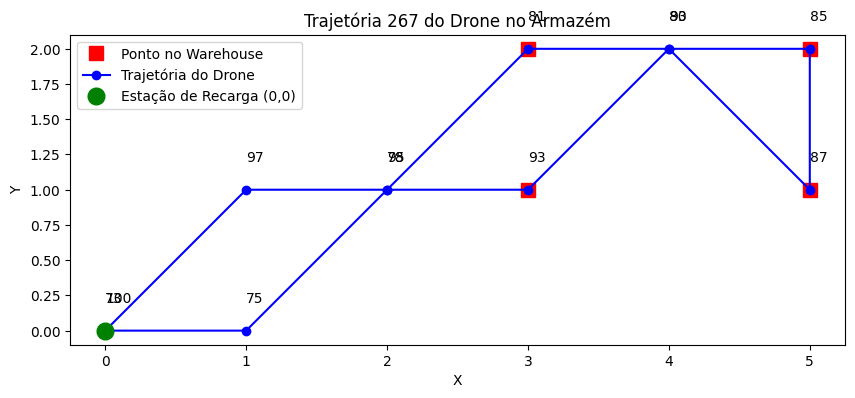


Trajetória 268:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 2), Bateria 88
Passo 6: Posição (5, 1), Bateria 86
Passo 7: Posição (4, 2), Bateria 83
Passo 8: Posição (3, 2), Bateria 81
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 1), Bateria 76
Passo 11: Posição (0, 0), Bateria 73


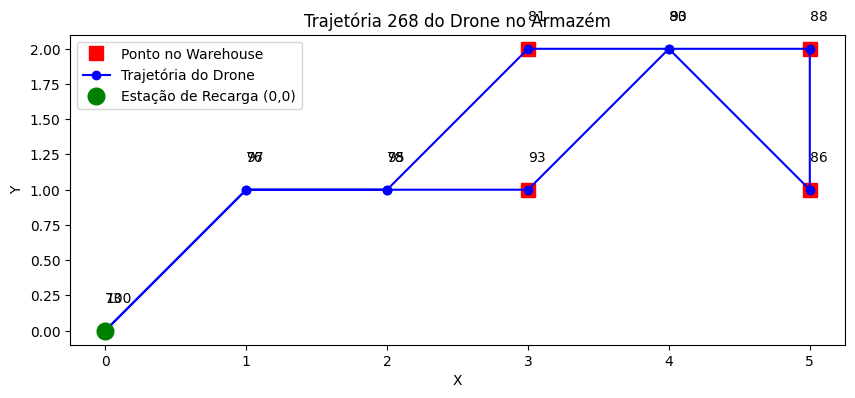


Trajetória 269:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 0), Bateria 90
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 2), Bateria 83
Passo 8: Posição (3, 2), Bateria 81
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 1), Bateria 76
Passo 11: Posição (0, 0), Bateria 73


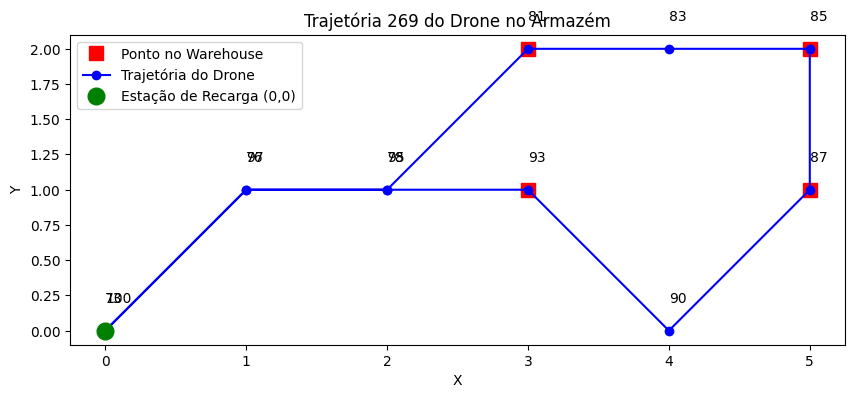


Trajetória 270:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 2), Bateria 83
Passo 8: Posição (3, 2), Bateria 81
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 1), Bateria 76
Passo 11: Posição (0, 0), Bateria 73


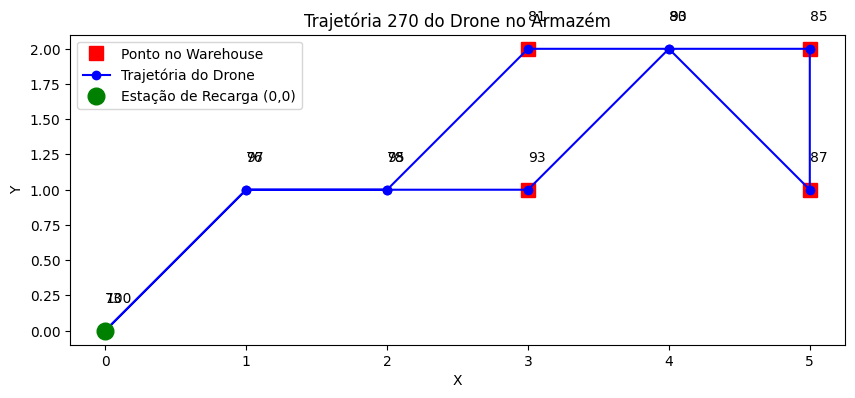


Trajetória 271:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 1), Bateria 91
Passo 5: Posição (5, 2), Bateria 88
Passo 6: Posição (5, 1), Bateria 86
Passo 7: Posição (4, 1), Bateria 84
Passo 8: Posição (3, 2), Bateria 81
Passo 9: Posição (2, 2), Bateria 79
Passo 10: Posição (1, 1), Bateria 76
Passo 11: Posição (0, 0), Bateria 73


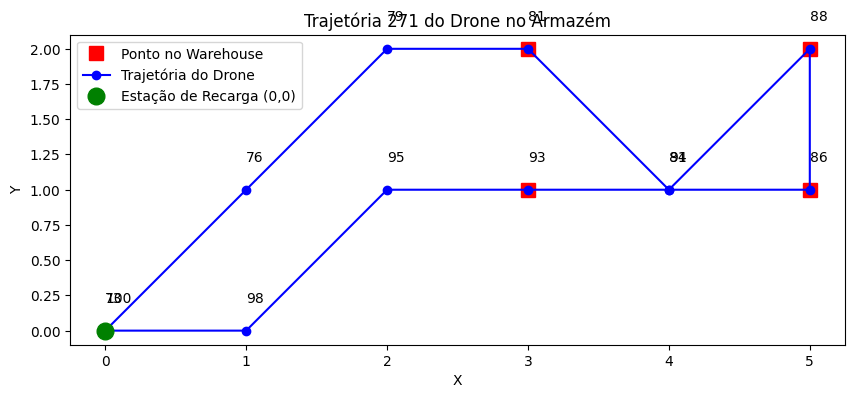


Trajetória 272:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 2), Bateria 88
Passo 6: Posição (5, 1), Bateria 86
Passo 7: Posição (4, 1), Bateria 84
Passo 8: Posição (3, 2), Bateria 81
Passo 9: Posição (2, 2), Bateria 79
Passo 10: Posição (1, 1), Bateria 76
Passo 11: Posição (0, 0), Bateria 73


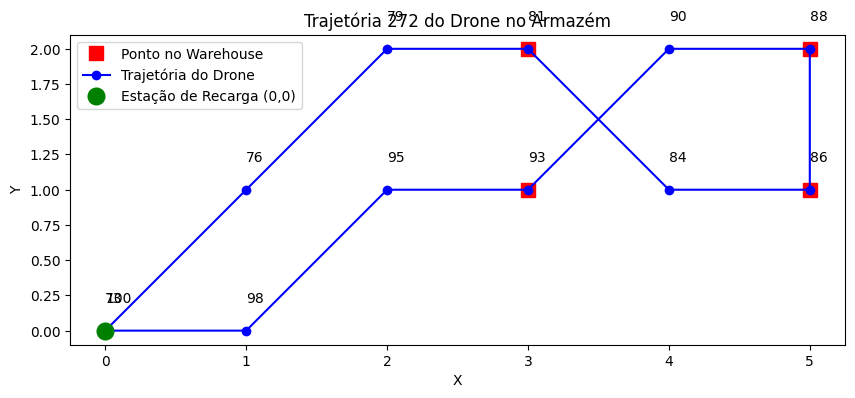


Trajetória 273:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 0), Bateria 90
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 2), Bateria 79
Passo 9: Posição (2, 1), Bateria 76
Passo 10: Posição (1, 0), Bateria 73
Passo 11: Posição (0, 0), Bateria 71


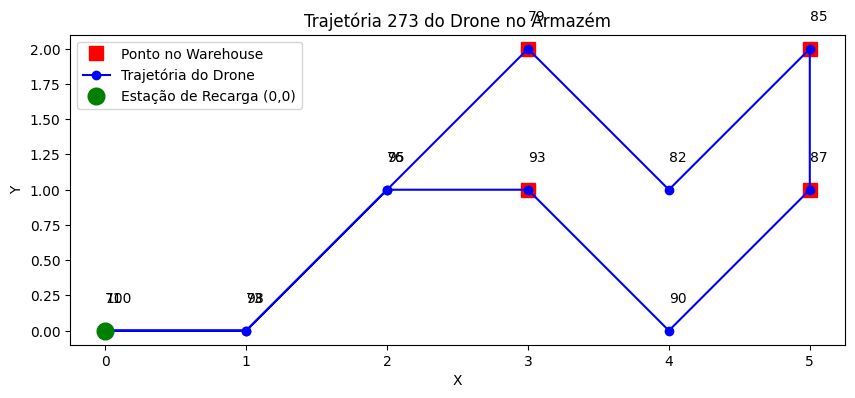


Trajetória 274:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 0), Bateria 90
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 3), Bateria 82
Passo 8: Posição (3, 2), Bateria 79
Passo 9: Posição (2, 1), Bateria 76
Passo 10: Posição (1, 0), Bateria 73
Passo 11: Posição (0, 0), Bateria 71


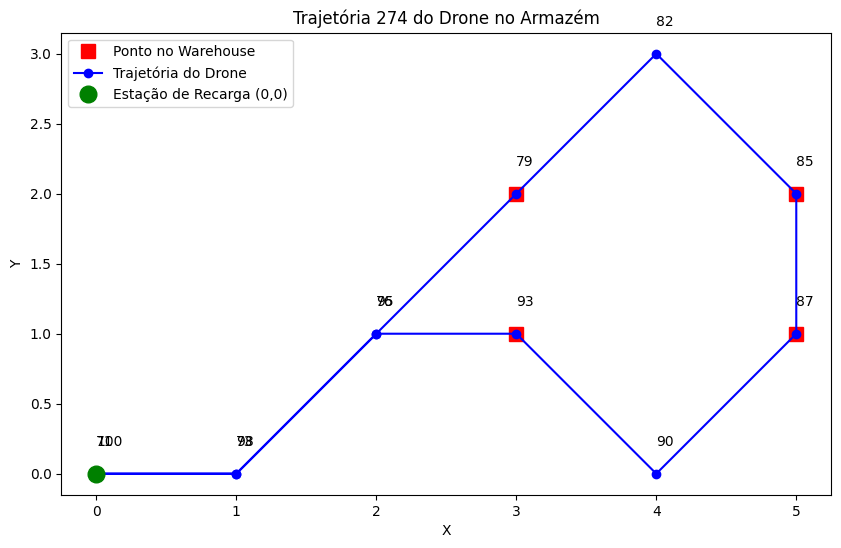


Trajetória 275:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 2), Bateria 79
Passo 9: Posição (2, 1), Bateria 76
Passo 10: Posição (1, 0), Bateria 73
Passo 11: Posição (0, 0), Bateria 71


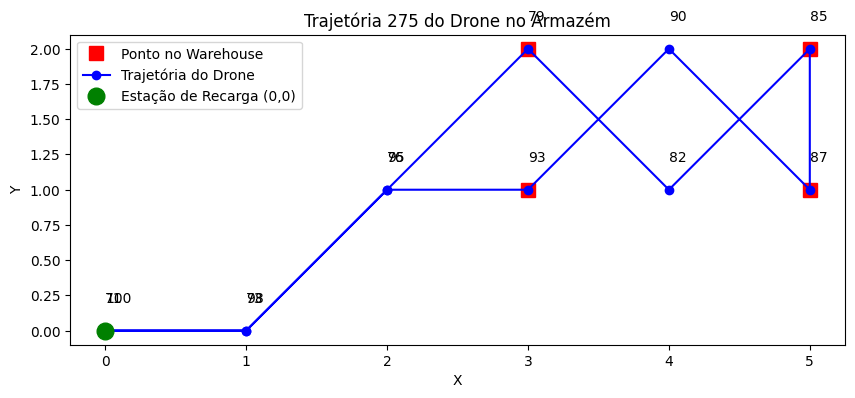


Trajetória 276:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 0), Bateria 94
Passo 3: Posição (3, 1), Bateria 91
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 2), Bateria 81
Passo 8: Posição (3, 2), Bateria 79
Passo 9: Posição (2, 1), Bateria 76
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


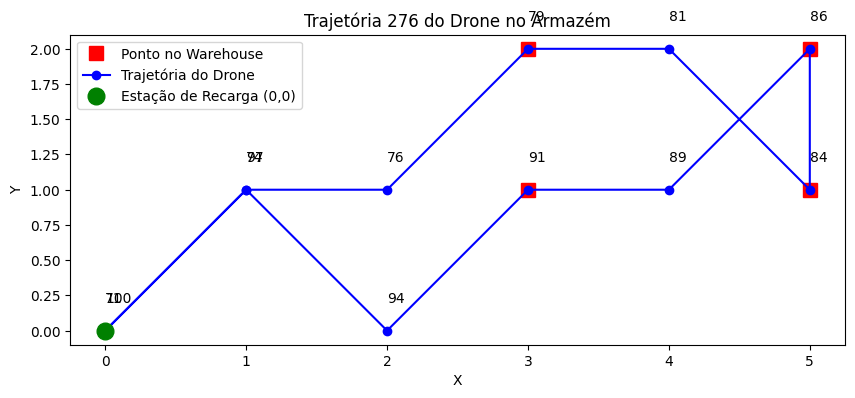


Trajetória 277:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 2), Bateria 88
Passo 6: Posição (5, 1), Bateria 86
Passo 7: Posição (4, 1), Bateria 84
Passo 8: Posição (3, 2), Bateria 81
Passo 9: Posição (2, 2), Bateria 79
Passo 10: Posição (1, 1), Bateria 76
Passo 11: Posição (0, 0), Bateria 73


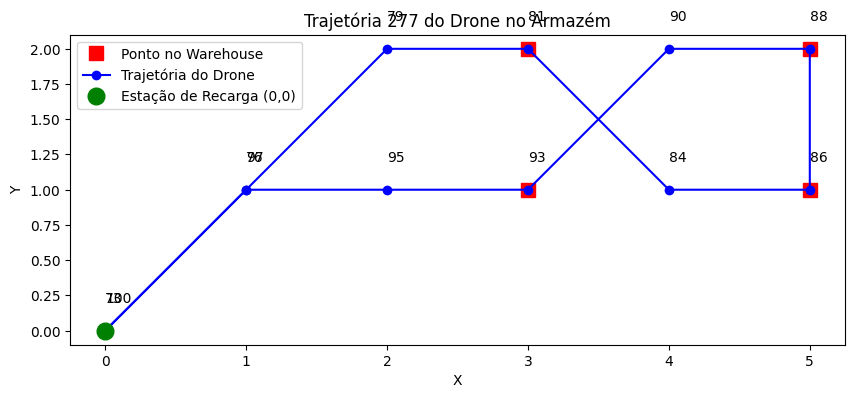


Trajetória 278:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 0), Bateria 90
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 2), Bateria 79
Passo 9: Posição (2, 2), Bateria 77
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


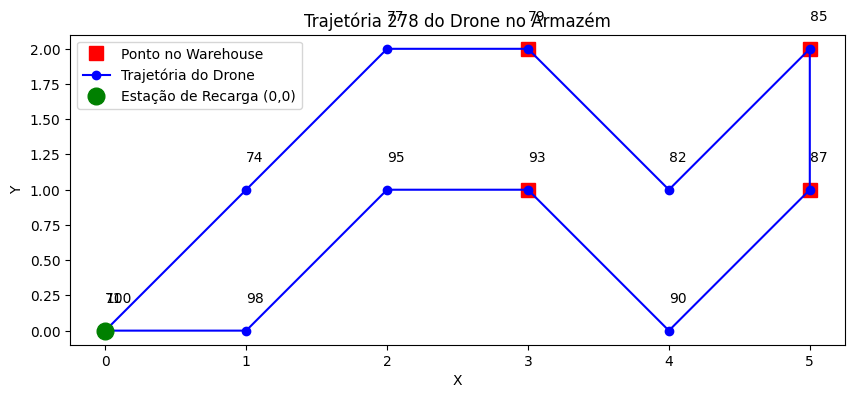


Trajetória 279:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 0), Bateria 90
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 3), Bateria 82
Passo 8: Posição (3, 2), Bateria 79
Passo 9: Posição (2, 2), Bateria 77
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


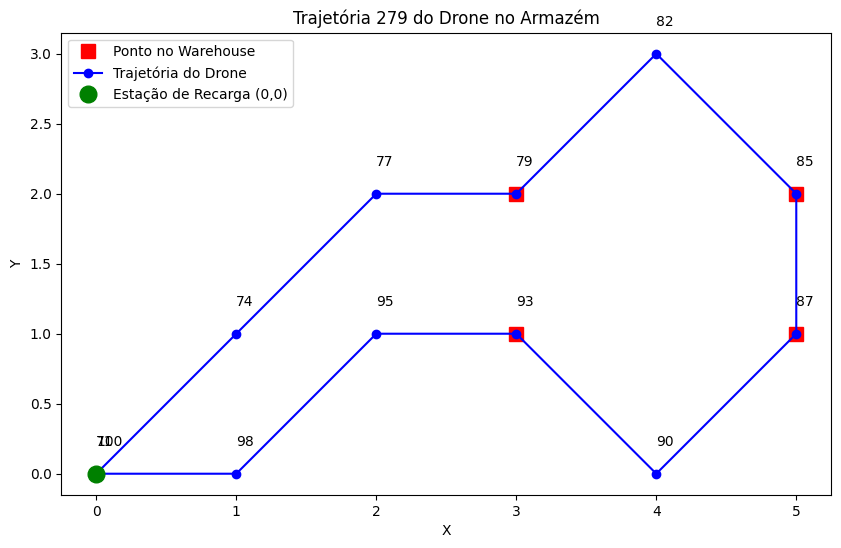


Trajetória 280:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 2), Bateria 79
Passo 9: Posição (2, 2), Bateria 77
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


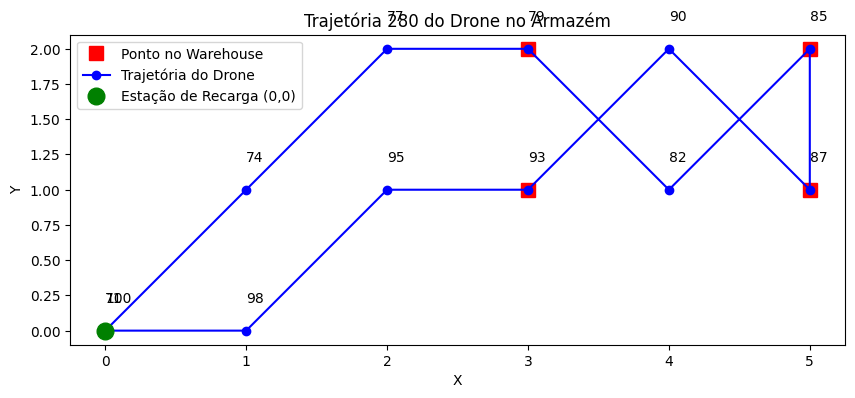


Trajetória 281:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 3), Bateria 82
Passo 8: Posição (3, 2), Bateria 79
Passo 9: Posição (2, 2), Bateria 77
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


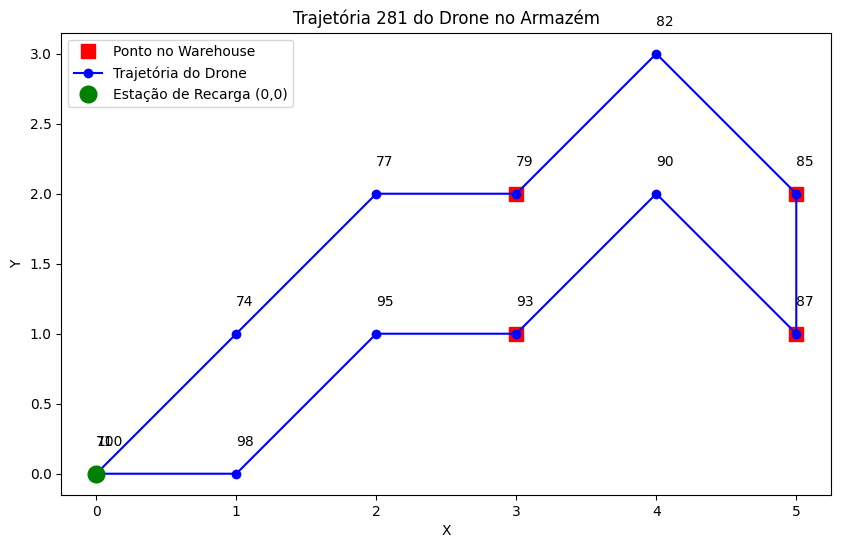


Trajetória 282:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 1), Bateria 91
Passo 5: Posição (5, 1), Bateria 89
Passo 6: Posição (5, 2), Bateria 87
Passo 7: Posição (4, 1), Bateria 84
Passo 8: Posição (3, 2), Bateria 81
Passo 9: Posição (2, 2), Bateria 79
Passo 10: Posição (1, 1), Bateria 76
Passo 11: Posição (0, 0), Bateria 73


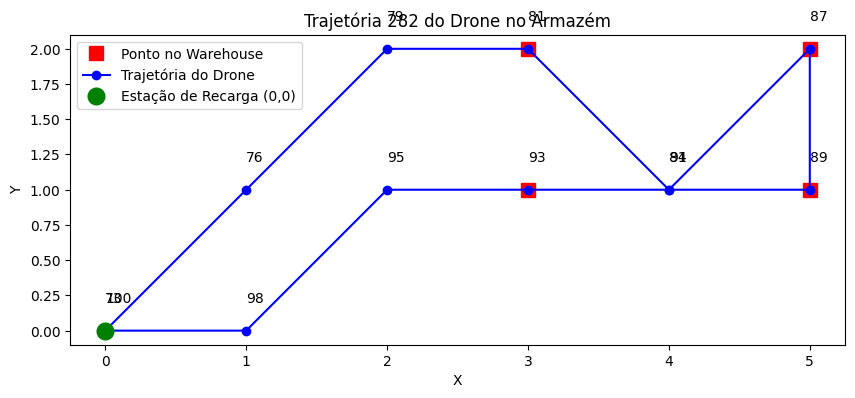


Trajetória 283:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 3), Bateria 82
Passo 8: Posição (3, 2), Bateria 79
Passo 9: Posição (2, 1), Bateria 76
Passo 10: Posição (1, 0), Bateria 73
Passo 11: Posição (0, 0), Bateria 71


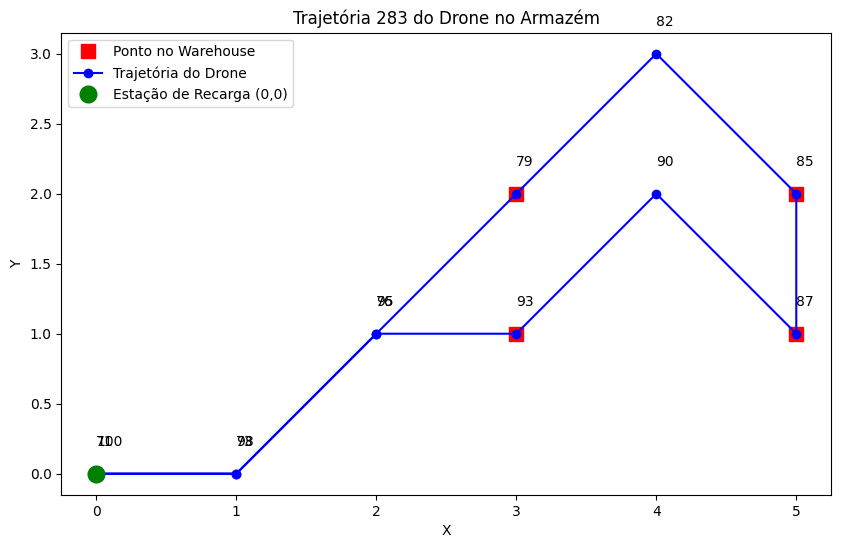


Trajetória 284:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 1), Bateria 91
Passo 5: Posição (5, 1), Bateria 89
Passo 6: Posição (5, 2), Bateria 87
Passo 7: Posição (4, 1), Bateria 84
Passo 8: Posição (3, 2), Bateria 81
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 0), Bateria 75
Passo 11: Posição (0, 0), Bateria 73


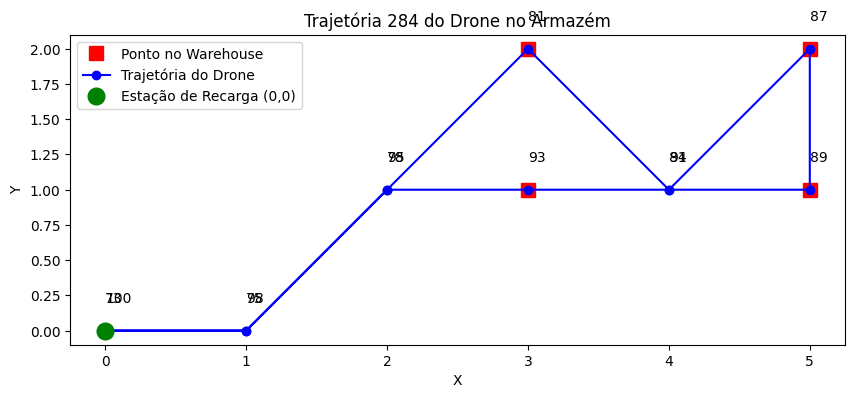


Trajetória 285:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 1), Bateria 91
Passo 5: Posição (5, 1), Bateria 89
Passo 6: Posição (5, 2), Bateria 87
Passo 7: Posição (4, 3), Bateria 84
Passo 8: Posição (3, 2), Bateria 81
Passo 9: Posição (2, 2), Bateria 79
Passo 10: Posição (1, 1), Bateria 76
Passo 11: Posição (0, 0), Bateria 73


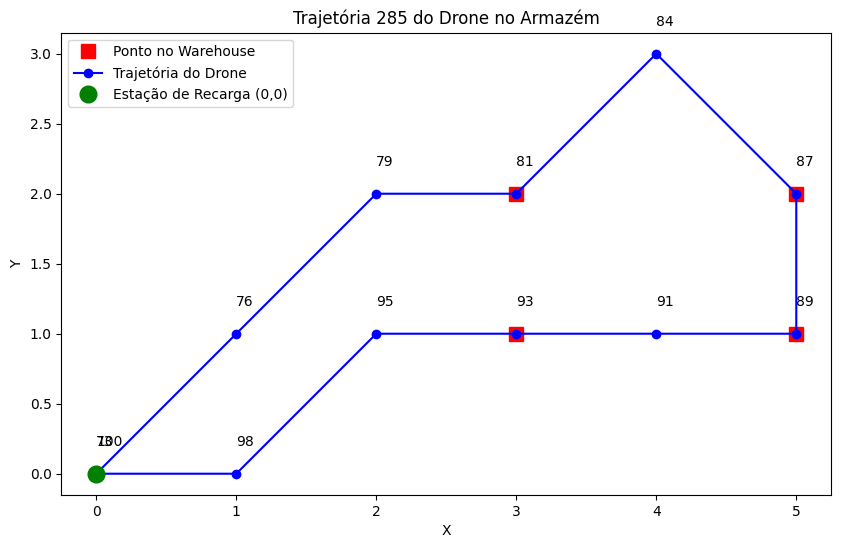


Trajetória 286:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 0), Bateria 90
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 2), Bateria 79
Passo 9: Posição (2, 1), Bateria 76
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


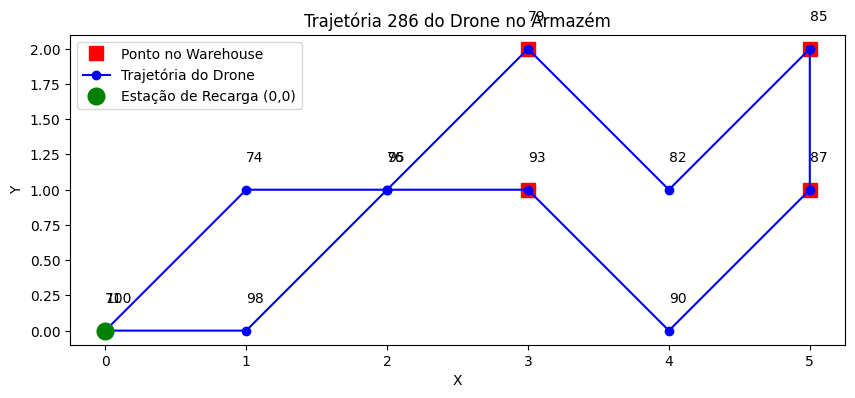


Trajetória 287:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 1), Bateria 91
Passo 5: Posição (5, 1), Bateria 89
Passo 6: Posição (5, 2), Bateria 87
Passo 7: Posição (4, 3), Bateria 84
Passo 8: Posição (3, 2), Bateria 81
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 0), Bateria 75
Passo 11: Posição (0, 0), Bateria 73


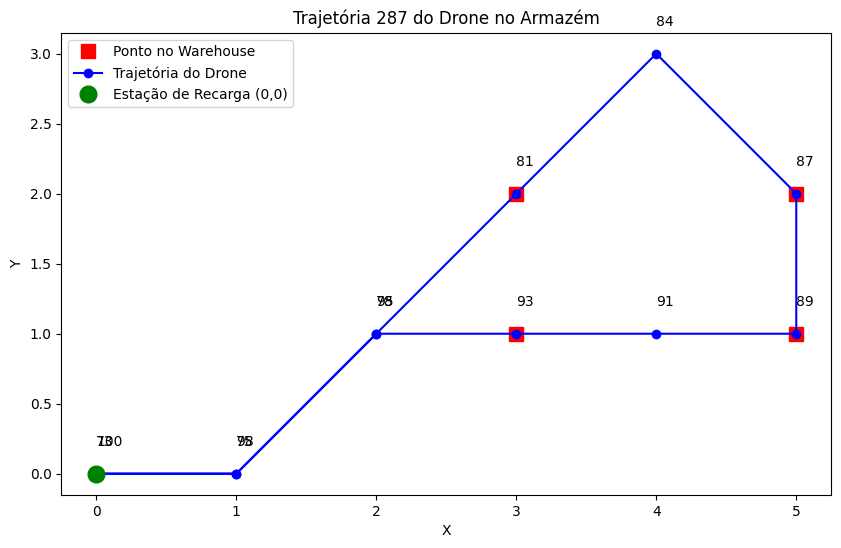


Trajetória 288:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 0), Bateria 90
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 3), Bateria 82
Passo 8: Posição (3, 2), Bateria 79
Passo 9: Posição (2, 1), Bateria 76
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


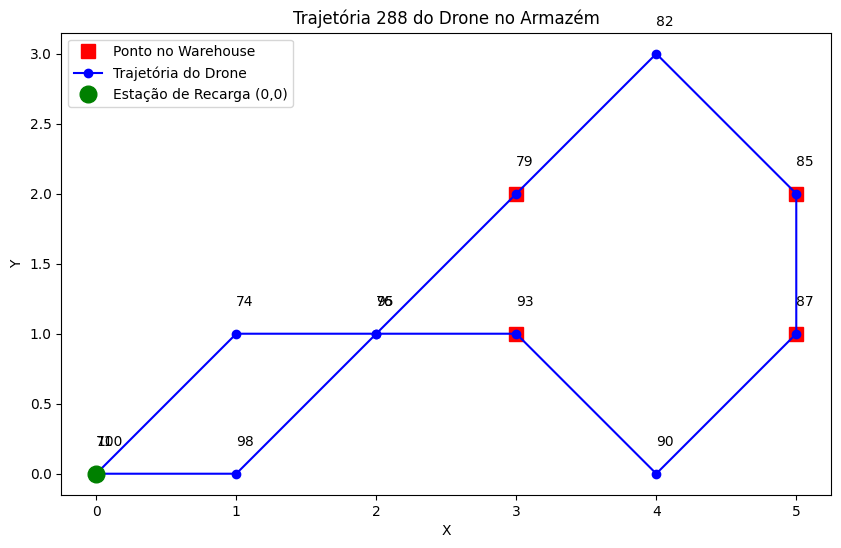


Trajetória 289:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 2), Bateria 79
Passo 9: Posição (2, 1), Bateria 76
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


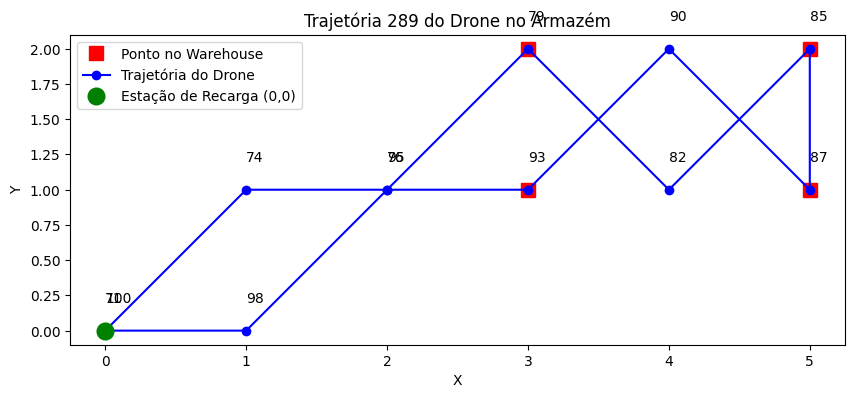


Trajetória 290:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 3), Bateria 82
Passo 8: Posição (3, 2), Bateria 79
Passo 9: Posição (2, 1), Bateria 76
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


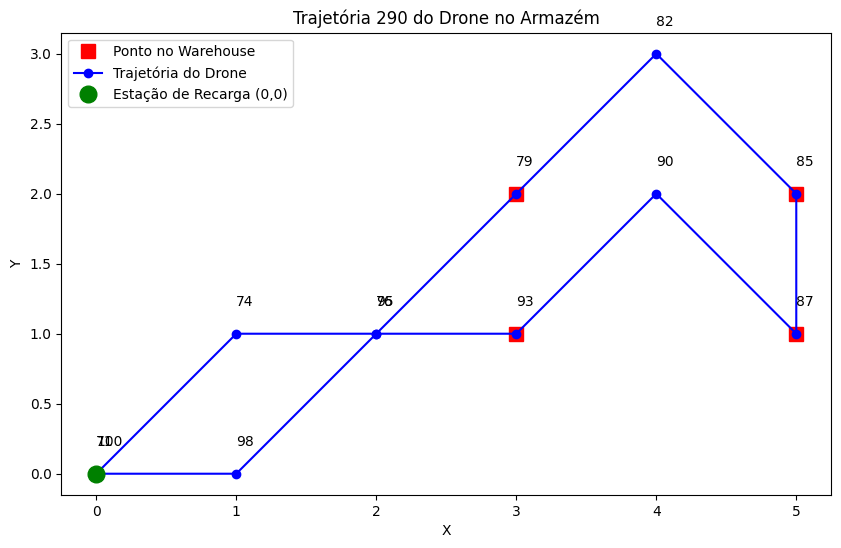


Trajetória 291:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 1), Bateria 91
Passo 5: Posição (5, 1), Bateria 89
Passo 6: Posição (5, 2), Bateria 87
Passo 7: Posição (4, 1), Bateria 84
Passo 8: Posição (3, 2), Bateria 81
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 1), Bateria 76
Passo 11: Posição (0, 0), Bateria 73


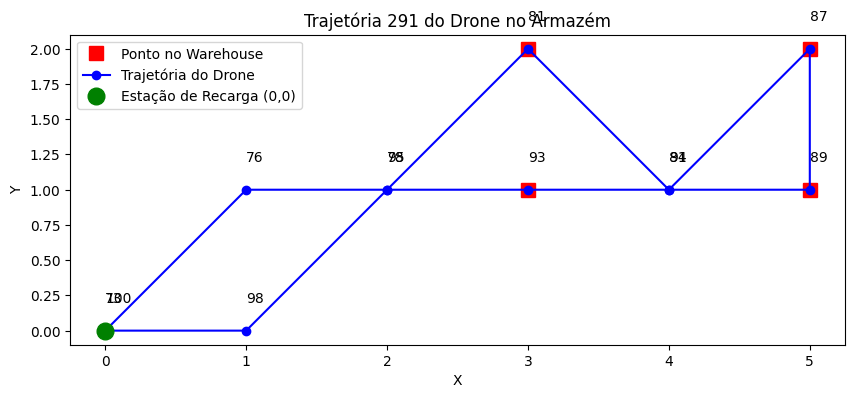


Trajetória 292:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 1), Bateria 91
Passo 5: Posição (5, 1), Bateria 89
Passo 6: Posição (5, 2), Bateria 87
Passo 7: Posição (4, 3), Bateria 84
Passo 8: Posição (3, 2), Bateria 81
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 1), Bateria 76
Passo 11: Posição (0, 0), Bateria 73


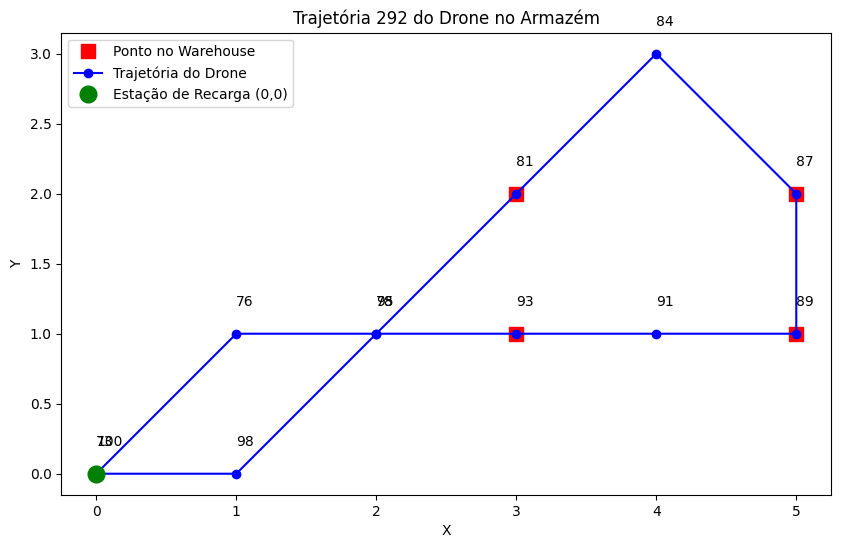


Trajetória 293:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 2), Bateria 88
Passo 6: Posição (5, 1), Bateria 86
Passo 7: Posição (4, 1), Bateria 84
Passo 8: Posição (3, 2), Bateria 81
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 0), Bateria 75
Passo 11: Posição (0, 0), Bateria 73


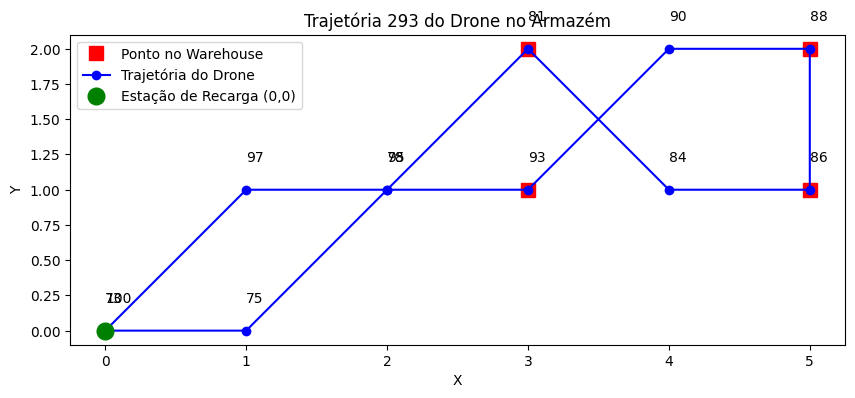


Trajetória 294:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 2), Bateria 88
Passo 6: Posição (5, 1), Bateria 86
Passo 7: Posição (4, 1), Bateria 84
Passo 8: Posição (3, 2), Bateria 81
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 1), Bateria 76
Passo 11: Posição (0, 0), Bateria 73


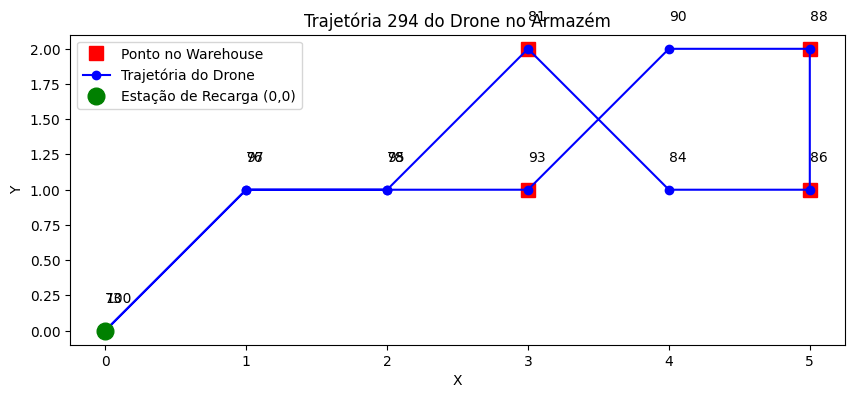


Trajetória 295:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 0), Bateria 90
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 3), Bateria 82
Passo 8: Posição (3, 2), Bateria 79
Passo 9: Posição (2, 1), Bateria 76
Passo 10: Posição (1, 0), Bateria 73
Passo 11: Posição (0, 0), Bateria 71


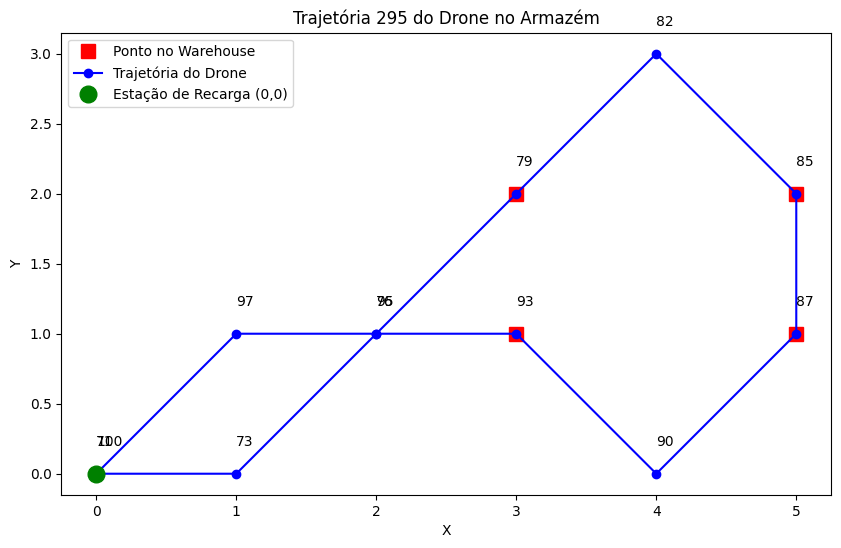


Trajetória 296:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 3), Bateria 82
Passo 8: Posição (3, 2), Bateria 79
Passo 9: Posição (2, 1), Bateria 76
Passo 10: Posição (1, 0), Bateria 73
Passo 11: Posição (0, 0), Bateria 71


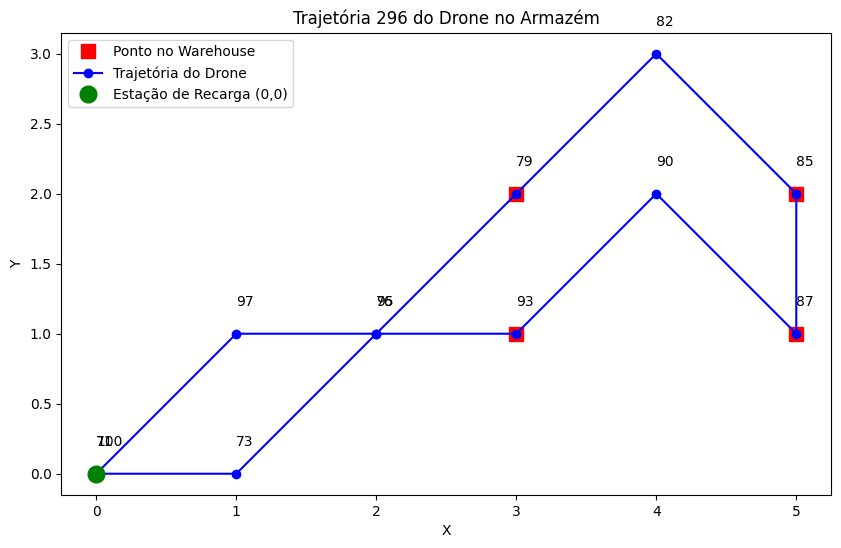


Trajetória 297:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 0), Bateria 90
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 2), Bateria 79
Passo 9: Posição (2, 1), Bateria 76
Passo 10: Posição (1, 0), Bateria 73
Passo 11: Posição (0, 0), Bateria 71


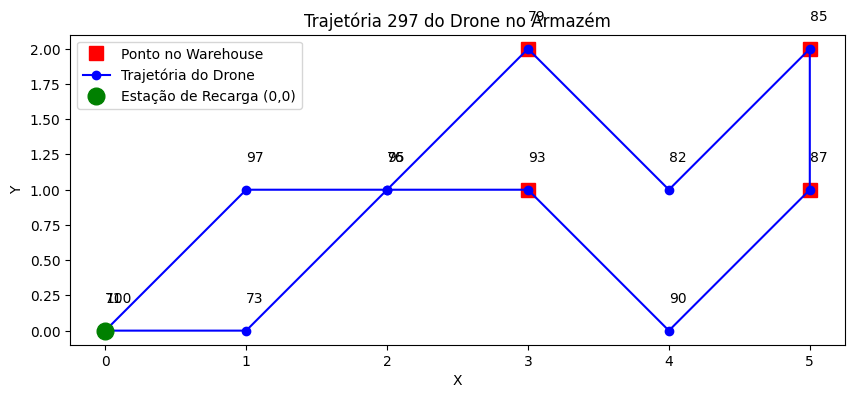


Trajetória 298:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 1), Bateria 91
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 2), Bateria 81
Passo 8: Posição (3, 2), Bateria 79
Passo 9: Posição (2, 2), Bateria 77
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


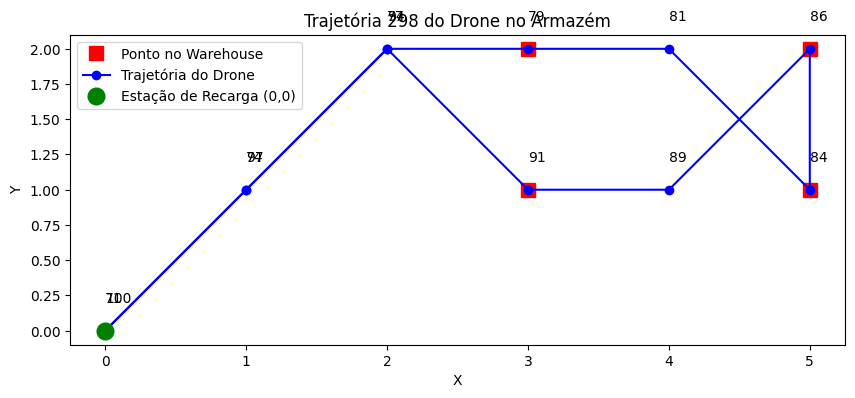


Trajetória 299:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 0), Bateria 94
Passo 3: Posição (3, 1), Bateria 91
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 2), Bateria 81
Passo 8: Posição (3, 2), Bateria 79
Passo 9: Posição (2, 2), Bateria 77
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


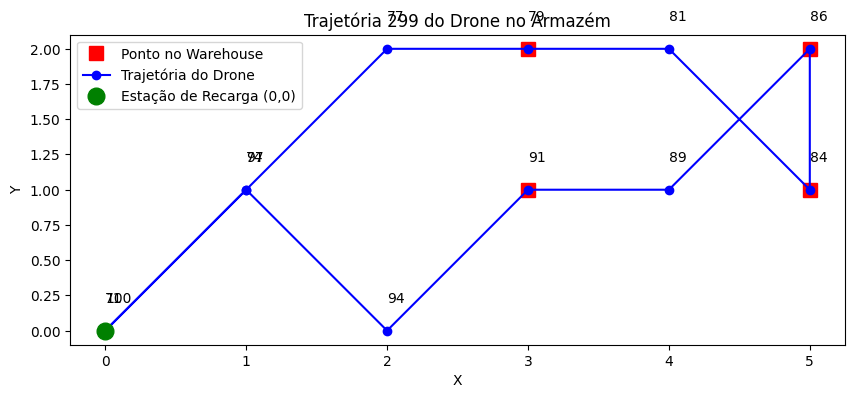


Trajetória 300:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 0), Bateria 94
Passo 3: Posição (3, 1), Bateria 91
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 2), Bateria 79
Passo 9: Posição (2, 2), Bateria 77
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


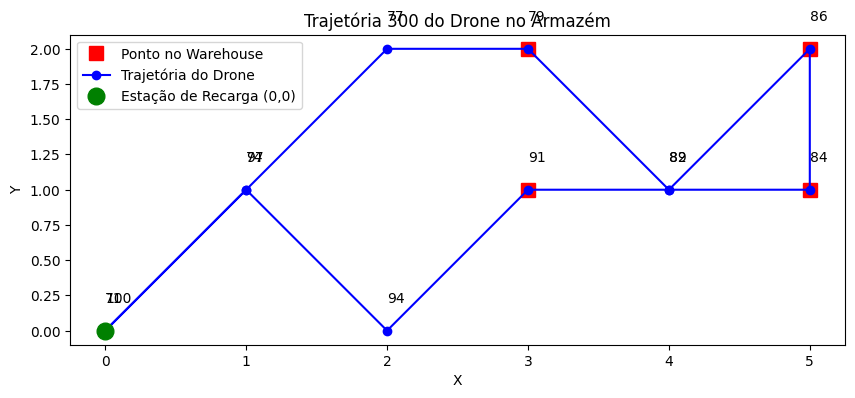


Trajetória 301:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 2), Bateria 79
Passo 9: Posição (2, 1), Bateria 76
Passo 10: Posição (1, 0), Bateria 73
Passo 11: Posição (0, 0), Bateria 71


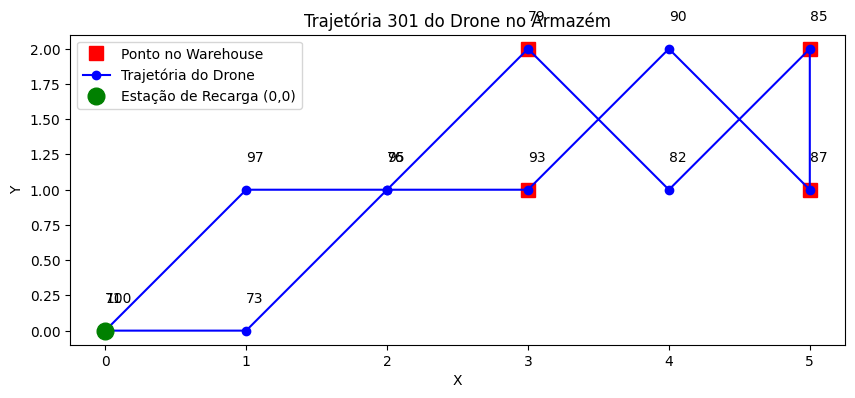


Trajetória 302:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 0), Bateria 90
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 3), Bateria 82
Passo 8: Posição (3, 2), Bateria 79
Passo 9: Posição (2, 2), Bateria 77
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


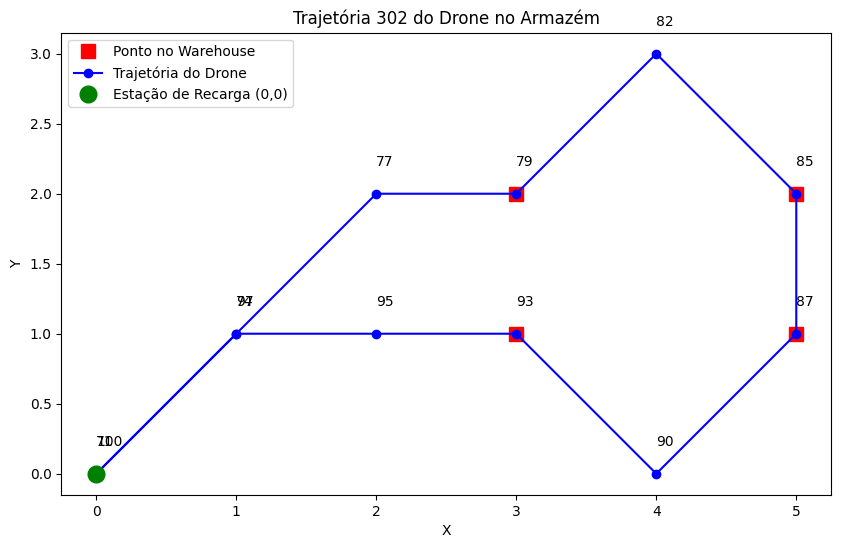


Trajetória 303:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 3), Bateria 82
Passo 8: Posição (3, 2), Bateria 79
Passo 9: Posição (2, 2), Bateria 77
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


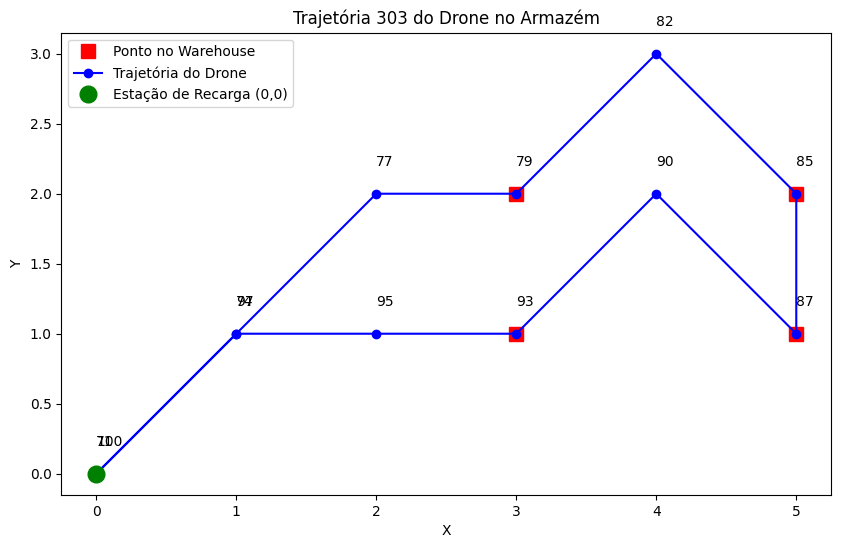


Trajetória 304:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 0), Bateria 90
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 2), Bateria 79
Passo 9: Posição (2, 2), Bateria 77
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


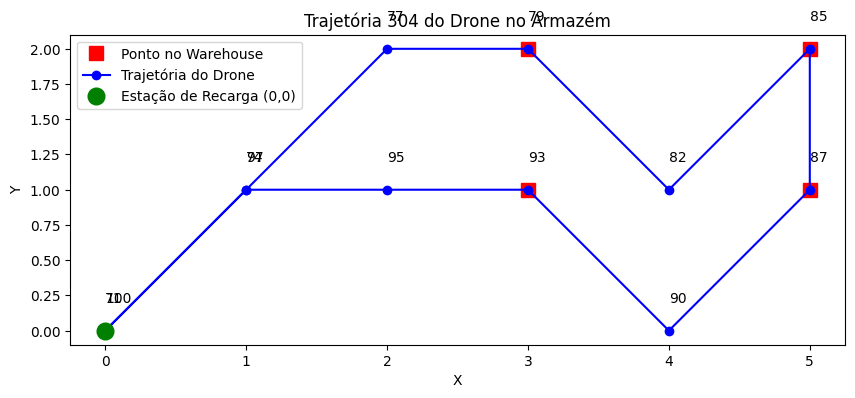


Trajetória 305:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 2), Bateria 79
Passo 9: Posição (2, 2), Bateria 77
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


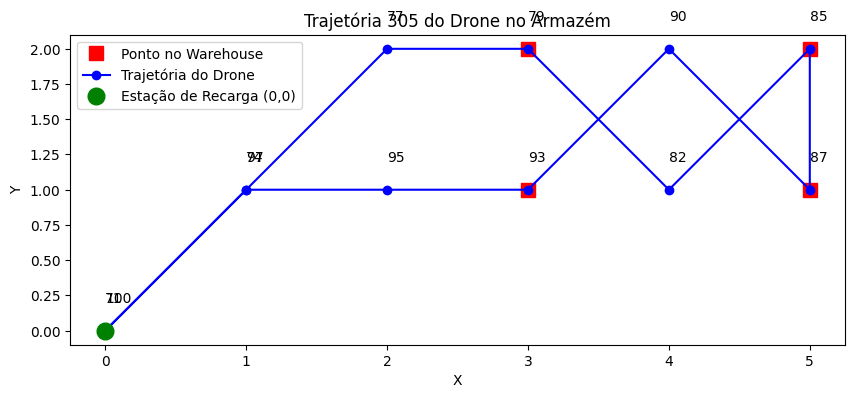


Trajetória 306:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 0), Bateria 90
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 3), Bateria 82
Passo 8: Posição (3, 2), Bateria 79
Passo 9: Posição (2, 1), Bateria 76
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


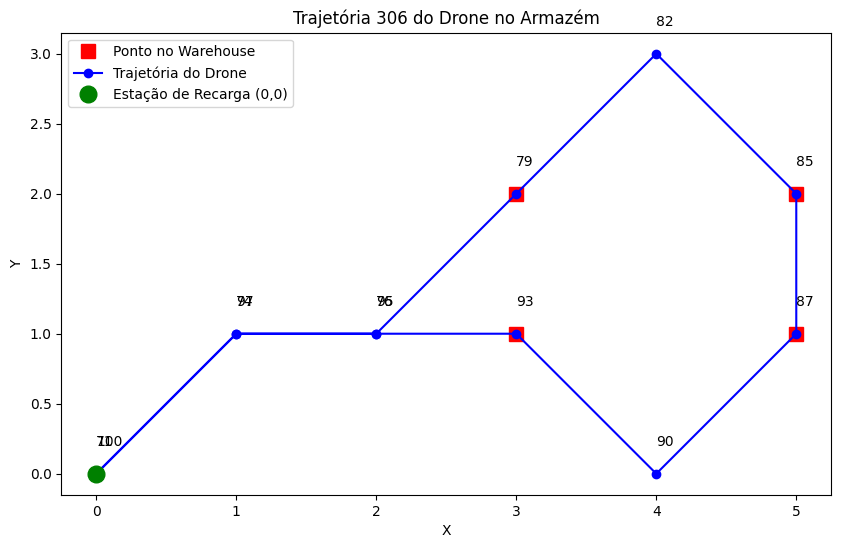


Trajetória 307:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 3), Bateria 82
Passo 8: Posição (3, 2), Bateria 79
Passo 9: Posição (2, 1), Bateria 76
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


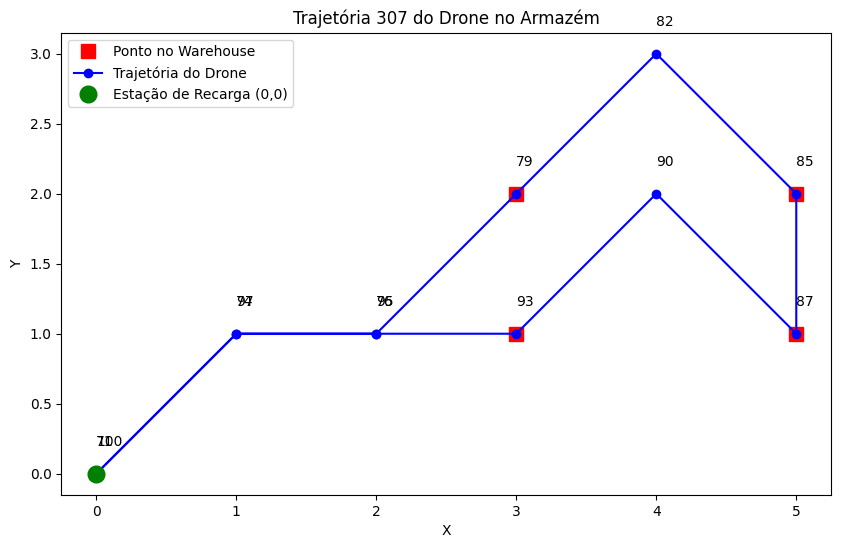


Trajetória 308:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 0), Bateria 90
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 2), Bateria 79
Passo 9: Posição (2, 1), Bateria 76
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


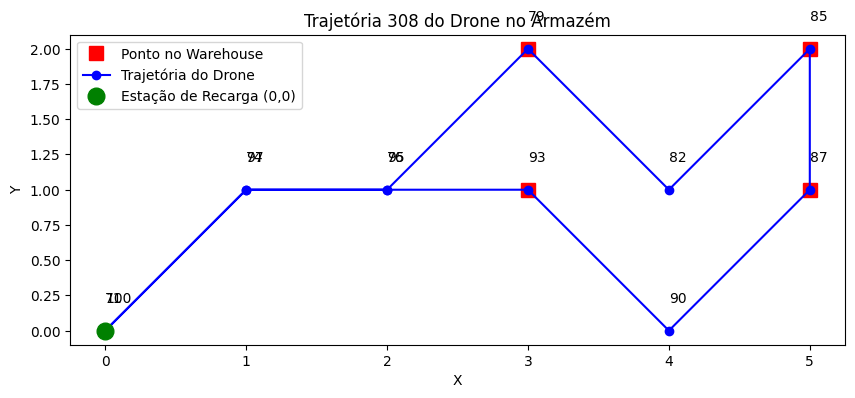


Trajetória 309:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 1), Bateria 95
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 2), Bateria 79
Passo 9: Posição (2, 1), Bateria 76
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


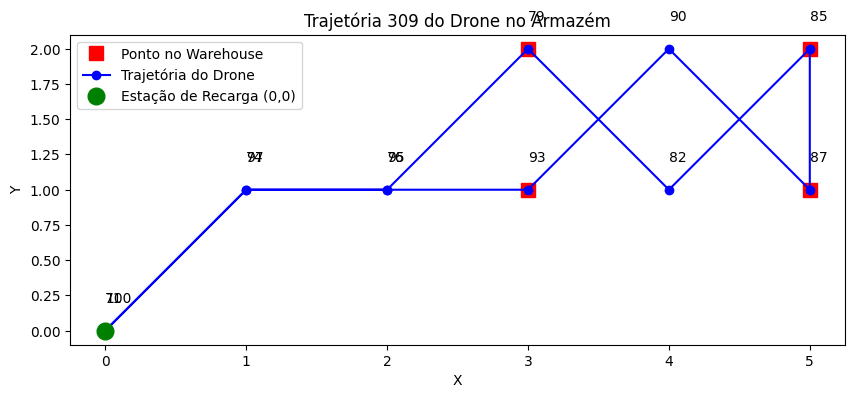


Trajetória 310:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 1), Bateria 91
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 2), Bateria 79
Passo 9: Posição (2, 2), Bateria 77
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


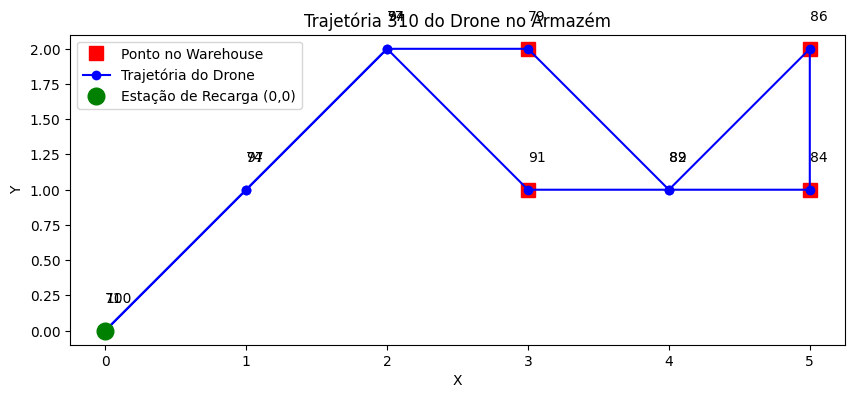


Trajetória 311:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 0), Bateria 94
Passo 3: Posição (3, 1), Bateria 91
Passo 4: Posição (4, 2), Bateria 88
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 2), Bateria 81
Passo 8: Posição (3, 2), Bateria 79
Passo 9: Posição (2, 2), Bateria 77
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


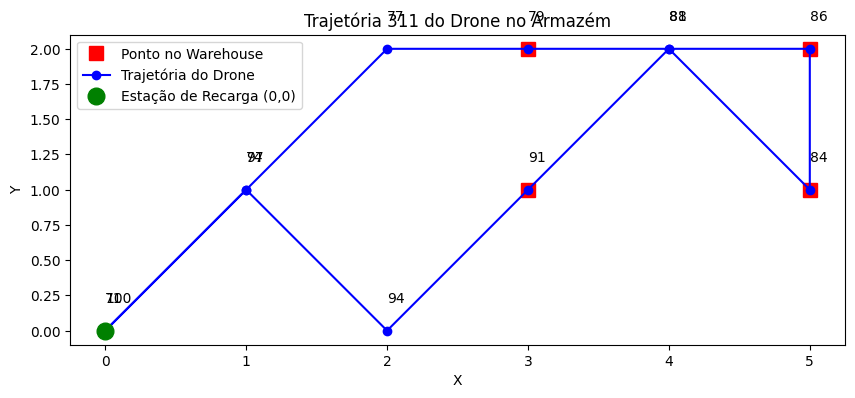


Trajetória 312:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 0), Bateria 94
Passo 3: Posição (3, 1), Bateria 91
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 2), Bateria 79
Passo 9: Posição (2, 1), Bateria 76
Passo 10: Posição (1, 0), Bateria 73
Passo 11: Posição (0, 0), Bateria 71


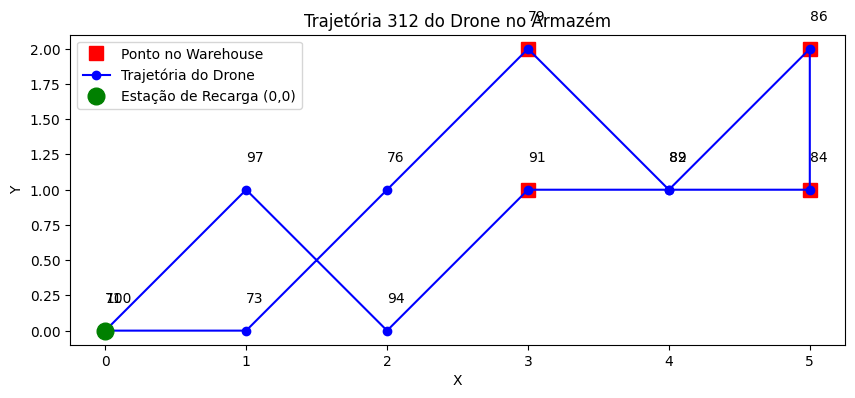


Trajetória 313:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 1), Bateria 91
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 2), Bateria 79
Passo 9: Posição (2, 1), Bateria 76
Passo 10: Posição (1, 0), Bateria 73
Passo 11: Posição (0, 0), Bateria 71


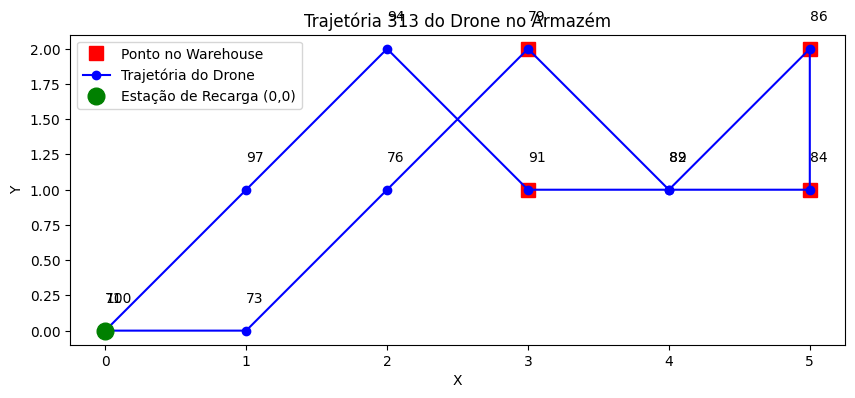


Trajetória 314:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 0), Bateria 94
Passo 3: Posição (3, 1), Bateria 91
Passo 4: Posição (4, 0), Bateria 88
Passo 5: Posição (5, 1), Bateria 85
Passo 6: Posição (5, 2), Bateria 83
Passo 7: Posição (4, 3), Bateria 80
Passo 8: Posição (3, 2), Bateria 77
Passo 9: Posição (2, 1), Bateria 74
Passo 10: Posição (1, 0), Bateria 71
Passo 11: Posição (0, 0), Bateria 69


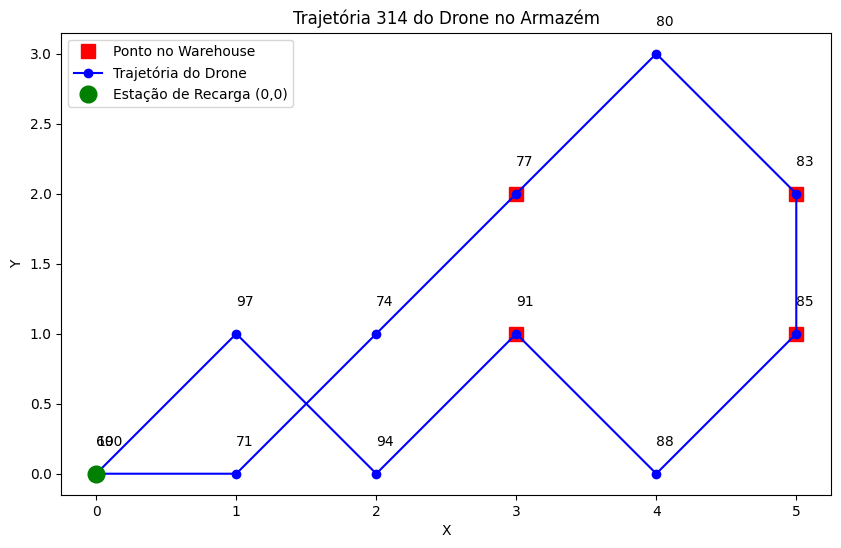


Trajetória 315:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 0), Bateria 96
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 0), Bateria 90
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 3), Bateria 82
Passo 8: Posição (3, 2), Bateria 79
Passo 9: Posição (2, 2), Bateria 77
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


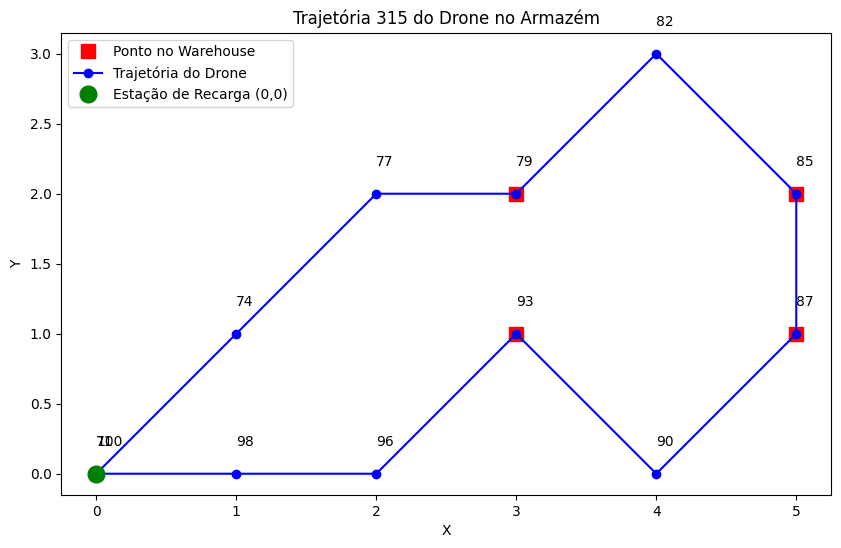


Trajetória 316:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 0), Bateria 96
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 3), Bateria 82
Passo 8: Posição (3, 2), Bateria 79
Passo 9: Posição (2, 2), Bateria 77
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


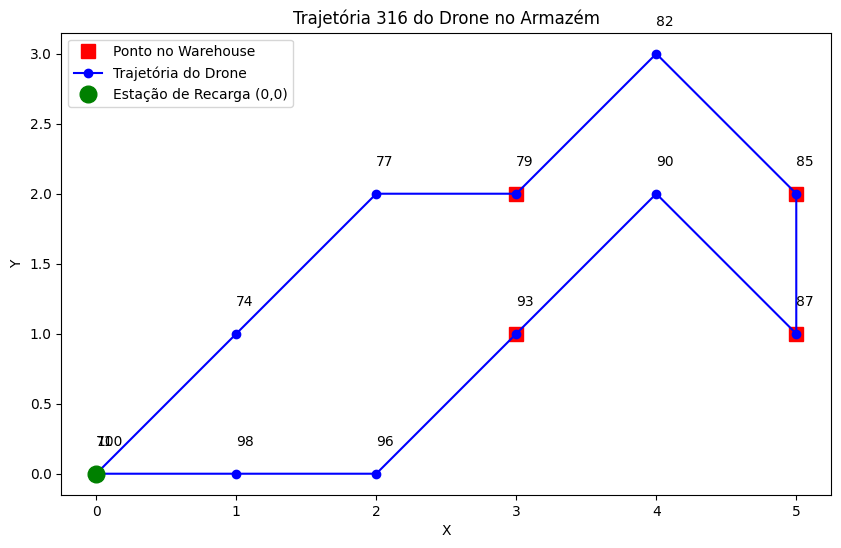


Trajetória 317:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 0), Bateria 96
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 0), Bateria 90
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 2), Bateria 79
Passo 9: Posição (2, 2), Bateria 77
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


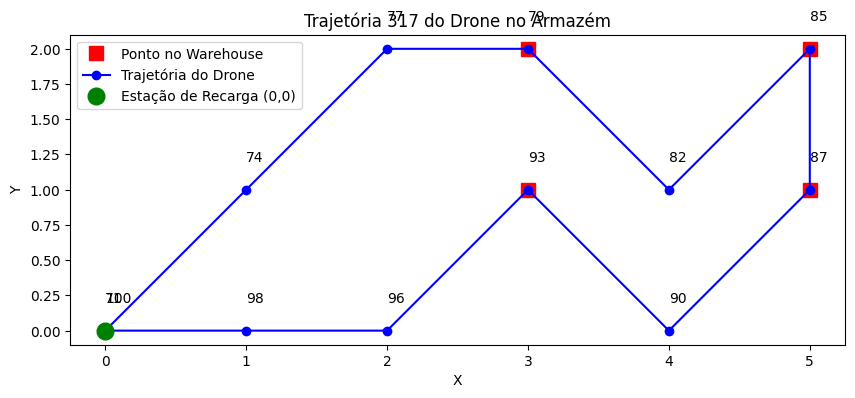


Trajetória 318:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 0), Bateria 94
Passo 3: Posição (3, 1), Bateria 91
Passo 4: Posição (4, 2), Bateria 88
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 2), Bateria 79
Passo 9: Posição (2, 1), Bateria 76
Passo 10: Posição (1, 0), Bateria 73
Passo 11: Posição (0, 0), Bateria 71


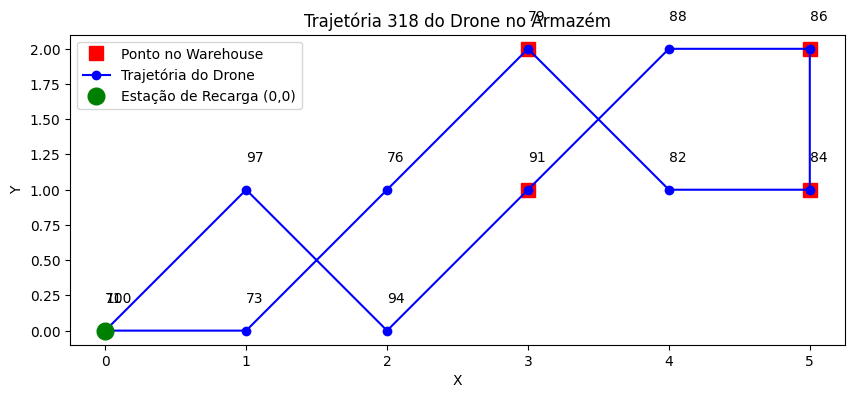


Trajetória 319:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 1), Bateria 91
Passo 4: Posição (4, 2), Bateria 88
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 2), Bateria 79
Passo 9: Posição (2, 1), Bateria 76
Passo 10: Posição (1, 0), Bateria 73
Passo 11: Posição (0, 0), Bateria 71


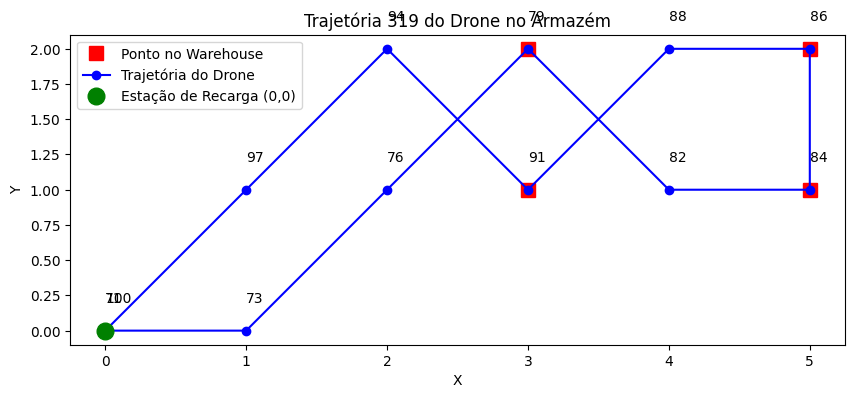


Trajetória 320:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 1), Bateria 91
Passo 4: Posição (4, 0), Bateria 88
Passo 5: Posição (5, 1), Bateria 85
Passo 6: Posição (5, 2), Bateria 83
Passo 7: Posição (4, 3), Bateria 80
Passo 8: Posição (3, 2), Bateria 77
Passo 9: Posição (2, 1), Bateria 74
Passo 10: Posição (1, 0), Bateria 71
Passo 11: Posição (0, 0), Bateria 69


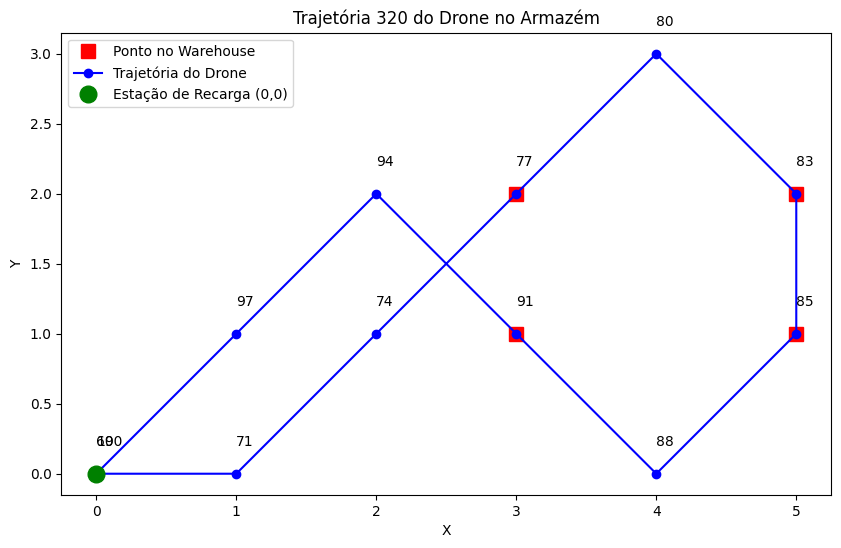


Trajetória 321:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 0), Bateria 96
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 2), Bateria 88
Passo 6: Posição (5, 1), Bateria 86
Passo 7: Posição (4, 2), Bateria 83
Passo 8: Posição (3, 2), Bateria 81
Passo 9: Posição (2, 2), Bateria 79
Passo 10: Posição (1, 1), Bateria 76
Passo 11: Posição (0, 0), Bateria 73


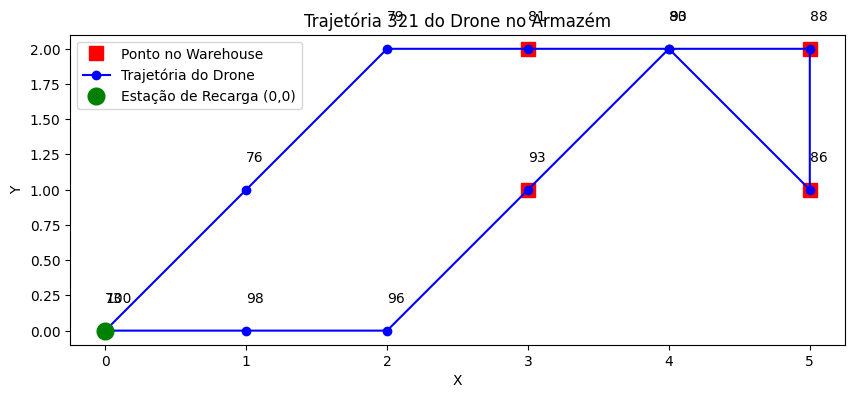


Trajetória 322:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 0), Bateria 96
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 2), Bateria 88
Passo 6: Posição (5, 1), Bateria 86
Passo 7: Posição (4, 1), Bateria 84
Passo 8: Posição (3, 2), Bateria 81
Passo 9: Posição (2, 2), Bateria 79
Passo 10: Posição (1, 1), Bateria 76
Passo 11: Posição (0, 0), Bateria 73


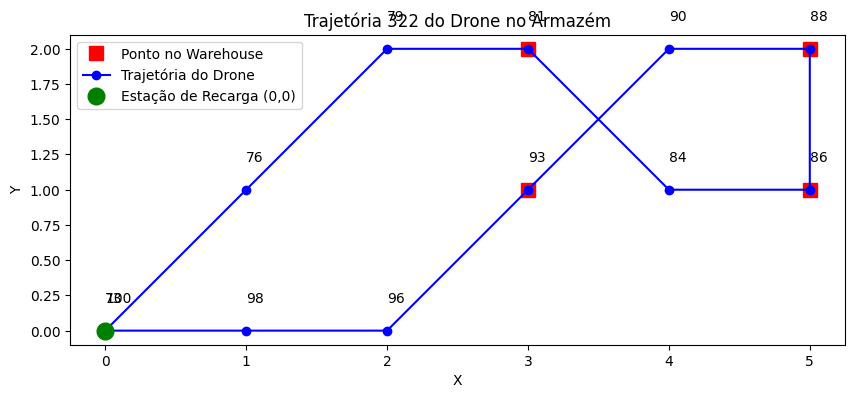


Trajetória 323:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 0), Bateria 96
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 0), Bateria 90
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 3), Bateria 82
Passo 8: Posição (3, 2), Bateria 79
Passo 9: Posição (2, 1), Bateria 76
Passo 10: Posição (1, 0), Bateria 73
Passo 11: Posição (0, 0), Bateria 71


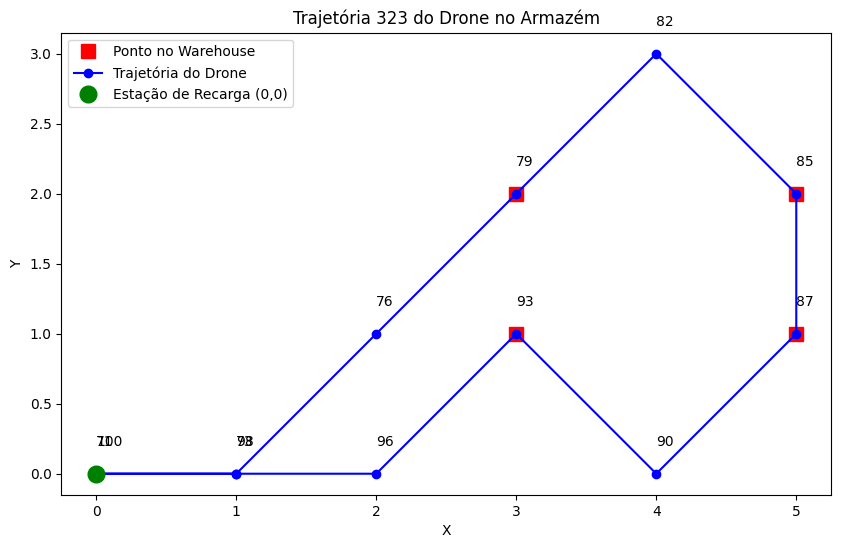


Trajetória 324:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 0), Bateria 96
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 3), Bateria 82
Passo 8: Posição (3, 2), Bateria 79
Passo 9: Posição (2, 1), Bateria 76
Passo 10: Posição (1, 0), Bateria 73
Passo 11: Posição (0, 0), Bateria 71


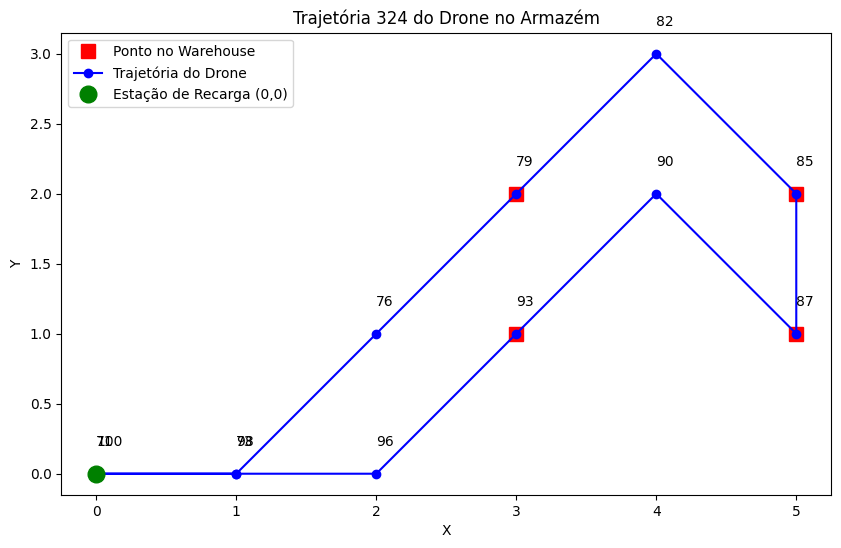


Trajetória 325:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 0), Bateria 96
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 0), Bateria 90
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 2), Bateria 79
Passo 9: Posição (2, 1), Bateria 76
Passo 10: Posição (1, 0), Bateria 73
Passo 11: Posição (0, 0), Bateria 71


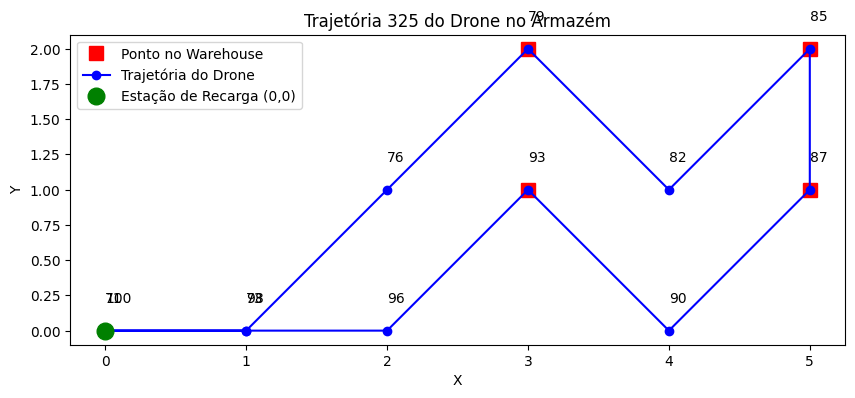


Trajetória 326:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 1), Bateria 91
Passo 4: Posição (4, 2), Bateria 88
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 2), Bateria 81
Passo 8: Posição (3, 2), Bateria 79
Passo 9: Posição (2, 2), Bateria 77
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


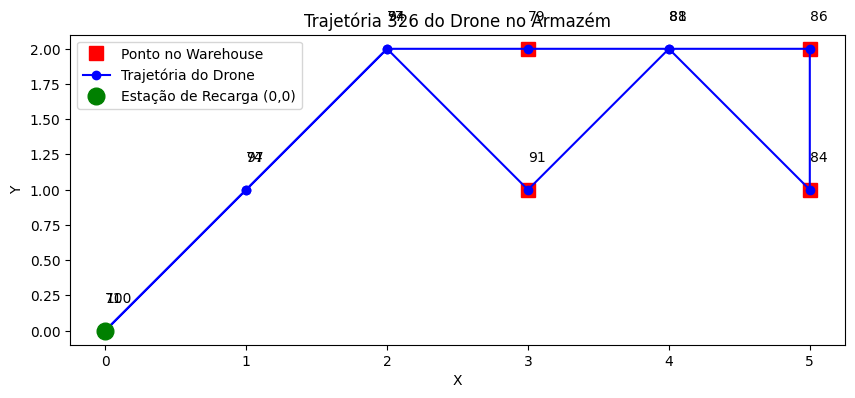


Trajetória 327:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 1), Bateria 91
Passo 4: Posição (4, 2), Bateria 88
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 2), Bateria 79
Passo 9: Posição (2, 2), Bateria 77
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


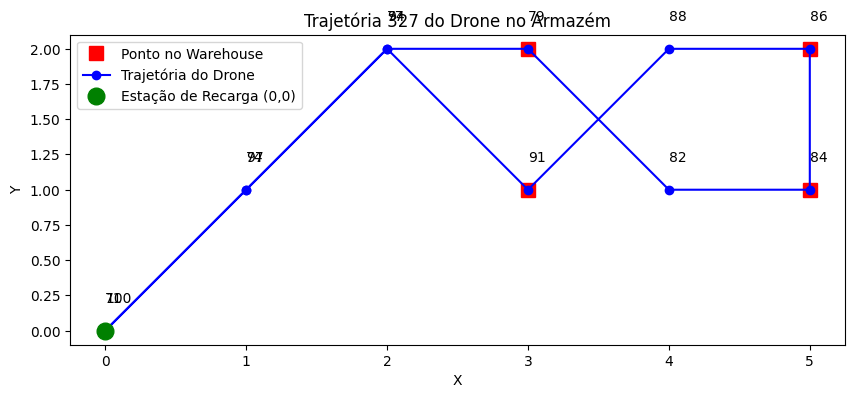


Trajetória 328:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 0), Bateria 96
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 2), Bateria 79
Passo 9: Posição (2, 1), Bateria 76
Passo 10: Posição (1, 0), Bateria 73
Passo 11: Posição (0, 0), Bateria 71


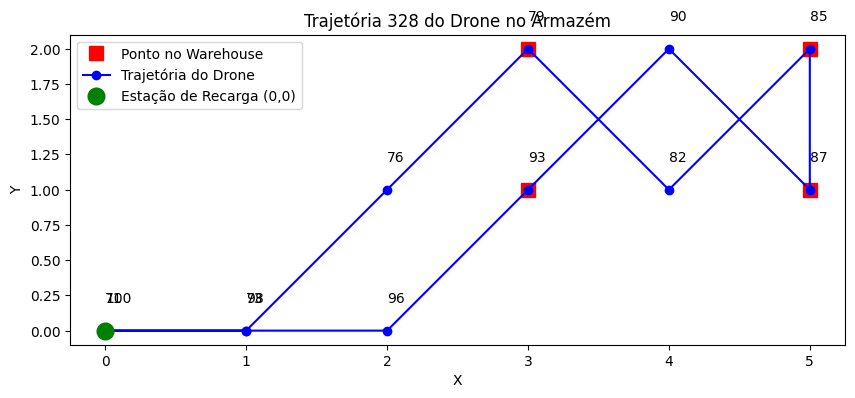


Trajetória 329:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 0), Bateria 96
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 2), Bateria 88
Passo 6: Posição (5, 1), Bateria 86
Passo 7: Posição (4, 2), Bateria 83
Passo 8: Posição (3, 2), Bateria 81
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 0), Bateria 75
Passo 11: Posição (0, 0), Bateria 73


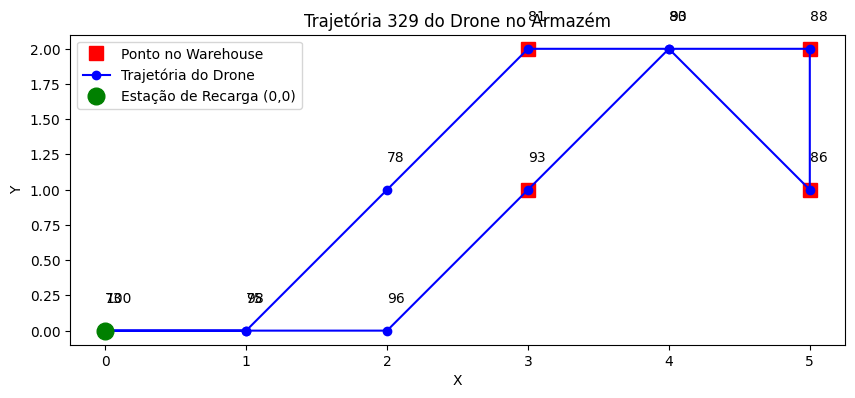


Trajetória 330:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 0), Bateria 96
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 2), Bateria 79
Passo 9: Posição (2, 2), Bateria 77
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


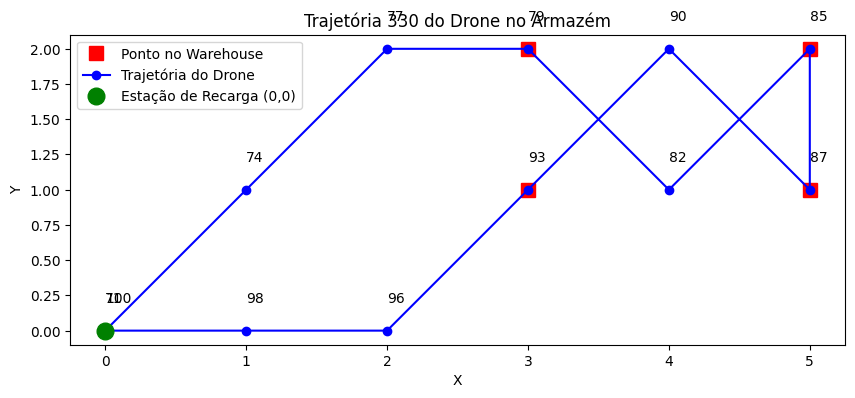


Trajetória 331:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 0), Bateria 96
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 3), Bateria 82
Passo 8: Posição (3, 2), Bateria 79
Passo 9: Posição (2, 1), Bateria 76
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


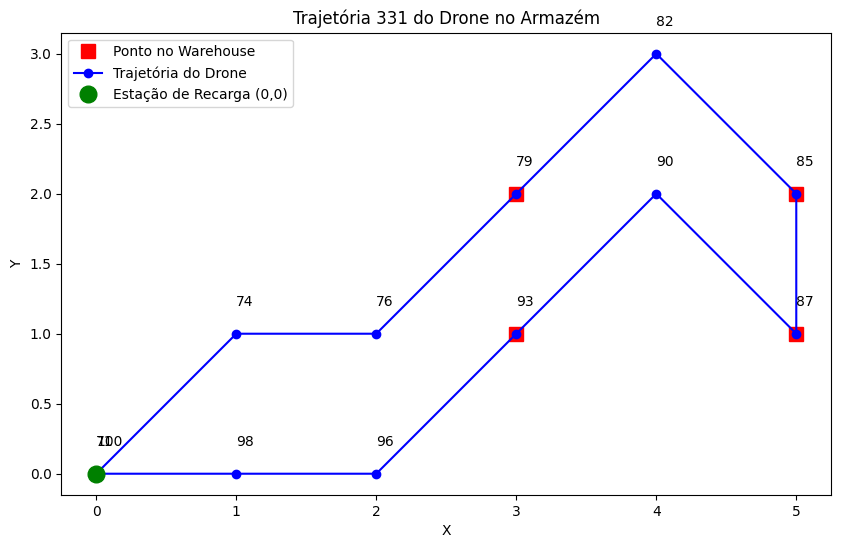


Trajetória 332:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 0), Bateria 96
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 2), Bateria 88
Passo 6: Posição (5, 1), Bateria 86
Passo 7: Posição (4, 1), Bateria 84
Passo 8: Posição (3, 2), Bateria 81
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 0), Bateria 75
Passo 11: Posição (0, 0), Bateria 73


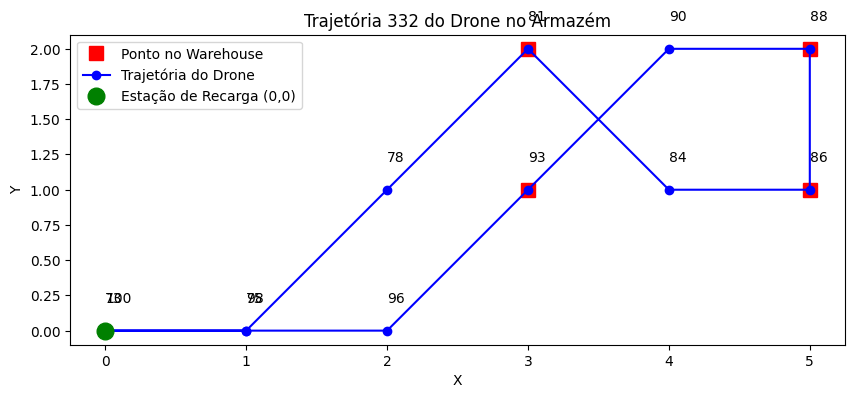


Trajetória 333:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 0), Bateria 96
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 2), Bateria 88
Passo 6: Posição (5, 1), Bateria 86
Passo 7: Posição (4, 2), Bateria 83
Passo 8: Posição (3, 2), Bateria 81
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 1), Bateria 76
Passo 11: Posição (0, 0), Bateria 73


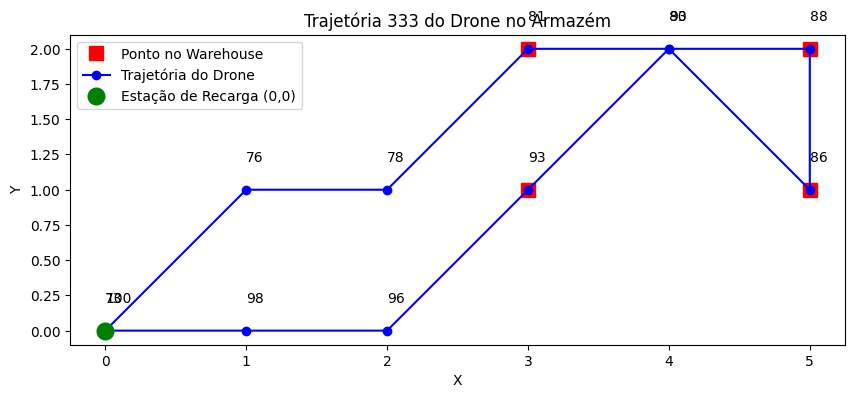


Trajetória 334:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 0), Bateria 98
Passo 2: Posição (2, 0), Bateria 96
Passo 3: Posição (3, 1), Bateria 93
Passo 4: Posição (4, 2), Bateria 90
Passo 5: Posição (5, 2), Bateria 88
Passo 6: Posição (5, 1), Bateria 86
Passo 7: Posição (4, 1), Bateria 84
Passo 8: Posição (3, 2), Bateria 81
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 1), Bateria 76
Passo 11: Posição (0, 0), Bateria 73


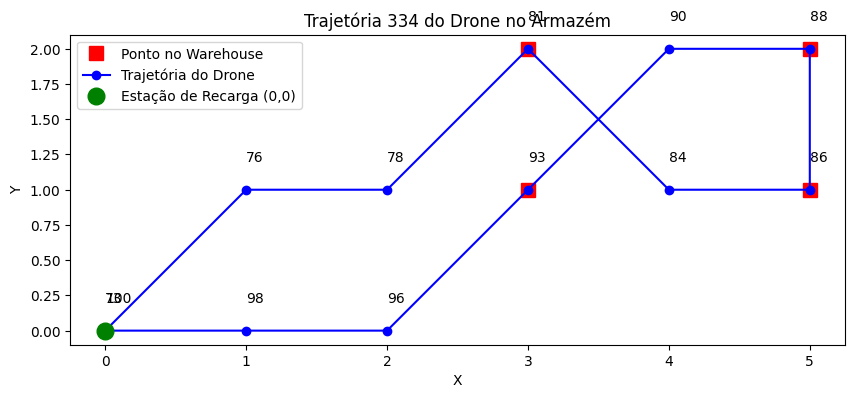


Trajetória 335:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 1), Bateria 91
Passo 4: Posição (4, 0), Bateria 88
Passo 5: Posição (5, 1), Bateria 85
Passo 6: Posição (5, 2), Bateria 83
Passo 7: Posição (4, 2), Bateria 81
Passo 8: Posição (3, 2), Bateria 79
Passo 9: Posição (2, 1), Bateria 76
Passo 10: Posição (1, 0), Bateria 73
Passo 11: Posição (0, 0), Bateria 71


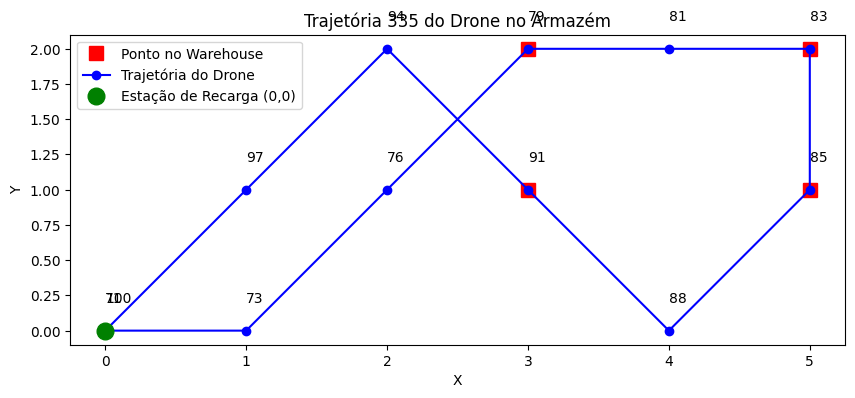


Trajetória 336:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 1), Bateria 91
Passo 4: Posição (4, 0), Bateria 88
Passo 5: Posição (5, 1), Bateria 85
Passo 6: Posição (5, 2), Bateria 83
Passo 7: Posição (4, 3), Bateria 80
Passo 8: Posição (3, 2), Bateria 77
Passo 9: Posição (2, 2), Bateria 75
Passo 10: Posição (1, 1), Bateria 72
Passo 11: Posição (0, 0), Bateria 69


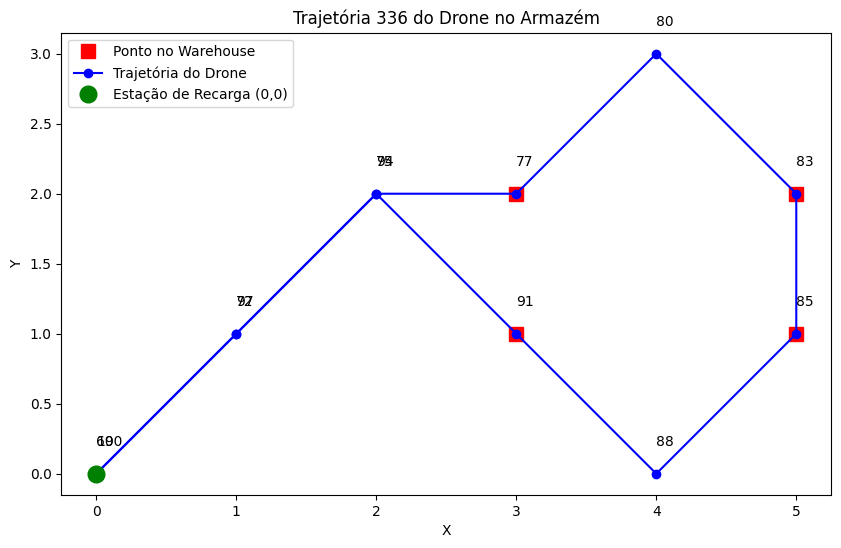


Trajetória 337:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 0), Bateria 94
Passo 3: Posição (3, 1), Bateria 91
Passo 4: Posição (4, 0), Bateria 88
Passo 5: Posição (5, 1), Bateria 85
Passo 6: Posição (5, 2), Bateria 83
Passo 7: Posição (4, 3), Bateria 80
Passo 8: Posição (3, 2), Bateria 77
Passo 9: Posição (2, 2), Bateria 75
Passo 10: Posição (1, 1), Bateria 72
Passo 11: Posição (0, 0), Bateria 69


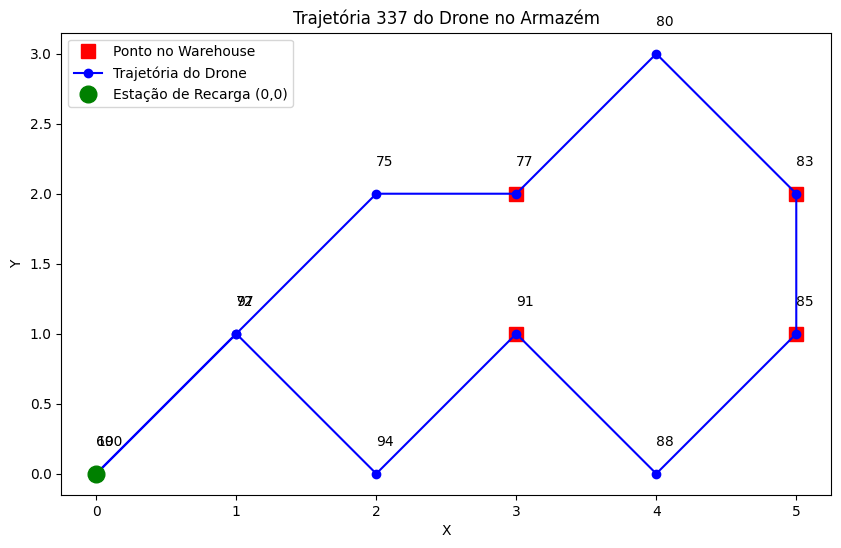


Trajetória 338:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 1), Bateria 91
Passo 4: Posição (4, 0), Bateria 88
Passo 5: Posição (5, 1), Bateria 85
Passo 6: Posição (5, 2), Bateria 83
Passo 7: Posição (4, 1), Bateria 80
Passo 8: Posição (3, 2), Bateria 77
Passo 9: Posição (2, 2), Bateria 75
Passo 10: Posição (1, 1), Bateria 72
Passo 11: Posição (0, 0), Bateria 69


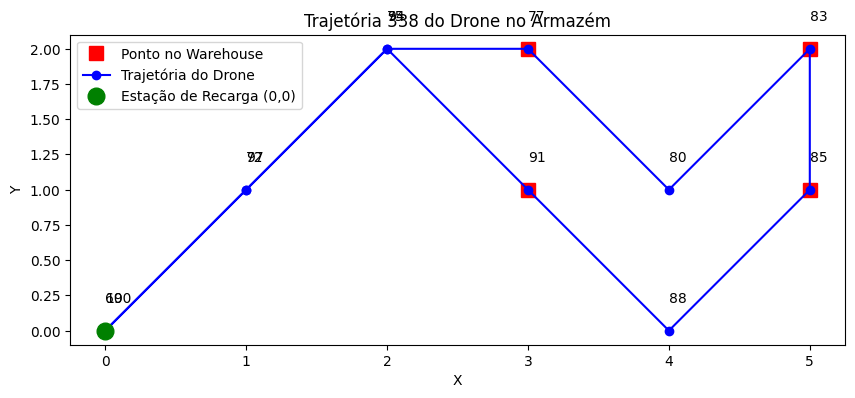


Trajetória 339:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 1), Bateria 91
Passo 4: Posição (4, 0), Bateria 88
Passo 5: Posição (5, 1), Bateria 85
Passo 6: Posição (5, 2), Bateria 83
Passo 7: Posição (4, 1), Bateria 80
Passo 8: Posição (3, 2), Bateria 77
Passo 9: Posição (2, 1), Bateria 74
Passo 10: Posição (1, 0), Bateria 71
Passo 11: Posição (0, 0), Bateria 69


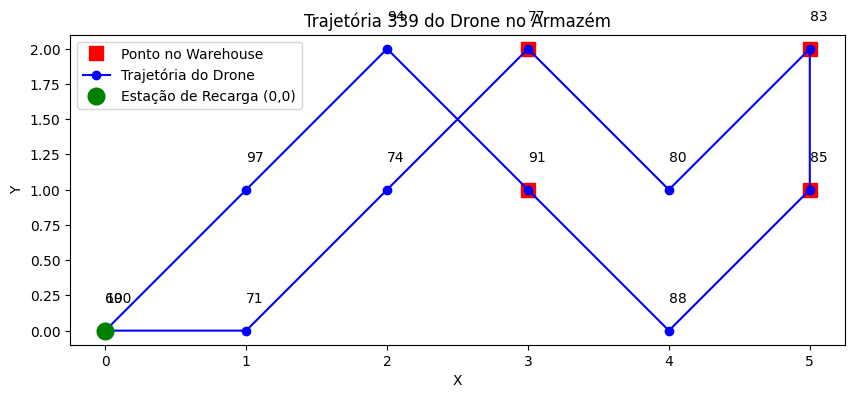


Trajetória 340:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 0), Bateria 94
Passo 3: Posição (3, 1), Bateria 91
Passo 4: Posição (4, 0), Bateria 88
Passo 5: Posição (5, 1), Bateria 85
Passo 6: Posição (5, 2), Bateria 83
Passo 7: Posição (4, 1), Bateria 80
Passo 8: Posição (3, 2), Bateria 77
Passo 9: Posição (2, 1), Bateria 74
Passo 10: Posição (1, 0), Bateria 71
Passo 11: Posição (0, 0), Bateria 69


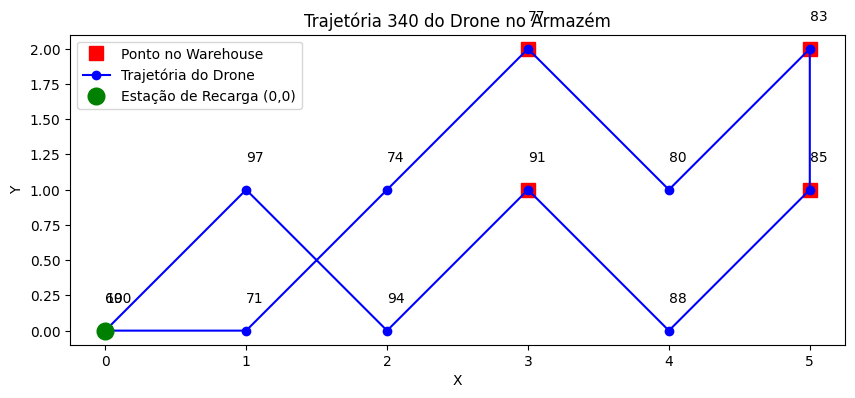


Trajetória 341:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 1), Bateria 91
Passo 4: Posição (4, 2), Bateria 88
Passo 5: Posição (5, 1), Bateria 85
Passo 6: Posição (5, 2), Bateria 83
Passo 7: Posição (4, 3), Bateria 80
Passo 8: Posição (3, 2), Bateria 77
Passo 9: Posição (2, 1), Bateria 74
Passo 10: Posição (1, 0), Bateria 71
Passo 11: Posição (0, 0), Bateria 69


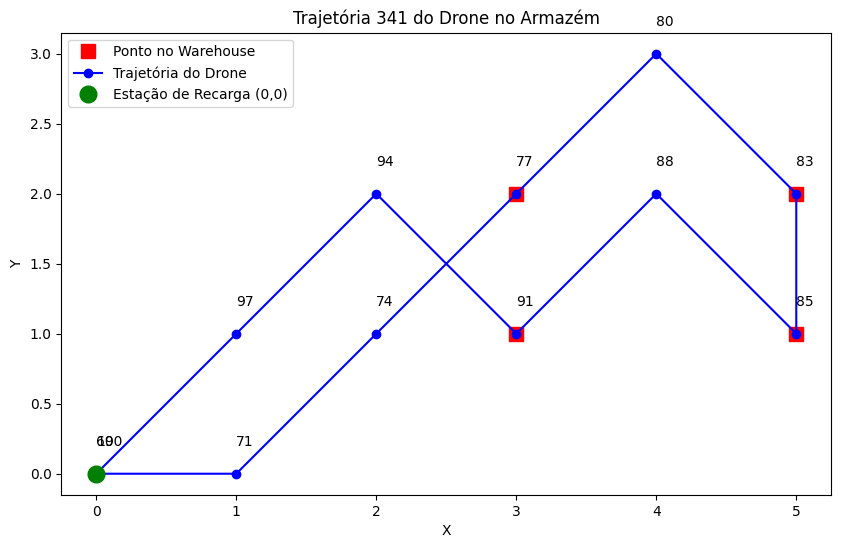


Trajetória 342:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 0), Bateria 94
Passo 3: Posição (3, 1), Bateria 91
Passo 4: Posição (4, 2), Bateria 88
Passo 5: Posição (5, 1), Bateria 85
Passo 6: Posição (5, 2), Bateria 83
Passo 7: Posição (4, 3), Bateria 80
Passo 8: Posição (3, 2), Bateria 77
Passo 9: Posição (2, 1), Bateria 74
Passo 10: Posição (1, 0), Bateria 71
Passo 11: Posição (0, 0), Bateria 69


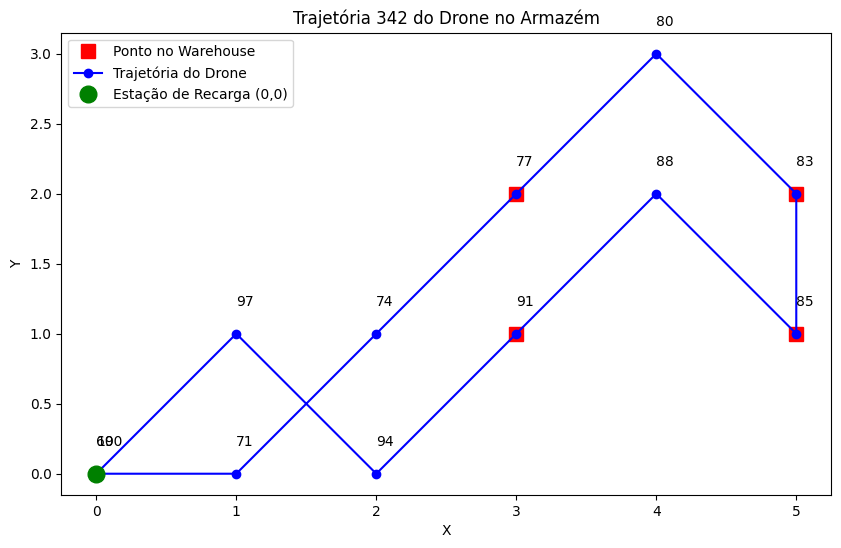


Trajetória 343:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 1), Bateria 91
Passo 4: Posição (4, 2), Bateria 88
Passo 5: Posição (5, 1), Bateria 85
Passo 6: Posição (5, 2), Bateria 83
Passo 7: Posição (4, 1), Bateria 80
Passo 8: Posição (3, 2), Bateria 77
Passo 9: Posição (2, 1), Bateria 74
Passo 10: Posição (1, 0), Bateria 71
Passo 11: Posição (0, 0), Bateria 69


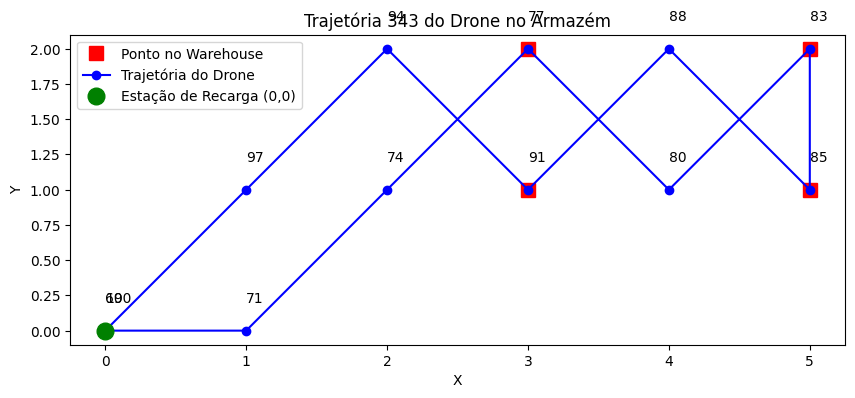


Trajetória 344:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 1), Bateria 91
Passo 4: Posição (4, 2), Bateria 88
Passo 5: Posição (5, 1), Bateria 85
Passo 6: Posição (5, 2), Bateria 83
Passo 7: Posição (4, 3), Bateria 80
Passo 8: Posição (3, 2), Bateria 77
Passo 9: Posição (2, 2), Bateria 75
Passo 10: Posição (1, 1), Bateria 72
Passo 11: Posição (0, 0), Bateria 69


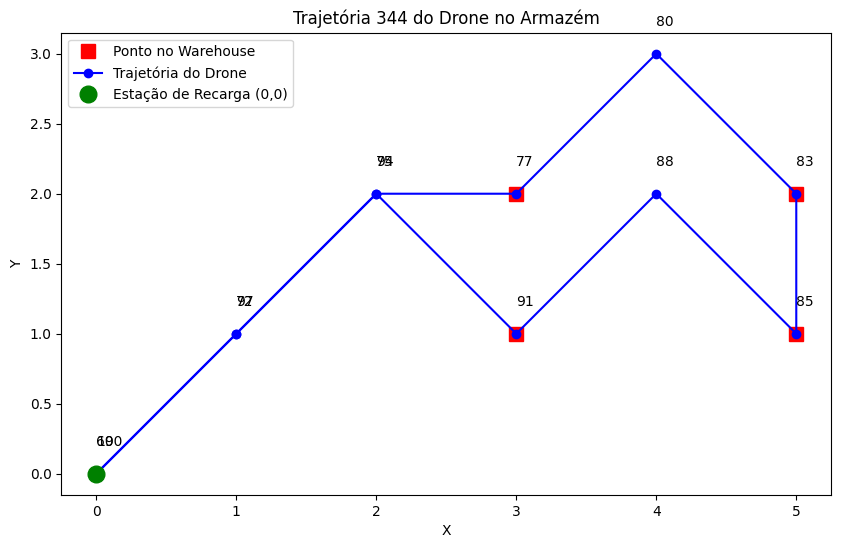


Trajetória 345:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 0), Bateria 94
Passo 3: Posição (3, 1), Bateria 91
Passo 4: Posição (4, 2), Bateria 88
Passo 5: Posição (5, 1), Bateria 85
Passo 6: Posição (5, 2), Bateria 83
Passo 7: Posição (4, 1), Bateria 80
Passo 8: Posição (3, 2), Bateria 77
Passo 9: Posição (2, 1), Bateria 74
Passo 10: Posição (1, 0), Bateria 71
Passo 11: Posição (0, 0), Bateria 69


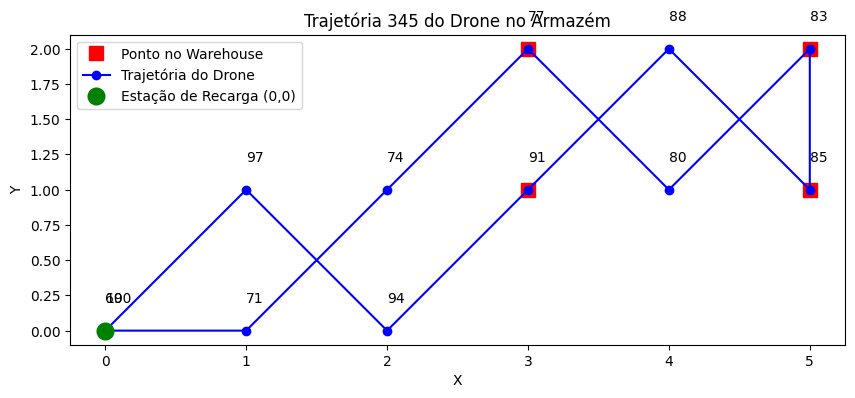


Trajetória 346:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 1), Bateria 91
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 3), Bateria 82
Passo 8: Posição (3, 2), Bateria 79
Passo 9: Posição (2, 1), Bateria 76
Passo 10: Posição (1, 0), Bateria 73
Passo 11: Posição (0, 0), Bateria 71


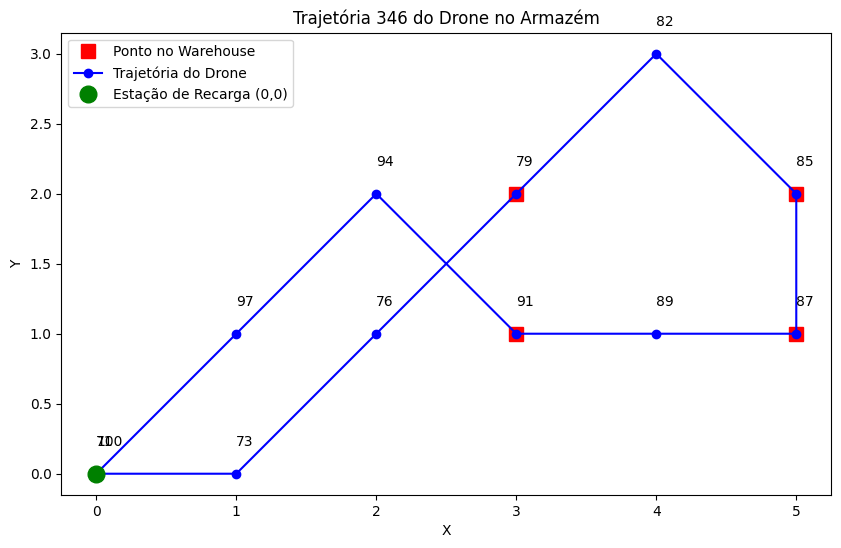


Trajetória 347:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 0), Bateria 94
Passo 3: Posição (3, 1), Bateria 91
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 3), Bateria 82
Passo 8: Posição (3, 2), Bateria 79
Passo 9: Posição (2, 1), Bateria 76
Passo 10: Posição (1, 0), Bateria 73
Passo 11: Posição (0, 0), Bateria 71


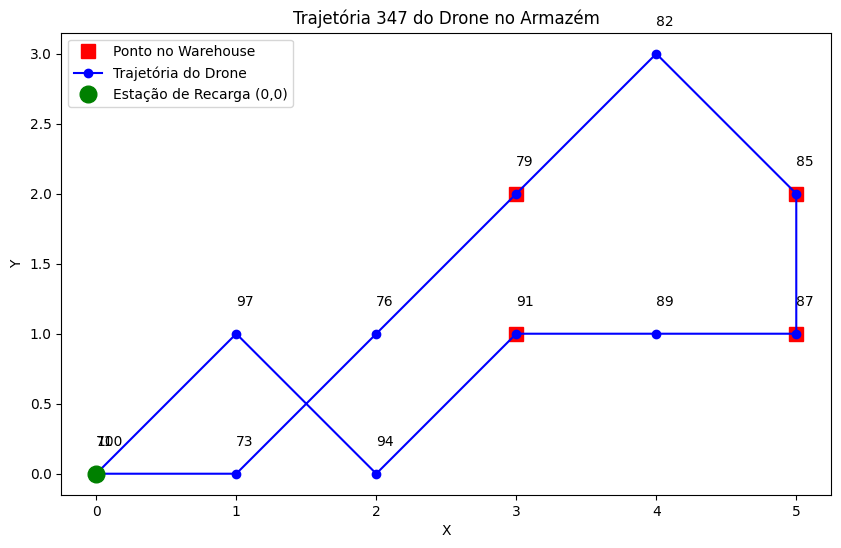


Trajetória 348:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 0), Bateria 94
Passo 3: Posição (3, 1), Bateria 91
Passo 4: Posição (4, 2), Bateria 88
Passo 5: Posição (5, 1), Bateria 85
Passo 6: Posição (5, 2), Bateria 83
Passo 7: Posição (4, 3), Bateria 80
Passo 8: Posição (3, 2), Bateria 77
Passo 9: Posição (2, 2), Bateria 75
Passo 10: Posição (1, 1), Bateria 72
Passo 11: Posição (0, 0), Bateria 69


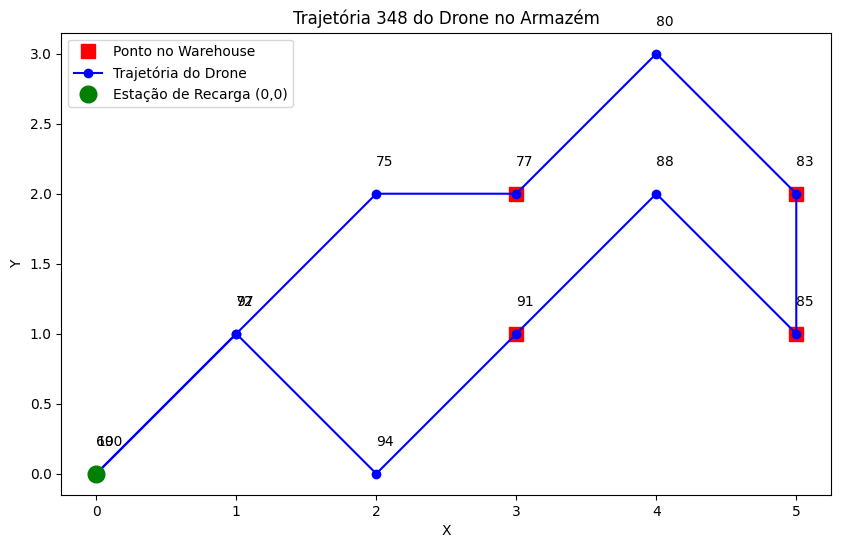


Trajetória 349:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 1), Bateria 91
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 2), Bateria 79
Passo 9: Posição (2, 1), Bateria 76
Passo 10: Posição (1, 0), Bateria 73
Passo 11: Posição (0, 0), Bateria 71


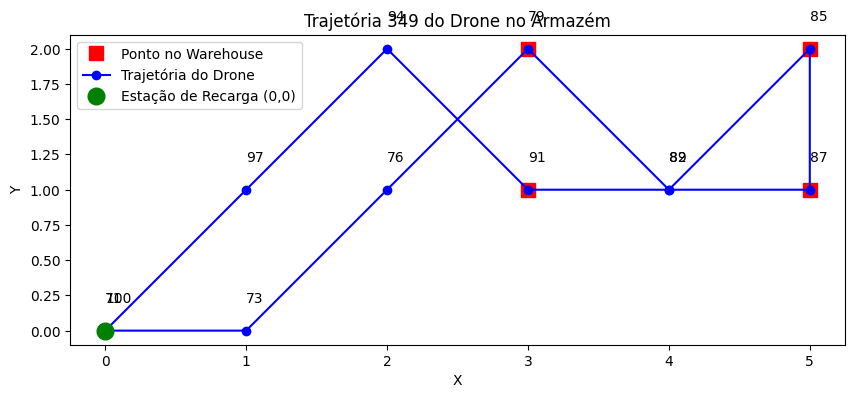


Trajetória 350:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 0), Bateria 94
Passo 3: Posição (3, 1), Bateria 91
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 2), Bateria 79
Passo 9: Posição (2, 1), Bateria 76
Passo 10: Posição (1, 0), Bateria 73
Passo 11: Posição (0, 0), Bateria 71


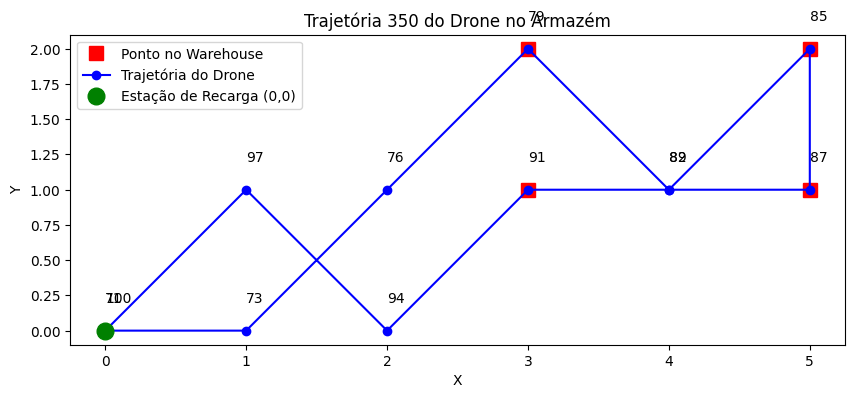


Trajetória 351:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 1), Bateria 91
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 3), Bateria 82
Passo 8: Posição (3, 2), Bateria 79
Passo 9: Posição (2, 2), Bateria 77
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


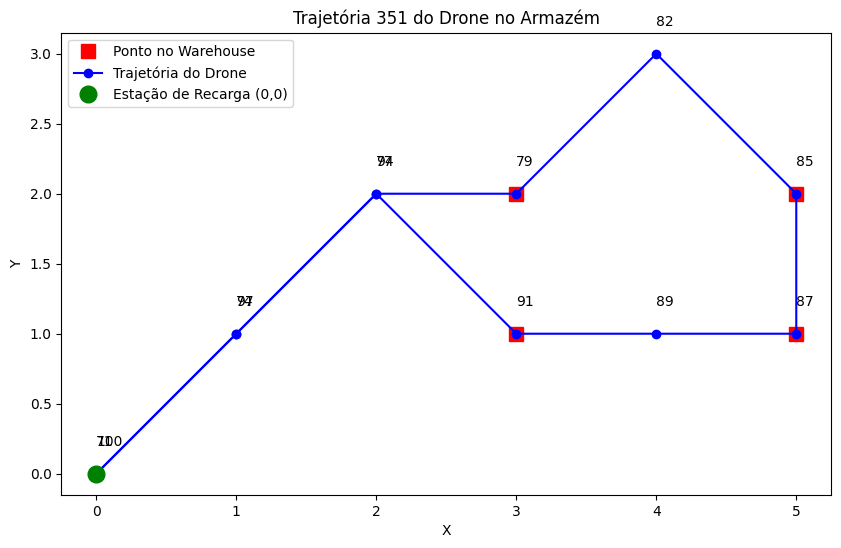


Trajetória 352:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 1), Bateria 91
Passo 4: Posição (4, 2), Bateria 88
Passo 5: Posição (5, 1), Bateria 85
Passo 6: Posição (5, 2), Bateria 83
Passo 7: Posição (4, 2), Bateria 81
Passo 8: Posição (3, 2), Bateria 79
Passo 9: Posição (2, 1), Bateria 76
Passo 10: Posição (1, 0), Bateria 73
Passo 11: Posição (0, 0), Bateria 71


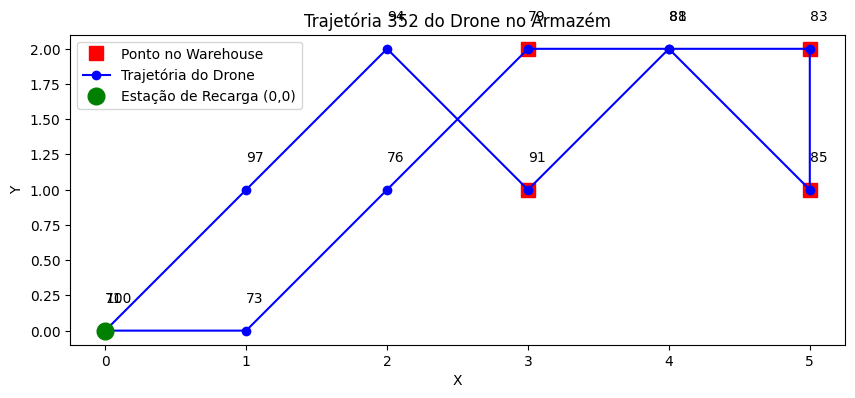


Trajetória 353:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 0), Bateria 94
Passo 3: Posição (3, 1), Bateria 91
Passo 4: Posição (4, 2), Bateria 88
Passo 5: Posição (5, 1), Bateria 85
Passo 6: Posição (5, 2), Bateria 83
Passo 7: Posição (4, 2), Bateria 81
Passo 8: Posição (3, 2), Bateria 79
Passo 9: Posição (2, 1), Bateria 76
Passo 10: Posição (1, 0), Bateria 73
Passo 11: Posição (0, 0), Bateria 71


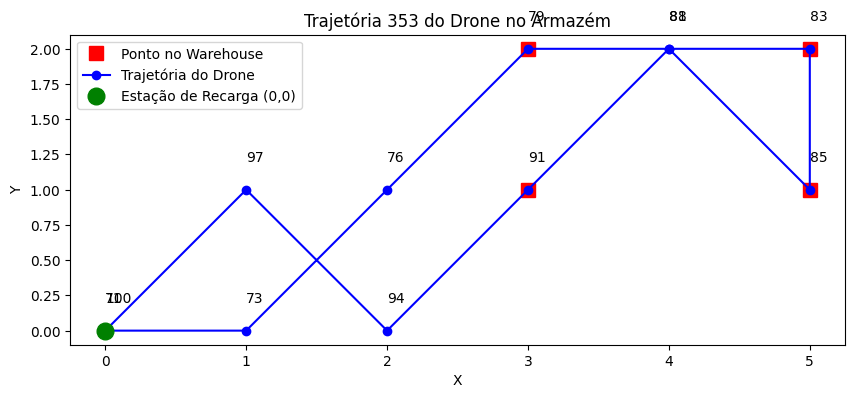


Trajetória 354:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 0), Bateria 94
Passo 3: Posição (3, 1), Bateria 91
Passo 4: Posição (4, 2), Bateria 88
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 2), Bateria 79
Passo 9: Posição (2, 2), Bateria 77
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


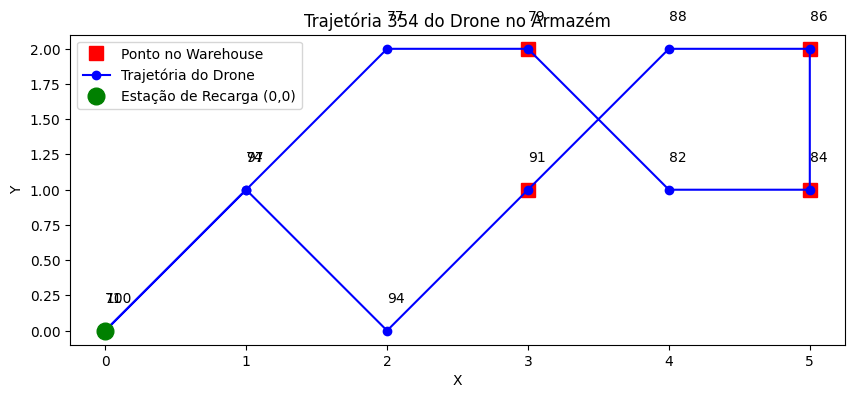


Trajetória 355:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 1), Bateria 91
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 2), Bateria 79
Passo 9: Posição (2, 1), Bateria 76
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


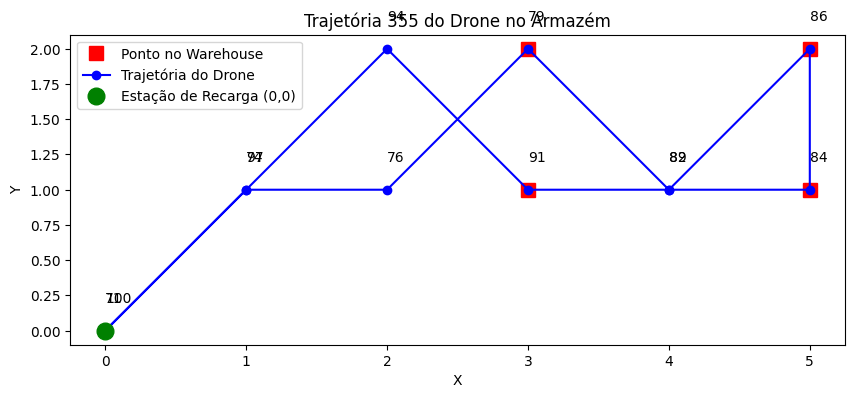


Trajetória 356:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 1), Bateria 91
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 2), Bateria 83
Passo 8: Posição (3, 2), Bateria 81
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 0), Bateria 75
Passo 11: Posição (0, 0), Bateria 73


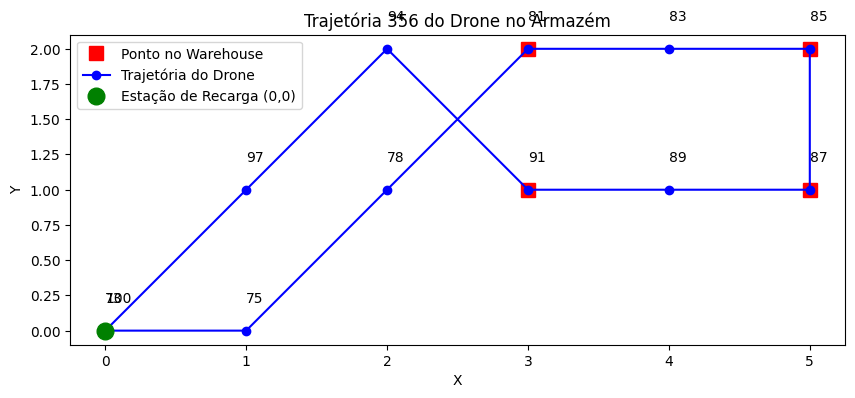


Trajetória 357:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 1), Bateria 91
Passo 4: Posição (4, 2), Bateria 88
Passo 5: Posição (5, 1), Bateria 85
Passo 6: Posição (5, 2), Bateria 83
Passo 7: Posição (4, 1), Bateria 80
Passo 8: Posição (3, 2), Bateria 77
Passo 9: Posição (2, 2), Bateria 75
Passo 10: Posição (1, 1), Bateria 72
Passo 11: Posição (0, 0), Bateria 69


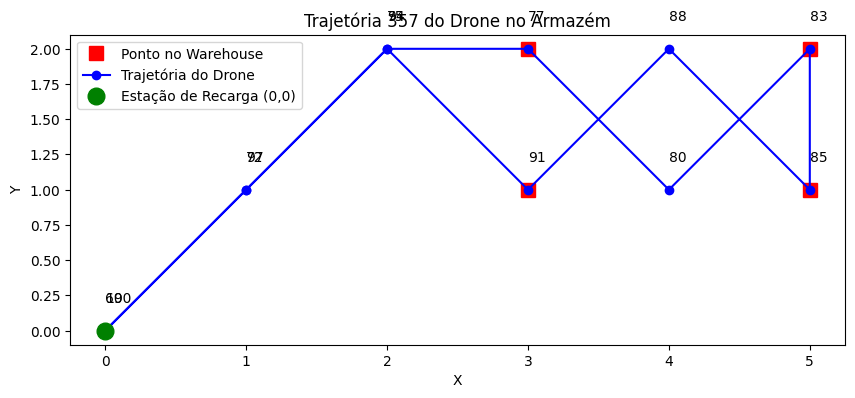


Trajetória 358:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 0), Bateria 94
Passo 3: Posição (3, 1), Bateria 91
Passo 4: Posição (4, 0), Bateria 88
Passo 5: Posição (5, 1), Bateria 85
Passo 6: Posição (5, 2), Bateria 83
Passo 7: Posição (4, 1), Bateria 80
Passo 8: Posição (3, 2), Bateria 77
Passo 9: Posição (2, 2), Bateria 75
Passo 10: Posição (1, 1), Bateria 72
Passo 11: Posição (0, 0), Bateria 69


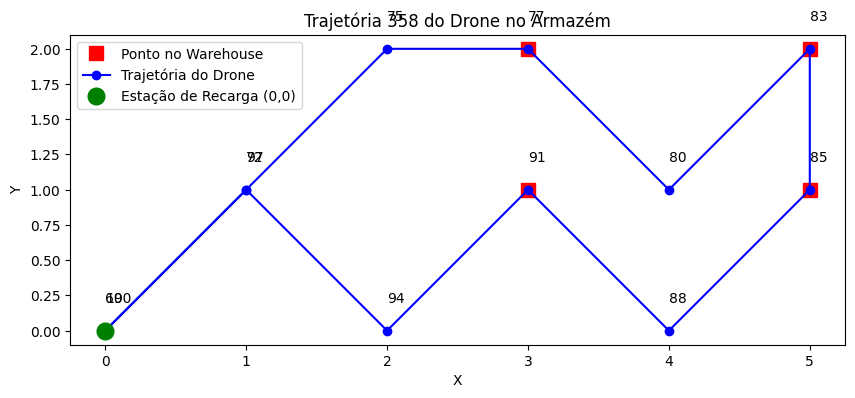


Trajetória 359:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 0), Bateria 94
Passo 3: Posição (3, 1), Bateria 91
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 2), Bateria 79
Passo 9: Posição (2, 1), Bateria 76
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


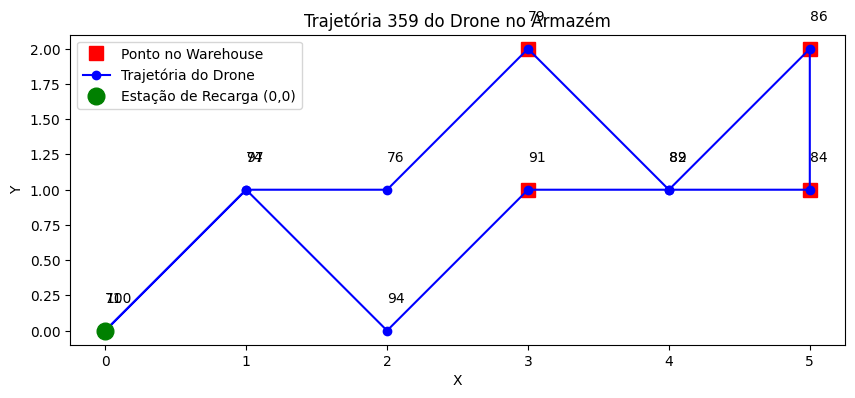


Trajetória 360:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 1), Bateria 91
Passo 4: Posição (4, 2), Bateria 88
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 2), Bateria 79
Passo 9: Posição (2, 1), Bateria 76
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


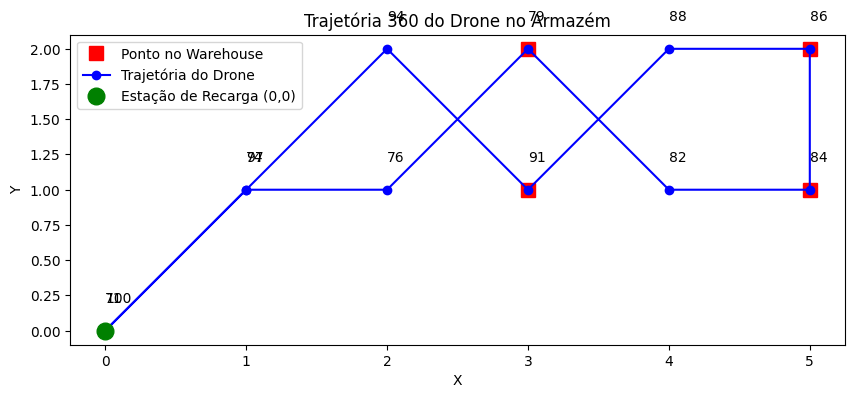


Trajetória 361:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 0), Bateria 94
Passo 3: Posição (3, 1), Bateria 91
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 2), Bateria 83
Passo 8: Posição (3, 2), Bateria 81
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 0), Bateria 75
Passo 11: Posição (0, 0), Bateria 73


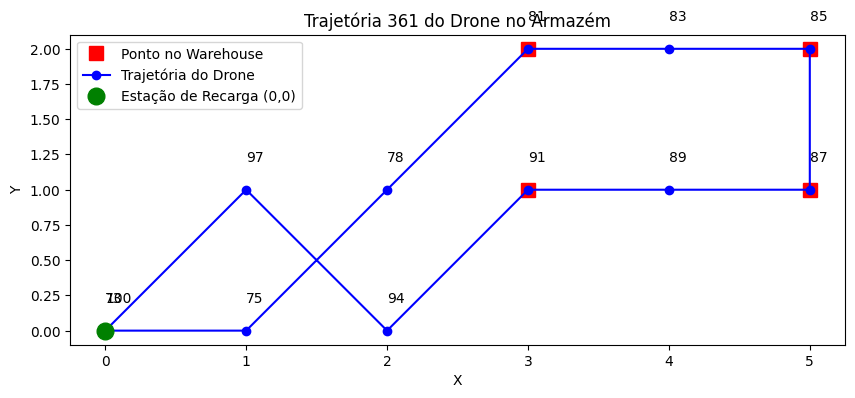


Trajetória 362:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 0), Bateria 94
Passo 3: Posição (3, 1), Bateria 91
Passo 4: Posição (4, 2), Bateria 88
Passo 5: Posição (5, 1), Bateria 85
Passo 6: Posição (5, 2), Bateria 83
Passo 7: Posição (4, 1), Bateria 80
Passo 8: Posição (3, 2), Bateria 77
Passo 9: Posição (2, 2), Bateria 75
Passo 10: Posição (1, 1), Bateria 72
Passo 11: Posição (0, 0), Bateria 69


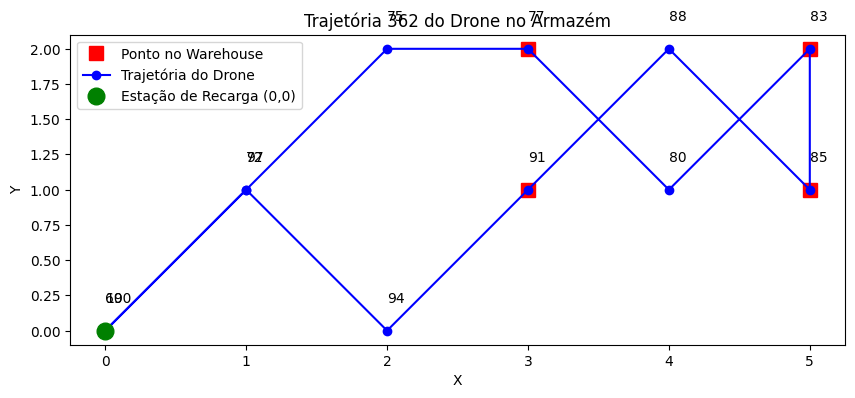


Trajetória 363:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 1), Bateria 91
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 2), Bateria 79
Passo 9: Posição (2, 2), Bateria 77
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


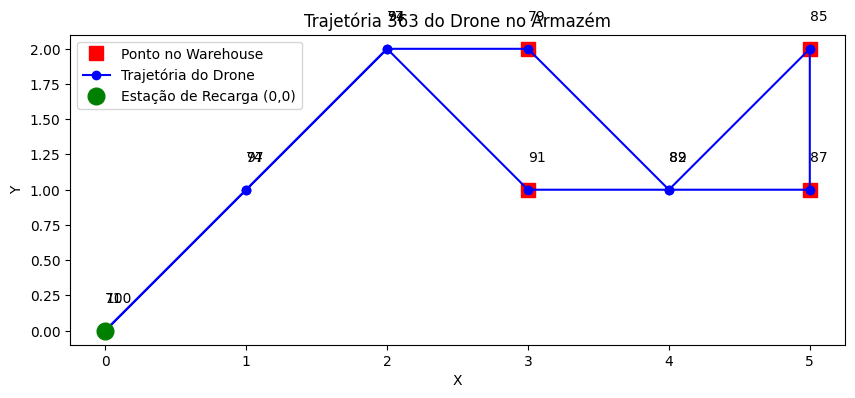


Trajetória 364:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 0), Bateria 94
Passo 3: Posição (3, 1), Bateria 91
Passo 4: Posição (4, 2), Bateria 88
Passo 5: Posição (5, 2), Bateria 86
Passo 6: Posição (5, 1), Bateria 84
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 2), Bateria 79
Passo 9: Posição (2, 1), Bateria 76
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


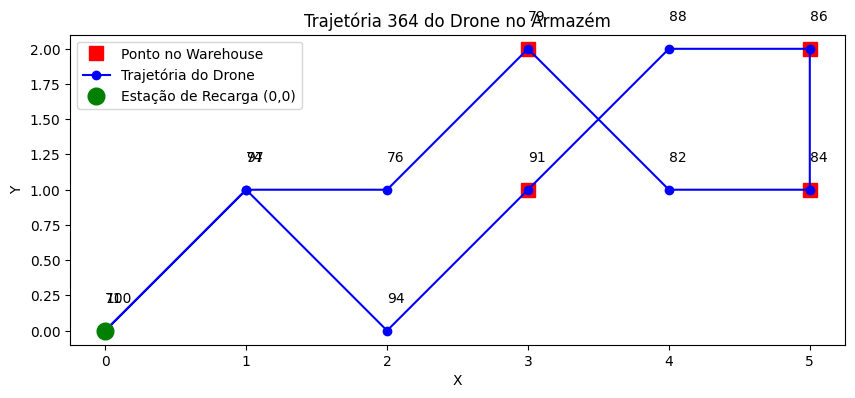


Trajetória 365:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 0), Bateria 94
Passo 3: Posição (3, 1), Bateria 91
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 3), Bateria 82
Passo 8: Posição (3, 2), Bateria 79
Passo 9: Posição (2, 2), Bateria 77
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


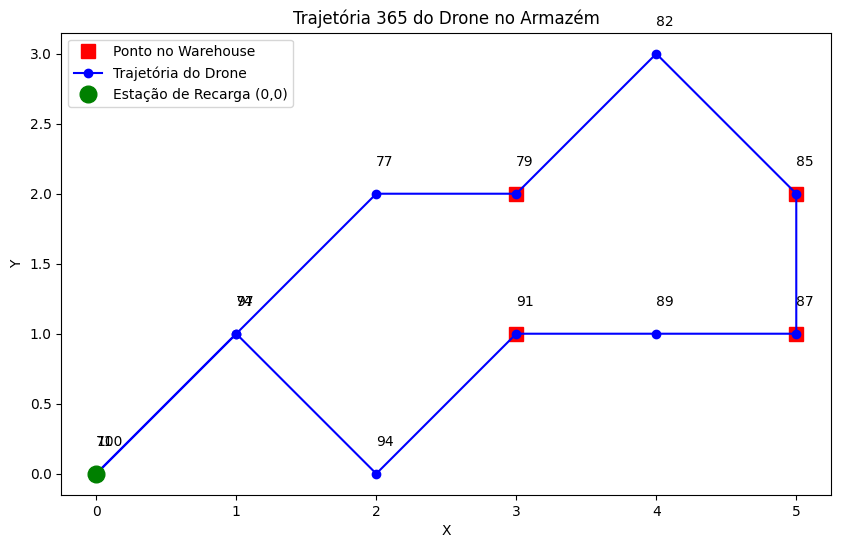


Trajetória 366:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 0), Bateria 94
Passo 3: Posição (3, 1), Bateria 91
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 2), Bateria 79
Passo 9: Posição (2, 2), Bateria 77
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


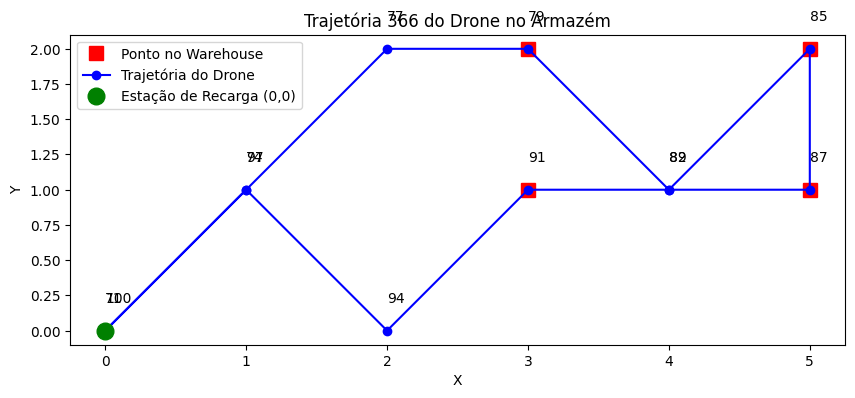


Trajetória 367:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 0), Bateria 94
Passo 3: Posição (3, 1), Bateria 91
Passo 4: Posição (4, 0), Bateria 88
Passo 5: Posição (5, 1), Bateria 85
Passo 6: Posição (5, 2), Bateria 83
Passo 7: Posição (4, 2), Bateria 81
Passo 8: Posição (3, 2), Bateria 79
Passo 9: Posição (2, 2), Bateria 77
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


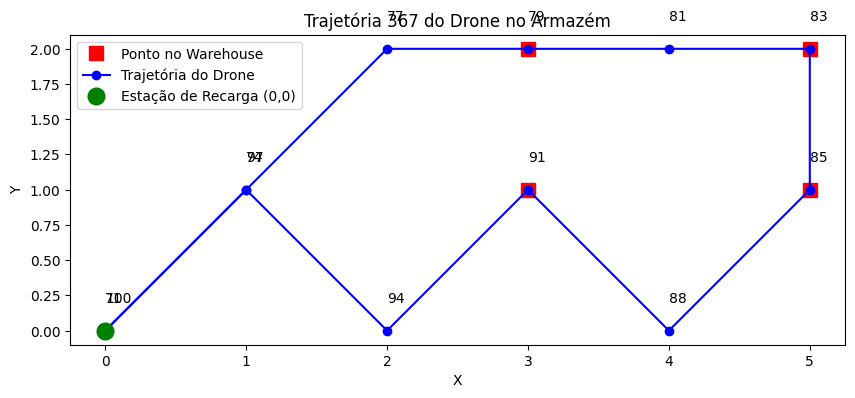


Trajetória 368:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 0), Bateria 94
Passo 3: Posição (3, 1), Bateria 91
Passo 4: Posição (4, 2), Bateria 88
Passo 5: Posição (5, 1), Bateria 85
Passo 6: Posição (5, 2), Bateria 83
Passo 7: Posição (4, 2), Bateria 81
Passo 8: Posição (3, 2), Bateria 79
Passo 9: Posição (2, 2), Bateria 77
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


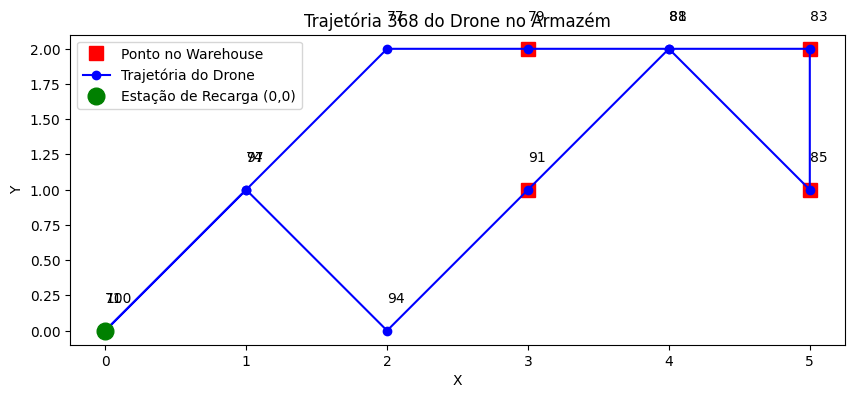


Trajetória 369:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 0), Bateria 94
Passo 3: Posição (3, 1), Bateria 91
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 2), Bateria 83
Passo 8: Posição (3, 2), Bateria 81
Passo 9: Posição (2, 2), Bateria 79
Passo 10: Posição (1, 1), Bateria 76
Passo 11: Posição (0, 0), Bateria 73


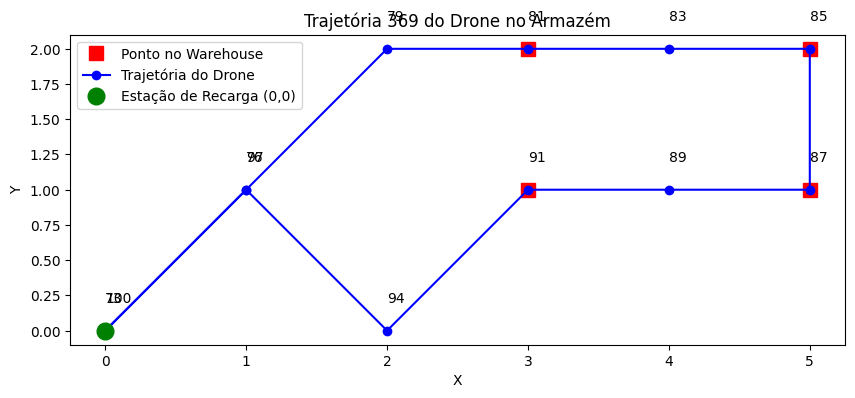


Trajetória 370:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 1), Bateria 91
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 2), Bateria 83
Passo 8: Posição (3, 2), Bateria 81
Passo 9: Posição (2, 2), Bateria 79
Passo 10: Posição (1, 1), Bateria 76
Passo 11: Posição (0, 0), Bateria 73


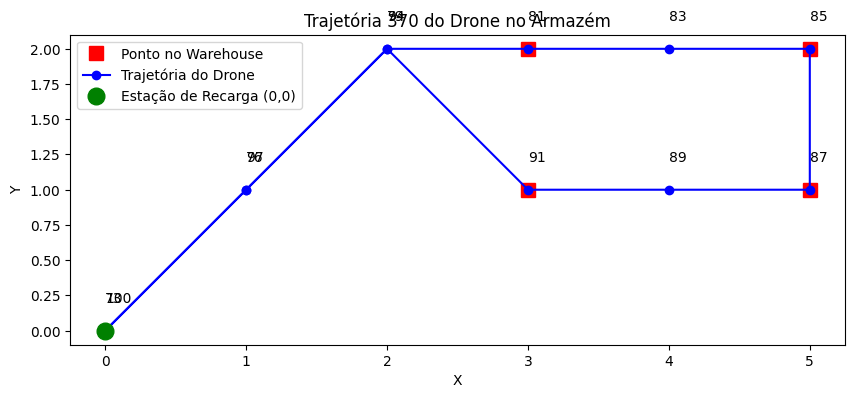


Trajetória 371:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 1), Bateria 91
Passo 4: Posição (4, 0), Bateria 88
Passo 5: Posição (5, 1), Bateria 85
Passo 6: Posição (5, 2), Bateria 83
Passo 7: Posição (4, 2), Bateria 81
Passo 8: Posição (3, 2), Bateria 79
Passo 9: Posição (2, 2), Bateria 77
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


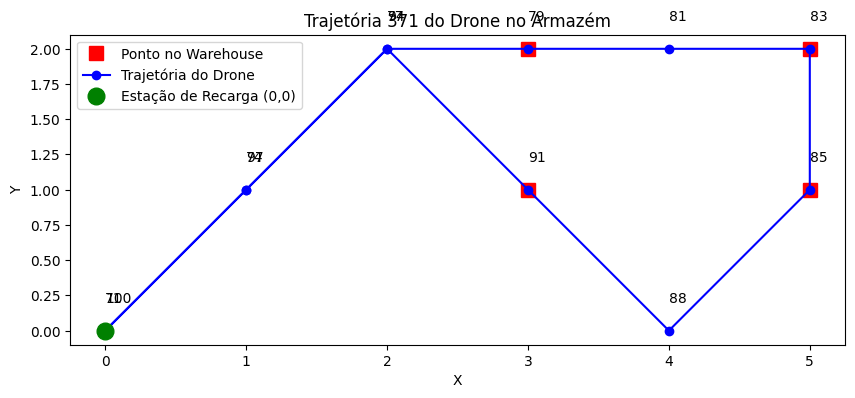


Trajetória 372:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 1), Bateria 91
Passo 4: Posição (4, 2), Bateria 88
Passo 5: Posição (5, 1), Bateria 85
Passo 6: Posição (5, 2), Bateria 83
Passo 7: Posição (4, 2), Bateria 81
Passo 8: Posição (3, 2), Bateria 79
Passo 9: Posição (2, 2), Bateria 77
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


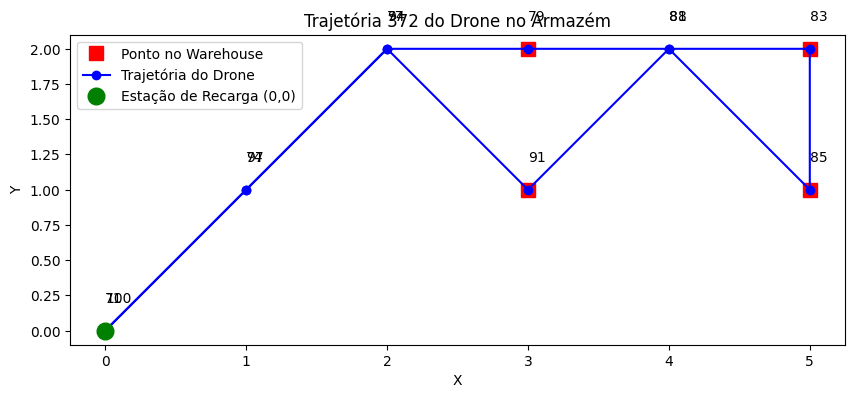


Trajetória 373:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 1), Bateria 91
Passo 4: Posição (4, 0), Bateria 88
Passo 5: Posição (5, 1), Bateria 85
Passo 6: Posição (5, 2), Bateria 83
Passo 7: Posição (4, 2), Bateria 81
Passo 8: Posição (3, 2), Bateria 79
Passo 9: Posição (2, 1), Bateria 76
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


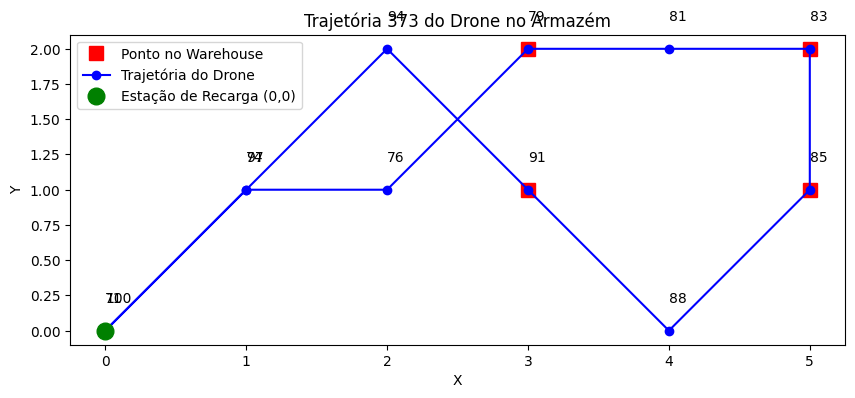


Trajetória 374:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 1), Bateria 91
Passo 4: Posição (4, 2), Bateria 88
Passo 5: Posição (5, 1), Bateria 85
Passo 6: Posição (5, 2), Bateria 83
Passo 7: Posição (4, 2), Bateria 81
Passo 8: Posição (3, 2), Bateria 79
Passo 9: Posição (2, 1), Bateria 76
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


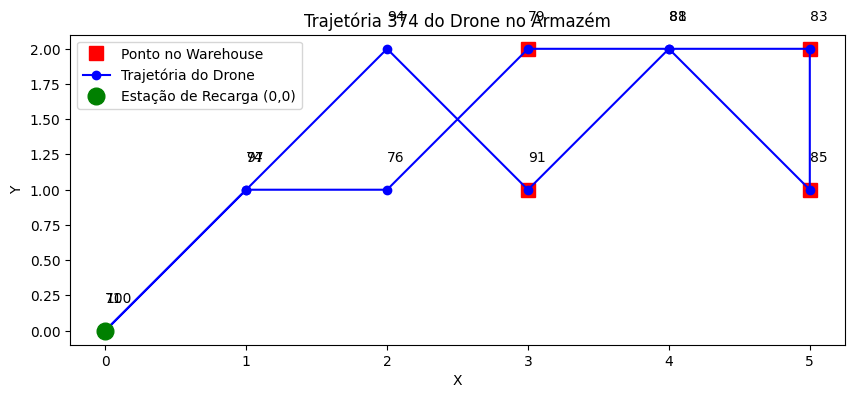


Trajetória 375:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 0), Bateria 94
Passo 3: Posição (3, 1), Bateria 91
Passo 4: Posição (4, 0), Bateria 88
Passo 5: Posição (5, 1), Bateria 85
Passo 6: Posição (5, 2), Bateria 83
Passo 7: Posição (4, 2), Bateria 81
Passo 8: Posição (3, 2), Bateria 79
Passo 9: Posição (2, 1), Bateria 76
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


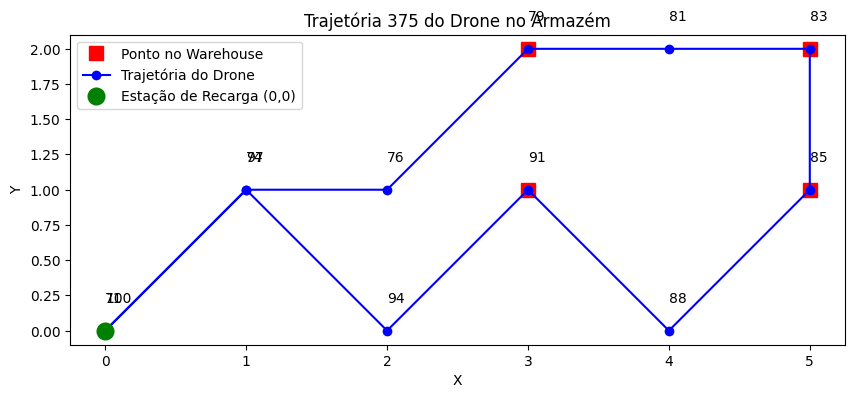


Trajetória 376:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 0), Bateria 94
Passo 3: Posição (3, 1), Bateria 91
Passo 4: Posição (4, 2), Bateria 88
Passo 5: Posição (5, 1), Bateria 85
Passo 6: Posição (5, 2), Bateria 83
Passo 7: Posição (4, 2), Bateria 81
Passo 8: Posição (3, 2), Bateria 79
Passo 9: Posição (2, 1), Bateria 76
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


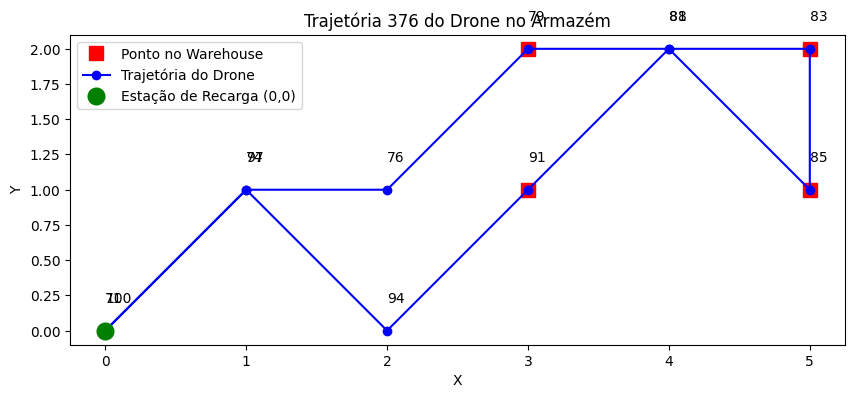


Trajetória 377:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 0), Bateria 94
Passo 3: Posição (3, 1), Bateria 91
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 2), Bateria 83
Passo 8: Posição (3, 2), Bateria 81
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 1), Bateria 76
Passo 11: Posição (0, 0), Bateria 73


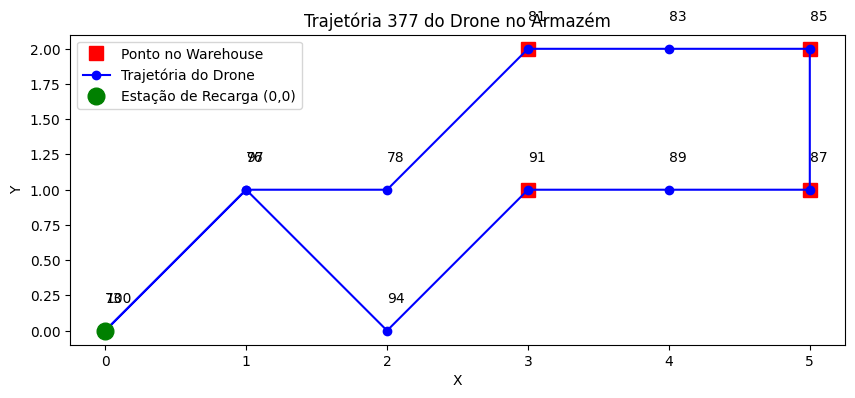


Trajetória 378:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 1), Bateria 91
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 2), Bateria 83
Passo 8: Posição (3, 2), Bateria 81
Passo 9: Posição (2, 1), Bateria 78
Passo 10: Posição (1, 1), Bateria 76
Passo 11: Posição (0, 0), Bateria 73


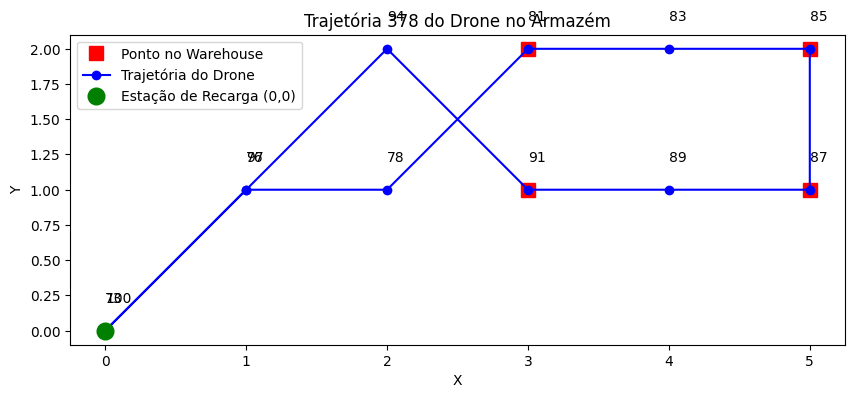


Trajetória 379:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 1), Bateria 91
Passo 4: Posição (4, 0), Bateria 88
Passo 5: Posição (5, 1), Bateria 85
Passo 6: Posição (5, 2), Bateria 83
Passo 7: Posição (4, 3), Bateria 80
Passo 8: Posição (3, 2), Bateria 77
Passo 9: Posição (2, 1), Bateria 74
Passo 10: Posição (1, 1), Bateria 72
Passo 11: Posição (0, 0), Bateria 69


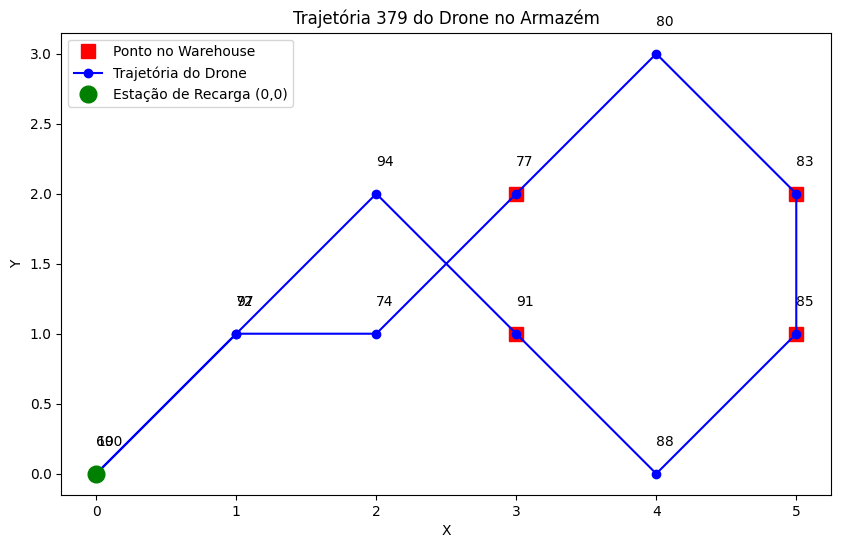


Trajetória 380:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 1), Bateria 91
Passo 4: Posição (4, 0), Bateria 88
Passo 5: Posição (5, 1), Bateria 85
Passo 6: Posição (5, 2), Bateria 83
Passo 7: Posição (4, 1), Bateria 80
Passo 8: Posição (3, 2), Bateria 77
Passo 9: Posição (2, 1), Bateria 74
Passo 10: Posição (1, 1), Bateria 72
Passo 11: Posição (0, 0), Bateria 69


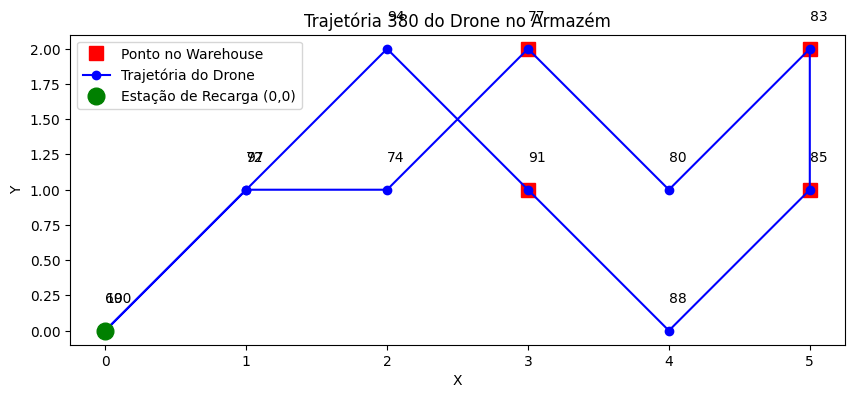


Trajetória 381:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 1), Bateria 91
Passo 4: Posição (4, 2), Bateria 88
Passo 5: Posição (5, 1), Bateria 85
Passo 6: Posição (5, 2), Bateria 83
Passo 7: Posição (4, 1), Bateria 80
Passo 8: Posição (3, 2), Bateria 77
Passo 9: Posição (2, 1), Bateria 74
Passo 10: Posição (1, 1), Bateria 72
Passo 11: Posição (0, 0), Bateria 69


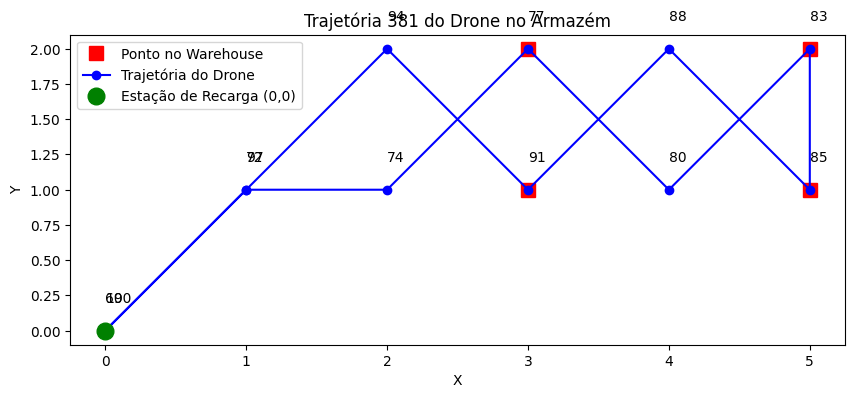


Trajetória 382:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 1), Bateria 91
Passo 4: Posição (4, 2), Bateria 88
Passo 5: Posição (5, 1), Bateria 85
Passo 6: Posição (5, 2), Bateria 83
Passo 7: Posição (4, 3), Bateria 80
Passo 8: Posição (3, 2), Bateria 77
Passo 9: Posição (2, 1), Bateria 74
Passo 10: Posição (1, 1), Bateria 72
Passo 11: Posição (0, 0), Bateria 69


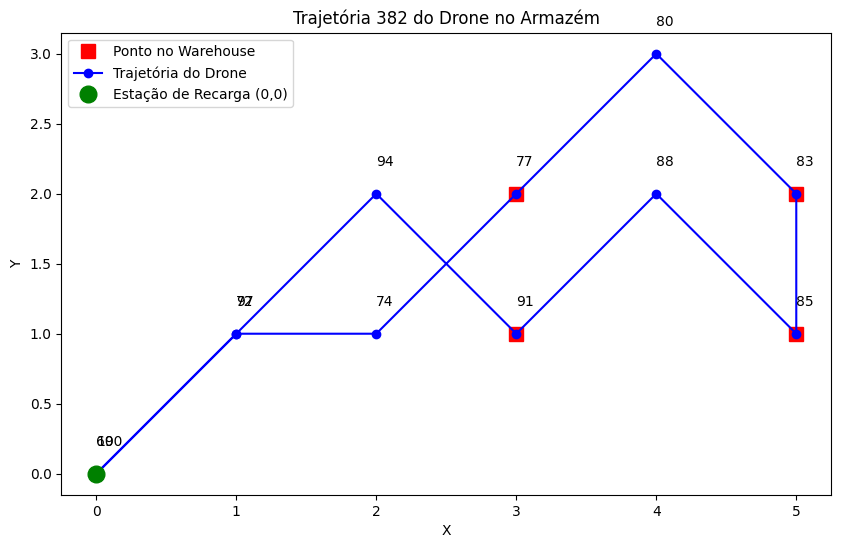


Trajetória 383:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 0), Bateria 94
Passo 3: Posição (3, 1), Bateria 91
Passo 4: Posição (4, 0), Bateria 88
Passo 5: Posição (5, 1), Bateria 85
Passo 6: Posição (5, 2), Bateria 83
Passo 7: Posição (4, 3), Bateria 80
Passo 8: Posição (3, 2), Bateria 77
Passo 9: Posição (2, 1), Bateria 74
Passo 10: Posição (1, 1), Bateria 72
Passo 11: Posição (0, 0), Bateria 69


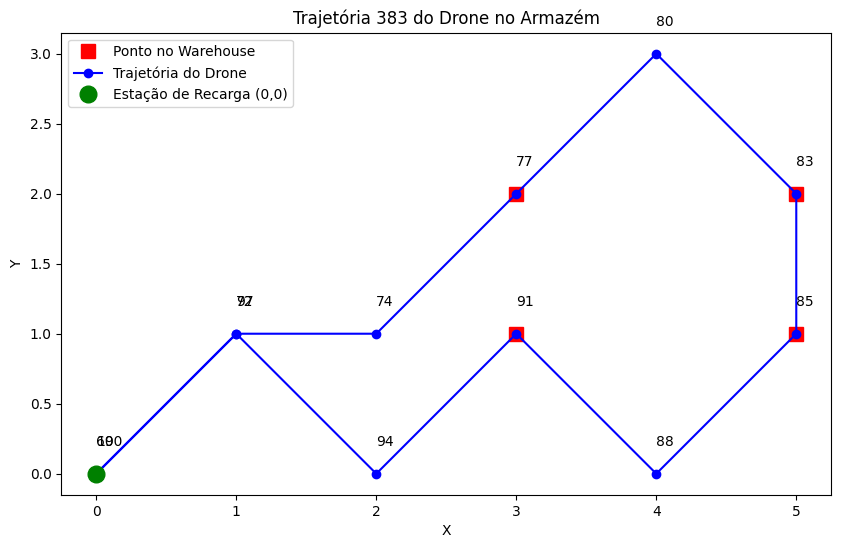


Trajetória 384:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 0), Bateria 94
Passo 3: Posição (3, 1), Bateria 91
Passo 4: Posição (4, 0), Bateria 88
Passo 5: Posição (5, 1), Bateria 85
Passo 6: Posição (5, 2), Bateria 83
Passo 7: Posição (4, 1), Bateria 80
Passo 8: Posição (3, 2), Bateria 77
Passo 9: Posição (2, 1), Bateria 74
Passo 10: Posição (1, 1), Bateria 72
Passo 11: Posição (0, 0), Bateria 69


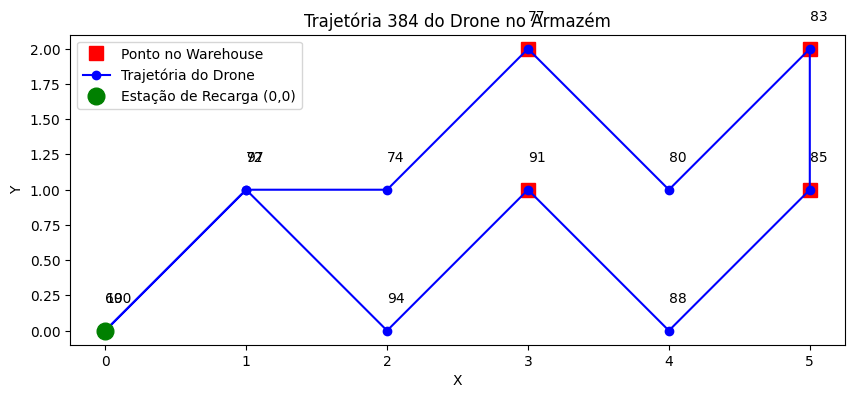


Trajetória 385:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 0), Bateria 94
Passo 3: Posição (3, 1), Bateria 91
Passo 4: Posição (4, 2), Bateria 88
Passo 5: Posição (5, 1), Bateria 85
Passo 6: Posição (5, 2), Bateria 83
Passo 7: Posição (4, 3), Bateria 80
Passo 8: Posição (3, 2), Bateria 77
Passo 9: Posição (2, 1), Bateria 74
Passo 10: Posição (1, 1), Bateria 72
Passo 11: Posição (0, 0), Bateria 69


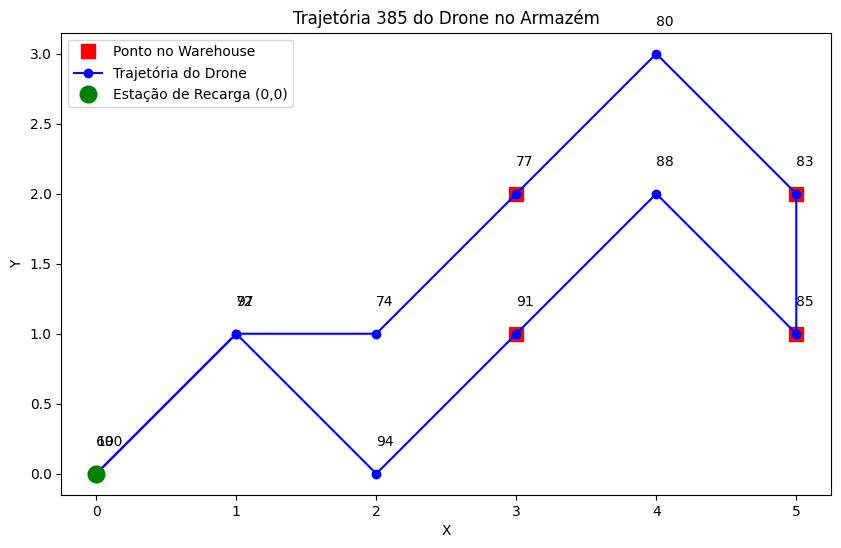


Trajetória 386:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 0), Bateria 94
Passo 3: Posição (3, 1), Bateria 91
Passo 4: Posição (4, 2), Bateria 88
Passo 5: Posição (5, 1), Bateria 85
Passo 6: Posição (5, 2), Bateria 83
Passo 7: Posição (4, 1), Bateria 80
Passo 8: Posição (3, 2), Bateria 77
Passo 9: Posição (2, 1), Bateria 74
Passo 10: Posição (1, 1), Bateria 72
Passo 11: Posição (0, 0), Bateria 69


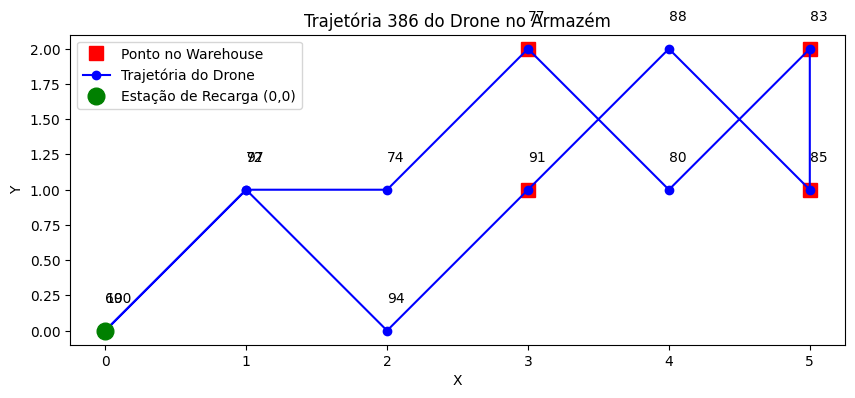


Trajetória 387:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 0), Bateria 94
Passo 3: Posição (3, 1), Bateria 91
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 3), Bateria 82
Passo 8: Posição (3, 2), Bateria 79
Passo 9: Posição (2, 1), Bateria 76
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


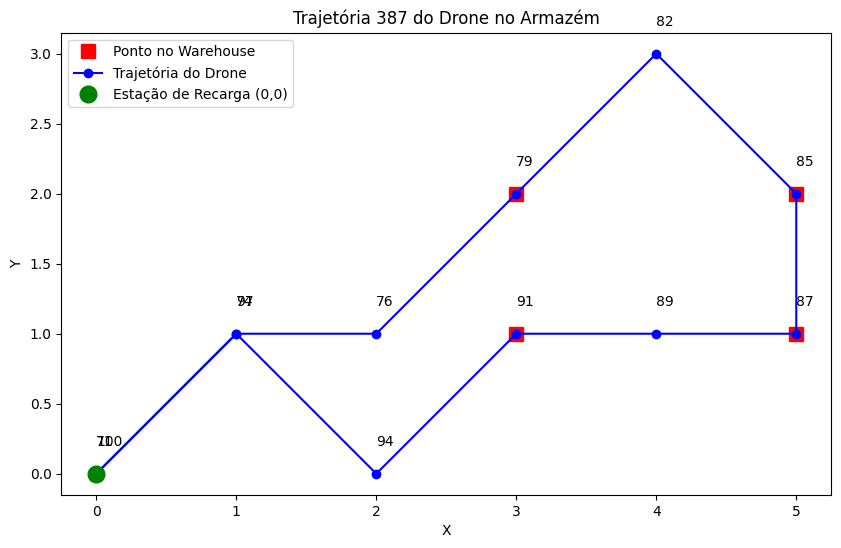


Trajetória 388:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 0), Bateria 94
Passo 3: Posição (3, 1), Bateria 91
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 2), Bateria 79
Passo 9: Posição (2, 1), Bateria 76
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


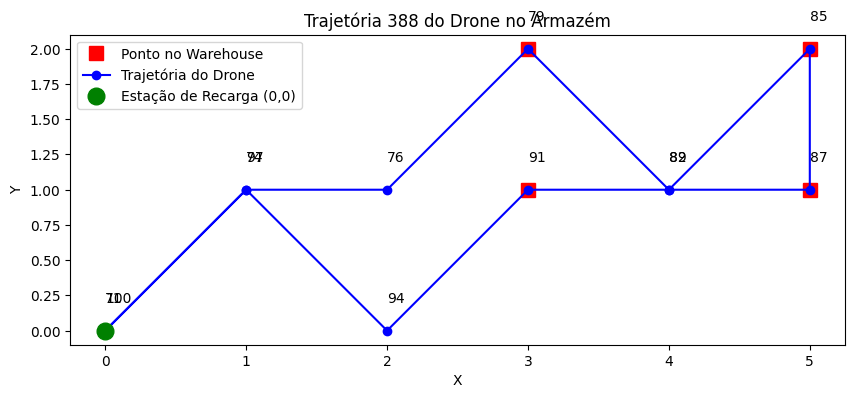


Trajetória 389:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 1), Bateria 91
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 3), Bateria 82
Passo 8: Posição (3, 2), Bateria 79
Passo 9: Posição (2, 1), Bateria 76
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


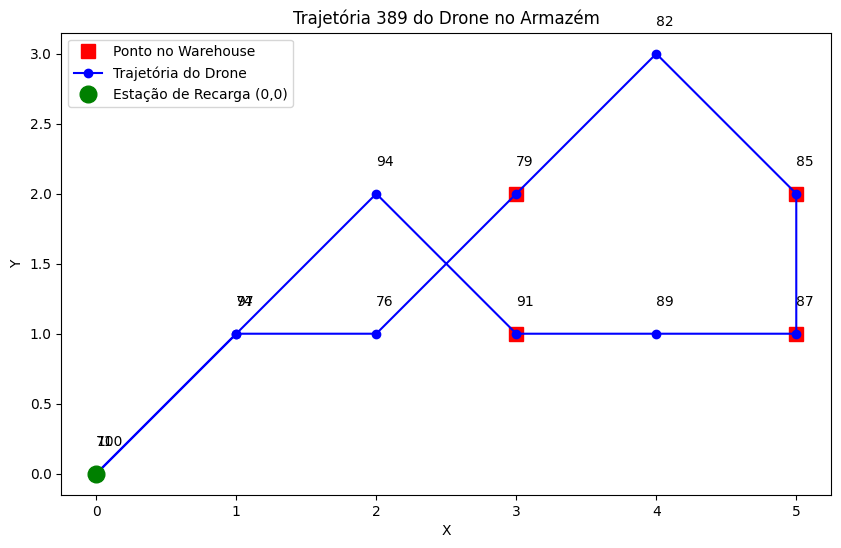


Trajetória 390:
Passo 0: Posição (0, 0), Bateria 100
Passo 1: Posição (1, 1), Bateria 97
Passo 2: Posição (2, 2), Bateria 94
Passo 3: Posição (3, 1), Bateria 91
Passo 4: Posição (4, 1), Bateria 89
Passo 5: Posição (5, 1), Bateria 87
Passo 6: Posição (5, 2), Bateria 85
Passo 7: Posição (4, 1), Bateria 82
Passo 8: Posição (3, 2), Bateria 79
Passo 9: Posição (2, 1), Bateria 76
Passo 10: Posição (1, 1), Bateria 74
Passo 11: Posição (0, 0), Bateria 71


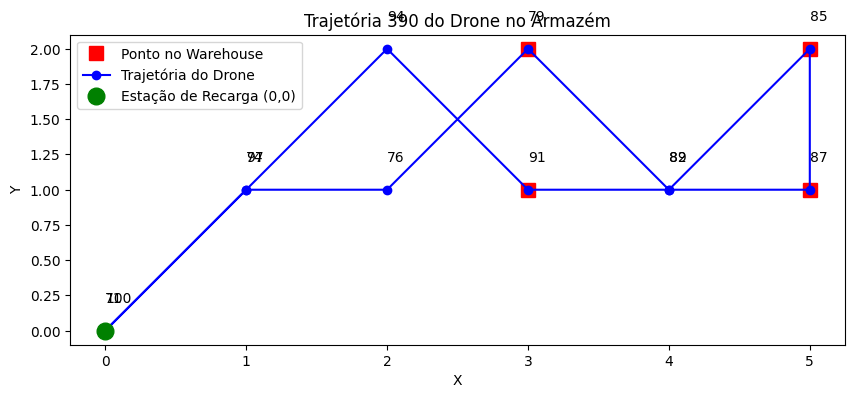

In [7]:
from z3 import *  # Importa todas as funções, classes e objetos do módulo Z3, que é usado para resolver problemas de lógica e restrições
import matplotlib.pyplot as plt  # Importa o módulo pyplot da biblioteca matplotlib para criação e manipulação de gráficos, renomeando-o como 'plt'

def solve_with_min_timesteps(max_timesteps, bmax, gridx, gridy, warehouse):  # Define a função que encontra a solução com o menor número de timesteps possíveis
    for timesteps in range(1, max_timesteps + 1):  # Itera de 1 até max_timesteps, testando progressivamente o número mínimo de timesteps
        s = Solver()  # Cria uma instância do solver Z3 para resolver as restrições definidas

        # Declaração das variáveis para cada timestep
        PGx = [Int(f'pgx_{k}') for k in range(timesteps)]  # Cria uma lista de variáveis inteiras para a posição x do drone em cada timestep (nomes: pgx_0, pgx_1, ..., pgx_(timesteps-1))
        PGy = [Int(f'pgy_{k}') for k in range(timesteps)]  # Cria uma lista de variáveis inteiras para a posição y do drone em cada timestep (nomes: pgy_0, pgy_1, ..., pgy_(timesteps-1))
        Bat = [Int(f'bat_{k}') for k in range(timesteps)]  # Cria uma lista de variáveis inteiras para o nível de bateria do drone em cada timestep (nomes: bat_0, bat_1, ..., bat_(timesteps-1))

        # Restrições de limites para as variáveis
        for b in Bat:  # Para cada variável de bateria na lista Bat
            s.add(And(b >= 1, b <= bmax))  # Adiciona a restrição de que a bateria deve estar entre 1 e bmax (inclusive)
        for x in PGx:  # Para cada variável de posição x na lista PGx
            s.add(And(x >= 0, x <= gridx))  # Adiciona a restrição de que a posição x deve estar entre 0 e gridx (inclusive)
        for y in PGy:  # Para cada variável de posição y na lista PGy
            s.add(And(y >= 0, y <= gridy))  # Adiciona a restrição de que a posição y deve estar entre 0 e gridy (inclusive)

        # Condições iniciais
        s.add(PGx[0] == 0)  # Define que a posição x inicial do drone é 0
        s.add(PGy[0] == 0)  # Define que a posição y inicial do drone é 0
        s.add(Bat[0] == bmax)  # Define que o nível de bateria inicial é igual à capacidade máxima bmax

        # Restrições de movimento e consumo de bateria
        for k in range(1, timesteps):  # Para cada timestep a partir do segundo (índice 1) até o último
            s.add(Or(PGx[k] == PGx[k-1] + 1, PGx[k] == PGx[k-1] - 1, PGx[k] == PGx[k-1]))  # Restringe o movimento em x: o drone pode mover uma unidade para a direita, para a esquerda ou permanecer no mesmo lugar
            s.add(Or(PGy[k] == PGy[k-1] + 1, PGy[k] == PGy[k-1] - 1, PGy[k] == PGy[k-1]))  # Restringe o movimento em y: o drone pode mover uma unidade para cima, para baixo ou permanecer no mesmo lugar
            
            # Impede que o drone permaneça na mesma posição
            s.add(Not(And(PGx[k] == PGx[k-1], PGy[k] == PGy[k-1])))  # Adiciona a restrição de que o drone não pode ficar parado (nenhuma mudança em x e y)

            s.add(If(  # Adiciona uma expressão condicional para determinar o consumo de bateria baseado no tipo de movimento do drone
                Or(  # Verifica se o movimento é diagonal, ou seja, ambas as coordenadas são alteradas simultaneamente
                    And(PGx[k] == PGx[k-1] + 1, PGy[k] == PGy[k-1] + 1),  # Movimento diagonal: para cima à direita
                    And(PGx[k] == PGx[k-1] - 1, PGy[k] == PGy[k-1] - 1),  # Movimento diagonal: para baixo à esquerda
                    And(PGx[k] == PGx[k-1] + 1, PGy[k] == PGy[k-1] - 1),  # Movimento diagonal: para baixo à direita
                    And(PGx[k] == PGx[k-1] - 1, PGy[k] == PGy[k-1] + 1)   # Movimento diagonal: para cima à esquerda
                ),  # Fim da condição do primeiro If
                Bat[k] == Bat[k-1] - 3,  # Se a condição for verdadeira (movimento diagonal), o consumo de bateria é de 3 unidades
                If(  # Se o movimento não for diagonal, verifica outra condição usando um If aninhado
                    Or(  # Verifica se o movimento é horizontal ou vertical
                        And(PGx[k] == PGx[k-1] + 1, PGy[k] == PGy[k-1]),  # Movimento horizontal: para a direita
                        And(PGx[k] == PGx[k-1] - 1, PGy[k] == PGy[k-1]),  # Movimento horizontal: para a esquerda
                        And(PGx[k] == PGx[k-1], PGy[k] == PGy[k-1] - 1),  # Movimento vertical: para baixo
                        And(PGx[k] == PGx[k-1], PGy[k] == PGy[k-1] + 1)   # Movimento vertical: para cima
                    ),  # Fim da condição do segundo If
                    Bat[k] == Bat[k-1] - 2,  # Se o movimento for horizontal ou vertical, o consumo de bateria é de 2 unidades
                    Bat[k] == Bat[k-1]  # Se nenhuma das condições for satisfeita, a bateria não é consumida (permanece igual)
                )  # Fim do If aninhado que verifica movimento horizontal ou vertical
            ))  # Fim do If principal que determina o consumo de bateria
            # A função If do Z3 funciona como uma expressão ternária: avalia a condição; se verdadeira, retorna o segundo argumento, caso contrário, retorna o terceiro argumento

        # Cada ponto no warehouse deve ser visitado em algum timestep
        for (x, y) in warehouse:  # Para cada coordenada (x, y) definida no conjunto 'warehouse'
            s.add(Or([And(PGx[k] == x, PGy[k] == y) for k in range(timesteps)]))  # Adiciona a restrição de que, para cada ponto do warehouse, deve existir pelo menos um timestep em que o drone esteja nessa posição

        # Adicionando restrição para que, no último timestep, o drone retorne ao ponto inicial (0,0)
        s.add(PGx[timesteps - 1] == 0)  # Define que a posição x do drone no último timestep deve ser 0 (retorno ao ponto inicial)
        s.add(PGy[timesteps - 1] == 0)  # Define que a posição y do drone no último timestep deve ser 0 (retorno ao ponto inicial)

        if s.check() == sat:  # Verifica se as restrições definidas são satisfatíveis para o número atual de timesteps
            print("Solução encontrada com", timesteps, "timesteps mínimos.")  # Informa que uma solução foi encontrada com o número atual mínimo de timesteps
            # Enumerando todas as trajetórias possíveis para o número mínimo de timesteps
            modelos = []  # Inicializa uma lista para armazenar todos os modelos (soluções) encontrados
            while s.check() == sat:  # Enquanto o solver continuar encontrando soluções satisfatórias
                m = s.model()  # Obtém o modelo (solução) atual
                modelos.append(m)  # Adiciona o modelo encontrado à lista de modelos
                # Bloqueia o modelo atual para que ele não seja encontrado novamente
                bloqueio = []  # Inicializa uma lista para armazenar as restrições que bloqueiam o modelo atual
                for var in PGx + PGy + Bat:  # Itera sobre todas as variáveis (posição x, posição y e bateria)
                    bloqueio.append(var == m[var])  # Adiciona a restrição de que a variável deve ter o valor obtido no modelo atual
                s.add(Not(And(bloqueio)))  # Adiciona ao solver a restrição de que a combinação atual de valores não pode ser repetida
            return modelos, timesteps, PGx, PGy, Bat  # Retorna a lista de modelos encontrados, o número de timesteps e as listas de variáveis

    print("Nenhuma solução encontrada até", max_timesteps, "timesteps.")  # Se nenhuma solução for encontrada até o máximo de timesteps, imprime uma mensagem informando isso
    return None, None, None, None, None  # Retorna None para todos os valores, indicando que não há solução

# Parâmetros do problema
max_timesteps = 100  # Define o limite superior para a busca de timesteps (número máximo de passos a serem testados)
bmax = 100  # Define a bateria máxima do drone
gridx = 9  # Define o limite máximo da grade na direção x
gridy = 10  # Define o limite máximo da grade na direção y

# Resolver o problema e obter os modelos e o número de timesteps mínimo
modelos, timesteps, PGx, PGy, Bat = solve_with_min_timesteps(max_timesteps, bmax, gridx, gridy, warehouse)  # Chama a função de resolução passando os parâmetros e o conjunto 'warehouse'

if modelos:  # Verifica se algum modelo (solução) foi encontrado
    print("\nNúmero de trajetórias encontradas:", len(modelos))  # Imprime o número de trajetórias (modelos) encontradas
    for idx, model in enumerate(modelos):  # Itera sobre cada modelo encontrado, com índice para identificação
        pgx_values = [model.evaluate(PGx[k]).as_long() for k in range(timesteps)]  # Extrai e converte para inteiro os valores das variáveis de posição x do modelo atual
        pgy_values = [model.evaluate(PGy[k]).as_long() for k in range(timesteps)]  # Extrai e converte para inteiro os valores das variáveis de posição y do modelo atual
        bat_values = [model.evaluate(Bat[k]).as_long() for k in range(timesteps)]  # Extrai e converte para inteiro os valores das variáveis de bateria do modelo atual
        
        print(f"\nTrajetória {idx + 1}:")  # Imprime o cabeçalho para a trajetória atual, numerando-a
        for t in range(timesteps):  # Para cada timestep na trajetória atual
            print(f"Passo {t}: Posição ({pgx_values[t]}, {pgy_values[t]}), Bateria {bat_values[t]}")  # Imprime o passo, a posição (x, y) e o nível de bateria do drone

        # Visualização da trajetória
        fig, ax = plt.subplots(figsize=(10, 6))  # Cria uma figura e um conjunto de eixos para plotar o gráfico, com tamanho definido
        # Plotando os pontos do warehouse
        for i, (x, y) in enumerate(warehouse):  # Itera sobre cada ponto do warehouse, com índice
            if i == 0:  # Se for o primeiro ponto do warehouse
                ax.plot(x, y, 'rs', markersize=10, label="Ponto no Warehouse")  # Plota o primeiro ponto com marcador vermelho quadrado e adiciona um label
            else:  # Para os demais pontos do warehouse
                ax.plot(x, y, 'rs', markersize=10)  # Plota os demais pontos com marcador vermelho quadrado, sem label
        # Plotando a trajetória do drone
        ax.plot(pgx_values, pgy_values, 'b-o', label="Trajetória do Drone")  # Plota a trajetória do drone conectando os pontos com uma linha azul e marcadores circulares, com label
        ax.plot(0, 0, 'go', markersize=12, label="Estação de Recarga (0,0)")  # Plota o ponto inicial (estação de recarga) com marcador verde e adiciona um label
        # Adicionando a quantidade de bateria ao lado de cada ponto da trajetória
        for t in range(timesteps):  # Itera sobre cada timestep para adicionar a anotação do nível de bateria
            ax.text(pgx_values[t], pgy_values[t] + 0.2, f'{bat_values[t]}', fontsize=10)  # Adiciona um texto próximo a cada ponto mostrando o valor da bateria
        plt.xlabel("X")  # Define o rótulo do eixo x do gráfico
        plt.ylabel("Y")  # Define o rótulo do eixo y do gráfico
        plt.title(f"Trajetória {idx + 1} do Drone no Armazém")  # Define o título do gráfico, indicando o número da trajetória
        plt.legend()  # Exibe a legenda no gráfico para identificar os elementos plotados
        ax.set_aspect('equal')  # Ajusta a proporção dos eixos para que a escala em x e y seja igual
        plt.show()  # Exibe o gráfico com a trajetória do drone
else:  # Caso nenhum modelo (solução) tenha sido encontrado
    print("Nenhuma solução encontrada.")  # Imprime uma mensagem informando que não foi encontrada nenhuma solução
